# Notes

Following meeting with Yin-Zhe and Celeste on 28/06/22, we questioned why DM does not evolve more dramatically with redshift.
This notebook will create a plot of ne vs redshift for the entire TNG300-1 simulation to help investigate this.

It is based on previous work in Paper_Plots_Structure_Analysis.ipynb and Illustris_FRB_Project/TNG_density_vs_theory_2.ipynb

# Imports

In [1]:
import os
import yt
import sys
import h5py
import trident
import matplotlib

import numpy as np
import illustris_python as il
from frb.dm import igm

import matplotlib.patches as mpatches
from trident import LightRay
from artale_constants import *
from matplotlib.colors import LogNorm
from yt.utilities.cosmology import Cosmology
from charlie_TNG_lib.charlie_TNG_tools import temp2u

from astropy import units as u
from astropy import constants as c
from matplotlib import pyplot as plt
from yt.visualization.fixed_resolution import FixedResolutionBuffer as FRB


from astropy.cosmology import Planck15 as cosmosource


#matplotlib.use('Agg')

#from matplotlib import pyplot as plt

/raven/u/cwalker/virtual_environments/yt-git/yt/utilities/logger.py:4: VisibleDeprecationWarning: The configuration file /u/cwalker/.config/yt/ytrc is deprecated in favor of /u/cwalker/.config/yt/yt.toml. Currently, both are present. Please manually remove the deprecated one to silence this warning.
Deprecated since v4.0.0 . This feature will be removed in v4.1.0
  from yt.config import ytcfg


In [2]:
print((1*(u.km/u.s)**2).value)

1.0


# Functions

In [3]:
def getField(snapFile,partType,fieldName,toDouble=False):
        if toDouble==False:
                return snapFile[partType][fieldName][:]
        if toDouble==True:
                return snapFile[partType][fieldName][:].astype('f8')


def gadgetDens2SI(dens):
        return dens*1E10*Msol_si/hubble/(kpc_si/hubble)**3

In [4]:
def get_w(density,sfr,ie,ea):

    """
    Function which creates warm gas mass fractions for simulation cells
    
    Code is based on the yt custom field function:
    
    _w_frac(field,data)
    
    from:
    
    TNG_density_vs_theory_2.ipynb
    
    Inputs:
    
    density : [array] density values  (in either code units or gcm**-3 , I'm not sure yet???)
    sfr     : [array] star formation rates (in either code units or g/s , I'm not sure yet???)
    ie      : [array] internal energies (in either code units or erg/g , I'm not sure yet???)
    ea      : [array] electron abundances 
    
    Returns
    
    
    w_frac      : [array] the corresponding warm gas mass fractions.
    
    
    """

    ##################
    #define constants#
    ##################
    
    T_h = 10**7  #hot phase gase temperature [Kelvin] 
    T_c = 10**3  #cold phase gas temperature [Kelvin]
    x_h = 0.75   #Hydrogen mass fraction
    h   = 0.6774 #dimensionless hubble value
    
    ##########################################################################
    #apply correctly assigned units (still need to figure out what these are)#
    ##########################################################################
        
    ie*=(u.km/u.s)**2 #apply code units (km/s)**2
    
    ####################
    #define proton mass#
    ####################
    
    #original version
    #m_p = ds.quan((c.m_p).to(u.solMass).value,'Msun') #proton mass [Msun] 
    #modified version
    m_p = (c.m_p).to(u.solMass).value #proton mass [Msun] 

    ###########################################################
    #calculate x and w, cold and warm phase gas mass fractions#
    ###########################################################
    
    #original version
    #x_frac = (temp2u(T_h,ea.v)-ie.in_units('(km/s)**2').v)/(temp2u(T_h,ea.v)-temp2u(T_c,ea.v)) #cold phase mass fraction
    #modified version
    x_frac = (temp2u(T_h,ea)-ie.value)/(temp2u(T_h,ea)-temp2u(T_c,ea)) #cold phase mass fraction
    w_frac = 1 - x_frac # warm phase mass fraction
    
    ###########################################
    #only modify electron abundance if sfr = 0#
    ###########################################
    
    #original version
    #w_frac[np.where(sfr.v==0)]=1
    #modified version
    w_frac[np.where(sfr==0)]=1

    
    return w_frac

# Begin

In [5]:
############
#Initialise#
############

#snapshots celeste studied
V1001_dat = np.loadtxt('/u/cwalker/Illustris_FRB_Project/git_Illustris_uploads/mass_fraction_plots/artale_test_121121/MassFraction_VoidsL75n1820TNG.dat',comments='#',skiprows=2) #TNG100-1
celeste_snapshots = V1001_dat[:,0] #snapshot number

#snapshots we will study
snapshots = [99,91,84,78,67,59,50,40,33,25,21,17] 

#simulation we will study
data_id = 'TNG300-1' 
#data_id = 'TNG100-3'

#the wierd code denoting this simulation
data_id_2 = 'L205n2500TNG' #TNG300-1
#data_id_2 = 'L75n455TNG' #TNG100-3

#base path to simulation
simpath = '/virgotng/universe/IllustrisTNG/'

#base path to our simulation output
basepath = simpath+data_id+'/output/'

print('Simulation to study: {0} ({1})\n'.format(data_id,data_id_2))
print('Snapshots to investigate: {0}\n'.format(snapshots))
print('(Note: Artale used the snapshots: {0})\n'.format(celeste_snapshots))
print('Location of data: {0}'.format(basepath))

Simulation to study: TNG300-1 (L205n2500TNG)

Snapshots to investigate: [99, 91, 84, 78, 67, 59, 50, 40, 33, 25, 21, 17]

(Note: Artale used the snapshots: [99. 67. 50. 33. 25. 21. 17. 13. 11.  8.])

Location of data: /virgotng/universe/IllustrisTNG/TNG300-1/output/


# Load one snapshot of TNG data for illustrative binning

In [ ]:
#Load TNG data

#z0_TNG_data='{0}/snapdir_099/snap_099.0.hdf5'.format(basepath)
z0_TNG_data='{0}/snapdir_099/snap_099.0.hdf5'.format('/virgotng/universe/IllustrisTNG/TNG100-3/output/')

z0_TNG_ds=yt.load(z0_TNG_data)
z0_TNG_ds.index



yt : [INFO     ] 2023-03-22 17:20:55,790 Calculating time from 1.000e+00 to be 4.356e+17 seconds
yt : [INFO     ] 2023-03-22 17:20:55,878 Parameters: current_time              = 4.355810528213311e+17 s
yt : [INFO     ] 2023-03-22 17:20:55,880 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2023-03-22 17:20:55,881 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2023-03-22 17:20:55,882 Parameters: domain_right_edge         = [75000. 75000. 75000.]
yt : [INFO     ] 2023-03-22 17:20:55,883 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2023-03-22 17:20:55,884 Parameters: current_redshift          = 2.220446049250313e-16
yt : [INFO     ] 2023-03-22 17:20:55,885 Parameters: omega_lambda              = 0.6911
yt : [INFO     ] 2023-03-22 17:20:55,886 Parameters: omega_matter              = 0.3089
yt : [INFO     ] 2023-03-22 17:20:55,888 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2023-03-22 17:20:55,889 Parameters: hubble_consta

In [27]:
#extract all data
z0_TNG_ad = z0_TNG_ds.all_data()

#get the coordinates of all baryonic matter particles
z0_TNG_Bcoords = z0_TNG_ad[("PartType0","Coordinates")]

#get the baryonic mass densities
#TNG_Density = TNG_ad[("PartType0","Density")]

#get the baryonic masses
z0_TNG_Mass = z0_TNG_ad[("PartType0","Masses")]

# get the subfindDMDensities
z0_TNG_SubDM = z0_TNG_ad[("PartType0","SubfindDMDensity")]
print(z0_TNG_SubDM)

#get the subfindDensity
z0_TNG_Sub = z0_TNG_ad[("PartType0","SubfindDensity")]
print(z0_TNG_Sub)

[1.11098506e-03 3.27121583e-03 1.02324551e-03 ... 7.68346524e-08
 1.13918741e-08 4.61223209e-07] dimensionless
[1.28246774e-03 3.64398304e-03 1.14714028e-03 ... 8.32019538e-08
 1.45094265e-08 5.28491967e-07] dimensionless


In [28]:
z0_co=Cosmology()

z0_grav=z0_TNG_ds.quan(6.6743e-11,'m**3/(kg*s**2)')
z0_H=z0_co.hubble_parameter(0).in_units('km/s/Mpc')
#z0_H=cosmosource.H(0).to('km/s/Mpc') #hubble const at z=0 in km/s/Mpc
print('grav={0}'.format(z0_grav))
print('H0 = {0}'.format(z0_H))

#create the critical density of the universe: note: is my inteerp of H correct?
z0_dens_crit = ((3 * z0_H**2)/(8*np.pi* z0_grav))#.in_units('h**2/(code_length**3/(Msun*s**2))')
print ('critical density is: {0}'.format(z0_dens_crit))
print('critical density in kg/m^3: {0}'.format(z0_dens_crit.in_units('kg/m**3')))

grav=6.6743e-11 m**3/(kg*s**2)
H0 = 71.0 km/(Mpc*s)
critical density is: 9.468720094206941e-27 kg/m**3
critical density in kg/m^3: 9.468720094206941e-27 kg/m**3


In [29]:
#initialise binning

z0_mybins=np.linspace(-3,7,101)
z0_mybins=np.linspace(-3,7,501) #edit 14/06/2022 : more bins to make final plot better

z0_my_mass_sum = np.zeros_like(z0_mybins)

z0_my_checkdata = np.log10(z0_TNG_SubDM*z0_TNG_ds.quan(1e10,"(Msun/h)/((code_length)**3)")/z0_dens_crit)

#sort into bins
z0_bin_indexes=np.digitize(z0_my_checkdata,z0_mybins)

In [30]:
#do the actual binning
for i in range(len(z0_my_checkdata)):
    z0_bin_index=z0_bin_indexes[i]
    z0_my_mass_sum[z0_bin_index]+=z0_TNG_Mass[i].v

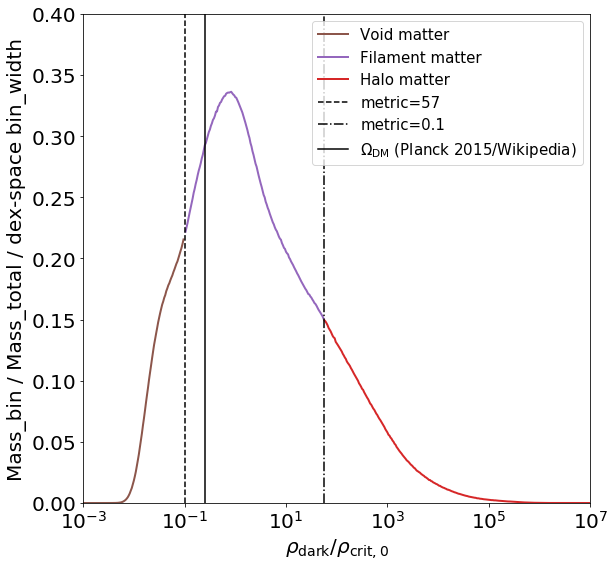

In [31]:
#plot

fig = plt.figure(figsize=(20,9))

ax1=fig.add_subplot(121)
ax1.set_ylabel('Mass_bin / Mass_total / dex-space bin_width',fontsize=20)
ax1.set_xlabel(r'$\rho_{\rm{dark}} / \rho_{\rm{crit,0}}$',fontsize=20)
ax1.set_xscale('log')
ax1.set_xscale('log')
ax1.set_xlim([1e-3,1e7])
ax1.set_ylim([0,0.4])
ax1.tick_params(axis='x', labelsize=20)
ax1.tick_params(axis='y', labelsize=20)

#get the indices of each LSS type so the curve can be coloured differently

z0_voi_inds = (np.where(10**z0_mybins<0.1))
z0_fil_inds = (np.where((10**z0_mybins>0.1) & (10**z0_mybins<57)))
z0_hal_inds = (np.where(10**z0_mybins>57))

#ax1.plot(10**mybins,my_mass_sum/np.sum(my_mass_sum)/(mybins[1]-mybins[0]),label='binned baryonic matter')
ax1.plot(10**z0_mybins[z0_voi_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_voi_inds],color='C5',linewidth=2,label='Void matter')
ax1.plot(10**z0_mybins[z0_fil_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_fil_inds],color='C4',linewidth=2,label='Filament matter')
ax1.plot(10**z0_mybins[z0_hal_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_hal_inds],color='C3',linewidth=2,label='Halo matter')



ax1.axvline(0.1,0,1,linestyle='--',color='k',label='metric=57')
ax1.axvline(57,0,1,linestyle='-.',color='k',label='metric=0.1')
ax1.axvline(0.2589,0,1,color='k',label=r'$\Omega_{\rm{DM}}$ (Planck 2015/Wikipedia)')

ax1.legend(fontsize=15)

plt.tight_layout
plt.show()

# Create prochaska/macquart curves

In [32]:
####################################################
# Create theoretical+empirical frb github DM curves#
####################################################

z_theory=np.linspace(0.01,5,5)


DM_cosm = [igm.average_DM(i) for i in z_theory]
DM_cosm = [i.value for i in DM_cosm]
        
DM_cosmigm = [igm.average_DMIGM(i) for i in z_theory]
DM_cosmigm = [i.value for i in DM_cosmigm]

DM_cosmhalo = [igm.average_DMhalos(i) for i in z_theory]
DM_cosmhalo = [i.value for i in DM_cosmhalo]

In [33]:
##################
#Load Artale data#
##################

H1001_mf=np.load('PaperPlotMFEvolutionDataArtale_y_hal100.npy')
H3001_mf=np.load('PaperPlotMFEvolutionDataArtale_y_hal300.npy')
F1001_mf=np.load('PaperPlotMFEvolutionDataArtale_y_fil100.npy')
F3001_mf=np.load('PaperPlotMFEvolutionDataArtale_y_fil300.npy')
V1001_mf=np.load('PaperPlotMFEvolutionDataArtale_y_voi100.npy')
V3001_mf=np.load('PaperPlotMFEvolutionDataArtale_y_voi300.npy')

In [34]:
#####################################################
#get the redshifts for snapshots processed by artale#
#####################################################

#initialise array to hold redshifts
celeste_redshifts = [] 

for i in range(len(celeste_snapshots)): #loop over snapshots
    
    celeste_snapshot = int(celeste_snapshots[i]) #get snapshot number
    header=il.groupcat.loadHeader(basepath,celeste_snapshot) #load snapshot header
    celeste_redshifts.append(header['Redshift']) #append redshift to array

print('redshifts celeste studied: {0}'.format(celeste_redshifts))

redshifts celeste studied: [2.220446049250313e-16, 0.5030475232448832, 0.9972942257819404, 2.0020281392528516, 3.008131071630377, 4.0079451114652676, 4.995933468164624, 6.0107573988449, 7.005417045544533, 8.012172948865935]


In [35]:
######################
#Original Artale plot#
######################

#get location of all TNG runs
simStrings = os.listdir(simpath) #get all directories
print('All TNG runs: {0}\n'.format(simStrings))

#just do TNG300-1
simStrings = [i for i in simStrings if i==data_id_2] 
print('Simulations we will process: {0}\n'.format(simStrings))

#get number of chunks for each run
simChunks = [len([i for i in os.listdir('{0}/{1}/output/snapdir_099/'.format(simpath,j))]) for j in simStrings]
print('Number of chunks in each of these simulations: {0}\n'.format(simChunks))

#sort both lists to do shortest first
simStrings_sorted = [x for _, x in sorted(zip(simChunks, simStrings))]
simChunks_sorted = sorted(simChunks)
print('Lists sorted to process shortest first: {0}, {1}'.format(simStrings_sorted,simChunks_sorted))


All TNG runs: ['L35n270TNG', 'readme.txt', 'TNG50-4', 'TNG300-2', 'L35n2160TNG_DM', 'TNG300-2-Dark', 'L35n270TNG_DM', 'L75n455TNG_NR', 'L35n540TNG', 'L75n1820TNG_NR', 'L75n455TNG', 'TNG300-1', 'L35n2160TNG', 'L75n910TNG', 'L75n1820TNG_DM', 'TNG100-2-NR', 'TNG100-1', 'TNG50-3-Dark', 'TNG50-4-Dark', 'TNG100-3', 'L75n455TNG_DM', 'L75n910TNG_DM', 'TNG50-3', 'TNG50-2-Dark', 'TNG50-2', 'InitialConditions', 'L75n455TNG_UVB', 'TNG50-1-Dark', 'L205n2500TNG_DM', 'TNG100-2-Dark', 'L75n910TNG_NR', 'TNG100-3-Dark', 'TNG100-1-NR', 'TNG300-3-Dark', 'L205n625TNG', 'L205n1250TNG_DM', 'TNG300-1-Dark', 'L35n1080TNG', 'TNG300-3', 'L35n1080TNG_DM', 'TNG100-2', 'L75n1820TNG', 'L205n2500TNG', 'L205n1250TNG', 'L35n540TNG_DM', 'TNG100-3-NR', 'L205n625TNG_DM', 'TNG100-1-Dark', 'TNG50-1']

Simulations we will process: ['L205n2500TNG']

Number of chunks in each of these simulations: [600]

Lists sorted to process shortest first: ['L205n2500TNG'], [600]


In [36]:
get_w?

In [ ]:
#loop over each simulation to process
for run in range(len(simStrings)):
    
    ##########################
    #simulation-specific data#
    ##########################
    
    #extract simulation code
    simString = simStrings_sorted[run]
    
    #get array for chunks in this simulation
    chunks = np.arange(0,simChunks_sorted[run],1)

    #get path to simulation data
    snapshotPath=simpath+simString+"/output"
    
    ######################################
    #initialise arrays that hold all data#
    ######################################

    #redshift array
    allsnaps_redshifts=[]
    
    #array to hold masses in snapshots (modified by ea and w)
    #plus LSS breakdowns

    allsnaps_masses=[]
    allsnaps_masses_1=[] #the same, but for a modified version of w
    allsnaps_masses_2=[] #the same, but for a modified version of w
    
    
    allsnaps_halo_masses = []
    allsnaps_halo_masses_1 = [] #the same, but for a modified version of w
    allsnaps_halo_masses_2 = [] #the same, but for a modified version of w
    
    allsnaps_fila_masses = []
    allsnaps_fila_masses_1 = [] #the same, but for a modified version of w
    allsnaps_fila_masses_2 = [] #the same, but for a modified version of w
    
    allsnaps_void_masses = []
    allsnaps_void_masses_1 = [] #the same, but for a modified version of w
    allsnaps_void_masses_2 = [] #the same, but for a modified version of w
    
    
    #array to hold conversion factors to turn mass to density
    allsnaps_m2d = []

    #baryon arrays
    #PartType0 (gas)
    allsnaps_tot_PT0_arr = []
    allsnaps_hal_PT0_arr = []
    allsnaps_fil_PT0_arr = []
    allsnaps_voi_PT0_arr = []
    
    #PartType4 (stars)
    allsnaps_tot_PT4_arr = []
    allsnaps_hal_PT4_arr = []
    allsnaps_fil_PT4_arr = []
    allsnaps_voi_PT4_arr = []

    #check arrays
    allsnaps_dens_crit_array = []
    allsnaps_m_p_array = []

    ################################
    #loop over snapshots and chunks#
    ################################

    for i in range(len(snapshots)):

        ######################################################
        #initialise arrays that hold individual snapshot data#
        ######################################################

        #redshift array
        redshifts=[]
        
        #arrays to hold total mass (modified by ea and w) in chunks in this snap,
        #plus LSS breakdowns
        chunk_masses = []
        chunk_masses_1 = [] #the same, but for a modified version of w
        chunk_masses_2 = [] #the same, but for a modified version of w

        chunk_halo_masses = []
        chunk_halo_masses_1 = [] #the same, but for a modified version of w
        chunk_halo_masses_2 = [] #the same, but for a modified version of w

        chunk_fila_masses = []
        chunk_fila_masses_1 = [] #the same, but for a modified version of w
        chunk_fila_masses_2 = [] #the same, but for a modified version of w

        chunk_void_masses = []
        chunk_void_masses_1 = [] #the same, but for a modified version of w
        chunk_void_masses_2 = [] #the same, but for a modified version of w

        chunk_m2d = [] #factors to convert these to densities
        
        #baryon arrays
        #PartType0 (gas)
        tot_PT0_arr = []
        hal_PT0_arr = []
        fil_PT0_arr = []
        voi_PT0_arr = []
        #PartType4 (stars)
        tot_PT4_arr = []
        hal_PT4_arr = []
        fil_PT4_arr = []
        voi_PT4_arr = []

        #check arrays
        dens_crit_array = []
        m_p_array = []

        for j in range(len(chunks)):

            ###########################
            #select snapshot and chunk#
            ###########################

            snapshot = snapshots[i]
            chunk = chunks[j]
            print('processsing snapshot {0:02d}, chunk {1}'.format(snapshot,chunk))

            ######################
            #load snapshot header#
            ######################

            print('loading snapshot {0} header...'.format(snapshot))
            basepath = simpath+simString+'/output/'
            header=il.groupcat.loadHeader(basepath,snapshot)
            print('...snapshot {0} header loaded from {1}.'.format(snapshot,basepath))

            fname = snapshotPath+'/snapdir_'+str(snapshot).zfill(3)+'/'+'snap_'+str(snapshot).zfill(3)+'.'+str(j)+'.hdf5'
            print('Chunk file name: {0}'.format(fname))

            snapFile = h5py.File(fname,'r')       

            ########################################################
            #extract redshift from header, append to redshift array#
            ########################################################

            redshifts.append(header['Redshift'])

            ############################################
            #calculate critical density of the Universe#
            ############################################

            print('Calculating critical density of the Universe')
            dens_crit = 8.61975454419e-27 #Celeste:extracted from "constant.py"
            hubble = 0.677
            
            #######################################################################
            #Extract baryonic masses and dark matter densities from the simulation#
            #######################################################################
            
            #PartType0 (gas)
            gasMass = getField(snapFile,'PartType0','Masses',toDouble=True)
            DMDens0 = getField(snapFile,'PartType0','SubfindDMDensity',toDouble=True)
            #PartType4 (stars)
            stellarMass = getField(snapFile,'PartType4','Masses',toDouble=True)
            DMDens4 = getField(snapFile,'PartType4','SubfindDMDensity',toDouble=True)
            
            ###############################################
            #also extract electron densitiy-related fields#
            ###############################################

            #PartType0 (gas)
            ea0 = getField(snapFile,'PartType0','ElectronAbundance',toDouble=True) #electron abundance
            dens0 = getField(snapFile,'PartType0','Density',toDouble=True) #density
            sfr0 = getField(snapFile,'PartType0','StarFormationRate',toDouble=True) #star formation rate
            ie0 = getField(snapFile,'PartType0','InternalEnergy',toDouble=True) #internal energy
            
            
            print('Shape of fields: {0} {1} {2} {3}'.format(ea0.shape,dens0.shape,sfr0.shape,ie0.shape))
            
            ########################################################
            #Create mask of where star formation rate is/isn't zero#
            ########################################################
            
            sfmask = (sfr0>0)
            sfmask2 = (sfr0==0)
            #sfmask = (sfr0==0)

            print('star forming mask: {0}'.format(sfmask))
            print('Star forming rate is >0 at indices: {0}\n and = 0 at indices: {1}'.format(np.where(sfmask==True),np.where(sfmask==False)))
   

            #################
            #Create w values#
            #################
            
            w0 = np.ones_like(ea0) #placeholder value initialied with all ones
            print(w0.sum())
            
            
            #w value if you leave star forming cells unmodified
            w0_unmodified = np.copy(w0)
            w0_unmodified[sfmask] = 1 #basically replaces ones with ones
            
            #w value if you do not account for star forming cells (this is what zhang et al does)
            w0_zhang = np.copy(w0)
            w0_zhang[sfmask] = 0 #basically makes electron abundance zero in star forming regions when multiplied
            
            #w value if you modify according to pakmor equation
            w0_pakmor = get_w(dens0,sfr0,ie0,ea0)
                        
            #choose desired w value type (currently left unmodified)
            w0 = np.copy(w0_unmodified)
            w1 = np.copy(w0_pakmor)
            w2 = np.copy(w0_zhang)
            
            print('Check to see if w modifications differ from each other...')
            print('w0=w1: {0}'.format((w0==w1).all()))
            print('w0=w2: {0}'.format((w0==w2).all()))
            print('w1=w2: {0}'.format((w1==w2).all()))
            
            #w0 = 
            
            print(w0.sum())
            
            #######################################
            #Apply w values to electron abundances#
            #######################################
            
            modified_ea0 = ea0*w0 #unmodified
            modified_ea1 = ea0*w1 #pakmor
            modified_ea2 = ea0*w2 #zhang
            
            #############################################################
            #Get total mass in snap chunk modified by electron abundance#
            #############################################################
            
            modified_mass0 = gasMass * modified_ea0 #unmodified [code units]
            modified_mass1 = gasMass * modified_ea1 #pakmor [code units]
            modified_mass2 = gasMass * modified_ea2 #zhang [code units]

            total_mod_mass0 = np.sum(modified_mass0) #unmodified [code units]
            total_mod_mass1 = np.sum(modified_mass1) #pakmor [code units]
            total_mod_mass2 = np.sum(modified_mass2) #zhang [code units]

            print('the total mass in the snapshot chunk (modified by ea and w) is {0} in code units'.format(total_mod_mass0))
            
            #append this to array for chunk masses
            chunk_masses.append(total_mod_mass0) #unmodified
            chunk_masses_1.append(total_mod_mass1) #pakmor
            chunk_masses_2.append(total_mod_mass2) #zhang


            
            ########################################################
            #get conversion factor to convert the mass to a density#
            ########################################################
            
            snap_boxsize = header['BoxSize'] #length of the box in ckpc/h
            snap_redshift = header['Redshift'] #redshift of the snapshot
            snap_scale_factor = 1./(1+header['Redshift']) #scale factor of the snapshot
            sim_h = 0.673 #reduced hubble constant
            
            print('Snapshot {0}: box size = {0}, redshift = {1}, scale factor = {2}'.format(snap_boxsize,
                                                                                            snap_redshift,
                                                                                            snap_scale_factor)) 
            #Factor which converts mass to density (mass/volume)
            mass2dens_factor = (1e10*u.Msun/sim_h)*(snap_boxsize*u.kpc*snap_scale_factor/sim_h)**-3 / ((1.*u.g)/(u.cm**3))
            print('The conversion factor for this snap: {0}'.format(mass2dens_factor))
            
            #append to array for chunk mass to density factors
            chunk_m2d.append(mass2dens_factor)
            
            ##########################################################
            #convert dark matter density to units of critical density#
            ##########################################################

            #PartType0 (gas)
            DMDens0 = gadgetDens2SI(DMDens0)/dens_crit
            #PartType4 (stars)
            DMDens4 = gadgetDens2SI(DMDens4)/dens_crit 
            
            ###############################################################
            #create Large-Scale Structure (LSS) masks for each matter type#
            ###############################################################

            mask0 = np.logical_and(DMDens0 >= 1E-11, DMDens0 < 1)
            mask4 = np.logical_and(DMDens4 >= 1E-11, DMDens4 < 1)
            print("Check something outside", len(DMDens4[mask4]), len(DMDens0[mask0]))

            #PartType0 (gas)
            voi_mask_PT0 = DMDens0 < 0.1
            fil_mask_PT0 = np.logical_and(DMDens0 >= 0.1, DMDens0 < 57)#CELESTE:CORRECTED
            hal_mask_PT0 = DMDens0 >= 57 
            #PartType4 (stars)
            voi_mask_PT4 = DMDens4 < 0.1
            fil_mask_PT4 = np.logical_and(DMDens4 >= 0.1, DMDens4 < 57)#CELESTE:CORRECTED
            hal_mask_PT4 = DMDens4 >= 57

            ##########################################################
            #calculate mass in each LSS for each baryonic matter type#
            ##########################################################

            #PartType0 (gas)
            tot_PT0 = np.sum(gasMass) 
            hal_PT0 = np.sum(gasMass[hal_mask_PT0])
            fil_PT0 = np.sum(gasMass[fil_mask_PT0])
            voi_PT0 = np.sum(gasMass[voi_mask_PT0])
            #PartType4 (stars)
            tot_PT4 = np.sum(stellarMass)
            hal_PT4 = np.sum(stellarMass[hal_mask_PT4])
            fil_PT4 = np.sum(stellarMass[fil_mask_PT4])
            voi_PT4 = np.sum(stellarMass[voi_mask_PT4])
            
            ##################################################################
            #calculate total mass in each LSS type for electron density calcs#
            ##################################################################
            
            chunk_halo_masses.append(np.sum((gasMass*ea0*w0)[hal_mask_PT0])) #unmodified [code units]
            chunk_halo_masses_1.append(np.sum((gasMass*ea0*w1)[hal_mask_PT0])) #pakmor [code units]
            chunk_halo_masses_2.append(np.sum((gasMass*ea0*w2)[hal_mask_PT0])) #zhang [code units]

            chunk_fila_masses.append(np.sum((gasMass*ea0*w0)[fil_mask_PT0])) #unmodified [code units]
            chunk_fila_masses_1.append(np.sum((gasMass*ea0*w1)[fil_mask_PT0])) #pakmor [code units]
            chunk_fila_masses_2.append(np.sum((gasMass*ea0*w2)[fil_mask_PT0])) #zhang

            chunk_void_masses.append(np.sum((gasMass*ea0*w0)[voi_mask_PT0])) #unmodified [code units]
            chunk_void_masses_1.append(np.sum((gasMass*ea0*w1)[voi_mask_PT0])) #pakmor [code units]
            chunk_void_masses_2.append(np.sum((gasMass*ea0*w2)[voi_mask_PT0])) #zhang [code units]
            
            

            ##########################
            #append results to arrays#
            ##########################

            #PartType0 (gas)
            tot_PT0_arr.append(tot_PT0)
            hal_PT0_arr.append(hal_PT0)
            fil_PT0_arr.append(fil_PT0) 
            voi_PT0_arr.append(voi_PT0) 
            #PartType4 (gas)
            tot_PT4_arr.append(tot_PT4)
            hal_PT4_arr.append(hal_PT4)
            fil_PT4_arr.append(fil_PT4) 
            voi_PT4_arr.append(voi_PT4)

        ######################################################    
        #append all results for a snapshot to the final array#
        ######################################################

        #PartType0 (gas)
        allsnaps_tot_PT0_arr.append(tot_PT0_arr)
        allsnaps_hal_PT0_arr.append(hal_PT0_arr)
        allsnaps_fil_PT0_arr.append(fil_PT0_arr) 
        allsnaps_voi_PT0_arr.append(voi_PT0_arr) 
        #PartType4 (gas)
        allsnaps_tot_PT4_arr.append(tot_PT4_arr)
        allsnaps_hal_PT4_arr.append(hal_PT4_arr)
        allsnaps_fil_PT4_arr.append(fil_PT4_arr) 
        allsnaps_voi_PT4_arr.append(voi_PT4_arr)    

        allsnaps_m_p_array.append(m_p_array)
        allsnaps_dens_crit_array.append(dens_crit_array)
        allsnaps_redshifts.append(redshifts)


        print('filled baryon arrays')
        
        #######################################################################
        #append mass in chunks (and conversion to dens factors) to final array#
        #######################################################################
        
        allsnaps_masses.append(chunk_masses) #unmodified
        allsnaps_masses_1.append(chunk_masses_1) #pakmor
        allsnaps_masses_2.append(chunk_masses_2) #zhang
        
        
        allsnaps_m2d.append(chunk_m2d)
        
        allsnaps_halo_masses.append(chunk_halo_masses) #unmodified
        allsnaps_halo_masses_1.append(chunk_halo_masses_1) #pakmor
        allsnaps_halo_masses_2.append(chunk_halo_masses_2) #zhang

        allsnaps_fila_masses.append(chunk_fila_masses) #unmodified
        allsnaps_fila_masses_1.append(chunk_fila_masses_1) #pakmor
        allsnaps_fila_masses_2.append(chunk_fila_masses_2) #zhang

        allsnaps_void_masses.append(chunk_void_masses) #unmodified
        allsnaps_void_masses_1.append(chunk_void_masses_1) #pakmor
        allsnaps_void_masses_2.append(chunk_void_masses_2) #zhang


    #########################
    #convert to numpy arrays#
    #########################

    allsnaps_tot_PT0_arr = np.array(allsnaps_tot_PT0_arr)
    allsnaps_hal_PT0_arr = np.array(allsnaps_hal_PT0_arr)
    allsnaps_fil_PT0_arr = np.array(allsnaps_fil_PT0_arr)
    allsnaps_voi_PT0_arr = np.array(allsnaps_voi_PT0_arr)

    allsnaps_tot_PT4_arr = np.array(allsnaps_tot_PT4_arr)
    allsnaps_hal_PT4_arr = np.array(allsnaps_hal_PT4_arr)
    allsnaps_fil_PT4_arr = np.array(allsnaps_fil_PT4_arr)
    allsnaps_voi_PT4_arr = np.array(allsnaps_voi_PT4_arr)

    allsnaps_redshifts = np.array(allsnaps_redshifts)
    allsnaps_m_p_array = np.array(allsnaps_m_p_array)
    allsnaps_dens_crit_array = np.array(allsnaps_dens_crit_array)
    
    allsnaps_masses=np.array(allsnaps_masses) #unmodified
    allsnaps_masses_1=np.array(allsnaps_masses_1) #pakmor
    allsnaps_masses_2=np.array(allsnaps_masses_2) #zhang

    allsnaps_m2d=np.array(allsnaps_m2d)
    
    allsnaps_halo_masses = np.array(allsnaps_halo_masses) #unmodified
    allsnaps_halo_masses_1 = np.array(allsnaps_halo_masses_1) #pakmor
    allsnaps_halo_masses_2 = np.array(allsnaps_halo_masses_2) #zhang

    allsnaps_fila_masses = np.array(allsnaps_fila_masses) #unmodified
    allsnaps_fila_masses_1 = np.array(allsnaps_fila_masses_1) #pakmor
    allsnaps_fila_masses_2 = np.array(allsnaps_fila_masses_2) #zhang
    
    allsnaps_void_masses = np.array(allsnaps_void_masses) #unmodified
    allsnaps_void_masses_1 = np.array(allsnaps_void_masses_1) #pakmor
    allsnaps_void_masses_2 = np.array(allsnaps_void_masses_2) #zhang
    

    print("critical_density", allsnaps_dens_crit_array)
    
    ###############
    #check lengths#
    ###############

    #print(len(snapshots))
    #print(allsnaps_redshifts.shape)
    #print(allsnaps_m_p_array.shape)
    #print(allsnaps_dens_crit_array.shape)
    #print(allsnaps_hal_PT0_arr.shape)
    #print(allsnaps_fil_PT0_arr.shape)
    #print(allsnaps_voi_PT0_arr.shape)
    #print(allsnaps_hal_PT4_arr.shape)
    #print(allsnaps_fil_PT4_arr.shape)
    #print(allsnaps_voi_PT4_arr.shape)


    #print(allsnaps_tot_PT0_arr.sum(axis=1).shape) #summing chunks for each snapshot
    #print(allsnaps_redshifts.mean(axis=1)) #recovering the redshift for each snapshot


    ##################################################
    #for each of the 13 snapshots, sum the masses in #
    #each of the 7 simulation subchunks to obtain    #
    #the total mass for the entire redshift          #
    ##################################################

    tot_PT0_arr_summed = allsnaps_tot_PT0_arr.sum(axis=1)
    hal_PT0_arr_summed = allsnaps_hal_PT0_arr.sum(axis=1)
    fil_PT0_arr_summed = allsnaps_fil_PT0_arr.sum(axis=1)
    voi_PT0_arr_summed = allsnaps_voi_PT0_arr.sum(axis=1)

    tot_PT4_arr_summed = allsnaps_tot_PT4_arr.sum(axis=1)
    hal_PT4_arr_summed = allsnaps_hal_PT4_arr.sum(axis=1)
    fil_PT4_arr_summed = allsnaps_fil_PT4_arr.sum(axis=1)
    voi_PT4_arr_summed = allsnaps_voi_PT4_arr.sum(axis=1)

    print(allsnaps_hal_PT0_arr.sum(axis=1).shape)
    
    ##########################################################
    #Also do this for the electron-density related mass array#
    ##########################################################
    
    per_snap_total_mass = allsnaps_masses.sum(axis=1) #unmodified
    per_snap_total_mass_1 = allsnaps_masses_1.sum(axis=1) #pakmor
    per_snap_total_mass_2 = allsnaps_masses_2.sum(axis=1) #zhang

    per_snap_halo_mass = allsnaps_halo_masses.sum(axis=1) #unmodified
    per_snap_halo_mass_1 = allsnaps_halo_masses_1.sum(axis=1) #pakmor
    per_snap_halo_mass_2 = allsnaps_halo_masses_2.sum(axis=1) #zhang

    per_snap_fila_mass = allsnaps_fila_masses.sum(axis=1) #unmodified
    per_snap_fila_mass_1 = allsnaps_fila_masses_1.sum(axis=1) #pakmor
    per_snap_fila_mass_2 = allsnaps_fila_masses_2.sum(axis=1) #zhang

    per_snap_void_mass = allsnaps_void_masses.sum(axis=1) #unmodified
    per_snap_void_mass_1 = allsnaps_void_masses_1.sum(axis=1) #pakmor
    per_snap_void_mass_2 = allsnaps_void_masses_2.sum(axis=1) #zhang
    
    
    ##########################################################
    #also pull out one value per snap for m2d, redshift, etc #
    #as they are the same between chunks                     #
    ##########################################################
    
    per_snap_m2d_factor = np.mean(allsnaps_m2d,axis=1) #factor to convert a snapshot's total mass to density
    per_snap_redshift_value = np.mean(allsnaps_redshifts,axis=1) #the redshift of a snapshot
    
    #############################
    #calculate density from mass#
    #############################
    
    per_snap_density = per_snap_total_mass * per_snap_m2d_factor #unmodified. Note: becomes [gram/cc] with m2d
    per_snap_density_1 = per_snap_total_mass_1 * per_snap_m2d_factor #pakmor. Note: becomes [gram/cc] with m2d
    per_snap_density_2 = per_snap_total_mass_2 * per_snap_m2d_factor #zhang. Note: becomes [gram/cc] with m2d
                                                                 
    per_snap_density *= (u.g*u.cm**(-3)) #unmodified. Attach appropriate units
    per_snap_density_1 *= (u.g*u.cm**(-3)) #pakmor. Attach appropriate units
    per_snap_density_2 *= (u.g*u.cm**(-3)) #zhang. Attach appropriate units
    
    per_snap_halo_dens = (per_snap_halo_mass*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #unmodified
    per_snap_halo_dens_1 = (per_snap_halo_mass_1*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #pakmor
    per_snap_halo_dens_2 = (per_snap_halo_mass_2*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #zhang

    per_snap_fila_dens = (per_snap_fila_mass*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #unmodified
    per_snap_fila_dens_1 = (per_snap_fila_mass_1*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #pakmor
    per_snap_fila_dens_2 = (per_snap_fila_mass_2*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #zhang

    per_snap_void_dens = (per_snap_void_mass*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #unmodified
    per_snap_void_dens_1 = (per_snap_void_mass_1*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #pakmor
    per_snap_void_dens_2 = (per_snap_void_mass_2*per_snap_m2d_factor)*(u.g*u.cm**(-3)) #zhang
    
    #note: gonna have to do this for each LSS too
    
    ###################################################
    #convert to electron density                      #
    #according to https://arxiv.org/pdf/2011.14494.pdf#
    ###################################################
    
    
    m_p = (c.m_p) #proton mass
    x_H = 0.75    #Hydrogen mass fraction
    
    per_snap_edens = x_H*per_snap_density/(m_p.to('gram')) #unmodified. Calculate electron densities
    per_snap_edens_1 = x_H*per_snap_density_1/(m_p.to('gram')) #pakmor. Calculate electron densities
    per_snap_edens_2 = x_H*per_snap_density_2/(m_p.to('gram')) #zhang. Calculate electron densities

    per_snap_edens.decompose() #unmodified. decompose to base units
    per_snap_edens_1.decompose() #pakmor. decompose to base units
    per_snap_edens_2.decompose() #zhang. decompose to base units
    
    per_snap_halo_edens = (x_H*per_snap_halo_dens/(m_p.to('gram'))).decompose() #unmodified
    per_snap_halo_edens_1 = (x_H*per_snap_halo_dens_1/(m_p.to('gram'))).decompose() #pakmor
    per_snap_halo_edens_2 = (x_H*per_snap_halo_dens_2/(m_p.to('gram'))).decompose() #zhang

    per_snap_fila_edens = (x_H*per_snap_fila_dens/(m_p.to('gram'))).decompose() #unmodified
    per_snap_fila_edens_1 = (x_H*per_snap_fila_dens_1/(m_p.to('gram'))).decompose() #pakmor
    per_snap_fila_edens_2 = (x_H*per_snap_fila_dens_2/(m_p.to('gram'))).decompose() #zhang

    per_snap_void_edens = (x_H*per_snap_void_dens/(m_p.to('gram'))).decompose() #unmodified
    per_snap_void_edens_1 = (x_H*per_snap_void_dens_1/(m_p.to('gram'))).decompose() #pakmor
    per_snap_void_edens_2 = (x_H*per_snap_void_dens_2/(m_p.to('gram'))).decompose() #zhang
    
    #####################################
    #calculate dDM/dz according to paper#
    #####################################
    
    #things that don't rely on electron density (and hence don't have multiple modified versions)
    
    H0=67.74 * u.km / u.s / u.Mpc #hubble according to paper
    outer=c.c/H0 #first fraction in equation
    Ez = np.sqrt((0.3089*((1+per_snap_redshift_value)**(3)))+(0.6911)) #E(z) according to paper
    denominator = ((1+per_snap_redshift_value)**(2))*(Ez**(1)) #denominator of eqn
    
    #things that do rely on eletron density and thus do have modified versions
    
    ddmdz = outer * per_snap_edens / denominator #unmodified. dDMIGM/dz according to paper
    ddmdz_1 = outer * per_snap_edens_1 / denominator #pakmor. dDMIGM/dz according to paper
    ddmdz_2 = outer * per_snap_edens_2 / denominator #zhang. dDMIGM/dz according to paper

    ddmdz = ddmdz.to('pc*cm**-3') #unmodified. convert to pc/cc
    ddmdz_1 = ddmdz_1.to('pc*cm**-3') #pakmor. convert to pc/cc
    ddmdz_2 = ddmdz_2.to('pc*cm**-3') #zhang. convert to pc/cc

    
    #also do for LSS types
    ddmdz_halo = (outer * per_snap_halo_edens / denominator).to('pc*cm**-3') #unmodified. dDMIGM/dz according to paper
    ddmdz_halo_1 = (outer * per_snap_halo_edens_1 / denominator).to('pc*cm**-3') #pakmor. dDMIGM/dz according to paper
    ddmdz_halo_2 = (outer * per_snap_halo_edens_2 / denominator).to('pc*cm**-3') #zhang. dDMIGM/dz according to paper

    ddmdz_fila = (outer * per_snap_fila_edens / denominator).to('pc*cm**-3') #unmodified. dDMIGM/dz according to paper
    ddmdz_fila_1 = (outer * per_snap_fila_edens_1 / denominator).to('pc*cm**-3') #pakmor. dDMIGM/dz according to paper
    ddmdz_fila_2 = (outer * per_snap_fila_edens_2 / denominator).to('pc*cm**-3') #zhang. dDMIGM/dz according to paper

    ddmdz_void = (outer * per_snap_void_edens / denominator).to('pc*cm**-3') #unmodified. dDMIGM/dz according to paper
    ddmdz_void_1 = (outer * per_snap_void_edens_1 / denominator).to('pc*cm**-3') #pakmor. dDMIGM/dz according to paper
    ddmdz_void_2 = (outer * per_snap_void_edens_2 / denominator).to('pc*cm**-3') #zhang. dDMIGM/dz according to paper
    
    
    #######################################
    #calculate DMIGM(z) according to paper#
    #######################################
    
    #initialise for total dm and for LSS types
    x = per_snap_redshift_value
    
    DMIGM = [[0]*u.pc*u.cm**-3] #unmodified
    DMIGM_1 = [[0]*u.pc*u.cm**-3] #pakmor
    DMIGM_2 = [[0]*u.pc*u.cm**-3] #zhang

    DMHAL = [[0]*u.pc*u.cm**-3] #unmodified
    DMHAL_1 = [[0]*u.pc*u.cm**-3] #pakmor
    DMHAL_2 = [[0]*u.pc*u.cm**-3] #zhang

    DMFIL = [[0]*u.pc*u.cm**-3] #unmodified
    DMFIL_1 = [[0]*u.pc*u.cm**-3] #pakmor
    DMFIL_2 = [[0]*u.pc*u.cm**-3] #zhang

    DMVOI = [[0]*u.pc*u.cm**-3] #unmodified
    DMVOI_1 = [[0]*u.pc*u.cm**-3] #pakmor
    DMVOI_2 = [[0]*u.pc*u.cm**-3] #zhang

    #calculate values for each redshift
    for z in range(len(x)-1):
        
        nextDM = DMIGM[z] + ((0.5*(ddmdz[z]+ddmdz[z+1])) * (x[z+1] -  x[z])) #unmodified    
        nextDM_1 = DMIGM_1[z] + ((0.5*(ddmdz_1[z]+ddmdz_1[z+1])) * (x[z+1] -  x[z])) #pakmor    
        nextDM_2 = DMIGM_2[z] + ((0.5*(ddmdz_2[z]+ddmdz_2[z+1])) * (x[z+1] -  x[z])) #zhang    

        nextDM_halo = DMHAL[z] + ((0.5*(ddmdz_halo[z]+ddmdz_halo[z+1])) * (x[z+1] -  x[z])) #unmodified    
        nextDM_halo_1 = DMHAL_1[z] + ((0.5*(ddmdz_halo_1[z]+ddmdz_halo_1[z+1])) * (x[z+1] -  x[z])) #pakmor    
        nextDM_halo_2 = DMHAL_2[z] + ((0.5*(ddmdz_halo_2[z]+ddmdz_halo_2[z+1])) * (x[z+1] -  x[z])) #zhang    

        nextDM_fila = DMFIL[z] + ((0.5*(ddmdz_fila[z]+ddmdz_fila[z+1])) * (x[z+1] -  x[z])) #unmodified    
        nextDM_fila_1 = DMFIL_1[z] + ((0.5*(ddmdz_fila_1[z]+ddmdz_fila_1[z+1])) * (x[z+1] -  x[z])) #pakmor    
        nextDM_fila_2 = DMFIL_2[z] + ((0.5*(ddmdz_fila_2[z]+ddmdz_fila_2[z+1])) * (x[z+1] -  x[z])) #zhang    

        nextDM_void = DMVOI[z] + ((0.5*(ddmdz_void[z]+ddmdz_void[z+1])) * (x[z+1] -  x[z])) #unmodified    
        nextDM_void_1 = DMVOI_1[z] + ((0.5*(ddmdz_void_1[z]+ddmdz_void_1[z+1])) * (x[z+1] -  x[z])) #pakmor    
        nextDM_void_2 = DMVOI_2[z] + ((0.5*(ddmdz_void_2[z]+ddmdz_void_2[z+1])) * (x[z+1] -  x[z])) #zhang    

        DMIGM.append(nextDM) #unmodified      
        DMIGM_1.append(nextDM_1) #pakmor     
        DMIGM_2.append(nextDM_2) #zhang     

        DMHAL.append(nextDM_halo) #unmodified           
        DMHAL_1.append(nextDM_halo_1) #pakmor        
        DMHAL_2.append(nextDM_halo_2) #zhang      

        DMFIL.append(nextDM_fila) #unmodified           
        DMFIL_1.append(nextDM_fila_1) #pakmor        
        DMFIL_2.append(nextDM_fila_2) #zhang      

        DMVOI.append(nextDM_void) #unmodified           
        DMVOI_1.append(nextDM_void_1) #pakmor        
        DMVOI_2.append(nextDM_void_2) #zhang      

                   


    
    ####################################################
    #for each of the 13 snapshots, sum the masses in   #
    #PT0 and PT4 to obtain the total baryonic mass for #
    #each redshift                                     #
    ####################################################

    tot_PT14_arr_summed = tot_PT0_arr_summed + tot_PT4_arr_summed
    hal_PT14_arr_summed = hal_PT0_arr_summed + hal_PT4_arr_summed
    fil_PT14_arr_summed = fil_PT0_arr_summed + fil_PT4_arr_summed
    voi_PT14_arr_summed = voi_PT0_arr_summed + voi_PT4_arr_summed

    print(hal_PT14_arr_summed.shape)


    #######################
    #create mass fractions#
    #######################

    hal_frac = (hal_PT14_arr_summed)/(hal_PT14_arr_summed + fil_PT14_arr_summed + voi_PT14_arr_summed)
    fil_frac = (fil_PT14_arr_summed)/(hal_PT14_arr_summed + fil_PT14_arr_summed + voi_PT14_arr_summed)
    voi_frac = (voi_PT14_arr_summed)/(hal_PT14_arr_summed + fil_PT14_arr_summed + voi_PT14_arr_summed)

    print(hal_frac.shape)

    #####################
    #plot mass fractions#
    #####################

    fig=plt.figure(figsize=(20,18))

    ax1=fig.add_subplot(221)
    ax1.set_xlabel('z',fontsize=20)
    ax1.set_ylabel('Baryonic mass fraction',fontsize=20)
    ax1.set_yscale('log')
    ax1.set_ylim([6E-3,1])
    ax1.set_xlim([0.,5.])
    ax1.tick_params(axis='x', labelsize=20)
    ax1.tick_params(axis='y', labelsize=20)

    #my calculated mass fractions#
    
    ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],voi_frac[0:13],color='C5',label='Voids ({0})'.format(data_id))
    ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],fil_frac[0:13],color='C4',label='Filaments ({0})'.format(data_id))
    ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],hal_frac[0:13],color='C3',label='Halos ({0})'.format(data_id))
    
    #Celeste priv.comm. mass fractions#
    
    ax1.plot(celeste_redshifts,V1001_mf,color='C5',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
    ax1.plot(celeste_redshifts,V3001_mf,color='C5',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

    ax1.plot(celeste_redshifts,F1001_mf,color='C4',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
    ax1.plot(celeste_redshifts,F3001_mf,color='C4',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')
    
    ax1.plot(celeste_redshifts,H1001_mf,color='C3',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
    ax1.plot(celeste_redshifts,H3001_mf,color='C3',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')



    ax1.legend(fontsize=15)
    
    #########################
    #plot electron densities#
    #########################
    
    ax2 = fig.add_subplot(222)
    
    ax2.set_xlabel('z',fontsize=20)
    ax2.set_ylabel('Electron density [m**-3] (in simulation)',fontsize=20)
    ax2.tick_params(axis='x', labelsize=20)
    ax2.tick_params(axis='y', labelsize=20)
    
    ax2.plot(per_snap_redshift_value,per_snap_edens.to('m**-3'),color='gray',lw=3,marker='o',alpha=0.4,label='Total')

    ax2.plot(per_snap_redshift_value,per_snap_void_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C5',label='Voids')
    ax2.plot(per_snap_redshift_value,per_snap_fila_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C4',label='Filaments')
    ax2.plot(per_snap_redshift_value,per_snap_halo_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C3',label='Halos')
    
    ax2.legend(fontsize=15)

    #########################################
    #plot DM converted from electron density#
    #########################################
                   
    ax3 = fig.add_subplot(224)
    
    ax3.set_xlabel('z',fontsize=20)
    ax3.set_ylabel('<DM(z)> [pc/cc] (converted from ne)',fontsize=20)
    ax3.tick_params(axis='x', labelsize=20)
    ax3.tick_params(axis='y', labelsize=20)
    
    
    #theoretical+empirical FRB github DM curves#
    
    ax3.plot(z_theory,DM_cosm,color='k',ls='-',label=r'$<{\rm DM_{cosmic}}>$')
    #ax3.plot(z_theory,DM_cosmigm,color='k',ls='--',label=r'$<{\rm DM_{IGM}}>$')
    #ax3.plot(z_theory,DM_cosmhalo,color='k',ls='-.',label=r'$<{\rm DM_{CGM}}>$')

    #DM averaged over whole simulation#
    
    ax3.plot(x,np.array(DMHAL)+np.array(DMFIL)+np.array(DMVOI),color='gray',marker='o',lw=3,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$ unmod')
    ax3.plot(x,np.array(DMHAL_1)+np.array(DMFIL_1)+np.array(DMVOI_1),color='gray',marker='o',lw=3,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$ pakmor')
    ax3.plot(x,np.array(DMHAL_2)+np.array(DMFIL_2)+np.array(DMVOI_2),color='gray',marker='o',lw=3,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$ zhang')

    #DM averaged over whole simulation for structures#
    
    #ax3.plot(x,DMVOI,lw=3,marker='o',alpha=0.4,color='C5',label=r'$<{\rm DM_{TNG,voids}}>$')
    #ax3.plot(x,DMFIL,lw=3,marker='o',alpha=0.4,color='C4',label=r'$<{\rm DM_{TNG,filaments}}>$')
    #ax3.plot(x,DMHAL,lw=3,marker='o',alpha=0.4,color='C3',label=r'$<{\rm DM_{TNG,halos}}>$')
    

    
    ax3.legend(fontsize=15)
                   
    
    
    plt.savefig('Paper_Plot_ne_evolution_{0}.png'.format(data_id))
    plt.show()

processsing snapshot 99, chunk 0
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.0.hdf5
Calculating critical density of the Universe
Shape of fields: (23851047,) (23851047,) (23851047,) (23851047,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23851044, 23851045, 23851046]),)
23851047.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23851047.0
the total mass in the snapshot chunk (modified by ea and w) is 22354.228465453776 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outs

processsing snapshot 99, chunk 8
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.8.hdf5
Calculating critical density of the Universe
Shape of fields: (23731600,) (23731600,) (23731600,) (23731600,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3263456,  3591707,  3690387, ..., 23403852, 23453563, 23459631]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23731597, 23731598, 23731599]),)
23731600.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23731600.0
the total mass in the snapshot chunk (modified by ea and w) is 21828.911145740247 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.2573700323

processsing snapshot 99, chunk 16
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.16.hdf5
Calculating critical density of the Universe
Shape of fields: (23830378,) (23830378,) (23830378,) (23830378,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  108336,  3776183,  3776184, ..., 21357209, 21626767, 21895502]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23830375, 23830376, 23830377]),)
23830378.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23830378.0
the total mass in the snapshot chunk (modified by ea and w) is 21924.216717722313 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.25737003

processsing snapshot 99, chunk 24
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.24.hdf5
Calculating critical density of the Universe
Shape of fields: (23685652,) (23685652,) (23685652,) (23685652,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1047980,  1048066,  1048084, ..., 23467086, 23467096, 23467097]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23685649, 23685650, 23685651]),)
23685652.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23685652.0
the total mass in the snapshot chunk (modified by ea and w) is 21668.083599401136 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.25737003

processsing snapshot 99, chunk 32
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.32.hdf5
Calculating critical density of the Universe
Shape of fields: (23932635,) (23932635,) (23932635,) (23932635,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  807349,   807359,   807363, ..., 23295730, 23295732, 23295733]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23932632, 23932633, 23932634]),)
23932635.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23932635.0
the total mass in the snapshot chunk (modified by ea and w) is 21742.747614132244 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.25737003

processsing snapshot 99, chunk 40
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.40.hdf5
Calculating critical density of the Universe
Shape of fields: (24089593,) (24089593,) (24089593,) (24089593,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   84952,    84958,    85015, ..., 23189760, 23193825, 23197917]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24089590, 24089591, 24089592]),)
24089593.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24089593.0
the total mass in the snapshot chunk (modified by ea and w) is 21848.130806783865 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.25737003

processsing snapshot 99, chunk 48
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.48.hdf5
Calculating critical density of the Universe
Shape of fields: (24178644,) (24178644,) (24178644,) (24178644,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  112683,   154151,   154152, ..., 24153777, 24153781, 24153811]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24178641, 24178642, 24178643]),)
24178644.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24178644.0
the total mass in the snapshot chunk (modified by ea and w) is 21800.249712301553 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.25737003

processsing snapshot 99, chunk 56
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.56.hdf5
Calculating critical density of the Universe
Shape of fields: (23589126,) (23589126,) (23589126,) (23589126,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  403758,   403759,   403760, ..., 23337929, 23337947, 23337952]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23589123, 23589124, 23589125]),)
23589126.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23589126.0
the total mass in the snapshot chunk (modified by ea and w) is 21185.25856669801 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032

processsing snapshot 99, chunk 64
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.64.hdf5
Calculating critical density of the Universe
Shape of fields: (24149057,) (24149057,) (24149057,) (24149057,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  230665,   231806,   231858, ..., 23971959, 23971966, 23971975]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24149054, 24149055, 24149056]),)
24149057.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24149057.0
the total mass in the snapshot chunk (modified by ea and w) is 21525.357359164733 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.25737003

Check something outside 0 16
processsing snapshot 99, chunk 72
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.72.hdf5
Calculating critical density of the Universe
Shape of fields: (23829750,) (23829750,) (23829750,) (23829750,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   78369,    78371,    78372, ..., 23678998, 23678999, 23679000]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23829747, 23829748, 23829749]),)
23829750.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23829750.0
the total mass in the snapshot chunk (modified by ea and w) is 20985.253335246216 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion fac

the total mass in the snapshot chunk (modified by ea and w) is 20950.46086728746 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 26
processsing snapshot 99, chunk 80
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.80.hdf5
Calculating critical density of the Universe
Shape of fields: (24051165,) (24051165,) (24051165,) (24051165,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   26740,    26793,    26802, ..., 24048393, 24049226, 24049228]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24051162, 24051163, 24051164]),)
24051165.0
Check to see if w modifications differ from e

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24072795.0
the total mass in the snapshot chunk (modified by ea and w) is 20332.27350016467 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 41
processsing snapshot 99, chunk 88
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.88.hdf5
Calculating critical density of the Universe
Shape of fields: (24189685,) (24189685,) (24189685,) (24189685,)
star forming mask: [False False False ...  True False False]
Star forming rate is >0 at indices: (array([     221,      222,      223, ..., 24189640, 24189669, 24189682]),)
 and = 0 at indices: (array([       0,       

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24166644.0
the total mass in the snapshot chunk (modified by ea and w) is 19667.148245770546 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 97
processsing snapshot 99, chunk 96
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.96.hdf5
Calculating critical density of the Universe
Shape of fields: (23827913,) (23827913,) (23827913,) (23827913,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    6113,     6114,     6115, ..., 23823253, 23823270, 23824858]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24109327.0
the total mass in the snapshot chunk (modified by ea and w) is 19335.08106459031 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 155
processsing snapshot 99, chunk 104
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.104.hdf5
Calculating critical density of the Universe
Shape of fields: (24080039,) (24080039,) (24080039,) (24080039,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    5820,     6711,     6861, ..., 24072979, 24072982, 24072989]),)
 and = 0 at indices: (array([       0,    

23964404.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23964404.0
the total mass in the snapshot chunk (modified by ea and w) is 18671.89468500236 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 304
processsing snapshot 99, chunk 112
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.112.hdf5
Calculating critical density of the Universe
Shape of fields: (24313463,) (24313463,) (24313463,) (24313463,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     699,      700,      701, ..., 24309790, 24309869, 24310045]),)
 and = 0 at indices: (array([  

Shape of fields: (23868975,) (23868975,) (23868975,) (23868975,)
star forming mask: [False False False ...  True False False]
Star forming rate is >0 at indices: (array([    2134,     2135,     2136, ..., 23868968, 23868969, 23868972]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23868971, 23868973, 23868974]),)
23868975.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23868975.0
the total mass in the snapshot chunk (modified by ea and w) is 17241.06253046067 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 624
processsing snapshot 99, chunk 120
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_0

processsing snapshot 99, chunk 127
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.127.hdf5
Calculating critical density of the Universe
Shape of fields: (24024097,) (24024097,) (24024097,) (24024097,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1104,     1105,     1106, ..., 24024077, 24024078, 24024079]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24024094, 24024095, 24024096]),)
24024097.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24024097.0
the total mass in the snapshot chunk (modified by ea and w) is 15707.561278540714 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370

the total mass in the snapshot chunk (modified by ea and w) is 15495.611954131988 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 3421
processsing snapshot 99, chunk 135
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.135.hdf5
Calculating critical density of the Universe
Shape of fields: (24006968,) (24006968,) (24006968,) (24006968,)
star forming mask: [False False  True ... False False False]
Star forming rate is >0 at indices: (array([       2,        3,        4, ..., 24006833, 24006835, 24006841]),)
 and = 0 at indices: (array([       0,        1,       10, ..., 24006965, 24006966, 24006967]),)
24006968.0
Check to see if w modifications differ f

23723922.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23723922.0
the total mass in the snapshot chunk (modified by ea and w) is 17705.809896726783 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 22331
processsing snapshot 99, chunk 143
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.143.hdf5
Calculating critical density of the Universe
Shape of fields: (24165200,) (24165200,) (24165200,) (24165200,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     430,      745,     1341, ..., 24147128, 24148257, 24154561]),)
 and = 0 at indices: (array(

24042264.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24042264.0
the total mass in the snapshot chunk (modified by ea and w) is 17353.070416506598 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 112625
processsing snapshot 99, chunk 150
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.150.hdf5
Calculating critical density of the Universe
Shape of fields: (24041031,) (24041031,) (24041031,) (24041031,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  153064,   183893,   183894,   183895,   207174,   290545,
         412685,   505932,   615032

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24100707.0
the total mass in the snapshot chunk (modified by ea and w) is 19991.110989233388 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 324441
processsing snapshot 99, chunk 153
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.153.hdf5
Calculating critical density of the Universe
Shape of fields: (24053775,) (24053775,) (24053775,) (24053775,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  984432,   984454,  2427577,  2427578,  2427579,  2427580,
        2427581,  2427582,  2427583,  2427584,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23853157.0
the total mass in the snapshot chunk (modified by ea and w) is 21194.829705147356 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 1030719
processsing snapshot 99, chunk 156
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.156.hdf5
Calculating critical density of the Universe
Shape of fields: (24401727,) (24401727,) (24401727,) (24401727,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  111981,   111982,   111983,   111984,   111985,   111986,
         111987,   111988,   111989,   111990

processsing snapshot 99, chunk 163
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.163.hdf5
Calculating critical density of the Universe
Shape of fields: (23827962,) (23827962,) (23827962,) (23827962,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6655635,  6655650, 18993826]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23827959, 23827960, 23827961]),)
23827962.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23827962.0
the total mass in the snapshot chunk (modified by ea and w) is 21400.384370444404 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3

Shape of fields: (24048431,) (24048431,) (24048431,) (24048431,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24048428, 24048429, 24048430]),)
24048431.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24048431.0
the total mass in the snapshot chunk (modified by ea and w) is 21452.311639086893 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16132330
processsing snapshot 99, chunk 172
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.172.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23742681.0
the total mass in the snapshot chunk (modified by ea and w) is 21132.189803644145 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16356401
processsing snapshot 99, chunk 180
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.180.hdf5
Calculating critical density of the Universe
Shape of fields: (24218317,) (24218317,) (24218317,) (24218317,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24218314, 24218315, 24218

the total mass in the snapshot chunk (modified by ea and w) is 21491.15829451787 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15811019
processsing snapshot 99, chunk 188
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.188.hdf5
Calculating critical density of the Universe
Shape of fields: (24129513,) (24129513,) (24129513,) (24129513,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24129510, 24129511, 24129512]),)
24129513.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 16088306
processsing snapshot 99, chunk 196
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.196.hdf5
Calculating critical density of the Universe
Shape of fields: (24042910,) (24042910,) (24042910,) (24042910,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24042907, 24042908, 24042909]),)
24042910.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24042910.0
the total mass in the snapshot chunk (modified by ea and w) is 21459.961978348045 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24231971,) (24231971,) (24231971,) (24231971,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24231968, 24231969, 24231970]),)
24231971.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24231971.0
the total mass in the snapshot chunk (modified by ea and w) is 21683.896233509015 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15812880
processsing snapshot 99, chunk 205
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.205.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24324715.0
the total mass in the snapshot chunk (modified by ea and w) is 21695.284193986314 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16176196
processsing snapshot 99, chunk 213
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.213.hdf5
Calculating critical density of the Universe
Shape of fields: (24122142,) (24122142,) (24122142,) (24122142,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24122139, 24122140, 24122

the total mass in the snapshot chunk (modified by ea and w) is 21639.574708696327 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15974569
processsing snapshot 99, chunk 221
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.221.hdf5
Calculating critical density of the Universe
Shape of fields: (24333445,) (24333445,) (24333445,) (24333445,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24333442, 24333443, 24333444]),)
24333445.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w

Check something outside 0 15871482
processsing snapshot 99, chunk 229
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.229.hdf5
Calculating critical density of the Universe
Shape of fields: (24118889,) (24118889,) (24118889,) (24118889,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24118886, 24118887, 24118888]),)
24118889.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24118889.0
the total mass in the snapshot chunk (modified by ea and w) is 21543.829499996078 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24042513,) (24042513,) (24042513,) (24042513,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24042510, 24042511, 24042512]),)
24042513.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24042513.0
the total mass in the snapshot chunk (modified by ea and w) is 21549.674412850065 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 14809019
processsing snapshot 99, chunk 238
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.238.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24178952.0
the total mass in the snapshot chunk (modified by ea and w) is 21646.49503439218 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15358058
processsing snapshot 99, chunk 246
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.246.hdf5
Calculating critical density of the Universe
Shape of fields: (23986248,) (23986248,) (23986248,) (23986248,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23986245, 23986246, 239862

the total mass in the snapshot chunk (modified by ea and w) is 21669.28746141011 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15111727
processsing snapshot 99, chunk 254
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.254.hdf5
Calculating critical density of the Universe
Shape of fields: (24055973,) (24055973,) (24055973,) (24055973,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24055970, 24055971, 24055972]),)
24055973.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 15368805
processsing snapshot 99, chunk 262
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.262.hdf5
Calculating critical density of the Universe
Shape of fields: (24157609,) (24157609,) (24157609,) (24157609,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24157606, 24157607, 24157608]),)
24157609.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24157609.0
the total mass in the snapshot chunk (modified by ea and w) is 21593.026701713265 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (23815557,) (23815557,) (23815557,) (23815557,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23815554, 23815555, 23815556]),)
23815557.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23815557.0
the total mass in the snapshot chunk (modified by ea and w) is 21267.076872523616 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15591429
processsing snapshot 99, chunk 271
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.271.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24098359.0
the total mass in the snapshot chunk (modified by ea and w) is 21520.092338258186 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15908076
processsing snapshot 99, chunk 279
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.279.hdf5
Calculating critical density of the Universe
Shape of fields: (24065381,) (24065381,) (24065381,) (24065381,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24065378, 24065379, 24065

the total mass in the snapshot chunk (modified by ea and w) is 21512.73495611953 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15750914
processsing snapshot 99, chunk 287
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.287.hdf5
Calculating critical density of the Universe
Shape of fields: (24162354,) (24162354,) (24162354,) (24162354,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24162351, 24162352, 24162353]),)
24162354.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 15881976
processsing snapshot 99, chunk 295
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.295.hdf5
Calculating critical density of the Universe
Shape of fields: (24222056,) (24222056,) (24222056,) (24222056,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24222053, 24222054, 24222055]),)
24222056.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24222056.0
the total mass in the snapshot chunk (modified by ea and w) is 21630.879218377217 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24076588,) (24076588,) (24076588,) (24076588,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24076585, 24076586, 24076587]),)
24076588.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24076588.0
the total mass in the snapshot chunk (modified by ea and w) is 21501.614298791705 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15773789
processsing snapshot 99, chunk 304
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.304.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24034389.0
the total mass in the snapshot chunk (modified by ea and w) is 21460.74561600289 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15881606
processsing snapshot 99, chunk 312
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.312.hdf5
Calculating critical density of the Universe
Shape of fields: (24046268,) (24046268,) (24046268,) (24046268,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24046265, 24046266, 240462

the total mass in the snapshot chunk (modified by ea and w) is 21587.4239691755 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15818856
processsing snapshot 99, chunk 320
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.320.hdf5
Calculating critical density of the Universe
Shape of fields: (23869642,) (23869642,) (23869642,) (23869642,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23869639, 23869640, 23869641]),)
23869642.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16053978
processsing snapshot 99, chunk 328
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.328.hdf5
Calculating critical density of the Universe
Shape of fields: (24339650,) (24339650,) (24339650,) (24339650,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24339647, 24339648, 24339649]),)
24339650.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24339650.0
the total mass in the snapshot chunk (modified by ea and w) is 21760.56686155105 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 s

Shape of fields: (24307445,) (24307445,) (24307445,) (24307445,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24307442, 24307443, 24307444]),)
24307445.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24307445.0
the total mass in the snapshot chunk (modified by ea and w) is 21731.043418764246 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16044696
processsing snapshot 99, chunk 337
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.337.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23842088.0
the total mass in the snapshot chunk (modified by ea and w) is 21277.93048142669 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15813461
processsing snapshot 99, chunk 345
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.345.hdf5
Calculating critical density of the Universe
Shape of fields: (24151835,) (24151835,) (24151835,) (24151835,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24151832, 24151833, 241518

the total mass in the snapshot chunk (modified by ea and w) is 21481.04363396457 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16319702
processsing snapshot 99, chunk 353
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.353.hdf5
Calculating critical density of the Universe
Shape of fields: (24168465,) (24168465,) (24168465,) (24168465,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24168462, 24168463, 24168464]),)
24168465.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 16151118
processsing snapshot 99, chunk 361
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.361.hdf5
Calculating critical density of the Universe
Shape of fields: (24133340,) (24133340,) (24133340,) (24133340,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24133337, 24133338, 24133339]),)
24133340.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24133340.0
the total mass in the snapshot chunk (modified by ea and w) is 21514.183771357824 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24239066,) (24239066,) (24239066,) (24239066,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24239063, 24239064, 24239065]),)
24239066.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24239066.0
the total mass in the snapshot chunk (modified by ea and w) is 21609.989921102275 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16479456
processsing snapshot 99, chunk 370
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.370.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24206419.0
the total mass in the snapshot chunk (modified by ea and w) is 21560.907326461143 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16501897
processsing snapshot 99, chunk 378
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.378.hdf5
Calculating critical density of the Universe
Shape of fields: (23975560,) (23975560,) (23975560,) (23975560,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23975557, 23975558, 23975

the total mass in the snapshot chunk (modified by ea and w) is 21584.10510852783 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15816033
processsing snapshot 99, chunk 386
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.386.hdf5
Calculating critical density of the Universe
Shape of fields: (24281109,) (24281109,) (24281109,) (24281109,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24281106, 24281107, 24281108]),)
24281109.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 16217571
processsing snapshot 99, chunk 394
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.394.hdf5
Calculating critical density of the Universe
Shape of fields: (24072187,) (24072187,) (24072187,) (24072187,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24072184, 24072185, 24072186]),)
24072187.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24072187.0
the total mass in the snapshot chunk (modified by ea and w) is 21474.061247177186 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24264632,) (24264632,) (24264632,) (24264632,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24264629, 24264630, 24264631]),)
24264632.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24264632.0
the total mass in the snapshot chunk (modified by ea and w) is 21712.0947824856 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15838668
processsing snapshot 99, chunk 403
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.403.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23975435.0
the total mass in the snapshot chunk (modified by ea and w) is 21420.174507014744 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15559889
processsing snapshot 99, chunk 411
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.411.hdf5
Calculating critical density of the Universe
Shape of fields: (24091713,) (24091713,) (24091713,) (24091713,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24091710, 24091711, 24091

the total mass in the snapshot chunk (modified by ea and w) is 21412.29198744627 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16152853
processsing snapshot 99, chunk 419
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.419.hdf5
Calculating critical density of the Universe
Shape of fields: (24105427,) (24105427,) (24105427,) (24105427,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24105424, 24105425, 24105426]),)
24105427.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 16158534
processsing snapshot 99, chunk 427
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.427.hdf5
Calculating critical density of the Universe
Shape of fields: (24237922,) (24237922,) (24237922,) (24237922,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24237919, 24237920, 24237921]),)
24237922.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24237922.0
the total mass in the snapshot chunk (modified by ea and w) is 21626.059424348026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24215340,) (24215340,) (24215340,) (24215340,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24215337, 24215338, 24215339]),)
24215340.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24215340.0
the total mass in the snapshot chunk (modified by ea and w) is 21624.99525618544 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16069915
processsing snapshot 99, chunk 436
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.436.hdf5
Calculating critical densit

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23985162.0
the total mass in the snapshot chunk (modified by ea and w) is 21390.3938394488 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16104623
processsing snapshot 99, chunk 444
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.444.hdf5
Calculating critical density of the Universe
Shape of fields: (24028293,) (24028293,) (24028293,) (24028293,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24028290, 24028291, 2402829

the total mass in the snapshot chunk (modified by ea and w) is 21455.288691949456 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16046293
processsing snapshot 99, chunk 452
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.452.hdf5
Calculating critical density of the Universe
Shape of fields: (24246239,) (24246239,) (24246239,) (24246239,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24246236, 24246237, 24246238]),)
24246239.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w

Check something outside 0 15945378
processsing snapshot 99, chunk 460
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.460.hdf5
Calculating critical density of the Universe
Shape of fields: (24179981,) (24179981,) (24179981,) (24179981,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24179978, 24179979, 24179980]),)
24179981.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24179981.0
the total mass in the snapshot chunk (modified by ea and w) is 21586.957165623073 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24253588,) (24253588,) (24253588,) (24253588,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24253585, 24253586, 24253587]),)
24253588.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24253588.0
the total mass in the snapshot chunk (modified by ea and w) is 21657.940606255477 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15943204
processsing snapshot 99, chunk 469
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.469.hdf5
Calculating critical densi

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23933874.0
the total mass in the snapshot chunk (modified by ea and w) is 21351.484523398532 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 15928269
processsing snapshot 99, chunk 477
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.477.hdf5
Calculating critical density of the Universe
Shape of fields: (23794576,) (23794576,) (23794576,) (23794576,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23794573, 23794574, 23794

the total mass in the snapshot chunk (modified by ea and w) is 21460.03126621985 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 16572056
processsing snapshot 99, chunk 485
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.485.hdf5
Calculating critical density of the Universe
Shape of fields: (24190828,) (24190828,) (24190828,) (24190828,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24190825, 24190826, 24190827]),)
24190828.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 16234230
processsing snapshot 99, chunk 493
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.493.hdf5
Calculating critical density of the Universe
Shape of fields: (24242599,) (24242599,) (24242599,) (24242599,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24242596, 24242597, 24242598]),)
24242599.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24242599.0
the total mass in the snapshot chunk (modified by ea and w) is 21631.511059892255 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 

Shape of fields: (24162328,) (24162328,) (24162328,) (24162328,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24162325, 24162326, 24162327]),)
24162328.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24162328.0
the total mass in the snapshot chunk (modified by ea and w) is 21859.255465326227 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9885740
processsing snapshot 99, chunk 502
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.502.hdf5
Calculating critical densit

24029288.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24029288.0
the total mass in the snapshot chunk (modified by ea and w) is 21784.56022679435 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9809515
processsing snapshot 99, chunk 510
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.510.hdf5
Calculating critical density of the Universe
Shape of fields: (24228641,) (24228641,) (24228641,) (24228641,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24228638, 242286

the total mass in the snapshot chunk (modified by ea and w) is 21867.696423954472 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9850828
processsing snapshot 99, chunk 518
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.518.hdf5
Calculating critical density of the Universe
Shape of fields: (24086284,) (24086284,) (24086284,) (24086284,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24086281, 24086282, 24086283]),)
24086284.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 9825412
processsing snapshot 99, chunk 526
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.526.hdf5
Calculating critical density of the Universe
Shape of fields: (24258188,) (24258188,) (24258188,) (24258188,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24258185, 24258186, 24258187]),)
24258188.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24258188.0
the total mass in the snapshot chunk (modified by ea and w) is 22052.113091782147 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 s

Shape of fields: (23723554,) (23723554,) (23723554,) (23723554,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23723551, 23723552, 23723553]),)
23723554.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23723554.0
the total mass in the snapshot chunk (modified by ea and w) is 21581.793913959726 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9638815
processsing snapshot 99, chunk 535
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.535.hdf5
Calculating critical densit

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24082912.0
the total mass in the snapshot chunk (modified by ea and w) is 21919.616464392133 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9743584
processsing snapshot 99, chunk 543
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.543.hdf5
Calculating critical density of the Universe
Shape of fields: (24062620,) (24062620,) (24062620,) (24062620,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24062617, 24062618, 240626

the total mass in the snapshot chunk (modified by ea and w) is 21993.573180739593 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9701982
processsing snapshot 99, chunk 551
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.551.hdf5
Calculating critical density of the Universe
Shape of fields: (24063767,) (24063767,) (24063767,) (24063767,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24063764, 24063765, 24063766]),)
24063767.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 9523793
processsing snapshot 99, chunk 559
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.559.hdf5
Calculating critical density of the Universe
Shape of fields: (24070210,) (24070210,) (24070210,) (24070210,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24070207, 24070208, 24070209]),)
24070210.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24070210.0
the total mass in the snapshot chunk (modified by ea and w) is 21890.56482732532 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 so

Shape of fields: (24033196,) (24033196,) (24033196,) (24033196,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24033193, 24033194, 24033195]),)
24033196.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24033196.0
the total mass in the snapshot chunk (modified by ea and w) is 21829.44811094852 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9328587
processsing snapshot 99, chunk 568
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.568.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24201338.0
the total mass in the snapshot chunk (modified by ea and w) is 21967.17071519551 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 9096080
processsing snapshot 99, chunk 576
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.576.hdf5
Calculating critical density of the Universe
Shape of fields: (24398433,) (24398433,) (24398433,) (24398433,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24398430, 24398431, 2439843

the total mass in the snapshot chunk (modified by ea and w) is 22069.012977476516 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 solMass / (g kpc3)
Check something outside 0 8587426
processsing snapshot 99, chunk 584
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.584.hdf5
Calculating critical density of the Universe
Shape of fields: (24356708,) (24356708,) (24356708,) (24356708,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24356705, 24356706, 24356707]),)
24356708.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2

Check something outside 0 7834191
processsing snapshot 99, chunk 592
loading snapshot 99 header...
...snapshot 99 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_099/snap_099.592.hdf5
Calculating critical density of the Universe
Shape of fields: (24109656,) (24109656,) (24109656,) (24109656,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24109653, 24109654, 24109655]),)
24109656.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24109656.0
the total mass in the snapshot chunk (modified by ea and w) is 22584.37420161371 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.220446049250313e-16, scale factor = 0.9999999999999998
The conversion factor for this snap: 5.257370032355891e-07 cm3 so

Shape of fields: (23845537,) (23845537,) (23845537,) (23845537,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23845534, 23845535, 23845536]),)
23845537.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23845537.0
the total mass in the snapshot chunk (modified by ea and w) is 22319.294471039255 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 0
processsing snapshot 91, chunk 1
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.1.hdf5
Calculating critical density of the Uni

Shape of fields: (23958397,) (23958397,) (23958397,) (23958397,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  154229,  4049281,  4049285, ..., 22742194, 22754881, 22804681]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23958394, 23958395, 23958396]),)
23958397.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23958397.0
the total mass in the snapshot chunk (modified by ea and w) is 22009.49438023953 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 0
processsing snapshot 91, chunk 9
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/sna

Shape of fields: (23912219,) (23912219,) (23912219,) (23912219,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  154617,   154624,   154627, ..., 22156916, 22156995, 22157051]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23912216, 23912217, 23912218]),)
23912219.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23912219.0
the total mass in the snapshot chunk (modified by ea and w) is 21951.207573558633 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 8
processsing snapshot 91, chunk 17
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/s

Shape of fields: (24094562,) (24094562,) (24094562,) (24094562,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  408125,  1138979,  1138984, ..., 24090530, 24093370, 24094107]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24094559, 24094560, 24094561]),)
24094562.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24094562.0
the total mass in the snapshot chunk (modified by ea and w) is 21899.8309301811 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 2
processsing snapshot 91, chunk 25
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/sna

Shape of fields: (24150566,) (24150566,) (24150566,) (24150566,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  162990,   162997,   163002, ..., 22927899, 23240695, 23322184]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24150563, 24150564, 24150565]),)
24150566.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24150566.0
the total mass in the snapshot chunk (modified by ea and w) is 21833.560476752395 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 3
processsing snapshot 91, chunk 33
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/s

Shape of fields: (24073978,) (24073978,) (24073978,) (24073978,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  223201,   223224,   223236, ..., 23964900, 23996772, 23997857]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24073975, 24073976, 24073977]),)
24073978.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24073978.0
the total mass in the snapshot chunk (modified by ea and w) is 21714.58399456892 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 2
processsing snapshot 91, chunk 41
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/sn

Shape of fields: (24262269,) (24262269,) (24262269,) (24262269,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  484564,   484565,   484566, ..., 23840857, 23840864, 23840866]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24262266, 24262267, 24262268]),)
24262269.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24262269.0
the total mass in the snapshot chunk (modified by ea and w) is 21780.30902708215 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 6
processsing snapshot 91, chunk 49
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/sn

Shape of fields: (24116021,) (24116021,) (24116021,) (24116021,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  215675,   215676,   215677, ..., 24051339, 24051360, 24053230]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24116018, 24116019, 24116020]),)
24116021.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24116021.0
the total mass in the snapshot chunk (modified by ea and w) is 21507.08729302903 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 14
processsing snapshot 91, chunk 57
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/s

processsing snapshot 91, chunk 64
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.64.hdf5
Calculating critical density of the Universe
Shape of fields: (24153683,) (24153683,) (24153683,) (24153683,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   90443,    90453,    90456, ..., 24000179, 24000181, 24002718]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24153680, 24153681, 24153682]),)
24153683.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24153683.0
the total mass in the snapshot chunk (modified by ea and w) is 21232.75890942715 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.98614957014

processsing snapshot 91, chunk 72
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.72.hdf5
Calculating critical density of the Universe
Shape of fields: (24128738,) (24128738,) (24128738,) (24128738,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2166,     2286,     2298, ..., 24121009, 24121048, 24121056]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24128735, 24128736, 24128737]),)
24128738.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24128738.0
the total mass in the snapshot chunk (modified by ea and w) is 20861.68986539041 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.98614957014

processsing snapshot 91, chunk 80
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.80.hdf5
Calculating critical density of the Universe
Shape of fields: (24017725,) (24017725,) (24017725,) (24017725,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   19712,    19713,    19714, ..., 24017638, 24017642, 24017646]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24017722, 24017723, 24017724]),)
24017725.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24017725.0
the total mass in the snapshot chunk (modified by ea and w) is 20274.89185195871 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.98614957014

Check something outside 0 92
processsing snapshot 91, chunk 88
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.88.hdf5
Calculating critical density of the Universe
Shape of fields: (23979115,) (23979115,) (23979115,) (23979115,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2955,     2956,     2957, ..., 23973930, 23973931, 23973932]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23979112, 23979113, 23979114]),)
23979115.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23979115.0
the total mass in the snapshot chunk (modified by ea and w) is 19617.536649553324 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion facto

the total mass in the snapshot chunk (modified by ea and w) is 19885.696265698225 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 145
processsing snapshot 91, chunk 96
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.96.hdf5
Calculating critical density of the Universe
Shape of fields: (24143294,) (24143294,) (24143294,) (24143294,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    7605,     7606,     7607, ..., 24135345, 24135376, 24135404]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24143291, 24143292, 24143293]),)
24143294.0
Check to see if w modifications differ from e

24256683.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24256683.0
the total mass in the snapshot chunk (modified by ea and w) is 19382.196325839606 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 281
processsing snapshot 91, chunk 104
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.104.hdf5
Calculating critical density of the Universe
Shape of fields: (24211644,) (24211644,) (24211644,) (24211644,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     415,      425,      426, ..., 24208380, 24208430, 24208444]),)
 and = 0 at indices: (array([   

Star forming rate is >0 at indices: (array([     217,      224,      257, ..., 24065865, 24065866, 24065867]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24065842, 24065843, 24065844]),)
24065868.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24065868.0
the total mass in the snapshot chunk (modified by ea and w) is 18179.09559051316 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 588
processsing snapshot 91, chunk 112
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.112.hdf5
Calculating critical density of the Universe
Shape of fields: (24102228,) (24102228,) (24102228,) (24102228

Shape of fields: (24230250,) (24230250,) (24230250,) (24230250,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1033,     1034,     1035, ..., 24228468, 24228497, 24228507]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24230247, 24230248, 24230249]),)
24230250.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24230250.0
the total mass in the snapshot chunk (modified by ea and w) is 16651.564213702724 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 1227
processsing snapshot 91, chunk 120
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_0

processsing snapshot 91, chunk 127
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.127.hdf5
Calculating critical density of the Universe
Shape of fields: (24014487,) (24014487,) (24014487,) (24014487,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     594,      597,      599, ..., 24014148, 24014149, 24014150]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24014484, 24014485, 24014486]),)
24014487.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24014487.0
the total mass in the snapshot chunk (modified by ea and w) is 15826.715192487376 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.98614957

the total mass in the snapshot chunk (modified by ea and w) is 18110.72516319969 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15957
processsing snapshot 91, chunk 135
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.135.hdf5
Calculating critical density of the Universe
Shape of fields: (24231753,) (24231753,) (24231753,) (24231753,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    4426,     5800,     6326, ..., 24228089, 24229891, 24229895]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24231750, 24231751, 24231752]),)
24231753.0
Check to see if w modifications differ fro

24044577.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24044577.0
the total mass in the snapshot chunk (modified by ea and w) is 17305.191106622806 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 96211
processsing snapshot 91, chunk 143
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.143.hdf5
Calculating critical density of the Universe
Shape of fields: (24241694,) (24241694,) (24241694,) (24241694,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   46349,    59656,    77844,   103799,   103800,   115750,
         172167,   205858,   211591,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24241694.0
the total mass in the snapshot chunk (modified by ea and w) is 17779.81994643355 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 120506
processsing snapshot 91, chunk 144
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.144.hdf5
Calculating critical density of the Universe
Shape of fields: (24207863,) (24207863,) (24207863,) (24207863,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   15582,    77375,    77382,    77383,    77385,    77394,
          77412,    77418,    77432,    77440,   

Shape of fields: (24267893,) (24267893,) (24267893,) (24267893,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  128898,   128901,   128905,   128913,   245331,   882600,
         914934,   914938,   914940,   914944,   914954,   914957,
         923031,  2371703,  3445569,  3445572,  3647023,  4212795,
        4257308,  4483646,  4630571,  4630572,  4630574,  4630575,
        4630576,  4630577,  4630579,  4630585,  4630588,  4704064,
        4759110,  4759111,  4759112,  4759115,  4759116,  4759121,
        4759122,  4759123,  4759126,  4759128,  4759130,  4759132,
        4759134,  4759138,  4759139,  4759145,  4759150,  4759153,
        4759159,  4759161,  4955010,  4955011,  4955014,  4955016,
        4955017,  4955018,  4955020,  4955021,  4955022,  4955023,
        4955024,  4955026,  4955029,  4955030,  4955038,  5052280,
        5052281,  5052282,  5052283,  5052284,  5052285,  5052286,
        5052287,  5052288,  50522

Check something outside 0 582061
processsing snapshot 91, chunk 148
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.148.hdf5
Calculating critical density of the Universe
Shape of fields: (24234528,) (24234528,) (24234528,) (24234528,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   36129,    36132,    36136,    36139,   247772,   247774,
         247775,   247776,   247779,   695140,   695151,  1427541,
        1427542,  1427543,  1427545,  1427546,  1427547,  1427549,
        1427554,  1427555,  1427556,  1427559,  1427560,  1427563,
        1427567,  1749731,  2612764,  2612765,  2612766,  2612767,
        2612768,  2612769,  2612770,  2612771,  2612772,  2612773,
        2612774,  2612775,  2612776,  2914474,  3848566,  3848574,
        3848576,  3856883,  3856884,  

24363220.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24363220.0
the total mass in the snapshot chunk (modified by ea and w) is 21672.751876613904 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 2517807
processsing snapshot 91, chunk 152
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.152.hdf5
Calculating critical density of the Universe
Shape of fields: (24039929,) (24039929,) (24039929,) (24039929,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2395785,  2395787,  2395789,  2395790,  2395791,  2395792,
        2395793,  2395796,  2395797,

24190622.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24190622.0
the total mass in the snapshot chunk (modified by ea and w) is 21515.920749811 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16434240
processsing snapshot 91, chunk 160
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.160.hdf5
Calculating critical density of the Universe
Shape of fields: (24200301,) (24200301,) (24200301,) (24200301,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24200298, 24200299,

the total mass in the snapshot chunk (modified by ea and w) is 21565.96021473415 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16016123
processsing snapshot 91, chunk 168
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.168.hdf5
Calculating critical density of the Universe
Shape of fields: (24216820,) (24216820,) (24216820,) (24216820,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24216817, 24216818, 24216819]),)
24216820.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16129436
processsing snapshot 91, chunk 176
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.176.hdf5
Calculating critical density of the Universe
Shape of fields: (24177416,) (24177416,) (24177416,) (24177416,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24177413, 24177414, 24177415]),)
24177416.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24177416.0
the total mass in the snapshot chunk (modified by ea and w) is 21508.60125453434 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 sol

Shape of fields: (24144045,) (24144045,) (24144045,) (24144045,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24144042, 24144043, 24144044]),)
24144045.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24144045.0
the total mass in the snapshot chunk (modified by ea and w) is 21485.630430109177 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16019839
processsing snapshot 91, chunk 185
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.185.hdf5
Calculating critical density

24037191.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24037191.0
the total mass in the snapshot chunk (modified by ea and w) is 21407.10714201622 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15998273
processsing snapshot 91, chunk 193
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.193.hdf5
Calculating critical density of the Universe
Shape of fields: (24224048,) (24224048,) (24224048,) (24224048,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24224045, 2422404

the total mass in the snapshot chunk (modified by ea and w) is 21490.216662760227 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15774834
processsing snapshot 91, chunk 201
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.201.hdf5
Calculating critical density of the Universe
Shape of fields: (24080622,) (24080622,) (24080622,) (24080622,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24080619, 24080620, 24080621]),)
24080622.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15615792
processsing snapshot 91, chunk 209
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.209.hdf5
Calculating critical density of the Universe
Shape of fields: (24194589,) (24194589,) (24194589,) (24194589,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24194586, 24194587, 24194588]),)
24194589.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24194589.0
the total mass in the snapshot chunk (modified by ea and w) is 21568.002425874794 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24118571,) (24118571,) (24118571,) (24118571,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24118568, 24118569, 24118570]),)
24118571.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24118571.0
the total mass in the snapshot chunk (modified by ea and w) is 21526.094352599503 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15569912
processsing snapshot 91, chunk 218
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.218.hdf5
Calculating critical density

24389110.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24389110.0
the total mass in the snapshot chunk (modified by ea and w) is 21735.833500800793 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15903161
processsing snapshot 91, chunk 226
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.226.hdf5
Calculating critical density of the Universe
Shape of fields: (24150446,) (24150446,) (24150446,) (24150446,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24150443, 241504

the total mass in the snapshot chunk (modified by ea and w) is 21687.22717528433 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 14805159
processsing snapshot 91, chunk 234
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.234.hdf5
Calculating critical density of the Universe
Shape of fields: (24120416,) (24120416,) (24120416,) (24120416,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24120413, 24120414, 24120415]),)
24120416.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 15409590
processsing snapshot 91, chunk 242
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.242.hdf5
Calculating critical density of the Universe
Shape of fields: (24197459,) (24197459,) (24197459,) (24197459,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24197456, 24197457, 24197458]),)
24197459.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24197459.0
the total mass in the snapshot chunk (modified by ea and w) is 21662.750709120348 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24228141,) (24228141,) (24228141,) (24228141,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24228138, 24228139, 24228140]),)
24228141.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24228141.0
the total mass in the snapshot chunk (modified by ea and w) is 21648.259824394227 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15260988
processsing snapshot 91, chunk 251
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.251.hdf5
Calculating critical density

24140899.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24140899.0
the total mass in the snapshot chunk (modified by ea and w) is 21540.66506178565 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15673625
processsing snapshot 91, chunk 259
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.259.hdf5
Calculating critical density of the Universe
Shape of fields: (24109829,) (24109829,) (24109829,) (24109829,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24109826, 2410982

the total mass in the snapshot chunk (modified by ea and w) is 21508.65771092735 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15882380
processsing snapshot 91, chunk 267
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.267.hdf5
Calculating critical density of the Universe
Shape of fields: (24249814,) (24249814,) (24249814,) (24249814,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24249811, 24249812, 24249813]),)
24249814.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 15819072
processsing snapshot 91, chunk 275
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.275.hdf5
Calculating critical density of the Universe
Shape of fields: (24049930,) (24049930,) (24049930,) (24049930,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24049927, 24049928, 24049929]),)
24049930.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24049930.0
the total mass in the snapshot chunk (modified by ea and w) is 21431.872841169963 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24180494,) (24180494,) (24180494,) (24180494,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24180491, 24180492, 24180493]),)
24180494.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24180494.0
the total mass in the snapshot chunk (modified by ea and w) is 21542.06520347699 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15799940
processsing snapshot 91, chunk 284
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.284.hdf5
Calculating critical density 

24187407.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24187407.0
the total mass in the snapshot chunk (modified by ea and w) is 21581.18981656636 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15927359
processsing snapshot 91, chunk 292
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.292.hdf5
Calculating critical density of the Universe
Shape of fields: (24037830,) (24037830,) (24037830,) (24037830,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24037827, 2403782

the total mass in the snapshot chunk (modified by ea and w) is 21557.056872135647 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15677147
processsing snapshot 91, chunk 300
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.300.hdf5
Calculating critical density of the Universe
Shape of fields: (24245844,) (24245844,) (24245844,) (24245844,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24245841, 24245842, 24245843]),)
24245844.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15881638
processsing snapshot 91, chunk 308
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.308.hdf5
Calculating critical density of the Universe
Shape of fields: (24256353,) (24256353,) (24256353,) (24256353,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24256350, 24256351, 24256352]),)
24256353.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24256353.0
the total mass in the snapshot chunk (modified by ea and w) is 21613.020598098934 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24196167,) (24196167,) (24196167,) (24196167,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24196164, 24196165, 24196166]),)
24196167.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24196167.0
the total mass in the snapshot chunk (modified by ea and w) is 21592.372089831064 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15777507
processsing snapshot 91, chunk 317
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.317.hdf5
Calculating critical density

24239446.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24239446.0
the total mass in the snapshot chunk (modified by ea and w) is 21568.93281582905 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16043352
processsing snapshot 91, chunk 325
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.325.hdf5
Calculating critical density of the Universe
Shape of fields: (24167374,) (24167374,) (24167374,) (24167374,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24167371, 2416737

the total mass in the snapshot chunk (modified by ea and w) is 21551.425934582923 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15914256
processsing snapshot 91, chunk 333
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.333.hdf5
Calculating critical density of the Universe
Shape of fields: (24150623,) (24150623,) (24150623,) (24150623,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24150620, 24150621, 24150622]),)
24150623.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15788860
processsing snapshot 91, chunk 341
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.341.hdf5
Calculating critical density of the Universe
Shape of fields: (24042610,) (24042610,) (24042610,) (24042610,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24042607, 24042608, 24042609]),)
24042610.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24042610.0
the total mass in the snapshot chunk (modified by ea and w) is 21437.903116318015 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24019127,) (24019127,) (24019127,) (24019127,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24019124, 24019125, 24019126]),)
24019127.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24019127.0
the total mass in the snapshot chunk (modified by ea and w) is 21376.164718506065 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16335379
processsing snapshot 91, chunk 350
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.350.hdf5
Calculating critical density

24235719.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24235719.0
the total mass in the snapshot chunk (modified by ea and w) is 21574.48221035664 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16281759
processsing snapshot 91, chunk 358
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.358.hdf5
Calculating critical density of the Universe
Shape of fields: (24183360,) (24183360,) (24183360,) (24183360,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24183357, 2418335

the total mass in the snapshot chunk (modified by ea and w) is 21575.70412045203 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16386774
processsing snapshot 91, chunk 366
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.366.hdf5
Calculating critical density of the Universe
Shape of fields: (24088491,) (24088491,) (24088491,) (24088491,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24088488, 24088489, 24088490]),)
24088491.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16385270
processsing snapshot 91, chunk 374
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.374.hdf5
Calculating critical density of the Universe
Shape of fields: (24136384,) (24136384,) (24136384,) (24136384,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24136381, 24136382, 24136383]),)
24136384.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24136384.0
the total mass in the snapshot chunk (modified by ea and w) is 21471.18362515591 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 sol

Shape of fields: (24140744,) (24140744,) (24140744,) (24140744,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24140741, 24140742, 24140743]),)
24140744.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24140744.0
the total mass in the snapshot chunk (modified by ea and w) is 21511.189221437402 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16018381
processsing snapshot 91, chunk 383
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.383.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24433014.0
the total mass in the snapshot chunk (modified by ea and w) is 21782.3398201573 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16339814
processsing snapshot 91, chunk 391
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.391.hdf5
Calculating critical density of the Universe
Shape of fields: (24152754,) (24152754,) (24152754,) (24152754,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24152751, 24152752, 24152753]

the total mass in the snapshot chunk (modified by ea and w) is 21702.4779289313 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15665961
processsing snapshot 91, chunk 399
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.399.hdf5
Calculating critical density of the Universe
Shape of fields: (23903087,) (23903087,) (23903087,) (23903087,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23903084, 23903085, 23903086]),)
23903087.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 15628732
processsing snapshot 91, chunk 407
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.407.hdf5
Calculating critical density of the Universe
Shape of fields: (24257283,) (24257283,) (24257283,) (24257283,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24257280, 24257281, 24257282]),)
24257283.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24257283.0
the total mass in the snapshot chunk (modified by ea and w) is 21624.7667623211 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solM

Shape of fields: (24133763,) (24133763,) (24133763,) (24133763,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24133760, 24133761, 24133762]),)
24133763.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24133763.0
the total mass in the snapshot chunk (modified by ea and w) is 21484.353748880014 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16171936
processsing snapshot 91, chunk 416
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.416.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24245126.0
the total mass in the snapshot chunk (modified by ea and w) is 21565.907213693714 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16277250
processsing snapshot 91, chunk 424
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.424.hdf5
Calculating critical density of the Universe
Shape of fields: (24195688,) (24195688,) (24195688,) (24195688,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24195685, 24195686, 2419568

the total mass in the snapshot chunk (modified by ea and w) is 21305.399241735977 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15713968
processsing snapshot 91, chunk 432
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.432.hdf5
Calculating critical density of the Universe
Shape of fields: (24223382,) (24223382,) (24223382,) (24223382,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24223379, 24223380, 24223381]),)
24223382.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15763303
processsing snapshot 91, chunk 440
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.440.hdf5
Calculating critical density of the Universe
Shape of fields: (24315229,) (24315229,) (24315229,) (24315229,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24315226, 24315227, 24315228]),)
24315229.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24315229.0
the total mass in the snapshot chunk (modified by ea and w) is 21664.382312640988 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24330976,) (24330976,) (24330976,) (24330976,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24330973, 24330974, 24330975]),)
24330976.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24330976.0
the total mass in the snapshot chunk (modified by ea and w) is 21670.20473753895 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16247395
processsing snapshot 91, chunk 449
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.449.hdf5
Calculating critical density 

24061325.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24061325.0
the total mass in the snapshot chunk (modified by ea and w) is 21447.88623255119 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 15805023
processsing snapshot 91, chunk 457
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.457.hdf5
Calculating critical density of the Universe
Shape of fields: (24306619,) (24306619,) (24306619,) (24306619,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24306616, 2430661

the total mass in the snapshot chunk (modified by ea and w) is 21425.782381922167 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16045876
processsing snapshot 91, chunk 465
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.465.hdf5
Calculating critical density of the Universe
Shape of fields: (24354055,) (24354055,) (24354055,) (24354055,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24354052, 24354053, 24354054]),)
24354055.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16042625
processsing snapshot 91, chunk 473
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.473.hdf5
Calculating critical density of the Universe
Shape of fields: (24311680,) (24311680,) (24311680,) (24311680,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24311677, 24311678, 24311679]),)
24311680.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24311680.0
the total mass in the snapshot chunk (modified by ea and w) is 21684.023654221925 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 so

Shape of fields: (24143234,) (24143234,) (24143234,) (24143234,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24143231, 24143232, 24143233]),)
24143234.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24143234.0
the total mass in the snapshot chunk (modified by ea and w) is 21473.350294433436 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16400987
processsing snapshot 91, chunk 482
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.482.hdf5
Calculating critical density

24124012.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24124012.0
the total mass in the snapshot chunk (modified by ea and w) is 21424.593258652483 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 16651909
processsing snapshot 91, chunk 490
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.490.hdf5
Calculating critical density of the Universe
Shape of fields: (24085211,) (24085211,) (24085211,) (24085211,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24085208, 240852

the total mass in the snapshot chunk (modified by ea and w) is 21606.526733094266 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 13069996
processsing snapshot 91, chunk 498
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.498.hdf5
Calculating critical density of the Universe
Shape of fields: (24209668,) (24209668,) (24209668,) (24209668,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24209665, 24209666, 24209667]),)
24209668.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 9724283
processsing snapshot 91, chunk 506
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.506.hdf5
Calculating critical density of the Universe
Shape of fields: (24041226,) (24041226,) (24041226,) (24041226,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24041223, 24041224, 24041225]),)
24041226.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24041226.0
the total mass in the snapshot chunk (modified by ea and w) is 21705.631489747793 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 sol

Shape of fields: (24020422,) (24020422,) (24020422,) (24020422,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24020419, 24020420, 24020421]),)
24020422.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24020422.0
the total mass in the snapshot chunk (modified by ea and w) is 21745.51303846792 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 9636720
processsing snapshot 91, chunk 515
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.515.hdf5
Calculating critical density o

24180528.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24180528.0
the total mass in the snapshot chunk (modified by ea and w) is 21926.845167652074 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 9694913
processsing snapshot 91, chunk 523
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.523.hdf5
Calculating critical density of the Universe
Shape of fields: (24202665,) (24202665,) (24202665,) (24202665,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24202662, 2420266

the total mass in the snapshot chunk (modified by ea and w) is 21958.447579344942 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 9636896
processsing snapshot 91, chunk 531
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.531.hdf5
Calculating critical density of the Universe
Shape of fields: (24094387,) (24094387,) (24094387,) (24094387,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24094384, 24094385, 24094386]),)
24094387.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 9483938
processsing snapshot 91, chunk 539
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.539.hdf5
Calculating critical density of the Universe
Shape of fields: (24071459,) (24071459,) (24071459,) (24071459,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24071456, 24071457, 24071458]),)
24071459.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24071459.0
the total mass in the snapshot chunk (modified by ea and w) is 21872.79139093656 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solM

Shape of fields: (24039046,) (24039046,) (24039046,) (24039046,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24039043, 24039044, 24039045]),)
24039046.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24039046.0
the total mass in the snapshot chunk (modified by ea and w) is 21851.485110420024 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 9430581
processsing snapshot 91, chunk 548
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.548.hdf5
Calculating critical density 

24144646.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24144646.0
the total mass in the snapshot chunk (modified by ea and w) is 21945.94079294014 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 9354710
processsing snapshot 91, chunk 556
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.556.hdf5
Calculating critical density of the Universe
Shape of fields: (24061821,) (24061821,) (24061821,) (24061821,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24061818, 24061819

the total mass in the snapshot chunk (modified by ea and w) is 21885.401146574342 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 9143196
processsing snapshot 91, chunk 564
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.564.hdf5
Calculating critical density of the Universe
Shape of fields: (24078987,) (24078987,) (24078987,) (24078987,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24078984, 24078985, 24078986]),)
24078987.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 8933604
processsing snapshot 91, chunk 572
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.572.hdf5
Calculating critical density of the Universe
Shape of fields: (24040419,) (24040419,) (24040419,) (24040419,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24040416, 24040417, 24040418]),)
24040419.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24040419.0
the total mass in the snapshot chunk (modified by ea and w) is 21814.70120872523 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solM

Shape of fields: (24049556,) (24049556,) (24049556,) (24049556,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24049553, 24049554, 24049555]),)
24049556.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24049556.0
the total mass in the snapshot chunk (modified by ea and w) is 21848.390373679747 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 8294075
processsing snapshot 91, chunk 581
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.581.hdf5
Calculating critical density 

24284468.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24284468.0
the total mass in the snapshot chunk (modified by ea and w) is 22309.331937016137 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 7646969
processsing snapshot 91, chunk 589
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.589.hdf5
Calculating critical density of the Universe
Shape of fields: (24279422,) (24279422,) (24279422,) (24279422,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24279419, 2427942

the total mass in the snapshot chunk (modified by ea and w) is 24108.455703747135 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.09940180263022191, scale factor = 0.9095855560793044
The conversion factor for this snap: 6.986149570144124e-07 cm3 solMass / (g kpc3)
Check something outside 0 7368776
processsing snapshot 91, chunk 597
loading snapshot 91 header...
...snapshot 91 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_091/snap_091.597.hdf5
Calculating critical density of the Universe
Shape of fields: (23990425,) (23990425,) (23990425,) (23990425,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23990422, 23990423, 23990424]),)
23990425.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

processsing snapshot 84, chunk 4
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.4.hdf5
Calculating critical density of the Universe
Shape of fields: (24256828,) (24256828,) (24256828,) (24256828,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  577206,   577208,   577209, ..., 23745096, 23973184, 24251729]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24256825, 24256826, 24256827]),)
24256828.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24256828.0
the total mass in the snapshot chunk (modified by ea and w) is 22367.596201164994 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988

Check something outside 0 1
processsing snapshot 84, chunk 12
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.12.hdf5
Calculating critical density of the Universe
Shape of fields: (24238072,) (24238072,) (24238072,) (24238072,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  506562,   864824,   864825, ..., 21211849, 21217068, 21621641]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24238069, 24238070, 24238071]),)
24238072.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24238072.0
the total mass in the snapshot chunk (modified by ea and w) is 22254.27451855818 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor 

the total mass in the snapshot chunk (modified by ea and w) is 21936.541664384535 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 1
processsing snapshot 84, chunk 20
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.20.hdf5
Calculating critical density of the Universe
Shape of fields: (23981486,) (23981486,) (23981486,) (23981486,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  147977,   147990,   147991, ..., 23558468, 23558477, 23558500]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23981483, 23981484, 23981485]),)
23981486.0
Check to see if w modifications differ from eac

24248776.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24248776.0
the total mass in the snapshot chunk (modified by ea and w) is 21906.17892159719 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 2
processsing snapshot 84, chunk 28
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.28.hdf5
Calculating critical density of the Universe
Shape of fields: (23858225,) (23858225,) (23858225,) (23858225,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  220562,   220564,   220567, ..., 23699452, 23699529, 23701350]),)
 and = 0 at indices: (array([       0

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24215640.0
the total mass in the snapshot chunk (modified by ea and w) is 21754.043973162392 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 17
processsing snapshot 84, chunk 36
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.36.hdf5
Calculating critical density of the Universe
Shape of fields: (23999228,) (23999228,) (23999228,) (23999228,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   13328,    13329,    13330, ..., 23387444, 23418667, 23435161]),)
 and = 0 at indices: (array([       0,        

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23893160.0
the total mass in the snapshot chunk (modified by ea and w) is 21399.558826104938 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 11
processsing snapshot 84, chunk 44
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.44.hdf5
Calculating critical density of the Universe
Shape of fields: (24281280,) (24281280,) (24281280,) (24281280,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  400375,   400376,   400377, ..., 23934919, 23934920, 24219912]),)
 and = 0 at indices: (array([       0,        

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23934568.0
the total mass in the snapshot chunk (modified by ea and w) is 21217.011854275614 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 11
processsing snapshot 84, chunk 52
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.52.hdf5
Calculating critical density of the Universe
Shape of fields: (24092799,) (24092799,) (24092799,) (24092799,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    8670,     8681,     8686, ..., 24082683, 24082686, 24082689]),)
 and = 0 at indices: (array([       0,        

24185720.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24185720.0
the total mass in the snapshot chunk (modified by ea and w) is 21199.572440629847 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 20
processsing snapshot 84, chunk 60
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.60.hdf5
Calculating critical density of the Universe
Shape of fields: (24066314,) (24066314,) (24066314,) (24066314,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   14369,    14382,    14386, ..., 24016189, 24016246, 24016298]),)
 and = 0 at indices: (array([      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24414250.0
the total mass in the snapshot chunk (modified by ea and w) is 20978.27889864433 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 47
processsing snapshot 84, chunk 68
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.68.hdf5
Calculating critical density of the Universe
Shape of fields: (24060690,) (24060690,) (24060690,) (24060690,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   27632,    58500,    61826, ..., 24051517, 24051538, 24051677]),)
 and = 0 at indices: (array([       0,        1

24054649.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24054649.0
the total mass in the snapshot chunk (modified by ea and w) is 20167.827210034233 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 83
processsing snapshot 84, chunk 76
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.76.hdf5
Calculating critical density of the Universe
Shape of fields: (24021532,) (24021532,) (24021532,) (24021532,)
star forming mask: [False False False ... False  True False]
Star forming rate is >0 at indices: (array([    7365,     7404,     7412, ..., 24021527, 24021528, 24021530]),)
 and = 0 at indices: (array([      

24381952.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24381952.0
the total mass in the snapshot chunk (modified by ea and w) is 20032.11119305865 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 107
processsing snapshot 84, chunk 84
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.84.hdf5
Calculating critical density of the Universe
Shape of fields: (24432902,) (24432902,) (24432902,) (24432902,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   10784,    10785,    10786, ..., 24425024, 24425039, 24425053]),)
 and = 0 at indices: (array([      

23949209.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
23949209.0
the total mass in the snapshot chunk (modified by ea and w) is 19666.625199347913 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 189
processsing snapshot 84, chunk 92
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.92.hdf5
Calculating critical density of the Universe
Shape of fields: (24214622,) (24214622,) (24214622,) (24214622,)
star forming mask: [False False False ... False  True False]
Star forming rate is >0 at indices: (array([       7,       16,       18, ..., 24214616, 24214617, 24214620]),)
 and = 0 at indices: (array([     

Star forming rate is >0 at indices: (array([    5409,     5410,     5916, ..., 24301041, 24301042, 24301050]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24308719, 24308720, 24308721]),)
24308722.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24308722.0
the total mass in the snapshot chunk (modified by ea and w) is 19484.209939085147 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 381
processsing snapshot 84, chunk 100
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.100.hdf5
Calculating critical density of the Universe
Shape of fields: (24060145,) (24060145,) (24060145,) (2406014

Shape of fields: (24163683,) (24163683,) (24163683,) (24163683,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    3556,     3557,     3558, ..., 24159957, 24159980, 24160000]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24163680, 24163681, 24163682]),)
24163683.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24163683.0
the total mass in the snapshot chunk (modified by ea and w) is 18173.468548038243 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 699
processsing snapshot 84, chunk 108
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_08

processsing snapshot 84, chunk 115
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.115.hdf5
Calculating critical density of the Universe
Shape of fields: (24079278,) (24079278,) (24079278,) (24079278,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1793,     1794,     1799, ..., 24079270, 24079271, 24079272]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24079275, 24079276, 24079277]),)
24079278.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24079278.0
the total mass in the snapshot chunk (modified by ea and w) is 16730.49317208062 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694

the total mass in the snapshot chunk (modified by ea and w) is 16351.936054770089 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 3797
processsing snapshot 84, chunk 123
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.123.hdf5
Calculating critical density of the Universe
Shape of fields: (24465951,) (24465951,) (24465951,) (24465951,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     527,      530,      535, ..., 24462619, 24463900, 24463902]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24465948, 24465949, 24465950]),)
24465951.0
Check to see if w modifications differ fro

24182498.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24182498.0
the total mass in the snapshot chunk (modified by ea and w) is 18009.63735167567 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 24995
processsing snapshot 84, chunk 131
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.131.hdf5
Calculating critical density of the Universe
Shape of fields: (24243904,) (24243904,) (24243904,) (24243904,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1491,     2603,     2606, ..., 24241811, 24242710, 24242917]),)
 and = 0 at indices: (array([  

Shape of fields: (24227418,) (24227418,) (24227418,) (24227418,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    3572,     4621,    45475, ..., 23962210, 24033035, 24217277]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24227415, 24227416, 24227417]),)
24227418.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24227418.0
the total mass in the snapshot chunk (modified by ea and w) is 17993.496317862886 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 126982
processsing snapshot 84, chunk 139
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24104198.0
the total mass in the snapshot chunk (modified by ea and w) is 19327.82856260488 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 241003
processsing snapshot 84, chunk 141
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.141.hdf5
Calculating critical density of the Universe
Shape of fields: (24330633,) (24330633,) (24330633,) (24330633,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  321635,   321636,   321637,   321638,   321640,   321641,
         321642,   321643,   321644,   321645,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24135522.0
the total mass in the snapshot chunk (modified by ea and w) is 21155.428620703315 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 589758
processsing snapshot 84, chunk 143
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.143.hdf5
Calculating critical density of the Universe
Shape of fields: (24421918,) (24421918,) (24421918,) (24421918,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   68789,   246262,   246263,   246264,   246265,   246266,
         246267,   246269,   246270,   246273,  

Check something outside 0 1044318
processsing snapshot 84, chunk 145
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.145.hdf5
Calculating critical density of the Universe
Shape of fields: (24012055,) (24012055,) (24012055,) (24012055,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   19748,    19750,    19752,    19753,    19758,    19764,
          44896,    44898,    44903,    44905,    44906,    44907,
          44908,  4360229,  4360231,  4360233,  4360234,  4360240,
        4912152,  4912153,  4912155,  4912156,  4912162,  4912163,
        4912166,  4912167,  4912170,  4912171,  5530804,  5530810,
        5530829,  8349615,  8598259,  8598276,  8598305,  8598311,
        9792518,  9792521,  9792522,  9792524,  9792525,  9792527,
        9792534,  9792536, 12024726, 

the total mass in the snapshot chunk (modified by ea and w) is 21655.752040822143 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 6898789
processsing snapshot 84, chunk 152
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.152.hdf5
Calculating critical density of the Universe
Shape of fields: (23811986,) (23811986,) (23811986,) (23811986,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([19050542, 19050549]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23811983, 23811984, 23811985]),)
23811986.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False


Check something outside 0 15885073
processsing snapshot 84, chunk 160
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.160.hdf5
Calculating critical density of the Universe
Shape of fields: (24302288,) (24302288,) (24302288,) (24302288,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24302285, 24302286, 24302287]),)
24302288.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24302288.0
the total mass in the snapshot chunk (modified by ea and w) is 21595.085230142664 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24470202,) (24470202,) (24470202,) (24470202,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24470199, 24470200, 24470201]),)
24470202.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24470202.0
the total mass in the snapshot chunk (modified by ea and w) is 21694.287432800716 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16868353
processsing snapshot 84, chunk 169
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.169.hdf5
Calculating critical density

24152032.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24152032.0
the total mass in the snapshot chunk (modified by ea and w) is 21448.957541694443 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16078691
processsing snapshot 84, chunk 177
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.177.hdf5
Calculating critical density of the Universe
Shape of fields: (24055747,) (24055747,) (24055747,) (24055747,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24055744, 240557

the total mass in the snapshot chunk (modified by ea and w) is 21572.273112546645 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16415231
processsing snapshot 84, chunk 185
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.185.hdf5
Calculating critical density of the Universe
Shape of fields: (24086176,) (24086176,) (24086176,) (24086176,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24086173, 24086174, 24086175]),)
24086176.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15937399
processsing snapshot 84, chunk 193
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.193.hdf5
Calculating critical density of the Universe
Shape of fields: (24163684,) (24163684,) (24163684,) (24163684,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24163681, 24163682, 24163683]),)
24163684.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24163684.0
the total mass in the snapshot chunk (modified by ea and w) is 21525.86616326673 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 sol

Shape of fields: (24138675,) (24138675,) (24138675,) (24138675,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24138672, 24138673, 24138674]),)
24138675.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24138675.0
the total mass in the snapshot chunk (modified by ea and w) is 21456.584664069072 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15788044
processsing snapshot 84, chunk 202
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.202.hdf5
Calculating critical density

24319551.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24319551.0
the total mass in the snapshot chunk (modified by ea and w) is 21625.257535528413 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16058990
processsing snapshot 84, chunk 210
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.210.hdf5
Calculating critical density of the Universe
Shape of fields: (24280474,) (24280474,) (24280474,) (24280474,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24280471, 242804

the total mass in the snapshot chunk (modified by ea and w) is 21679.221820688625 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15722172
processsing snapshot 84, chunk 218
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.218.hdf5
Calculating critical density of the Universe
Shape of fields: (24137894,) (24137894,) (24137894,) (24137894,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24137891, 24137892, 24137893]),)
24137894.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15845291
processsing snapshot 84, chunk 226
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.226.hdf5
Calculating critical density of the Universe
Shape of fields: (24059842,) (24059842,) (24059842,) (24059842,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24059839, 24059840, 24059841]),)
24059842.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24059842.0
the total mass in the snapshot chunk (modified by ea and w) is 21425.82962176716 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 sol

Shape of fields: (24350829,) (24350829,) (24350829,) (24350829,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24350826, 24350827, 24350828]),)
24350829.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24350829.0
the total mass in the snapshot chunk (modified by ea and w) is 21714.123491020433 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15662086
processsing snapshot 84, chunk 235
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.235.hdf5
Calculating critical density

24349774.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24349774.0
the total mass in the snapshot chunk (modified by ea and w) is 21726.182954937136 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15073659
processsing snapshot 84, chunk 243
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.243.hdf5
Calculating critical density of the Universe
Shape of fields: (24081109,) (24081109,) (24081109,) (24081109,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24081106, 240811

the total mass in the snapshot chunk (modified by ea and w) is 21488.66666048617 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 14974421
processsing snapshot 84, chunk 251
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.251.hdf5
Calculating critical density of the Universe
Shape of fields: (24260612,) (24260612,) (24260612,) (24260612,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24260609, 24260610, 24260611]),)
24260612.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 15503971
processsing snapshot 84, chunk 259
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.259.hdf5
Calculating critical density of the Universe
Shape of fields: (24343534,) (24343534,) (24343534,) (24343534,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24343531, 24343532, 24343533]),)
24343534.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24343534.0
the total mass in the snapshot chunk (modified by ea and w) is 21627.338099211822 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24315242,) (24315242,) (24315242,) (24315242,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24315239, 24315240, 24315241]),)
24315242.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24315242.0
the total mass in the snapshot chunk (modified by ea and w) is 21637.843377690027 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15895619
processsing snapshot 84, chunk 268
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.268.hdf5
Calculating critical density

24451456.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24451456.0
the total mass in the snapshot chunk (modified by ea and w) is 21734.2587850375 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16358549
processsing snapshot 84, chunk 276
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.276.hdf5
Calculating critical density of the Universe
Shape of fields: (24176889,) (24176889,) (24176889,) (24176889,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24176886, 24176887

the total mass in the snapshot chunk (modified by ea and w) is 21370.700889662672 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15792049
processsing snapshot 84, chunk 284
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.284.hdf5
Calculating critical density of the Universe
Shape of fields: (24139670,) (24139670,) (24139670,) (24139670,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24139667, 24139668, 24139669]),)
24139670.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15407768
processsing snapshot 84, chunk 292
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.292.hdf5
Calculating critical density of the Universe
Shape of fields: (24188536,) (24188536,) (24188536,) (24188536,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24188533, 24188534, 24188535]),)
24188536.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24188536.0
the total mass in the snapshot chunk (modified by ea and w) is 21529.7822431497 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solM

Shape of fields: (24189157,) (24189157,) (24189157,) (24189157,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24189154, 24189155, 24189156]),)
24189157.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24189157.0
the total mass in the snapshot chunk (modified by ea and w) is 21510.806740885026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15795087
processsing snapshot 84, chunk 301
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.301.hdf5
Calculating critical density

24250360.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24250360.0
the total mass in the snapshot chunk (modified by ea and w) is 21558.680797429453 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16215080
processsing snapshot 84, chunk 309
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.309.hdf5
Calculating critical density of the Universe
Shape of fields: (24200635,) (24200635,) (24200635,) (24200635,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24200632, 242006

the total mass in the snapshot chunk (modified by ea and w) is 21625.274172745576 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15951917
processsing snapshot 84, chunk 317
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.317.hdf5
Calculating critical density of the Universe
Shape of fields: (24211069,) (24211069,) (24211069,) (24211069,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24211066, 24211067, 24211068]),)
24211069.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16068310
processsing snapshot 84, chunk 325
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.325.hdf5
Calculating critical density of the Universe
Shape of fields: (24217783,) (24217783,) (24217783,) (24217783,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24217780, 24217781, 24217782]),)
24217783.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24217783.0
the total mass in the snapshot chunk (modified by ea and w) is 21547.125856955085 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24157434,) (24157434,) (24157434,) (24157434,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24157431, 24157432, 24157433]),)
24157434.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24157434.0
the total mass in the snapshot chunk (modified by ea and w) is 21508.856953138395 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15773605
processsing snapshot 84, chunk 334
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.334.hdf5
Calculating critical density

24138407.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24138407.0
the total mass in the snapshot chunk (modified by ea and w) is 21452.37684886356 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15930840
processsing snapshot 84, chunk 342
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.342.hdf5
Calculating critical density of the Universe
Shape of fields: (24162495,) (24162495,) (24162495,) (24162495,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24162492, 2416249

the total mass in the snapshot chunk (modified by ea and w) is 21499.747077575506 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16337211
processsing snapshot 84, chunk 350
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.350.hdf5
Calculating critical density of the Universe
Shape of fields: (23901989,) (23901989,) (23901989,) (23901989,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23901986, 23901987, 23901988]),)
23901989.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16022143
processsing snapshot 84, chunk 358
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.358.hdf5
Calculating critical density of the Universe
Shape of fields: (24312637,) (24312637,) (24312637,) (24312637,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24312634, 24312635, 24312636]),)
24312637.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24312637.0
the total mass in the snapshot chunk (modified by ea and w) is 21603.66211723595 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 sol

Shape of fields: (24269959,) (24269959,) (24269959,) (24269959,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24269956, 24269957, 24269958]),)
24269959.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24269959.0
the total mass in the snapshot chunk (modified by ea and w) is 21578.35617683965 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16220854
processsing snapshot 84, chunk 367
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.367.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24181983.0
the total mass in the snapshot chunk (modified by ea and w) is 21480.06453693522 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16254298
processsing snapshot 84, chunk 375
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.375.hdf5
Calculating critical density of the Universe
Shape of fields: (24437029,) (24437029,) (24437029,) (24437029,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24437026, 24437027, 24437028

the total mass in the snapshot chunk (modified by ea and w) is 21344.762767829317 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15813737
processsing snapshot 84, chunk 383
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.383.hdf5
Calculating critical density of the Universe
Shape of fields: (24350317,) (24350317,) (24350317,) (24350317,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24350314, 24350315, 24350316]),)
24350317.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16064724
processsing snapshot 84, chunk 391
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.391.hdf5
Calculating critical density of the Universe
Shape of fields: (24241496,) (24241496,) (24241496,) (24241496,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24241493, 24241494, 24241495]),)
24241496.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24241496.0
the total mass in the snapshot chunk (modified by ea and w) is 21530.032147471968 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24335707,) (24335707,) (24335707,) (24335707,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24335704, 24335705, 24335706]),)
24335707.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24335707.0
the total mass in the snapshot chunk (modified by ea and w) is 21648.676132498204 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15695669
processsing snapshot 84, chunk 400
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.400.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24282534.0
the total mass in the snapshot chunk (modified by ea and w) is 21605.683241253177 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15783856
processsing snapshot 84, chunk 408
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.408.hdf5
Calculating critical density of the Universe
Shape of fields: (24134907,) (24134907,) (24134907,) (24134907,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24134904, 24134905, 2413490

the total mass in the snapshot chunk (modified by ea and w) is 21676.74760463523 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16190796
processsing snapshot 84, chunk 416
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.416.hdf5
Calculating critical density of the Universe
Shape of fields: (24236057,) (24236057,) (24236057,) (24236057,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24236054, 24236055, 24236056]),)
24236057.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16089256
processsing snapshot 84, chunk 424
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.424.hdf5
Calculating critical density of the Universe
Shape of fields: (24390959,) (24390959,) (24390959,) (24390959,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24390956, 24390957, 24390958]),)
24390959.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24390959.0
the total mass in the snapshot chunk (modified by ea and w) is 21661.641138873463 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24094603,) (24094603,) (24094603,) (24094603,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24094600, 24094601, 24094602]),)
24094603.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24094603.0
the total mass in the snapshot chunk (modified by ea and w) is 21434.76706076442 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15844261
processsing snapshot 84, chunk 433
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.433.hdf5
Calculating critical density 

24312260.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24312260.0
the total mass in the snapshot chunk (modified by ea and w) is 21620.57164551017 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 15981953
processsing snapshot 84, chunk 441
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.441.hdf5
Calculating critical density of the Universe
Shape of fields: (24330149,) (24330149,) (24330149,) (24330149,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24330146, 2433014

the total mass in the snapshot chunk (modified by ea and w) is 21526.52298226414 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16211847
processsing snapshot 84, chunk 449
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.449.hdf5
Calculating critical density of the Universe
Shape of fields: (24334079,) (24334079,) (24334079,) (24334079,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24334076, 24334077, 24334078]),)
24334079.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 15919835
processsing snapshot 84, chunk 457
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.457.hdf5
Calculating critical density of the Universe
Shape of fields: (24074208,) (24074208,) (24074208,) (24074208,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24074205, 24074206, 24074207]),)
24074208.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24074208.0
the total mass in the snapshot chunk (modified by ea and w) is 21410.521573576178 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24217844,) (24217844,) (24217844,) (24217844,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24217841, 24217842, 24217843]),)
24217844.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24217844.0
the total mass in the snapshot chunk (modified by ea and w) is 21528.41100055923 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16081176
processsing snapshot 84, chunk 466
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.466.hdf5
Calculating critical density 

24283624.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24283624.0
the total mass in the snapshot chunk (modified by ea and w) is 21565.340776966957 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16213046
processsing snapshot 84, chunk 474
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.474.hdf5
Calculating critical density of the Universe
Shape of fields: (24181804,) (24181804,) (24181804,) (24181804,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24181801, 241818

the total mass in the snapshot chunk (modified by ea and w) is 21513.38219453961 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16281254
processsing snapshot 84, chunk 482
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.482.hdf5
Calculating critical density of the Universe
Shape of fields: (24278857,) (24278857,) (24278857,) (24278857,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24278854, 24278855, 24278856]),)
24278857.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16614645
processsing snapshot 84, chunk 490
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.490.hdf5
Calculating critical density of the Universe
Shape of fields: (24296864,) (24296864,) (24296864,) (24296864,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24296861, 24296862, 24296863]),)
24296864.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24296864.0
the total mass in the snapshot chunk (modified by ea and w) is 21569.684747290063 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 so

Shape of fields: (24198141,) (24198141,) (24198141,) (24198141,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24198138, 24198139, 24198140]),)
24198141.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24198141.0
the total mass in the snapshot chunk (modified by ea and w) is 21477.31895553062 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 16450677
processsing snapshot 84, chunk 499
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.499.hdf5
Calculating critical density 

24073529.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24073529.0
the total mass in the snapshot chunk (modified by ea and w) is 21651.953011976326 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 9519666
processsing snapshot 84, chunk 507
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.507.hdf5
Calculating critical density of the Universe
Shape of fields: (24195312,) (24195312,) (24195312,) (24195312,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24195309, 2419531

the total mass in the snapshot chunk (modified by ea and w) is 22000.68816808047 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 9631935
processsing snapshot 84, chunk 515
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.515.hdf5
Calculating critical density of the Universe
Shape of fields: (24223038,) (24223038,) (24223038,) (24223038,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24223035, 24223036, 24223037]),)
24223038.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 9461635
processsing snapshot 84, chunk 523
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.523.hdf5
Calculating critical density of the Universe
Shape of fields: (24196067,) (24196067,) (24196067,) (24196067,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24196064, 24196065, 24196066]),)
24196067.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24196067.0
the total mass in the snapshot chunk (modified by ea and w) is 21895.80940578593 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solM

Shape of fields: (23990914,) (23990914,) (23990914,) (23990914,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 23990911, 23990912, 23990913]),)
23990914.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23990914.0
the total mass in the snapshot chunk (modified by ea and w) is 21747.47901593702 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 9389318
processsing snapshot 84, chunk 532
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.532.hdf5
Calculating critical density o

24300317.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24300317.0
the total mass in the snapshot chunk (modified by ea and w) is 22055.75480174195 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 9443542
processsing snapshot 84, chunk 540
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.540.hdf5
Calculating critical density of the Universe
Shape of fields: (24238616,) (24238616,) (24238616,) (24238616,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24238613, 24238614

the total mass in the snapshot chunk (modified by ea and w) is 21932.848003629886 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 9274012
processsing snapshot 84, chunk 548
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.548.hdf5
Calculating critical density of the Universe
Shape of fields: (24247373,) (24247373,) (24247373,) (24247373,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24247370, 24247371, 24247372]),)
24247373.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 9128074
processsing snapshot 84, chunk 556
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.556.hdf5
Calculating critical density of the Universe
Shape of fields: (24256542,) (24256542,) (24256542,) (24256542,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24256539, 24256540, 24256541]),)
24256542.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24256542.0
the total mass in the snapshot chunk (modified by ea and w) is 22023.17495880521 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solM

Shape of fields: (24179630,) (24179630,) (24179630,) (24179630,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24179627, 24179628, 24179629]),)
24179630.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24179630.0
the total mass in the snapshot chunk (modified by ea and w) is 21940.779714006865 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 8866625
processsing snapshot 84, chunk 565
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.565.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24334020.0
the total mass in the snapshot chunk (modified by ea and w) is 22068.142703607235 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 8536177
processsing snapshot 84, chunk 573
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.573.hdf5
Calculating critical density of the Universe
Shape of fields: (24227149,) (24227149,) (24227149,) (24227149,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24227146, 24227147, 24227148

the total mass in the snapshot chunk (modified by ea and w) is 21749.929257645184 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 7860311
processsing snapshot 84, chunk 581
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.581.hdf5
Calculating critical density of the Universe
Shape of fields: (24061610,) (24061610,) (24061610,) (24061610,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24061607, 24061608, 24061609]),)
24061610.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 7183931
processsing snapshot 84, chunk 589
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.589.hdf5
Calculating critical density of the Universe
Shape of fields: (24010555,) (24010555,) (24010555,) (24010555,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24010552, 24010553, 24010554]),)
24010555.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24010555.0
the total mass in the snapshot chunk (modified by ea and w) is 22134.09784722664 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solM

Shape of fields: (24077948,) (24077948,) (24077948,) (24077948,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([20490877]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24077945, 24077946, 24077947]),)
24077948.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24077948.0
the total mass in the snapshot chunk (modified by ea and w) is 25005.66862420112 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.19728418237600986, scale factor = 0.8352235958012078
The conversion factor for this snap: 9.023193694988691e-07 cm3 solMass / (g kpc3)
Check something outside 0 7404754
processsing snapshot 84, chunk 598
loading snapshot 84 header...
...snapshot 84 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_084/snap_084.598.hdf5
Calculating critical density of 

Shape of fields: (24022281,) (24022281,) (24022281,) (24022281,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1091298,  1091299,  1091301, ..., 24005403, 24014747, 24020113]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24022278, 24022279, 24022280]),)
24022281.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24022281.0
the total mass in the snapshot chunk (modified by ea and w) is 22016.382050685857 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 0
processsing snapshot 78, chunk 6
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/sn

Shape of fields: (24235031,) (24235031,) (24235031,) (24235031,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   38846,    67810,    87619, ..., 23020293, 23043378, 23043822]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24235028, 24235029, 24235030]),)
24235031.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24235031.0
the total mass in the snapshot chunk (modified by ea and w) is 22011.190297546113 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 5
processsing snapshot 78, chunk 14
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/s

Shape of fields: (24393474,) (24393474,) (24393474,) (24393474,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   35003,    66684,   287844, ..., 24381658, 24382444, 24383799]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24393471, 24393472, 24393473]),)
24393474.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24393474.0
the total mass in the snapshot chunk (modified by ea and w) is 21973.018155898204 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 29
processsing snapshot 78, chunk 22
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/

processsing snapshot 78, chunk 29
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.29.hdf5
Calculating critical density of the Universe
Shape of fields: (24358646,) (24358646,) (24358646,) (24358646,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  266453,   266456,   266458, ..., 24321540, 24332322, 24338124]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24358643, 24358644, 24358645]),)
24358646.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24358646.0
the total mass in the snapshot chunk (modified by ea and w) is 21909.342469010608 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 37
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.37.hdf5
Calculating critical density of the Universe
Shape of fields: (24211379,) (24211379,) (24211379,) (24211379,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     108,   438956,   439004, ..., 24029280, 24030810, 24052589]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24211376, 24211377, 24211378]),)
24211379.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24211379.0
the total mass in the snapshot chunk (modified by ea and w) is 21654.801965119506 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 45
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.45.hdf5
Calculating critical density of the Universe
Shape of fields: (24280288,) (24280288,) (24280288,) (24280288,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  123504,   123505,   123506, ..., 24124778, 24124808, 24124902]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24280285, 24280286, 24280287]),)
24280288.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24280288.0
the total mass in the snapshot chunk (modified by ea and w) is 21497.973728030945 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 53
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.53.hdf5
Calculating critical density of the Universe
Shape of fields: (24424325,) (24424325,) (24424325,) (24424325,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    6620,     6621,     6623, ..., 24424277, 24424309, 24424312]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24424322, 24424323, 24424324]),)
24424325.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24424325.0
the total mass in the snapshot chunk (modified by ea and w) is 21357.284656477343 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 61
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.61.hdf5
Calculating critical density of the Universe
Shape of fields: (24393916,) (24393916,) (24393916,) (24393916,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   13958,    13959,    13960, ..., 24391749, 24391755, 24391807]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24393913, 24393914, 24393915]),)
24393916.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24393916.0
the total mass in the snapshot chunk (modified by ea and w) is 20892.06482192457 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.148971388833

processsing snapshot 78, chunk 69
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.69.hdf5
Calculating critical density of the Universe
Shape of fields: (24313122,) (24313122,) (24313122,) (24313122,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([       9,       10,       24, ..., 24310478, 24310536, 24311960]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24313119, 24313120, 24313121]),)
24313122.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24313122.0
the total mass in the snapshot chunk (modified by ea and w) is 20370.929223519466 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 77
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.77.hdf5
Calculating critical density of the Universe
Shape of fields: (24234873,) (24234873,) (24234873,) (24234873,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    7681,     7706,     7719, ..., 24233494, 24233503, 24233544]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24234870, 24234871, 24234872]),)
24234873.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24234873.0
the total mass in the snapshot chunk (modified by ea and w) is 20101.686644097666 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 85
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.85.hdf5
Calculating critical density of the Universe
Shape of fields: (24390311,) (24390311,) (24390311,) (24390311,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    5750,     5751,     5752, ..., 24389939, 24389954, 24389962]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24390308, 24390309, 24390310]),)
24390311.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24390311.0
the total mass in the snapshot chunk (modified by ea and w) is 20291.044951864526 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.14897138883

processsing snapshot 78, chunk 93
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.93.hdf5
Calculating critical density of the Universe
Shape of fields: (24330022,) (24330022,) (24330022,) (24330022,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2708,     2709,     2710, ..., 24324632, 24324651, 24324674]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24330019, 24330020, 24330021]),)
24330022.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24330022.0
the total mass in the snapshot chunk (modified by ea and w) is 19777.66075632102 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.148971388833

processsing snapshot 78, chunk 101
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.101.hdf5
Calculating critical density of the Universe
Shape of fields: (24218124,) (24218124,) (24218124,) (24218124,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    3709,     3710,     3711, ..., 24214890, 24214920, 24214937]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24218121, 24218122, 24218123]),)
24218124.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24218124.0
the total mass in the snapshot chunk (modified by ea and w) is 18613.087049808437 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.148971388

the total mass in the snapshot chunk (modified by ea and w) is 17649.377005788756 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 1455
processsing snapshot 78, chunk 109
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.109.hdf5
Calculating critical density of the Universe
Shape of fields: (24235674,) (24235674,) (24235674,) (24235674,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     126,      127,      128, ..., 24235425, 24235426, 24235427]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24235671, 24235672, 24235673]),)
24235674.0
Check to see if w modifications differ fro

24164992.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24164992.0
the total mass in the snapshot chunk (modified by ea and w) is 16739.756114374726 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 4001
processsing snapshot 78, chunk 117
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.117.hdf5
Calculating critical density of the Universe
Shape of fields: (24244208,) (24244208,) (24244208,) (24244208,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     139,      141,      143, ..., 24243172, 24243557, 24243566]),)
 and = 0 at indices: (array([  

Shape of fields: (24364377,) (24364377,) (24364377,) (24364377,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2390,     2762,     3046, ..., 24364117, 24364118, 24364119]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24364374, 24364375, 24364376]),)
24364377.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24364377.0
the total mass in the snapshot chunk (modified by ea and w) is 18274.519554206585 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 20990
processsing snapshot 78, chunk 125
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_

processsing snapshot 78, chunk 132
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.132.hdf5
Calculating critical density of the Universe
Shape of fields: (24166310,) (24166310,) (24166310,) (24166310,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    9618,    15749,    17425, ..., 24121918, 24122623, 24147164]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24166307, 24166308, 24166309]),)
24166310.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24166310.0
the total mass in the snapshot chunk (modified by ea and w) is 17714.59054320801 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24318518.0
the total mass in the snapshot chunk (modified by ea and w) is 18588.18999465983 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 154086
processsing snapshot 78, chunk 135
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.135.hdf5
Calculating critical density of the Universe
Shape of fields: (24422926,) (24422926,) (24422926,) (24422926,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1100,    17610,    47187,   106187,   106483,   306547,
         386916,   441148,   441149,   441151,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24171845.0
the total mass in the snapshot chunk (modified by ea and w) is 20137.311629039847 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 307905
processsing snapshot 78, chunk 137
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.137.hdf5
Calculating critical density of the Universe
Shape of fields: (24524395,) (24524395,) (24524395,) (24524395,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  351924,   351927,   351929,   351943,   351946,   351953,
         714919,   714921,   714922,   714923,  

processsing snapshot 78, chunk 138
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.138.hdf5
Calculating critical density of the Universe
Shape of fields: (24185865,) (24185865,) (24185865,) (24185865,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  507469,   507471,   507473,   507478,   507479,   507482,
         507496,  1352953,  1352954,  1352955,  1352959,  1352962,
        1352967,  1352968,  1352969,  1352974,  1352975,  1352977,
        1504569,  1504584,  1641536,  1641537,  1641538,  1641540,
        1641541,  1641543,  1641544,  1641546,  1641549,  1641553,
        1641555,  1641556,  1641557,  1641558,  1641560,  1641563,
        1641565,  1641567,  1641577,  1641578,  1693244,  1693250,
        1693258,  1693261,  1693264,  1693278,  1693289,  1886689,
    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24185865.0
the total mass in the snapshot chunk (modified by ea and w) is 21309.11346931802 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 691948
processsing snapshot 78, chunk 139
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.139.hdf5
Calculating critical density of the Universe
Shape of fields: (24368969,) (24368969,) (24368969,) (24368969,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  183345,   349960,   349965,   349966,   349967,   349968,
         349974,   868891,   868893,   868894,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24343706.0
the total mass in the snapshot chunk (modified by ea and w) is 21481.44288730884 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 1115389
processsing snapshot 78, chunk 141
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.141.hdf5
Calculating critical density of the Universe
Shape of fields: (24053660,) (24053660,) (24053660,) (24053660,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  119884,   119885,   119887,   119888,   119891,   119893,
         119894,   119899,   347946,   347953,  

the total mass in the snapshot chunk (modified by ea and w) is 21611.87574061181 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 6450395
processsing snapshot 78, chunk 147
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.147.hdf5
Calculating critical density of the Universe
Shape of fields: (24352036,) (24352036,) (24352036,) (24352036,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24352033, 24352034, 24352035]),)
24352036.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 16025261
processsing snapshot 78, chunk 155
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.155.hdf5
Calculating critical density of the Universe
Shape of fields: (24223053,) (24223053,) (24223053,) (24223053,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24223050, 24223051, 24223052]),)
24223053.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24223053.0
the total mass in the snapshot chunk (modified by ea and w) is 21496.08879867104 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 sol

Shape of fields: (24430172,) (24430172,) (24430172,) (24430172,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24430169, 24430170, 24430171]),)
24430172.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24430172.0
the total mass in the snapshot chunk (modified by ea and w) is 21626.13175026811 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16679584
processsing snapshot 78, chunk 164
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.164.hdf5
Calculating critical density 

24022334.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24022334.0
the total mass in the snapshot chunk (modified by ea and w) is 21287.328576228327 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15838463
processsing snapshot 78, chunk 172
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.172.hdf5
Calculating critical density of the Universe
Shape of fields: (24260648,) (24260648,) (24260648,) (24260648,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24260645, 242606

the total mass in the snapshot chunk (modified by ea and w) is 21352.274190682972 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16045085
processsing snapshot 78, chunk 180
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.180.hdf5
Calculating critical density of the Universe
Shape of fields: (24325400,) (24325400,) (24325400,) (24325400,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24325397, 24325398, 24325399]),)
24325400.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16075360
processsing snapshot 78, chunk 188
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.188.hdf5
Calculating critical density of the Universe
Shape of fields: (24250799,) (24250799,) (24250799,) (24250799,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24250796, 24250797, 24250798]),)
24250799.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24250799.0
the total mass in the snapshot chunk (modified by ea and w) is 21545.196123296508 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24306222,) (24306222,) (24306222,) (24306222,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24306219, 24306220, 24306221]),)
24306222.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24306222.0
the total mass in the snapshot chunk (modified by ea and w) is 21580.214702025918 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15788917
processsing snapshot 78, chunk 197
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.197.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24070856.0
the total mass in the snapshot chunk (modified by ea and w) is 21371.751137602114 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15759748
processsing snapshot 78, chunk 205
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.205.hdf5
Calculating critical density of the Universe
Shape of fields: (24232749,) (24232749,) (24232749,) (24232749,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24232746, 24232747, 2423274

the total mass in the snapshot chunk (modified by ea and w) is 21500.20987671226 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15567223
processsing snapshot 78, chunk 213
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.213.hdf5
Calculating critical density of the Universe
Shape of fields: (24289576,) (24289576,) (24289576,) (24289576,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24289573, 24289574, 24289575]),)
24289576.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 15150292
processsing snapshot 78, chunk 221
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.221.hdf5
Calculating critical density of the Universe
Shape of fields: (24212579,) (24212579,) (24212579,) (24212579,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24212576, 24212577, 24212578]),)
24212579.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24212579.0
the total mass in the snapshot chunk (modified by ea and w) is 21509.571119423435 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24260759,) (24260759,) (24260759,) (24260759,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24260756, 24260757, 24260758]),)
24260759.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24260759.0
the total mass in the snapshot chunk (modified by ea and w) is 21599.54143554206 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15217164
processsing snapshot 78, chunk 230
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.230.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24210634.0
the total mass in the snapshot chunk (modified by ea and w) is 21571.97531933452 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 14959572
processsing snapshot 78, chunk 238
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.238.hdf5
Calculating critical density of the Universe
Shape of fields: (24226822,) (24226822,) (24226822,) (24226822,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24226819, 24226820, 24226821

the total mass in the snapshot chunk (modified by ea and w) is 21737.554872597007 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15476575
processsing snapshot 78, chunk 246
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.246.hdf5
Calculating critical density of the Universe
Shape of fields: (24517908,) (24517908,) (24517908,) (24517908,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24517905, 24517906, 24517907]),)
24517908.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15757040
processsing snapshot 78, chunk 254
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.254.hdf5
Calculating critical density of the Universe
Shape of fields: (24195400,) (24195400,) (24195400,) (24195400,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24195397, 24195398, 24195399]),)
24195400.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24195400.0
the total mass in the snapshot chunk (modified by ea and w) is 21491.521666123434 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24296733,) (24296733,) (24296733,) (24296733,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24296730, 24296731, 24296732]),)
24296733.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24296733.0
the total mass in the snapshot chunk (modified by ea and w) is 21576.297521192017 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15932361
processsing snapshot 78, chunk 263
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.263.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24470476.0
the total mass in the snapshot chunk (modified by ea and w) is 21709.804454250476 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16106819
processsing snapshot 78, chunk 271
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.271.hdf5
Calculating critical density of the Universe
Shape of fields: (24325927,) (24325927,) (24325927,) (24325927,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24325924, 24325925, 2432592

the total mass in the snapshot chunk (modified by ea and w) is 21659.702135894928 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15877545
processsing snapshot 78, chunk 279
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.279.hdf5
Calculating critical density of the Universe
Shape of fields: (24261288,) (24261288,) (24261288,) (24261288,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24261285, 24261286, 24261287]),)
24261288.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15848157
processsing snapshot 78, chunk 287
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.287.hdf5
Calculating critical density of the Universe
Shape of fields: (24198594,) (24198594,) (24198594,) (24198594,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24198591, 24198592, 24198593]),)
24198594.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24198594.0
the total mass in the snapshot chunk (modified by ea and w) is 21486.819953153416 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24276457,) (24276457,) (24276457,) (24276457,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24276454, 24276455, 24276456]),)
24276457.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24276457.0
the total mass in the snapshot chunk (modified by ea and w) is 21560.36283577373 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15709533
processsing snapshot 78, chunk 296
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.296.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24334414.0
the total mass in the snapshot chunk (modified by ea and w) is 21608.226047473057 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15864690
processsing snapshot 78, chunk 304
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.304.hdf5
Calculating critical density of the Universe
Shape of fields: (24227181,) (24227181,) (24227181,) (24227181,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24227178, 24227179, 2422718

the total mass in the snapshot chunk (modified by ea and w) is 21781.2036177498 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16174512
processsing snapshot 78, chunk 312
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.312.hdf5
Calculating critical density of the Universe
Shape of fields: (24388733,) (24388733,) (24388733,) (24388733,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24388730, 24388731, 24388732]),)
24388733.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 15866973
processsing snapshot 78, chunk 320
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.320.hdf5
Calculating critical density of the Universe
Shape of fields: (24257434,) (24257434,) (24257434,) (24257434,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24257431, 24257432, 24257433]),)
24257434.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24257434.0
the total mass in the snapshot chunk (modified by ea and w) is 21530.264224590705 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24364273,) (24364273,) (24364273,) (24364273,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24364270, 24364271, 24364272]),)
24364273.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24364273.0
the total mass in the snapshot chunk (modified by ea and w) is 21636.694040014936 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16114398
processsing snapshot 78, chunk 329
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.329.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24119356.0
the total mass in the snapshot chunk (modified by ea and w) is 21402.617191987672 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15975164
processsing snapshot 78, chunk 337
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.337.hdf5
Calculating critical density of the Universe
Shape of fields: (24181999,) (24181999,) (24181999,) (24181999,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24181996, 24181997, 2418199

the total mass in the snapshot chunk (modified by ea and w) is 21460.96547093383 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16196851
processsing snapshot 78, chunk 345
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.345.hdf5
Calculating critical density of the Universe
Shape of fields: (24438222,) (24438222,) (24438222,) (24438222,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24438219, 24438220, 24438221]),)
24438222.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16153681
processsing snapshot 78, chunk 353
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.353.hdf5
Calculating critical density of the Universe
Shape of fields: (24557021,) (24557021,) (24557021,) (24557021,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24557018, 24557019, 24557020]),)
24557021.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24557021.0
the total mass in the snapshot chunk (modified by ea and w) is 21776.44168606214 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 sol

Shape of fields: (24441399,) (24441399,) (24441399,) (24441399,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24441396, 24441397, 24441398]),)
24441399.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24441399.0
the total mass in the snapshot chunk (modified by ea and w) is 21674.16962848084 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16365202
processsing snapshot 78, chunk 362
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.362.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
23972129.0
the total mass in the snapshot chunk (modified by ea and w) is 21273.881409893635 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15965912
processsing snapshot 78, chunk 370
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.370.hdf5
Calculating critical density of the Universe
Shape of fields: (24251667,) (24251667,) (24251667,) (24251667,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24251664, 24251665, 2425166

the total mass in the snapshot chunk (modified by ea and w) is 21474.525759602533 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16085739
processsing snapshot 78, chunk 378
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.378.hdf5
Calculating critical density of the Universe
Shape of fields: (24339862,) (24339862,) (24339862,) (24339862,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24339859, 24339860, 24339861]),)
24339862.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15745690
processsing snapshot 78, chunk 386
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.386.hdf5
Calculating critical density of the Universe
Shape of fields: (24223343,) (24223343,) (24223343,) (24223343,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24223340, 24223341, 24223342]),)
24223343.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24223343.0
the total mass in the snapshot chunk (modified by ea and w) is 21506.939158061796 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24458090,) (24458090,) (24458090,) (24458090,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24458087, 24458088, 24458089]),)
24458090.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24458090.0
the total mass in the snapshot chunk (modified by ea and w) is 21671.28217574556 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16343080
processsing snapshot 78, chunk 395
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.395.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24078098.0
the total mass in the snapshot chunk (modified by ea and w) is 21395.7503949957 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15649236
processsing snapshot 78, chunk 403
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.403.hdf5
Calculating critical density of the Universe
Shape of fields: (24196859,) (24196859,) (24196859,) (24196859,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24196856, 24196857, 24196858]

the total mass in the snapshot chunk (modified by ea and w) is 21513.985820019752 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15610210
processsing snapshot 78, chunk 411
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.411.hdf5
Calculating critical density of the Universe
Shape of fields: (24198053,) (24198053,) (24198053,) (24198053,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24198050, 24198051, 24198052]),)
24198053.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16079214
processsing snapshot 78, chunk 419
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.419.hdf5
Calculating critical density of the Universe
Shape of fields: (24132045,) (24132045,) (24132045,) (24132045,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24132042, 24132043, 24132044]),)
24132045.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24132045.0
the total mass in the snapshot chunk (modified by ea and w) is 21390.212145898644 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24312553,) (24312553,) (24312553,) (24312553,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24312550, 24312551, 24312552]),)
24312553.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24312553.0
the total mass in the snapshot chunk (modified by ea and w) is 21574.454622799112 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16002365
processsing snapshot 78, chunk 428
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.428.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24271516.0
the total mass in the snapshot chunk (modified by ea and w) is 21547.25952728684 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16087726
processsing snapshot 78, chunk 436
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.436.hdf5
Calculating critical density of the Universe
Shape of fields: (24208748,) (24208748,) (24208748,) (24208748,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24208745, 24208746, 24208747

the total mass in the snapshot chunk (modified by ea and w) is 21660.74627202106 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16168455
processsing snapshot 78, chunk 444
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.444.hdf5
Calculating critical density of the Universe
Shape of fields: (24470319,) (24470319,) (24470319,) (24470319,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24470316, 24470317, 24470318]),)
24470319.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16130970
processsing snapshot 78, chunk 452
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.452.hdf5
Calculating critical density of the Universe
Shape of fields: (24110871,) (24110871,) (24110871,) (24110871,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24110868, 24110869, 24110870]),)
24110871.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24110871.0
the total mass in the snapshot chunk (modified by ea and w) is 21392.624557347513 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24429994,) (24429994,) (24429994,) (24429994,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24429991, 24429992, 24429993]),)
24429994.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24429994.0
the total mass in the snapshot chunk (modified by ea and w) is 21722.9170676304 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15752153
processsing snapshot 78, chunk 461
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.461.hdf5
Calculating critical density o

24247789.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24247789.0
the total mass in the snapshot chunk (modified by ea and w) is 21488.879127282224 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16286725
processsing snapshot 78, chunk 469
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.469.hdf5
Calculating critical density of the Universe
Shape of fields: (24245583,) (24245583,) (24245583,) (24245583,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24245580, 242455

the total mass in the snapshot chunk (modified by ea and w) is 21253.13430025757 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 15788141
processsing snapshot 78, chunk 477
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.477.hdf5
Calculating critical density of the Universe
Shape of fields: (24119711,) (24119711,) (24119711,) (24119711,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24119708, 24119709, 24119710]),)
24119711.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16346736
processsing snapshot 78, chunk 485
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.485.hdf5
Calculating critical density of the Universe
Shape of fields: (24092379,) (24092379,) (24092379,) (24092379,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24092376, 24092377, 24092378]),)
24092379.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24092379.0
the total mass in the snapshot chunk (modified by ea and w) is 21348.745317980654 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 so

Shape of fields: (24236625,) (24236625,) (24236625,) (24236625,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24236622, 24236623, 24236624]),)
24236625.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24236625.0
the total mass in the snapshot chunk (modified by ea and w) is 21434.895371025916 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16619561
processsing snapshot 78, chunk 494
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.494.hdf5
Calculating critical density

24513796.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24513796.0
the total mass in the snapshot chunk (modified by ea and w) is 21719.959939281885 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 16565156
processsing snapshot 78, chunk 502
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.502.hdf5
Calculating critical density of the Universe
Shape of fields: (24341970,) (24341970,) (24341970,) (24341970,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24341967, 243419

the total mass in the snapshot chunk (modified by ea and w) is 21617.852466612498 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 9414712
processsing snapshot 78, chunk 510
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.510.hdf5
Calculating critical density of the Universe
Shape of fields: (24331818,) (24331818,) (24331818,) (24331818,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24331815, 24331816, 24331817]),)
24331818.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 9411987
processsing snapshot 78, chunk 518
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.518.hdf5
Calculating critical density of the Universe
Shape of fields: (24465823,) (24465823,) (24465823,) (24465823,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24465820, 24465821, 24465822]),)
24465823.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24465823.0
the total mass in the snapshot chunk (modified by ea and w) is 22044.271216689693 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 sol

Shape of fields: (24214114,) (24214114,) (24214114,) (24214114,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24214111, 24214112, 24214113]),)
24214114.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24214114.0
the total mass in the snapshot chunk (modified by ea and w) is 21874.232993239333 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 9404478
processsing snapshot 78, chunk 527
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.527.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24698807.0
the total mass in the snapshot chunk (modified by ea and w) is 22354.891159332026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 9500012
processsing snapshot 78, chunk 535
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.535.hdf5
Calculating critical density of the Universe
Shape of fields: (24357757,) (24357757,) (24357757,) (24357757,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24357754, 24357755, 24357756

the total mass in the snapshot chunk (modified by ea and w) is 21994.572308925217 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 9230243
processsing snapshot 78, chunk 543
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.543.hdf5
Calculating critical density of the Universe
Shape of fields: (24327069,) (24327069,) (24327069,) (24327069,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24327066, 24327067, 24327068]),)
24327069.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 9081225
processsing snapshot 78, chunk 551
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.551.hdf5
Calculating critical density of the Universe
Shape of fields: (24255138,) (24255138,) (24255138,) (24255138,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24255135, 24255136, 24255137]),)
24255138.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24255138.0
the total mass in the snapshot chunk (modified by ea and w) is 21995.882332344267 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 sol

Shape of fields: (24399340,) (24399340,) (24399340,) (24399340,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24399337, 24399338, 24399339]),)
24399340.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24399340.0
the total mass in the snapshot chunk (modified by ea and w) is 22130.75848183718 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 8898264
processsing snapshot 78, chunk 560
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.560.hdf5
Calculating critical density o

24235411.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24235411.0
the total mass in the snapshot chunk (modified by ea and w) is 21974.275004302814 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 8512227
processsing snapshot 78, chunk 568
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.568.hdf5
Calculating critical density of the Universe
Shape of fields: (24279943,) (24279943,) (24279943,) (24279943,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24279940, 2427994

the total mass in the snapshot chunk (modified by ea and w) is 21741.31615732139 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 7922516
processsing snapshot 78, chunk 576
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.576.hdf5
Calculating critical density of the Universe
Shape of fields: (24462467,) (24462467,) (24462467,) (24462467,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24462464, 24462465, 24462466]),)
24462467.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 7252659
processsing snapshot 78, chunk 584
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.584.hdf5
Calculating critical density of the Universe
Shape of fields: (24157786,) (24157786,) (24157786,) (24157786,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24157783, 24157784, 24157785]),)
24157786.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24157786.0
the total mass in the snapshot chunk (modified by ea and w) is 22022.319711954595 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 sol

Shape of fields: (24225664,) (24225664,) (24225664,) (24225664,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24225661, 24225662, 24225663]),)
24225664.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24225664.0
the total mass in the snapshot chunk (modified by ea and w) is 22738.377739455176 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.2977176845174465, scale factor = 0.7705836268786365
The conversion factor for this snap: 1.1489713888339312e-06 cm3 solMass / (g kpc3)
Check something outside 0 6381496
processsing snapshot 78, chunk 593
loading snapshot 78 header...
...snapshot 78 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_078/snap_078.593.hdf5
Calculating critical density 

24227360.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24227360.0
the total mass in the snapshot chunk (modified by ea and w) is 22421.11411208574 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 7
processsing snapshot 67, chunk 1
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.1.hdf5
Calculating critical density of the Universe
Shape of fields: (24271780,) (24271780,) (24271780,) (24271780,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  901359,  1136889,  1195700, ..., 23015864, 23183065, 23262099]),)
 and = 0 at indices: (array([       0, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24180827.0
the total mass in the snapshot chunk (modified by ea and w) is 21957.1006000118 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 3
processsing snapshot 67, chunk 9
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.9.hdf5
Calculating critical density of the Universe
Shape of fields: (24267198,) (24267198,) (24267198,) (24267198,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  145060,   154597,   226263, ..., 24111660, 24125320, 24127155]),)
 and = 0 at indices: (array([       0,        1,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24533476.0
the total mass in the snapshot chunk (modified by ea and w) is 22049.951663606204 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 6
processsing snapshot 67, chunk 17
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.17.hdf5
Calculating critical density of the Universe
Shape of fields: (24402677,) (24402677,) (24402677,) (24402677,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   16604,    22521,    27755, ..., 24398786, 24399495, 24400872]),)
 and = 0 at indices: (array([       0,        1

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24295477.0
the total mass in the snapshot chunk (modified by ea and w) is 21719.21719054313 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 32
processsing snapshot 67, chunk 25
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.25.hdf5
Calculating critical density of the Universe
Shape of fields: (24311358,) (24311358,) (24311358,) (24311358,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   45214,    45215,    45216, ..., 24209603, 24212337, 24242185]),)
 and = 0 at indices: (array([       0,        1

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24215495.0
the total mass in the snapshot chunk (modified by ea and w) is 21448.278204077975 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 21
processsing snapshot 67, chunk 33
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.33.hdf5
Calculating critical density of the Universe
Shape of fields: (24373750,) (24373750,) (24373750,) (24373750,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   17479,    18641,    18824, ..., 24350172, 24350252, 24350254]),)
 and = 0 at indices: (array([       0,        

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24603144.0
the total mass in the snapshot chunk (modified by ea and w) is 21552.592520725848 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 51
processsing snapshot 67, chunk 41
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.41.hdf5
Calculating critical density of the Universe
Shape of fields: (24495482,) (24495482,) (24495482,) (24495482,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   63768,    63769,    63770, ..., 24472743, 24472744, 24472768]),)
 and = 0 at indices: (array([       0,        

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24486843.0
the total mass in the snapshot chunk (modified by ea and w) is 21097.319951559595 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 64
processsing snapshot 67, chunk 49
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.49.hdf5
Calculating critical density of the Universe
Shape of fields: (24303919,) (24303919,) (24303919,) (24303919,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     176,      177,      178, ..., 24297426, 24297428, 24297429]),)
 and = 0 at indices: (array([       0,        

24431836.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24431836.0
the total mass in the snapshot chunk (modified by ea and w) is 20817.67559068516 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 87
processsing snapshot 67, chunk 57
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.57.hdf5
Calculating critical density of the Universe
Shape of fields: (24434279,) (24434279,) (24434279,) (24434279,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    6955,     6960,     6961, ..., 24433130, 24433131, 24433133]),)
 and = 0 at indices: (array([       

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24522917.0
the total mass in the snapshot chunk (modified by ea and w) is 20643.398814702243 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 180
processsing snapshot 67, chunk 65
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.65.hdf5
Calculating critical density of the Universe
Shape of fields: (24151369,) (24151369,) (24151369,) (24151369,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    4436,     4439,     4440, ..., 24136450, 24136474, 24136482]),)
 and = 0 at indices: (array([       0,       

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24253498.0
the total mass in the snapshot chunk (modified by ea and w) is 20467.57518610329 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 240
processsing snapshot 67, chunk 73
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.73.hdf5
Calculating critical density of the Universe
Shape of fields: (24545715,) (24545715,) (24545715,) (24545715,)
star forming mask: [False False  True ... False False False]
Star forming rate is >0 at indices: (array([       2,        4,        6, ..., 24539556, 24539827, 24539831]),)
 and = 0 at indices: (array([       0,        

24409504.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24409504.0
the total mass in the snapshot chunk (modified by ea and w) is 20334.087361613765 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 348
processsing snapshot 67, chunk 81
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.81.hdf5
Calculating critical density of the Universe
Shape of fields: (24541588,) (24541588,) (24541588,) (24541588,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    7532,     7533,     7536, ..., 24540935, 24540941, 24540942]),)
 and = 0 at indices: (array([     

24448599.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24448599.0
the total mass in the snapshot chunk (modified by ea and w) is 19712.853881522464 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 760
processsing snapshot 67, chunk 89
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.89.hdf5
Calculating critical density of the Universe
Shape of fields: (24331797,) (24331797,) (24331797,) (24331797,)
star forming mask: [ True  True False ... False False False]
Star forming rate is >0 at indices: (array([       0,        1,        3, ..., 24329811, 24329814, 24329818]),)
 and = 0 at indices: (array([     

24434628.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24434628.0
the total mass in the snapshot chunk (modified by ea and w) is 18660.951460088345 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 1488
processsing snapshot 67, chunk 97
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.97.hdf5
Calculating critical density of the Universe
Shape of fields: (24431859,) (24431859,) (24431859,) (24431859,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2565,     2566,     2567, ..., 24430051, 24430065, 24430067]),)
 and = 0 at indices: (array([    

24470129.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24470129.0
the total mass in the snapshot chunk (modified by ea and w) is 17766.713922403716 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 3385
processsing snapshot 67, chunk 105
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.105.hdf5
Calculating critical density of the Universe
Shape of fields: (24215445,) (24215445,) (24215445,) (24215445,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     994,      995,      996, ..., 24215356, 24215359, 24215362]),)
 and = 0 at indices: (array([  

24372448.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24372448.0
the total mass in the snapshot chunk (modified by ea and w) is 18494.666584237857 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 13533
processsing snapshot 67, chunk 113
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.113.hdf5
Calculating critical density of the Universe
Shape of fields: (24256477,) (24256477,) (24256477,) (24256477,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     312,      313,      314, ..., 24254535, 24255313, 24256198]),)
 and = 0 at indices: (array([ 

Shape of fields: (24340167,) (24340167,) (24340167,) (24340167,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1880,     1881,     5515, ..., 24334653, 24336981, 24339802]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24340164, 24340165, 24340166]),)
24340167.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24340167.0
the total mass in the snapshot chunk (modified by ea and w) is 18029.58648205125 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 61339
processsing snapshot 67, chunk 121
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_0

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24457867.0
the total mass in the snapshot chunk (modified by ea and w) is 19949.31239751177 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 248135
processsing snapshot 67, chunk 128
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.128.hdf5
Calculating critical density of the Universe
Shape of fields: (24476174,) (24476174,) (24476174,) (24476174,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  116923,   222014,  1030793, ..., 24145112, 24145113, 24145127]),)
 and = 0 at indices: (array([       0,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24341916.0
the total mass in the snapshot chunk (modified by ea and w) is 21417.487070035862 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 712998
processsing snapshot 67, chunk 131
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.131.hdf5
Calculating critical density of the Universe
Shape of fields: (24539207,) (24539207,) (24539207,) (24539207,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   86138,    86141,    86142,    86192,    86213,   450146,
         450148,   450149,   450151,   450153,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24539207.0
the total mass in the snapshot chunk (modified by ea and w) is 21583.50590645772 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 912451
processsing snapshot 67, chunk 132
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.132.hdf5
Calculating critical density of the Universe
Shape of fields: (24228630,) (24228630,) (24228630,) (24228630,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  310558,   310560,   310563,   310565,   310567,   310568,
         310570,   310572,   310574,   411927,   

processsing snapshot 67, chunk 134
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.134.hdf5
Calculating critical density of the Universe
Shape of fields: (24323006,) (24323006,) (24323006,) (24323006,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  209764,   209767,   209775,   209780,   209796,   209806,
         229802,   229803,   363532,   363541,   363577,  1241440,
        1241441,  1241442,  1241443,  1808409,  2530625,  2530626,
        2530627,  2530628,  2530630,  2530631,  2530632,  2530633,
        2530638,  2530639,  3298517,  3298544,  3405237,  3550239,
        3550254,  3789496,  3789497,  3789522,  3951271,  3951289,
        5242575,  5506636,  5506641,  5506657,  5506662,  6120705,
        6120706,  6120707,  6120709,  6120717,  6120718,  6120721,
    

Shape of fields: (24344884,) (24344884,) (24344884,) (24344884,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([13701835, 16532318, 16532325, 16532329]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24344881, 24344882, 24344883]),)
24344884.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24344884.0
the total mass in the snapshot chunk (modified by ea and w) is 21638.27387054519 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 6691700
processsing snapshot 67, chunk 140
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.140.hdf5
Ca

24303418.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24303418.0
the total mass in the snapshot chunk (modified by ea and w) is 21482.279373886326 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16114702
processsing snapshot 67, chunk 148
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.148.hdf5
Calculating critical density of the Universe
Shape of fields: (24280255,) (24280255,) (24280255,) (24280255,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24280252, 242802

the total mass in the snapshot chunk (modified by ea and w) is 21487.337018649643 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16487926
processsing snapshot 67, chunk 156
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.156.hdf5
Calculating critical density of the Universe
Shape of fields: (24412595,) (24412595,) (24412595,) (24412595,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24412592, 24412593, 24412594]),)
24412595.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16065738
processsing snapshot 67, chunk 164
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.164.hdf5
Calculating critical density of the Universe
Shape of fields: (24408921,) (24408921,) (24408921,) (24408921,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24408918, 24408919, 24408920]),)
24408921.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24408921.0
the total mass in the snapshot chunk (modified by ea and w) is 21545.105984748 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMa

Shape of fields: (24365235,) (24365235,) (24365235,) (24365235,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24365232, 24365233, 24365234]),)
24365235.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24365235.0
the total mass in the snapshot chunk (modified by ea and w) is 21526.271115380303 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16262958
processsing snapshot 67, chunk 173
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.173.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24236632.0
the total mass in the snapshot chunk (modified by ea and w) is 21433.90579766458 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16161160
processsing snapshot 67, chunk 181
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.181.hdf5
Calculating critical density of the Universe
Shape of fields: (24194530,) (24194530,) (24194530,) (24194530,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24194527, 24194528, 24194529

the total mass in the snapshot chunk (modified by ea and w) is 21521.90391343269 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15933528
processsing snapshot 67, chunk 189
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.189.hdf5
Calculating critical density of the Universe
Shape of fields: (24548822,) (24548822,) (24548822,) (24548822,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24548819, 24548820, 24548821]),)
24548822.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 15963612
processsing snapshot 67, chunk 197
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.197.hdf5
Calculating critical density of the Universe
Shape of fields: (24357688,) (24357688,) (24357688,) (24357688,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24357685, 24357686, 24357687]),)
24357688.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24357688.0
the total mass in the snapshot chunk (modified by ea and w) is 21538.891118994685 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 so

Shape of fields: (24325044,) (24325044,) (24325044,) (24325044,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24325041, 24325042, 24325043]),)
24325044.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24325044.0
the total mass in the snapshot chunk (modified by ea and w) is 21542.75636780263 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15714290
processsing snapshot 67, chunk 206
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.206.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24595701.0
the total mass in the snapshot chunk (modified by ea and w) is 21749.489508016795 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16103585
processsing snapshot 67, chunk 214
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.214.hdf5
Calculating critical density of the Universe
Shape of fields: (24342441,) (24342441,) (24342441,) (24342441,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24342438, 24342439, 2434244

the total mass in the snapshot chunk (modified by ea and w) is 21628.548964031273 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15139653
processsing snapshot 67, chunk 222
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.222.hdf5
Calculating critical density of the Universe
Shape of fields: (24241021,) (24241021,) (24241021,) (24241021,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24241018, 24241019, 24241020]),)
24241021.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15536794
processsing snapshot 67, chunk 230
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.230.hdf5
Calculating critical density of the Universe
Shape of fields: (24390801,) (24390801,) (24390801,) (24390801,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24390798, 24390799, 24390800]),)
24390801.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24390801.0
the total mass in the snapshot chunk (modified by ea and w) is 21590.830131522118 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 so

Shape of fields: (24346287,) (24346287,) (24346287,) (24346287,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24346284, 24346285, 24346286]),)
24346287.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24346287.0
the total mass in the snapshot chunk (modified by ea and w) is 21573.868623288177 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15166371
processsing snapshot 67, chunk 239
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.239.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24582486.0
the total mass in the snapshot chunk (modified by ea and w) is 21806.585238885564 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15283322
processsing snapshot 67, chunk 247
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.247.hdf5
Calculating critical density of the Universe
Shape of fields: (24268078,) (24268078,) (24268078,) (24268078,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24268075, 24268076, 2426807

the total mass in the snapshot chunk (modified by ea and w) is 21551.703146547592 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16276946
processsing snapshot 67, chunk 255
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.255.hdf5
Calculating critical density of the Universe
Shape of fields: (24291266,) (24291266,) (24291266,) (24291266,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24291263, 24291264, 24291265]),)
24291266.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16118045
processsing snapshot 67, chunk 263
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.263.hdf5
Calculating critical density of the Universe
Shape of fields: (24427950,) (24427950,) (24427950,) (24427950,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24427947, 24427948, 24427949]),)
24427950.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24427950.0
the total mass in the snapshot chunk (modified by ea and w) is 21610.908511413436 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 so

Shape of fields: (24487258,) (24487258,) (24487258,) (24487258,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24487255, 24487256, 24487257]),)
24487258.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24487258.0
the total mass in the snapshot chunk (modified by ea and w) is 21631.85509400824 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16193815
processsing snapshot 67, chunk 272
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.272.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24289836.0
the total mass in the snapshot chunk (modified by ea and w) is 21474.257028080126 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15863976
processsing snapshot 67, chunk 280
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.280.hdf5
Calculating critical density of the Universe
Shape of fields: (24686896,) (24686896,) (24686896,) (24686896,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24686893, 24686894, 2468689

the total mass in the snapshot chunk (modified by ea and w) is 21469.850955539554 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15591991
processsing snapshot 67, chunk 288
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.288.hdf5
Calculating critical density of the Universe
Shape of fields: (24401752,) (24401752,) (24401752,) (24401752,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24401749, 24401750, 24401751]),)
24401752.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15954980
processsing snapshot 67, chunk 296
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.296.hdf5
Calculating critical density of the Universe
Shape of fields: (24440035,) (24440035,) (24440035,) (24440035,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24440032, 24440033, 24440034]),)
24440035.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24440035.0
the total mass in the snapshot chunk (modified by ea and w) is 21617.936029692406 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 so

Shape of fields: (24367471,) (24367471,) (24367471,) (24367471,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24367468, 24367469, 24367470]),)
24367471.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24367471.0
the total mass in the snapshot chunk (modified by ea and w) is 21537.110189285017 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16214318
processsing snapshot 67, chunk 305
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.305.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24407739.0
the total mass in the snapshot chunk (modified by ea and w) is 21597.972837459794 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15947796
processsing snapshot 67, chunk 313
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.313.hdf5
Calculating critical density of the Universe
Shape of fields: (24336803,) (24336803,) (24336803,) (24336803,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24336800, 24336801, 2433680

the total mass in the snapshot chunk (modified by ea and w) is 21497.38144338594 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16270703
processsing snapshot 67, chunk 321
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.321.hdf5
Calculating critical density of the Universe
Shape of fields: (24293466,) (24293466,) (24293466,) (24293466,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24293463, 24293464, 24293465]),)
24293466.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16262209
processsing snapshot 67, chunk 329
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.329.hdf5
Calculating critical density of the Universe
Shape of fields: (24322774,) (24322774,) (24322774,) (24322774,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24322771, 24322772, 24322773]),)
24322774.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24322774.0
the total mass in the snapshot chunk (modified by ea and w) is 21493.99872840273 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24323258,) (24323258,) (24323258,) (24323258,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24323255, 24323256, 24323257]),)
24323258.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24323258.0
the total mass in the snapshot chunk (modified by ea and w) is 21491.009006000004 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16021721
processsing snapshot 67, chunk 338
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.338.hdf5
Calculating critical density

24304839.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24304839.0
the total mass in the snapshot chunk (modified by ea and w) is 21462.344514481647 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16408118
processsing snapshot 67, chunk 346
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.346.hdf5
Calculating critical density of the Universe
Shape of fields: (24454552,) (24454552,) (24454552,) (24454552,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24454549, 244545

the total mass in the snapshot chunk (modified by ea and w) is 21599.916422406106 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16535205
processsing snapshot 67, chunk 354
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.354.hdf5
Calculating critical density of the Universe
Shape of fields: (24544712,) (24544712,) (24544712,) (24544712,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24544709, 24544710, 24544711]),)
24544712.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16352285
processsing snapshot 67, chunk 362
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.362.hdf5
Calculating critical density of the Universe
Shape of fields: (24504865,) (24504865,) (24504865,) (24504865,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24504862, 24504863, 24504864]),)
24504865.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24504865.0
the total mass in the snapshot chunk (modified by ea and w) is 21641.167758325308 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 so

Shape of fields: (24425202,) (24425202,) (24425202,) (24425202,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24425199, 24425200, 24425201]),)
24425202.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24425202.0
the total mass in the snapshot chunk (modified by ea and w) is 21599.071664680567 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16333065
processsing snapshot 67, chunk 371
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.371.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24380348.0
the total mass in the snapshot chunk (modified by ea and w) is 21543.08986086391 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16198863
processsing snapshot 67, chunk 379
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.379.hdf5
Calculating critical density of the Universe
Shape of fields: (24359755,) (24359755,) (24359755,) (24359755,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24359752, 24359753, 24359754

the total mass in the snapshot chunk (modified by ea and w) is 21692.08919144453 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16098753
processsing snapshot 67, chunk 387
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.387.hdf5
Calculating critical density of the Universe
Shape of fields: (24585534,) (24585534,) (24585534,) (24585534,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24585531, 24585532, 24585533]),)
24585534.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16389746
processsing snapshot 67, chunk 395
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.395.hdf5
Calculating critical density of the Universe
Shape of fields: (24461545,) (24461545,) (24461545,) (24461545,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24461542, 24461543, 24461544]),)
24461545.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24461545.0
the total mass in the snapshot chunk (modified by ea and w) is 21604.39862903479 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24315851,) (24315851,) (24315851,) (24315851,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24315848, 24315849, 24315850]),)
24315851.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24315851.0
the total mass in the snapshot chunk (modified by ea and w) is 21523.26502195493 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15923477
processsing snapshot 67, chunk 404
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.404.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24331180.0
the total mass in the snapshot chunk (modified by ea and w) is 21512.643530022702 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 15832479
processsing snapshot 67, chunk 412
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.412.hdf5
Calculating critical density of the Universe
Shape of fields: (24384478,) (24384478,) (24384478,) (24384478,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24384475, 24384476, 2438447

the total mass in the snapshot chunk (modified by ea and w) is 21578.82971229996 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16457505
processsing snapshot 67, chunk 420
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.420.hdf5
Calculating critical density of the Universe
Shape of fields: (24602422,) (24602422,) (24602422,) (24602422,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24602419, 24602420, 24602421]),)
24602422.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16402172
processsing snapshot 67, chunk 428
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.428.hdf5
Calculating critical density of the Universe
Shape of fields: (24442650,) (24442650,) (24442650,) (24442650,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24442647, 24442648, 24442649]),)
24442650.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24442650.0
the total mass in the snapshot chunk (modified by ea and w) is 21583.85693678536 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24418688,) (24418688,) (24418688,) (24418688,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24418685, 24418686, 24418687]),)
24418688.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24418688.0
the total mass in the snapshot chunk (modified by ea and w) is 21592.37708910118 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16043066
processsing snapshot 67, chunk 437
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.437.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24425502.0
the total mass in the snapshot chunk (modified by ea and w) is 21589.705668933075 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16081140
processsing snapshot 67, chunk 445
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.445.hdf5
Calculating critical density of the Universe
Shape of fields: (24466333,) (24466333,) (24466333,) (24466333,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24466330, 24466331, 2446633

the total mass in the snapshot chunk (modified by ea and w) is 21500.825003550894 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16162251
processsing snapshot 67, chunk 453
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.453.hdf5
Calculating critical density of the Universe
Shape of fields: (24409997,) (24409997,) (24409997,) (24409997,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24409994, 24409995, 24409996]),)
24409997.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16229214
processsing snapshot 67, chunk 461
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.461.hdf5
Calculating critical density of the Universe
Shape of fields: (24549626,) (24549626,) (24549626,) (24549626,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24549623, 24549624, 24549625]),)
24549626.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24549626.0
the total mass in the snapshot chunk (modified by ea and w) is 21694.47928605078 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24384935,) (24384935,) (24384935,) (24384935,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24384932, 24384933, 24384934]),)
24384935.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24384935.0
the total mass in the snapshot chunk (modified by ea and w) is 21556.686280138034 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16074781
processsing snapshot 67, chunk 470
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.470.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24341273.0
the total mass in the snapshot chunk (modified by ea and w) is 21501.552579333184 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16001473
processsing snapshot 67, chunk 478
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.478.hdf5
Calculating critical density of the Universe
Shape of fields: (24493236,) (24493236,) (24493236,) (24493236,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24493233, 24493234, 2449323

the total mass in the snapshot chunk (modified by ea and w) is 21602.779643641905 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16492826
processsing snapshot 67, chunk 486
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.486.hdf5
Calculating critical density of the Universe
Shape of fields: (24629113,) (24629113,) (24629113,) (24629113,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24629110, 24629111, 24629112]),)
24629113.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16342654
processsing snapshot 67, chunk 494
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.494.hdf5
Calculating critical density of the Universe
Shape of fields: (24429951,) (24429951,) (24429951,) (24429951,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24429948, 24429949, 24429950]),)
24429951.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24429951.0
the total mass in the snapshot chunk (modified by ea and w) is 21571.61673616676 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24383932,) (24383932,) (24383932,) (24383932,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24383929, 24383930, 24383931]),)
24383932.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24383932.0
the total mass in the snapshot chunk (modified by ea and w) is 21524.17345319 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 16625456
processsing snapshot 67, chunk 503
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.503.hdf5
Calculating critical density of 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24474069.0
the total mass in the snapshot chunk (modified by ea and w) is 21742.87504032083 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 9356337
processsing snapshot 67, chunk 511
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.511.hdf5
Calculating critical density of the Universe
Shape of fields: (24461279,) (24461279,) (24461279,) (24461279,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24461276, 24461277, 24461278]

the total mass in the snapshot chunk (modified by ea and w) is 21687.982406197152 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 9291383
processsing snapshot 67, chunk 519
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.519.hdf5
Calculating critical density of the Universe
Shape of fields: (24552307,) (24552307,) (24552307,) (24552307,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24552304, 24552305, 24552306]),)
24552307.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 9335093
processsing snapshot 67, chunk 527
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.527.hdf5
Calculating critical density of the Universe
Shape of fields: (24406013,) (24406013,) (24406013,) (24406013,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24406010, 24406011, 24406012]),)
24406013.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24406013.0
the total mass in the snapshot chunk (modified by ea and w) is 21928.072292903376 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24652469,) (24652469,) (24652469,) (24652469,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24652466, 24652467, 24652468]),)
24652469.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24652469.0
the total mass in the snapshot chunk (modified by ea and w) is 22213.69919782983 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 9263824
processsing snapshot 67, chunk 536
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.536.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24149143.0
the total mass in the snapshot chunk (modified by ea and w) is 21815.206748746376 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 8917405
processsing snapshot 67, chunk 544
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.544.hdf5
Calculating critical density of the Universe
Shape of fields: (24191956,) (24191956,) (24191956,) (24191956,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24191953, 24191954, 24191955

the total mass in the snapshot chunk (modified by ea and w) is 21876.912433635945 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 8768381
processsing snapshot 67, chunk 552
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.552.hdf5
Calculating critical density of the Universe
Shape of fields: (24326844,) (24326844,) (24326844,) (24326844,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24326841, 24326842, 24326843]),)
24326844.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 8596414
processsing snapshot 67, chunk 560
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.560.hdf5
Calculating critical density of the Universe
Shape of fields: (24700268,) (24700268,) (24700268,) (24700268,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24700265, 24700266, 24700267]),)
24700268.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24700268.0
the total mass in the snapshot chunk (modified by ea and w) is 22356.009528907052 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 sol

Shape of fields: (24463642,) (24463642,) (24463642,) (24463642,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24463639, 24463640, 24463641]),)
24463642.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24463642.0
the total mass in the snapshot chunk (modified by ea and w) is 22156.966787341193 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 8131884
processsing snapshot 67, chunk 569
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.569.hdf5
Calculating critical density 

24417139.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24417139.0
the total mass in the snapshot chunk (modified by ea and w) is 22139.057962552677 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 7506142
processsing snapshot 67, chunk 577
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.577.hdf5
Calculating critical density of the Universe
Shape of fields: (24370767,) (24370767,) (24370767,) (24370767,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24370764, 2437076

the total mass in the snapshot chunk (modified by ea and w) is 22334.883396998717 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMass / (g kpc3)
Check something outside 0 6648480
processsing snapshot 67, chunk 585
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.585.hdf5
Calculating critical density of the Universe
Shape of fields: (24300907,) (24300907,) (24300907,) (24300907,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24300904, 24300905, 24300906]),)
24300907.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 5699361
processsing snapshot 67, chunk 593
loading snapshot 67 header...
...snapshot 67 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_067/snap_067.593.hdf5
Calculating critical density of the Universe
Shape of fields: (24414278,) (24414278,) (24414278,) (24414278,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([21843757]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24414275, 24414276, 24414277]),)
24414278.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24414278.0
the total mass in the snapshot chunk (modified by ea and w) is 23247.173363343645 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.5030475232448832, scale factor = 0.6653149581332802
The conversion factor for this snap: 1.7851991943116134e-06 cm3 solMa

processsing snapshot 59, chunk 1
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.1.hdf5
Calculating critical density of the Universe
Shape of fields: (24355604,) (24355604,) (24355604,) (24355604,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  214277,   261714,   264405, ..., 23046329, 23055318, 23085100]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24355601, 24355602, 24355603]),)
24355604.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24355604.0
the total mass in the snapshot chunk (modified by ea and w) is 22288.43455643639 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.58343070234429

processsing snapshot 59, chunk 9
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.9.hdf5
Calculating critical density of the Universe
Shape of fields: (24330820,) (24330820,) (24330820,) (24330820,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  147784,   628871,   630069, ..., 23797007, 23797210, 23798046]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24330817, 24330818, 24330819]),)
24330820.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24330820.0
the total mass in the snapshot chunk (modified by ea and w) is 21923.528914094833 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442

processsing snapshot 59, chunk 17
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.17.hdf5
Calculating critical density of the Universe
Shape of fields: (24503456,) (24503456,) (24503456,) (24503456,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   42366,    43524,    63136, ..., 24299710, 24299842, 24450583]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24503453, 24503454, 24503455]),)
24503456.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24503456.0
the total mass in the snapshot chunk (modified by ea and w) is 21869.51959708046 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.583430702344

processsing snapshot 59, chunk 25
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.25.hdf5
Calculating critical density of the Universe
Shape of fields: (24725855,) (24725855,) (24725855,) (24725855,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   20004,    83724,    83725, ..., 24705607, 24705609, 24705631]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24725852, 24725853, 24725854]),)
24725855.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24725855.0
the total mass in the snapshot chunk (modified by ea and w) is 21845.13750242603 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.583430702344

processsing snapshot 59, chunk 33
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.33.hdf5
Calculating critical density of the Universe
Shape of fields: (24462747,) (24462747,) (24462747,) (24462747,)
star forming mask: [ True  True  True ... False False False]
Star forming rate is >0 at indices: (array([       0,        1,        2, ..., 24398223, 24398224, 24431752]),)
 and = 0 at indices: (array([      55,       60,       61, ..., 24462744, 24462745, 24462746]),)
24462747.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24462747.0
the total mass in the snapshot chunk (modified by ea and w) is 21355.119308124034 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.58343070234

processsing snapshot 59, chunk 41
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.41.hdf5
Calculating critical density of the Universe
Shape of fields: (24437037,) (24437037,) (24437037,) (24437037,)
star forming mask: [False False False ... False  True  True]
Star forming rate is >0 at indices: (array([     442,    18460,    18461, ..., 24436967, 24437035, 24437036]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24437032, 24437033, 24437034]),)
24437037.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24437037.0
the total mass in the snapshot chunk (modified by ea and w) is 21096.86472865667 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.583430702344

processsing snapshot 59, chunk 49
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.49.hdf5
Calculating critical density of the Universe
Shape of fields: (24319835,) (24319835,) (24319835,) (24319835,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      10,       11,       17, ..., 24319684, 24319715, 24319737]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24319832, 24319833, 24319834]),)
24319835.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24319835.0
the total mass in the snapshot chunk (modified by ea and w) is 20778.67063448486 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.583430702344

processsing snapshot 59, chunk 57
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.57.hdf5
Calculating critical density of the Universe
Shape of fields: (24368062,) (24368062,) (24368062,) (24368062,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    3829,     3830,     3831, ..., 24366794, 24366795, 24366799]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24368059, 24368060, 24368061]),)
24368062.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24368062.0
the total mass in the snapshot chunk (modified by ea and w) is 20826.544709018905 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.58343070234

processsing snapshot 59, chunk 65
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.65.hdf5
Calculating critical density of the Universe
Shape of fields: (24762932,) (24762932,) (24762932,) (24762932,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2711,     2712,     2713, ..., 24762871, 24762915, 24762927]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24762929, 24762930, 24762931]),)
24762932.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24762932.0
the total mass in the snapshot chunk (modified by ea and w) is 21133.98632572196 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.583430702344

processsing snapshot 59, chunk 73
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.73.hdf5
Calculating critical density of the Universe
Shape of fields: (24611323,) (24611323,) (24611323,) (24611323,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    4360,     4364,     4366, ..., 24611260, 24611302, 24611311]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24611320, 24611321, 24611322]),)
24611323.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24611323.0
the total mass in the snapshot chunk (modified by ea and w) is 20663.45813972406 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.583430702344

processsing snapshot 59, chunk 81
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.81.hdf5
Calculating critical density of the Universe
Shape of fields: (24585906,) (24585906,) (24585906,) (24585906,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2841,     2846,     2849, ..., 24582734, 24582735, 24582738]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24585903, 24585904, 24585905]),)
24585906.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24585906.0
the total mass in the snapshot chunk (modified by ea and w) is 20060.544736229815 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.58343070234

the total mass in the snapshot chunk (modified by ea and w) is 19312.911377672277 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 1953
processsing snapshot 59, chunk 89
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.89.hdf5
Calculating critical density of the Universe
Shape of fields: (24555554,) (24555554,) (24555554,) (24555554,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2264,     2265,     2266, ..., 24554535, 24554536, 24554694]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24555551, 24555552, 24555553]),)
24555554.0
Check to see if w modifications differ from 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24408085.0
the total mass in the snapshot chunk (modified by ea and w) is 18444.90810682633 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 4366
processsing snapshot 59, chunk 97
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.97.hdf5
Calculating critical density of the Universe
Shape of fields: (24507800,) (24507800,) (24507800,) (24507800,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     297,      298,      299, ..., 24507209, 24507210, 24507214]),)
 and = 0 at indices: (array([       0,       

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24360751.0
the total mass in the snapshot chunk (modified by ea and w) is 18806.255668650392 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 15225
processsing snapshot 59, chunk 105
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.105.hdf5
Calculating critical density of the Universe
Shape of fields: (24675304,) (24675304,) (24675304,) (24675304,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     964,      975,     1356, ..., 24674376, 24674377, 24674379]),)
 and = 0 at indices: (array([       0,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24289072.0
the total mass in the snapshot chunk (modified by ea and w) is 18390.399300852976 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 59415
processsing snapshot 59, chunk 113
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.113.hdf5
Calculating critical density of the Universe
Shape of fields: (24534653,) (24534653,) (24534653,) (24534653,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1123,     3045,     3046, ..., 24521700, 24523889, 24532306]),)
 and = 0 at indices: (array([       0,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24549826.0
the total mass in the snapshot chunk (modified by ea and w) is 19981.323245646643 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 227228
processsing snapshot 59, chunk 121
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.121.hdf5
Calculating critical density of the Universe
Shape of fields: (24542743,) (24542743,) (24542743,) (24542743,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    7951,    81223,    99371, ..., 24452556, 24452557, 24469395]),)
 and = 0 at indices: (array([       0,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24445710.0
the total mass in the snapshot chunk (modified by ea and w) is 21450.75415567626 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 960448
processsing snapshot 59, chunk 126
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.126.hdf5
Calculating critical density of the Universe
Shape of fields: (24306230,) (24306230,) (24306230,) (24306230,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  130216,   130217,   130218,   130219,   130223,   130225,
         130228,   130229,   130236,   202175,   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24515278.0
the total mass in the snapshot chunk (modified by ea and w) is 21542.701980215377 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 2528763
processsing snapshot 59, chunk 128
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.128.hdf5
Calculating critical density of the Universe
Shape of fields: (24460264,) (24460264,) (24460264,) (24460264,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   75748,   120035,   120036,   120038,   120041,   120043,
         120046,   120047,   120050,  1096595, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24252924.0
the total mass in the snapshot chunk (modified by ea and w) is 21476.965278220414 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 5383844
processsing snapshot 59, chunk 132
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.132.hdf5
Calculating critical density of the Universe
Shape of fields: (24382874,) (24382874,) (24382874,) (24382874,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1254619,  1587841,  1587847,  3710982,  9645052, 10293093,
       13525609, 18434556, 21335724, 21335725])

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24505523.0
the total mass in the snapshot chunk (modified by ea and w) is 21593.328275076907 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16488949
processsing snapshot 59, chunk 140
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.140.hdf5
Calculating critical density of the Universe
Shape of fields: (24433534,) (24433534,) (24433534,) (24433534,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24433531, 24433532, 2443353

the total mass in the snapshot chunk (modified by ea and w) is 21631.95314729289 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16632761
processsing snapshot 59, chunk 148
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.148.hdf5
Calculating critical density of the Universe
Shape of fields: (24446947,) (24446947,) (24446947,) (24446947,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24446944, 24446945, 24446946]),)
24446947.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16392660
processsing snapshot 59, chunk 156
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.156.hdf5
Calculating critical density of the Universe
Shape of fields: (24566414,) (24566414,) (24566414,) (24566414,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24566411, 24566412, 24566413]),)
24566414.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24566414.0
the total mass in the snapshot chunk (modified by ea and w) is 21624.750092679944 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24610656,) (24610656,) (24610656,) (24610656,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24610653, 24610654, 24610655]),)
24610656.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24610656.0
the total mass in the snapshot chunk (modified by ea and w) is 21686.188005794214 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16413820
processsing snapshot 59, chunk 165
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.165.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24565888.0
the total mass in the snapshot chunk (modified by ea and w) is 21652.18606999983 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16365547
processsing snapshot 59, chunk 173
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.173.hdf5
Calculating critical density of the Universe
Shape of fields: (24477756,) (24477756,) (24477756,) (24477756,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24477753, 24477754, 24477755

the total mass in the snapshot chunk (modified by ea and w) is 21829.624685114246 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16382600
processsing snapshot 59, chunk 181
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.181.hdf5
Calculating critical density of the Universe
Shape of fields: (24397138,) (24397138,) (24397138,) (24397138,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24397135, 24397136, 24397137]),)
24397138.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16448731
processsing snapshot 59, chunk 189
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.189.hdf5
Calculating critical density of the Universe
Shape of fields: (24544662,) (24544662,) (24544662,) (24544662,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24544659, 24544660, 24544661]),)
24544662.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24544662.0
the total mass in the snapshot chunk (modified by ea and w) is 21625.054956433232 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24400011,) (24400011,) (24400011,) (24400011,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24400008, 24400009, 24400010]),)
24400011.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24400011.0
the total mass in the snapshot chunk (modified by ea and w) is 21500.09165142641 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16252678
processsing snapshot 59, chunk 198
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.198.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24783591.0
the total mass in the snapshot chunk (modified by ea and w) is 21853.184816788355 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16216943
processsing snapshot 59, chunk 206
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.206.hdf5
Calculating critical density of the Universe
Shape of fields: (24568966,) (24568966,) (24568966,) (24568966,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24568963, 24568964, 2456896

the total mass in the snapshot chunk (modified by ea and w) is 21492.313210360295 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 15798813
processsing snapshot 59, chunk 214
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.214.hdf5
Calculating critical density of the Universe
Shape of fields: (24674834,) (24674834,) (24674834,) (24674834,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24674831, 24674832, 24674833]),)
24674834.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15271137
processsing snapshot 59, chunk 222
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.222.hdf5
Calculating critical density of the Universe
Shape of fields: (24417971,) (24417971,) (24417971,) (24417971,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24417968, 24417969, 24417970]),)
24417971.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24417971.0
the total mass in the snapshot chunk (modified by ea and w) is 21556.056502618714 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24660040,) (24660040,) (24660040,) (24660040,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24660037, 24660038, 24660039]),)
24660040.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24660040.0
the total mass in the snapshot chunk (modified by ea and w) is 21788.606928297057 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 15413264
processsing snapshot 59, chunk 231
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.231.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24717245.0
the total mass in the snapshot chunk (modified by ea and w) is 21794.566774824045 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 15978475
processsing snapshot 59, chunk 239
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.239.hdf5
Calculating critical density of the Universe
Shape of fields: (24788508,) (24788508,) (24788508,) (24788508,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24788505, 24788506, 2478850

the total mass in the snapshot chunk (modified by ea and w) is 21548.57076940444 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16098004
processsing snapshot 59, chunk 247
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.247.hdf5
Calculating critical density of the Universe
Shape of fields: (24534393,) (24534393,) (24534393,) (24534393,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24534390, 24534391, 24534392]),)
24534393.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16192462
processsing snapshot 59, chunk 255
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.255.hdf5
Calculating critical density of the Universe
Shape of fields: (24500401,) (24500401,) (24500401,) (24500401,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24500398, 24500399, 24500400]),)
24500401.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24500401.0
the total mass in the snapshot chunk (modified by ea and w) is 21587.315703210643 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24535305,) (24535305,) (24535305,) (24535305,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24535302, 24535303, 24535304]),)
24535305.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24535305.0
the total mass in the snapshot chunk (modified by ea and w) is 21623.118902737304 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16243144
processsing snapshot 59, chunk 264
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.264.hdf5
Calculating critical density

24520406.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24520406.0
the total mass in the snapshot chunk (modified by ea and w) is 21617.46941895254 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16013906
processsing snapshot 59, chunk 272
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.272.hdf5
Calculating critical density of the Universe
Shape of fields: (24566410,) (24566410,) (24566410,) (24566410,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24566407, 2456640

the total mass in the snapshot chunk (modified by ea and w) is 21556.661322474163 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16042777
processsing snapshot 59, chunk 280
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.280.hdf5
Calculating critical density of the Universe
Shape of fields: (24642106,) (24642106,) (24642106,) (24642106,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24642103, 24642104, 24642105]),)
24642106.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 15884794
processsing snapshot 59, chunk 288
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.288.hdf5
Calculating critical density of the Universe
Shape of fields: (24549857,) (24549857,) (24549857,) (24549857,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24549854, 24549855, 24549856]),)
24549857.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24549857.0
the total mass in the snapshot chunk (modified by ea and w) is 21632.482492689553 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24547888,) (24547888,) (24547888,) (24547888,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24547885, 24547886, 24547887]),)
24547888.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24547888.0
the total mass in the snapshot chunk (modified by ea and w) is 21616.708153127325 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16326943
processsing snapshot 59, chunk 297
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.297.hdf5
Calculating critical density

24544107.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24544107.0
the total mass in the snapshot chunk (modified by ea and w) is 21616.202688478115 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16492650
processsing snapshot 59, chunk 305
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.305.hdf5
Calculating critical density of the Universe
Shape of fields: (24365164,) (24365164,) (24365164,) (24365164,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24365161, 243651

the total mass in the snapshot chunk (modified by ea and w) is 21449.597462979164 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16024110
processsing snapshot 59, chunk 313
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.313.hdf5
Calculating critical density of the Universe
Shape of fields: (24666729,) (24666729,) (24666729,) (24666729,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24666726, 24666727, 24666728]),)
24666729.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16296372
processsing snapshot 59, chunk 321
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.321.hdf5
Calculating critical density of the Universe
Shape of fields: (24727707,) (24727707,) (24727707,) (24727707,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24727704, 24727705, 24727706]),)
24727707.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24727707.0
the total mass in the snapshot chunk (modified by ea and w) is 21785.232389107114 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24488942,) (24488942,) (24488942,) (24488942,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24488939, 24488940, 24488941]),)
24488942.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24488942.0
the total mass in the snapshot chunk (modified by ea and w) is 21560.204896821568 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16262489
processsing snapshot 59, chunk 330
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.330.hdf5
Calculating critical density

24426131.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24426131.0
the total mass in the snapshot chunk (modified by ea and w) is 21526.55554885564 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16169385
processsing snapshot 59, chunk 338
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.338.hdf5
Calculating critical density of the Universe
Shape of fields: (24390402,) (24390402,) (24390402,) (24390402,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24390399, 2439040

the total mass in the snapshot chunk (modified by ea and w) is 21716.407528474807 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16788887
processsing snapshot 59, chunk 346
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.346.hdf5
Calculating critical density of the Universe
Shape of fields: (24533392,) (24533392,) (24533392,) (24533392,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24533389, 24533390, 24533391]),)
24533392.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16601808
processsing snapshot 59, chunk 354
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.354.hdf5
Calculating critical density of the Universe
Shape of fields: (24727004,) (24727004,) (24727004,) (24727004,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24727001, 24727002, 24727003]),)
24727004.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24727004.0
the total mass in the snapshot chunk (modified by ea and w) is 21768.350783802307 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24408637,) (24408637,) (24408637,) (24408637,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24408634, 24408635, 24408636]),)
24408637.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24408637.0
the total mass in the snapshot chunk (modified by ea and w) is 21496.81080239282 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16327556
processsing snapshot 59, chunk 363
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.363.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24484842.0
the total mass in the snapshot chunk (modified by ea and w) is 21544.04756279958 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16646013
processsing snapshot 59, chunk 371
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.371.hdf5
Calculating critical density of the Universe
Shape of fields: (24600904,) (24600904,) (24600904,) (24600904,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24600901, 24600902, 24600903

the total mass in the snapshot chunk (modified by ea and w) is 21634.60347967555 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16578128
processsing snapshot 59, chunk 379
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.379.hdf5
Calculating critical density of the Universe
Shape of fields: (24506911,) (24506911,) (24506911,) (24506911,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24506908, 24506909, 24506910]),)
24506911.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16193740
processsing snapshot 59, chunk 387
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.387.hdf5
Calculating critical density of the Universe
Shape of fields: (24411292,) (24411292,) (24411292,) (24411292,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24411289, 24411290, 24411291]),)
24411292.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24411292.0
the total mass in the snapshot chunk (modified by ea and w) is 21533.62967015636 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 sol

Shape of fields: (24498479,) (24498479,) (24498479,) (24498479,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24498476, 24498477, 24498478]),)
24498479.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24498479.0
the total mass in the snapshot chunk (modified by ea and w) is 21560.97354130038 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16557973
processsing snapshot 59, chunk 396
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.396.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24552387.0
the total mass in the snapshot chunk (modified by ea and w) is 21640.548470407408 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 15853275
processsing snapshot 59, chunk 404
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.404.hdf5
Calculating critical density of the Universe
Shape of fields: (24411387,) (24411387,) (24411387,) (24411387,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24411384, 24411385, 2441138

the total mass in the snapshot chunk (modified by ea and w) is 21693.885401634685 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16166706
processsing snapshot 59, chunk 412
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.412.hdf5
Calculating critical density of the Universe
Shape of fields: (24468859,) (24468859,) (24468859,) (24468859,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24468856, 24468857, 24468858]),)
24468859.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16172523
processsing snapshot 59, chunk 420
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.420.hdf5
Calculating critical density of the Universe
Shape of fields: (24530012,) (24530012,) (24530012,) (24530012,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24530009, 24530010, 24530011]),)
24530012.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24530012.0
the total mass in the snapshot chunk (modified by ea and w) is 21632.121945579715 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24492892,) (24492892,) (24492892,) (24492892,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24492889, 24492890, 24492891]),)
24492892.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24492892.0
the total mass in the snapshot chunk (modified by ea and w) is 21570.597313760773 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16496241
processsing snapshot 59, chunk 429
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.429.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24408686.0
the total mass in the snapshot chunk (modified by ea and w) is 21511.7118802294 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16273927
processsing snapshot 59, chunk 437
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.437.hdf5
Calculating critical density of the Universe
Shape of fields: (24490491,) (24490491,) (24490491,) (24490491,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24490488, 24490489, 24490490]

the total mass in the snapshot chunk (modified by ea and w) is 21592.378908103707 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16258321
processsing snapshot 59, chunk 445
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.445.hdf5
Calculating critical density of the Universe
Shape of fields: (24691108,) (24691108,) (24691108,) (24691108,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24691105, 24691106, 24691107]),)
24691108.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16426466
processsing snapshot 59, chunk 453
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.453.hdf5
Calculating critical density of the Universe
Shape of fields: (24496034,) (24496034,) (24496034,) (24496034,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24496031, 24496032, 24496033]),)
24496034.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24496034.0
the total mass in the snapshot chunk (modified by ea and w) is 21573.211659670866 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 so

Shape of fields: (24360545,) (24360545,) (24360545,) (24360545,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24360542, 24360543, 24360544]),)
24360545.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24360545.0
the total mass in the snapshot chunk (modified by ea and w) is 21470.290774694033 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16200427
processsing snapshot 59, chunk 462
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.462.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24631520.0
the total mass in the snapshot chunk (modified by ea and w) is 21736.41086487336 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 15881481
processsing snapshot 59, chunk 470
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.470.hdf5
Calculating critical density of the Universe
Shape of fields: (24397801,) (24397801,) (24397801,) (24397801,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24397798, 24397799, 24397800

the total mass in the snapshot chunk (modified by ea and w) is 21579.089240625693 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16430941
processsing snapshot 59, chunk 478
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.478.hdf5
Calculating critical density of the Universe
Shape of fields: (24505469,) (24505469,) (24505469,) (24505469,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24505466, 24505467, 24505468]),)
24505469.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16506406
processsing snapshot 59, chunk 486
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.486.hdf5
Calculating critical density of the Universe
Shape of fields: (24313118,) (24313118,) (24313118,) (24313118,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24313115, 24313116, 24313117]),)
24313118.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24313118.0
the total mass in the snapshot chunk (modified by ea and w) is 21395.04698590629 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 sol

Shape of fields: (24377289,) (24377289,) (24377289,) (24377289,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24377286, 24377287, 24377288]),)
24377289.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24377289.0
the total mass in the snapshot chunk (modified by ea and w) is 21462.467533225346 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16302741
processsing snapshot 59, chunk 495
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.495.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24475618.0
the total mass in the snapshot chunk (modified by ea and w) is 21527.318299597395 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16851105
processsing snapshot 59, chunk 503
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.503.hdf5
Calculating critical density of the Universe
Shape of fields: (24604604,) (24604604,) (24604604,) (24604604,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24604601, 24604602, 2460460

the total mass in the snapshot chunk (modified by ea and w) is 21525.04272560877 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 16353891
processsing snapshot 59, chunk 511
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.511.hdf5
Calculating critical density of the Universe
Shape of fields: (24757483,) (24757483,) (24757483,) (24757483,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24757480, 24757481, 24757482]),)
24757483.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 9274397
processsing snapshot 59, chunk 519
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.519.hdf5
Calculating critical density of the Universe
Shape of fields: (24788139,) (24788139,) (24788139,) (24788139,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24788136, 24788137, 24788138]),)
24788139.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24788139.0
the total mass in the snapshot chunk (modified by ea and w) is 21903.680934237535 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 sol

Shape of fields: (24510056,) (24510056,) (24510056,) (24510056,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24510053, 24510054, 24510055]),)
24510056.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24510056.0
the total mass in the snapshot chunk (modified by ea and w) is 21841.444209865233 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 9248703
processsing snapshot 59, chunk 528
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.528.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24545547.0
the total mass in the snapshot chunk (modified by ea and w) is 21989.193078547694 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 9128381
processsing snapshot 59, chunk 536
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.536.hdf5
Calculating critical density of the Universe
Shape of fields: (24561806,) (24561806,) (24561806,) (24561806,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24561803, 24561804, 24561805

the total mass in the snapshot chunk (modified by ea and w) is 22023.35736435223 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 8926520
processsing snapshot 59, chunk 544
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.544.hdf5
Calculating critical density of the Universe
Shape of fields: (24695774,) (24695774,) (24695774,) (24695774,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24695771, 24695772, 24695773]),)
24695774.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 8687470
processsing snapshot 59, chunk 552
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.552.hdf5
Calculating critical density of the Universe
Shape of fields: (24502306,) (24502306,) (24502306,) (24502306,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24502303, 24502304, 24502305]),)
24502306.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24502306.0
the total mass in the snapshot chunk (modified by ea and w) is 22087.18486791682 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solM

Shape of fields: (24724099,) (24724099,) (24724099,) (24724099,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24724096, 24724097, 24724098]),)
24724099.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24724099.0
the total mass in the snapshot chunk (modified by ea and w) is 22344.73884956825 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 8444934
processsing snapshot 59, chunk 561
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.561.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24443534.0
the total mass in the snapshot chunk (modified by ea and w) is 22106.313040527297 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 7863548
processsing snapshot 59, chunk 569
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.569.hdf5
Calculating critical density of the Universe
Shape of fields: (24320173,) (24320173,) (24320173,) (24320173,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24320170, 24320171, 24320172

the total mass in the snapshot chunk (modified by ea and w) is 22290.49530217318 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 7221658
processsing snapshot 59, chunk 577
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.577.hdf5
Calculating critical density of the Universe
Shape of fields: (24351843,) (24351843,) (24351843,) (24351843,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24351840, 24351841, 24351842]),)
24351843.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 1 6213263
processsing snapshot 59, chunk 585
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.585.hdf5
Calculating critical density of the Universe
Shape of fields: (24744407,) (24744407,) (24744407,) (24744407,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24744404, 24744405, 24744406]),)
24744407.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24744407.0
the total mass in the snapshot chunk (modified by ea and w) is 22654.576040147338 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 sol

Shape of fields: (24457470,) (24457470,) (24457470,) (24457470,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([15029421, 16329173, 21142296, 22995570, 23987614]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24457467, 24457468, 24457469]),)
24457470.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24457470.0
the total mass in the snapshot chunk (modified by ea and w) is 23439.041168999254 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.7001063537185233, scale factor = 0.5881984958251407
The conversion factor for this snap: 2.5834307023442993e-06 cm3 solMass / (g kpc3)
Check something outside 0 5111787
processsing snapshot 59, chunk 594
loading snapshot 59 header...
...snapshot 59 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_059/snap_059.

Shape of fields: (24363419,) (24363419,) (24363419,) (24363419,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   19691,   290626,   301221, ..., 24327546, 24344314, 24350440]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24363416, 24363417, 24363418]),)
24363419.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24363419.0
the total mass in the snapshot chunk (modified by ea and w) is 22170.357800212056 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 33
processsing snapshot 50, chunk 2
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/sn

Shape of fields: (24625755,) (24625755,) (24625755,) (24625755,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   24995,    28679,    29185, ..., 24606107, 24609116, 24624170]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24625752, 24625753, 24625754]),)
24625755.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24625755.0
the total mass in the snapshot chunk (modified by ea and w) is 22037.3603066798 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 71
processsing snapshot 50, chunk 10
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/sna

Shape of fields: (24523634,) (24523634,) (24523634,) (24523634,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   49745,    49746,    49747, ..., 24517206, 24517207, 24517208]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24523631, 24523632, 24523633]),)
24523634.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24523634.0
the total mass in the snapshot chunk (modified by ea and w) is 21627.457659322834 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 118
processsing snapshot 50, chunk 18
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/

processsing snapshot 50, chunk 25
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.25.hdf5
Calculating critical density of the Universe
Shape of fields: (24654317,) (24654317,) (24654317,) (24654317,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    5586,     5587,     5588, ..., 24648022, 24649920, 24650004]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24654314, 24654315, 24654316]),)
24654317.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24654317.0
the total mass in the snapshot chunk (modified by ea and w) is 21538.57568635058 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123

processsing snapshot 50, chunk 33
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.33.hdf5
Calculating critical density of the Universe
Shape of fields: (24543331,) (24543331,) (24543331,) (24543331,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    5448,     5453,     5472, ..., 24539824, 24540328, 24540503]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24543328, 24543329, 24543330]),)
24543331.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24543331.0
the total mass in the snapshot chunk (modified by ea and w) is 21313.105321050512 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

processsing snapshot 50, chunk 41
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.41.hdf5
Calculating critical density of the Universe
Shape of fields: (24602471,) (24602471,) (24602471,) (24602471,)
star forming mask: [False False False ...  True False False]
Star forming rate is >0 at indices: (array([    2372,     2374,     2375, ..., 24602456, 24602457, 24602468]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24602467, 24602469, 24602470]),)
24602471.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24602471.0
the total mass in the snapshot chunk (modified by ea and w) is 21245.203720078694 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

processsing snapshot 50, chunk 49
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.49.hdf5
Calculating critical density of the Universe
Shape of fields: (24757254,) (24757254,) (24757254,) (24757254,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    7024,     7025,     7026, ..., 24757245, 24757247, 24757248]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24757251, 24757252, 24757253]),)
24757254.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24757254.0
the total mass in the snapshot chunk (modified by ea and w) is 21480.894049219052 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

processsing snapshot 50, chunk 57
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.57.hdf5
Calculating critical density of the Universe
Shape of fields: (24608481,) (24608481,) (24608481,) (24608481,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      31,       38,     2488, ..., 24602431, 24602453, 24602576]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24608478, 24608479, 24608480]),)
24608481.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24608481.0
the total mass in the snapshot chunk (modified by ea and w) is 21199.457494660604 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

processsing snapshot 50, chunk 65
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.65.hdf5
Calculating critical density of the Universe
Shape of fields: (24943243,) (24943243,) (24943243,) (24943243,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2970,     2971,     2972, ..., 24938847, 24938863, 24938890]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24943240, 24943241, 24943242]),)
24943243.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24943243.0
the total mass in the snapshot chunk (modified by ea and w) is 21146.433835182084 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

processsing snapshot 50, chunk 73
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.73.hdf5
Calculating critical density of the Universe
Shape of fields: (24631007,) (24631007,) (24631007,) (24631007,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2975,     2976,     2977, ..., 24628820, 24628821, 24628828]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24631004, 24631005, 24631006]),)
24631007.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24631007.0
the total mass in the snapshot chunk (modified by ea and w) is 20433.219364799996 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

processsing snapshot 50, chunk 81
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.81.hdf5
Calculating critical density of the Universe
Shape of fields: (24750410,) (24750410,) (24750410,) (24750410,)
star forming mask: [False False False ...  True  True  True]
Star forming rate is >0 at indices: (array([     153,      154,      155, ..., 24750407, 24750408, 24750409]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24750366, 24750367, 24750368]),)
24750410.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24750410.0
the total mass in the snapshot chunk (modified by ea and w) is 20002.56289749639 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123

processsing snapshot 50, chunk 89
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.89.hdf5
Calculating critical density of the Universe
Shape of fields: (24770932,) (24770932,) (24770932,) (24770932,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     605,      606,      607, ..., 24770716, 24770718, 24770719]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24770929, 24770930, 24770931]),)
24770932.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24770932.0
the total mass in the snapshot chunk (modified by ea and w) is 19577.847876888933 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.18884880212

the total mass in the snapshot chunk (modified by ea and w) is 19373.817829870677 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 28426
processsing snapshot 50, chunk 97
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.97.hdf5
Calculating critical density of the Universe
Shape of fields: (24779261,) (24779261,) (24779261,) (24779261,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     864,     1412,     1413, ..., 24778508, 24778510, 24778519]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24779258, 24779259, 24779260]),)
24779261.0
Check to see if w modifications differ from 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24737549.0
the total mass in the snapshot chunk (modified by ea and w) is 19385.081549660234 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 85176
processsing snapshot 50, chunk 105
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.105.hdf5
Calculating critical density of the Universe
Shape of fields: (24871513,) (24871513,) (24871513,) (24871513,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1191,     1192,     1193, ..., 24869451, 24869452, 24869453]),)
 and = 0 at indices: (array([       0,    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24692872.0
the total mass in the snapshot chunk (modified by ea and w) is 20911.64949479639 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 308393
processsing snapshot 50, chunk 113
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.113.hdf5
Calculating critical density of the Universe
Shape of fields: (24657988,) (24657988,) (24657988,) (24657988,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    8517,     8520,     8521, ..., 24631876, 24631880, 24631885]),)
 and = 0 at indices: (array([       0,    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24587532.0
the total mass in the snapshot chunk (modified by ea and w) is 21567.231492062387 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 1899705
processsing snapshot 50, chunk 119
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.119.hdf5
Calculating critical density of the Universe
Shape of fields: (24600600,) (24600600,) (24600600,) (24600600,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  243522,   243539,   243540,   243551,   257999,   258004,
         258009,   258011,   258015,   258024,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24689188.0
the total mass in the snapshot chunk (modified by ea and w) is 21725.203539438262 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 3495055
processsing snapshot 50, chunk 121
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.121.hdf5
Calculating critical density of the Universe
Shape of fields: (24754251,) (24754251,) (24754251,) (24754251,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  169021,   169027,   174264,   174267,   174271,   323405,
        1014036,  1437238,  1895418,  2014142,  

24585643.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24585643.0
the total mass in the snapshot chunk (modified by ea and w) is 21746.596670506467 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 4964669
processsing snapshot 50, chunk 124
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.124.hdf5
Calculating critical density of the Universe
Shape of fields: (24759150,) (24759150,) (24759150,) (24759150,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  217412,   320020,   499527,   553748,   553756,   553760,
         553766,  1093683,  1122722, 

Shape of fields: (24795622,) (24795622,) (24795622,) (24795622,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24795619, 24795620, 24795621]),)
24795622.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24795622.0
the total mass in the snapshot chunk (modified by ea and w) is 21752.199920823798 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16702525
processsing snapshot 50, chunk 132
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.132.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24554053.0
the total mass in the snapshot chunk (modified by ea and w) is 21532.071954982046 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16852575
processsing snapshot 50, chunk 140
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.140.hdf5
Calculating critical density of the Universe
Shape of fields: (24649518,) (24649518,) (24649518,) (24649518,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24649515, 24649516, 24649517

the total mass in the snapshot chunk (modified by ea and w) is 21655.877601312844 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16709683
processsing snapshot 50, chunk 148
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.148.hdf5
Calculating critical density of the Universe
Shape of fields: (25022343,) (25022343,) (25022343,) (25022343,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25022340, 25022341, 25022342]),)
25022343.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16694445
processsing snapshot 50, chunk 156
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.156.hdf5
Calculating critical density of the Universe
Shape of fields: (24729651,) (24729651,) (24729651,) (24729651,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24729648, 24729649, 24729650]),)
24729651.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24729651.0
the total mass in the snapshot chunk (modified by ea and w) is 21705.011013226802 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 sol

Shape of fields: (24711440,) (24711440,) (24711440,) (24711440,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24711437, 24711438, 24711439]),)
24711440.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24711440.0
the total mass in the snapshot chunk (modified by ea and w) is 21664.142518047367 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16755432
processsing snapshot 50, chunk 165
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.165.hdf5
Calculating critical density 

24804681.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24804681.0
the total mass in the snapshot chunk (modified by ea and w) is 21762.419397588994 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16451801
processsing snapshot 50, chunk 173
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.173.hdf5
Calculating critical density of the Universe
Shape of fields: (24780173,) (24780173,) (24780173,) (24780173,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([15060708]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24780170, 24780171, 24

the total mass in the snapshot chunk (modified by ea and w) is 21730.490832351355 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16610374
processsing snapshot 50, chunk 181
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.181.hdf5
Calculating critical density of the Universe
Shape of fields: (24652697,) (24652697,) (24652697,) (24652697,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24652694, 24652695, 24652696]),)
24652697.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16564458
processsing snapshot 50, chunk 189
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.189.hdf5
Calculating critical density of the Universe
Shape of fields: (24675168,) (24675168,) (24675168,) (24675168,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24675165, 24675166, 24675167]),)
24675168.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24675168.0
the total mass in the snapshot chunk (modified by ea and w) is 21646.12177541408 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24725729,) (24725729,) (24725729,) (24725729,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24725726, 24725727, 24725728]),)
24725729.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24725729.0
the total mass in the snapshot chunk (modified by ea and w) is 21713.995636319083 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16258717
processsing snapshot 50, chunk 198
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.198.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24573848.0
the total mass in the snapshot chunk (modified by ea and w) is 21588.159154127767 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16013152
processsing snapshot 50, chunk 206
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.206.hdf5
Calculating critical density of the Universe
Shape of fields: (24622713,) (24622713,) (24622713,) (24622713,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24622710, 24622711, 24622712

the total mass in the snapshot chunk (modified by ea and w) is 21558.55626746494 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 15468472
processsing snapshot 50, chunk 214
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.214.hdf5
Calculating critical density of the Universe
Shape of fields: (24778708,) (24778708,) (24778708,) (24778708,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24778705, 24778706, 24778707]),)
24778708.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 16124235
processsing snapshot 50, chunk 222
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.222.hdf5
Calculating critical density of the Universe
Shape of fields: (24628181,) (24628181,) (24628181,) (24628181,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24628178, 24628179, 24628180]),)
24628181.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24628181.0
the total mass in the snapshot chunk (modified by ea and w) is 21628.421925914732 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 sol

Shape of fields: (24726668,) (24726668,) (24726668,) (24726668,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24726665, 24726666, 24726667]),)
24726668.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24726668.0
the total mass in the snapshot chunk (modified by ea and w) is 21718.711701274082 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16312696
processsing snapshot 50, chunk 231
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.231.hdf5
Calculating critical density 

24549373.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24549373.0
the total mass in the snapshot chunk (modified by ea and w) is 21587.09448506343 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 15639204
processsing snapshot 50, chunk 239
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.239.hdf5
Calculating critical density of the Universe
Shape of fields: (24741744,) (24741744,) (24741744,) (24741744,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24741741, 24741742

the total mass in the snapshot chunk (modified by ea and w) is 21639.489018964956 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16502758
processsing snapshot 50, chunk 247
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.247.hdf5
Calculating critical density of the Universe
Shape of fields: (24735990,) (24735990,) (24735990,) (24735990,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24735987, 24735988, 24735989]),)
24735990.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16589340
processsing snapshot 50, chunk 255
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.255.hdf5
Calculating critical density of the Universe
Shape of fields: (24552989,) (24552989,) (24552989,) (24552989,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24552986, 24552987, 24552988]),)
24552989.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24552989.0
the total mass in the snapshot chunk (modified by ea and w) is 21536.27946291852 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24726162,) (24726162,) (24726162,) (24726162,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24726159, 24726160, 24726161]),)
24726162.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24726162.0
the total mass in the snapshot chunk (modified by ea and w) is 21686.669352119898 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16633533
processsing snapshot 50, chunk 264
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.264.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24854939.0
the total mass in the snapshot chunk (modified by ea and w) is 21810.503198602528 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16521263
processsing snapshot 50, chunk 272
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.272.hdf5
Calculating critical density of the Universe
Shape of fields: (24707525,) (24707525,) (24707525,) (24707525,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24707522, 24707523, 24707524

the total mass in the snapshot chunk (modified by ea and w) is 21616.854361322323 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16720180
processsing snapshot 50, chunk 280
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.280.hdf5
Calculating critical density of the Universe
Shape of fields: (24601978,) (24601978,) (24601978,) (24601978,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24601975, 24601976, 24601977]),)
24601978.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16112802
processsing snapshot 50, chunk 288
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.288.hdf5
Calculating critical density of the Universe
Shape of fields: (24732103,) (24732103,) (24732103,) (24732103,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24732100, 24732101, 24732102]),)
24732103.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24732103.0
the total mass in the snapshot chunk (modified by ea and w) is 21714.170690595056 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 sol

Shape of fields: (24519475,) (24519475,) (24519475,) (24519475,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24519472, 24519473, 24519474]),)
24519475.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24519475.0
the total mass in the snapshot chunk (modified by ea and w) is 21497.663758577528 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16518360
processsing snapshot 50, chunk 297
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.297.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24819141.0
the total mass in the snapshot chunk (modified by ea and w) is 21768.84482001705 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16769229
processsing snapshot 50, chunk 305
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.305.hdf5
Calculating critical density of the Universe
Shape of fields: (24627837,) (24627837,) (24627837,) (24627837,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24627834, 24627835, 24627836]

the total mass in the snapshot chunk (modified by ea and w) is 21724.335031514172 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16522941
processsing snapshot 50, chunk 313
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.313.hdf5
Calculating critical density of the Universe
Shape of fields: (24667056,) (24667056,) (24667056,) (24667056,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24667053, 24667054, 24667055]),)
24667056.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16795031
processsing snapshot 50, chunk 321
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.321.hdf5
Calculating critical density of the Universe
Shape of fields: (24682352,) (24682352,) (24682352,) (24682352,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24682349, 24682350, 24682351]),)
24682352.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24682352.0
the total mass in the snapshot chunk (modified by ea and w) is 21644.51052123314 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24775985,) (24775985,) (24775985,) (24775985,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24775982, 24775983, 24775984]),)
24775985.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24775985.0
the total mass in the snapshot chunk (modified by ea and w) is 21715.425997382787 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16847896
processsing snapshot 50, chunk 330
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.330.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24579228.0
the total mass in the snapshot chunk (modified by ea and w) is 21565.146769440278 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16408316
processsing snapshot 50, chunk 338
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.338.hdf5
Calculating critical density of the Universe
Shape of fields: (24560064,) (24560064,) (24560064,) (24560064,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24560061, 24560062, 24560063

the total mass in the snapshot chunk (modified by ea and w) is 21656.373779127436 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16586725
processsing snapshot 50, chunk 346
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.346.hdf5
Calculating critical density of the Universe
Shape of fields: (24726783,) (24726783,) (24726783,) (24726783,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24726780, 24726781, 24726782]),)
24726783.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16958420
processsing snapshot 50, chunk 354
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.354.hdf5
Calculating critical density of the Universe
Shape of fields: (24490993,) (24490993,) (24490993,) (24490993,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24490990, 24490991, 24490992]),)
24490993.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24490993.0
the total mass in the snapshot chunk (modified by ea and w) is 21477.024836712415 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 sol

Shape of fields: (24579958,) (24579958,) (24579958,) (24579958,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24579955, 24579956, 24579957]),)
24579958.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24579958.0
the total mass in the snapshot chunk (modified by ea and w) is 21545.71754654775 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16685825
processsing snapshot 50, chunk 363
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.363.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24576112.0
the total mass in the snapshot chunk (modified by ea and w) is 21560.599347219846 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16524980
processsing snapshot 50, chunk 371
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.371.hdf5
Calculating critical density of the Universe
Shape of fields: (24689644,) (24689644,) (24689644,) (24689644,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24689641, 24689642, 24689643

the total mass in the snapshot chunk (modified by ea and w) is 21670.98981616347 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16890139
processsing snapshot 50, chunk 379
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.379.hdf5
Calculating critical density of the Universe
Shape of fields: (24601326,) (24601326,) (24601326,) (24601326,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24601323, 24601324, 24601325]),)
24601326.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 16995705
processsing snapshot 50, chunk 387
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.387.hdf5
Calculating critical density of the Universe
Shape of fields: (24840253,) (24840253,) (24840253,) (24840253,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24840250, 24840251, 24840252]),)
24840253.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24840253.0
the total mass in the snapshot chunk (modified by ea and w) is 21786.12140402345 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24559423,) (24559423,) (24559423,) (24559423,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24559420, 24559421, 24559422]),)
24559423.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24559423.0
the total mass in the snapshot chunk (modified by ea and w) is 21562.204753078306 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16371731
processsing snapshot 50, chunk 396
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.396.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24586653.0
the total mass in the snapshot chunk (modified by ea and w) is 21559.12422768788 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16408177
processsing snapshot 50, chunk 404
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.404.hdf5
Calculating critical density of the Universe
Shape of fields: (24795074,) (24795074,) (24795074,) (24795074,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24795071, 24795072, 24795073]

the total mass in the snapshot chunk (modified by ea and w) is 21895.833472430375 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16513975
processsing snapshot 50, chunk 412
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.412.hdf5
Calculating critical density of the Universe
Shape of fields: (24704543,) (24704543,) (24704543,) (24704543,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24704540, 24704541, 24704542]),)
24704543.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16583957
processsing snapshot 50, chunk 420
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.420.hdf5
Calculating critical density of the Universe
Shape of fields: (24738860,) (24738860,) (24738860,) (24738860,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24738857, 24738858, 24738859]),)
24738860.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24738860.0
the total mass in the snapshot chunk (modified by ea and w) is 21721.98275742507 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24824625,) (24824625,) (24824625,) (24824625,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24824622, 24824623, 24824624]),)
24824625.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24824625.0
the total mass in the snapshot chunk (modified by ea and w) is 21755.076118768287 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16800643
processsing snapshot 50, chunk 429
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.429.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24592568.0
the total mass in the snapshot chunk (modified by ea and w) is 21550.662174292178 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16893727
processsing snapshot 50, chunk 437
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.437.hdf5
Calculating critical density of the Universe
Shape of fields: (24701542,) (24701542,) (24701542,) (24701542,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24701539, 24701540, 24701541

the total mass in the snapshot chunk (modified by ea and w) is 21608.66589533501 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16614044
processsing snapshot 50, chunk 445
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.445.hdf5
Calculating critical density of the Universe
Shape of fields: (24456842,) (24456842,) (24456842,) (24456842,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24456839, 24456840, 24456841]),)
24456842.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 16286128
processsing snapshot 50, chunk 453
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.453.hdf5
Calculating critical density of the Universe
Shape of fields: (24586252,) (24586252,) (24586252,) (24586252,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24586249, 24586250, 24586251]),)
24586252.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24586252.0
the total mass in the snapshot chunk (modified by ea and w) is 21555.55305893066 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24603417,) (24603417,) (24603417,) (24603417,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24603414, 24603415, 24603416]),)
24603417.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24603417.0
the total mass in the snapshot chunk (modified by ea and w) is 21569.18130760342 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16656896
processsing snapshot 50, chunk 462
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.462.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24526284.0
the total mass in the snapshot chunk (modified by ea and w) is 21513.182365487686 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16518777
processsing snapshot 50, chunk 470
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.470.hdf5
Calculating critical density of the Universe
Shape of fields: (24592062,) (24592062,) (24592062,) (24592062,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24592059, 24592060, 24592061

the total mass in the snapshot chunk (modified by ea and w) is 21581.487914126476 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16311913
processsing snapshot 50, chunk 478
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.478.hdf5
Calculating critical density of the Universe
Shape of fields: (24617483,) (24617483,) (24617483,) (24617483,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24617480, 24617481, 24617482]),)
24617483.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16676715
processsing snapshot 50, chunk 486
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.486.hdf5
Calculating critical density of the Universe
Shape of fields: (24472112,) (24472112,) (24472112,) (24472112,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24472109, 24472110, 24472111]),)
24472112.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24472112.0
the total mass in the snapshot chunk (modified by ea and w) is 21438.294900605397 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 sol

Shape of fields: (24696393,) (24696393,) (24696393,) (24696393,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24696390, 24696391, 24696392]),)
24696393.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24696393.0
the total mass in the snapshot chunk (modified by ea and w) is 21648.19887293735 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16625199
processsing snapshot 50, chunk 495
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.495.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24765266.0
the total mass in the snapshot chunk (modified by ea and w) is 21692.093979449157 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16987080
processsing snapshot 50, chunk 503
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.503.hdf5
Calculating critical density of the Universe
Shape of fields: (24635254,) (24635254,) (24635254,) (24635254,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24635251, 24635252, 24635253

the total mass in the snapshot chunk (modified by ea and w) is 21419.861184235655 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 16999742
processsing snapshot 50, chunk 511
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.511.hdf5
Calculating critical density of the Universe
Shape of fields: (24540628,) (24540628,) (24540628,) (24540628,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24540625, 24540626, 24540627]),)
24540628.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 17062089
processsing snapshot 50, chunk 519
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.519.hdf5
Calculating critical density of the Universe
Shape of fields: (24741884,) (24741884,) (24741884,) (24741884,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24741881, 24741882, 24741883]),)
24741884.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24741884.0
the total mass in the snapshot chunk (modified by ea and w) is 21698.648941669187 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 sol

Shape of fields: (24684209,) (24684209,) (24684209,) (24684209,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24684206, 24684207, 24684208]),)
24684209.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24684209.0
the total mass in the snapshot chunk (modified by ea and w) is 21556.636732926047 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 9260857
processsing snapshot 50, chunk 528
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.528.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24644887.0
the total mass in the snapshot chunk (modified by ea and w) is 21786.420610637564 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 9152918
processsing snapshot 50, chunk 536
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.536.hdf5
Calculating critical density of the Universe
Shape of fields: (24811883,) (24811883,) (24811883,) (24811883,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24811880, 24811881, 24811882]

the total mass in the snapshot chunk (modified by ea and w) is 21996.88297503132 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 8938702
processsing snapshot 50, chunk 544
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.544.hdf5
Calculating critical density of the Universe
Shape of fields: (24795130,) (24795130,) (24795130,) (24795130,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24795127, 24795128, 24795129]),)
24795130.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: Tr

Check something outside 0 8626208
processsing snapshot 50, chunk 552
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.552.hdf5
Calculating critical density of the Universe
Shape of fields: (24759791,) (24759791,) (24759791,) (24759791,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24759788, 24759789, 24759790]),)
24759791.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24759791.0
the total mass in the snapshot chunk (modified by ea and w) is 22174.159764321015 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solM

Shape of fields: (24572524,) (24572524,) (24572524,) (24572524,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([11080790]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24572521, 24572522, 24572523]),)
24572524.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24572524.0
the total mass in the snapshot chunk (modified by ea and w) is 22100.895970760626 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 8141174
processsing snapshot 50, chunk 561
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.561.hdf5
Calculating critical density of 

24623733.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24623733.0
the total mass in the snapshot chunk (modified by ea and w) is 22209.085040615457 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 7632925
processsing snapshot 50, chunk 569
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.569.hdf5
Calculating critical density of the Universe
Shape of fields: (24686446,) (24686446,) (24686446,) (24686446,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24686443, 24686444

the total mass in the snapshot chunk (modified by ea and w) is 22252.389795780633 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 6832259
processsing snapshot 50, chunk 577
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.577.hdf5
Calculating critical density of the Universe
Shape of fields: (24683674,) (24683674,) (24683674,) (24683674,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([10887323]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24683671, 24683672, 24683673]),)
24683674.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: Fals

Check something outside 0 5759047
processsing snapshot 50, chunk 585
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.585.hdf5
Calculating critical density of the Universe
Shape of fields: (24605355,) (24605355,) (24605355,) (24605355,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([14089589, 21541375]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24605352, 24605353, 24605354]),)
24605355.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24605355.0
the total mass in the snapshot chunk (modified by ea and w) is 22592.124340186827 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 

the total mass in the snapshot chunk (modified by ea and w) is 23479.52038351838 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 0 4548101
processsing snapshot 50, chunk 593
loading snapshot 50 header...
...snapshot 50 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_050/snap_050.593.hdf5
Calculating critical density of the Universe
Shape of fields: (24540529,) (24540529,) (24540529,) (24540529,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 5362089,  7587258,  9056319, 14073618, 16549866, 17150171,
       18481239]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24540526, 24540527, 24540528]),)
24540529.0
Check to see if w modificatio

the total mass in the snapshot chunk (modified by ea and w) is 27522.298363387894 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 0.9972942257819404, scale factor = 0.5006773599460541
The conversion factor for this snap: 4.188848802123103e-06 cm3 solMass / (g kpc3)
Check something outside 84187 5947246
filled baryon arrays
processsing snapshot 40, chunk 0
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.0.hdf5
Calculating critical density of the Universe
Shape of fields: (24850973,) (24850973,) (24850973,) (24850973,)
star forming mask: [ True  True False ... False False False]
Star forming rate is >0 at indices: (array([       0,        1,        3, ..., 24849894, 24850345, 24850633]),)
 and = 0 at indices: (array([       2,       44,       66, ..., 24850970, 24850971, 24850972]),)
24850973.0
Check to see if w m

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24849444.0
the total mass in the snapshot chunk (modified by ea and w) is 21914.22687034321 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 188
processsing snapshot 40, chunk 8
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.8.hdf5
Calculating critical density of the Universe
Shape of fields: (24779629,) (24779629,) (24779629,) (24779629,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   21404,    27256,    27258, ..., 24778558, 24778732, 24778897]),)
 and = 0 at indices: (array([       0,        1,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24749830.0
the total mass in the snapshot chunk (modified by ea and w) is 21566.6133573157 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 393
processsing snapshot 40, chunk 16
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.16.hdf5
Calculating critical density of the Universe
Shape of fields: (24782845,) (24782845,) (24782845,) (24782845,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      24,      242,      255, ..., 24776558, 24777011, 24780387]),)
 and = 0 at indices: (array([       0,        1

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24742346.0
the total mass in the snapshot chunk (modified by ea and w) is 21468.17863724474 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 541
processsing snapshot 40, chunk 24
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.24.hdf5
Calculating critical density of the Universe
Shape of fields: (24794937,) (24794937,) (24794937,) (24794937,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2423,     2424,     2425, ..., 24794774, 24794838, 24794850]),)
 and = 0 at indices: (array([       0,        

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24857945.0
the total mass in the snapshot chunk (modified by ea and w) is 21626.306062348744 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 831
processsing snapshot 40, chunk 32
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.32.hdf5
Calculating critical density of the Universe
Shape of fields: (24934660,) (24934660,) (24934660,) (24934660,)
star forming mask: [False False False ... False False  True]
Star forming rate is >0 at indices: (array([   10635,    10636,    10637, ..., 24934653, 24934655, 24934659]),)
 and = 0 at indices: (array([       0,       

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24795276.0
the total mass in the snapshot chunk (modified by ea and w) is 21572.402973109292 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 1277
processsing snapshot 40, chunk 40
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.40.hdf5
Calculating critical density of the Universe
Shape of fields: (24695903,) (24695903,) (24695903,) (24695903,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    5959,     5960,     5961, ..., 24690909, 24690910, 24690916]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24828392.0
the total mass in the snapshot chunk (modified by ea and w) is 21389.232539364566 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 2054
processsing snapshot 40, chunk 48
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.48.hdf5
Calculating critical density of the Universe
Shape of fields: (24932734,) (24932734,) (24932734,) (24932734,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      10,       11,       17, ..., 24929387, 24929390, 24929437]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24910492.0
the total mass in the snapshot chunk (modified by ea and w) is 21165.671232313794 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 3558
processsing snapshot 40, chunk 56
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.56.hdf5
Calculating critical density of the Universe
Shape of fields: (24802658,) (24802658,) (24802658,) (24802658,)
star forming mask: [False False  True ... False False False]
Star forming rate is >0 at indices: (array([       2,     2416,     2417, ..., 24801695, 24801789, 24801920]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24864401.0
the total mass in the snapshot chunk (modified by ea and w) is 20818.181682302835 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 6392
processsing snapshot 40, chunk 64
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.64.hdf5
Calculating critical density of the Universe
Shape of fields: (24939305,) (24939305,) (24939305,) (24939305,)
star forming mask: [False False False ... False  True False]
Star forming rate is >0 at indices: (array([       6,        8,        9, ..., 24938473, 24938519, 24939303]),)
 and = 0 at indices: (array([       0,      

24965281.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24965281.0
the total mass in the snapshot chunk (modified by ea and w) is 20335.353537246698 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 12883
processsing snapshot 40, chunk 72
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.72.hdf5
Calculating critical density of the Universe
Shape of fields: (24899271,) (24899271,) (24899271,) (24899271,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     390,      394,      401, ..., 24899183, 24899185, 24899192]),)
 and = 0 at indices: (array([   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24997843.0
the total mass in the snapshot chunk (modified by ea and w) is 20083.782773599618 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 31976
processsing snapshot 40, chunk 80
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.80.hdf5
Calculating critical density of the Universe
Shape of fields: (24934950,) (24934950,) (24934950,) (24934950,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     848,      849,      850, ..., 24933520, 24934062, 24934328]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24939594.0
the total mass in the snapshot chunk (modified by ea and w) is 19833.627522359326 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 79958
processsing snapshot 40, chunk 88
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.88.hdf5
Calculating critical density of the Universe
Shape of fields: (24923548,) (24923548,) (24923548,) (24923548,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     456,      457,     3512, ..., 24922958, 24922959, 24922963]),)
 and = 0 at indices: (array([       0,     

24944434.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24944434.0
the total mass in the snapshot chunk (modified by ea and w) is 20229.088684289618 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 188626
processsing snapshot 40, chunk 96
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.96.hdf5
Calculating critical density of the Universe
Shape of fields: (24990617,) (24990617,) (24990617,) (24990617,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1893,     1894,     1896, ..., 24979870, 24987503, 24990071]),)
 and = 0 at indices: (array([  

Shape of fields: (24880898,) (24880898,) (24880898,) (24880898,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   37387,    37390,    37391, ..., 24845296, 24845302, 24870733]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24880895, 24880896, 24880897]),)
24880898.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24880898.0
the total mass in the snapshot chunk (modified by ea and w) is 22057.88414686791 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 698999
processsing snapshot 40, chunk 104
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24853600.0
the total mass in the snapshot chunk (modified by ea and w) is 22006.489082703712 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 3440557
processsing snapshot 40, chunk 111
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.111.hdf5
Calculating critical density of the Universe
Shape of fields: (24850544,) (24850544,) (24850544,) (24850544,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  159650,   213174,   213175,   242360,   431866,   431875,
         431876,   431881,   450879,   496953, 

Check something outside 0 17526834
processsing snapshot 40, chunk 114
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.114.hdf5
Calculating critical density of the Universe
Shape of fields: (24876990,) (24876990,) (24876990,) (24876990,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24876987, 24876988, 24876989]),)
24876990.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24876990.0
the total mass in the snapshot chunk (modified by ea and w) is 21697.104719923107 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24877518,) (24877518,) (24877518,) (24877518,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24877515, 24877516, 24877517]),)
24877518.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24877518.0
the total mass in the snapshot chunk (modified by ea and w) is 21700.61944197377 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17163140
processsing snapshot 40, chunk 123
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.123.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24826377.0
the total mass in the snapshot chunk (modified by ea and w) is 21648.147476755745 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17541566
processsing snapshot 40, chunk 131
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.131.hdf5
Calculating critical density of the Universe
Shape of fields: (24911979,) (24911979,) (24911979,) (24911979,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24911976, 24911977, 2491

the total mass in the snapshot chunk (modified by ea and w) is 21682.37061622183 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17237298
processsing snapshot 40, chunk 139
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.139.hdf5
Calculating critical density of the Universe
Shape of fields: (24876054,) (24876054,) (24876054,) (24876054,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24876051, 24876052, 24876053]),)
24876054.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 17212248
processsing snapshot 40, chunk 147
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.147.hdf5
Calculating critical density of the Universe
Shape of fields: (24817181,) (24817181,) (24817181,) (24817181,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24817178, 24817179, 24817180]),)
24817181.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24817181.0
the total mass in the snapshot chunk (modified by ea and w) is 21653.439487182706 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24838163,) (24838163,) (24838163,) (24838163,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24838160, 24838161, 24838162]),)
24838163.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24838163.0
the total mass in the snapshot chunk (modified by ea and w) is 21679.99984501681 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17134556
processsing snapshot 40, chunk 156
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.156.hdf5
Calculating critical density 

24959249.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24959249.0
the total mass in the snapshot chunk (modified by ea and w) is 21786.76594557931 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17050259
processsing snapshot 40, chunk 164
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.164.hdf5
Calculating critical density of the Universe
Shape of fields: (24870719,) (24870719,) (24870719,) (24870719,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24870716, 2487

the total mass in the snapshot chunk (modified by ea and w) is 21733.596802178414 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17142683
processsing snapshot 40, chunk 172
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.172.hdf5
Calculating critical density of the Universe
Shape of fields: (24747737,) (24747737,) (24747737,) (24747737,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24747734, 24747735, 24747736]),)
24747737.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 16959576
processsing snapshot 40, chunk 180
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.180.hdf5
Calculating critical density of the Universe
Shape of fields: (24790152,) (24790152,) (24790152,) (24790152,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24790149, 24790150, 24790151]),)
24790152.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24790152.0
the total mass in the snapshot chunk (modified by ea and w) is 21634.432918805265 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24904459,) (24904459,) (24904459,) (24904459,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24904456, 24904457, 24904458]),)
24904459.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24904459.0
the total mass in the snapshot chunk (modified by ea and w) is 21748.496737872847 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16878089
processsing snapshot 40, chunk 189
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.189.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24688664.0
the total mass in the snapshot chunk (modified by ea and w) is 21541.635900198573 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16797040
processsing snapshot 40, chunk 197
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.197.hdf5
Calculating critical density of the Universe
Shape of fields: (24945601,) (24945601,) (24945601,) (24945601,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24945598, 24945599, 2494560

the total mass in the snapshot chunk (modified by ea and w) is 21812.24163843194 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16379014
processsing snapshot 40, chunk 205
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.205.hdf5
Calculating critical density of the Universe
Shape of fields: (24895472,) (24895472,) (24895472,) (24895472,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([9426623]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24895469, 24895470, 24895471]),)
24895472.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: Fals

Check something outside 0 16912627
processsing snapshot 40, chunk 213
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.213.hdf5
Calculating critical density of the Universe
Shape of fields: (24920463,) (24920463,) (24920463,) (24920463,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24920460, 24920461, 24920462]),)
24920463.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24920463.0
the total mass in the snapshot chunk (modified by ea and w) is 21753.583036122 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMa

Shape of fields: (24919841,) (24919841,) (24919841,) (24919841,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24919838, 24919839, 24919840]),)
24919841.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24919841.0
the total mass in the snapshot chunk (modified by ea and w) is 21790.880681789276 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16206139
processsing snapshot 40, chunk 222
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.222.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24792758.0
the total mass in the snapshot chunk (modified by ea and w) is 21651.630586261846 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16548327
processsing snapshot 40, chunk 230
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.230.hdf5
Calculating critical density of the Universe
Shape of fields: (24924940,) (24924940,) (24924940,) (24924940,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24924937, 24924938, 2492493

the total mass in the snapshot chunk (modified by ea and w) is 21781.016182449905 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16389375
processsing snapshot 40, chunk 238
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.238.hdf5
Calculating critical density of the Universe
Shape of fields: (24817404,) (24817404,) (24817404,) (24817404,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24817401, 24817402, 24817403]),)
24817404.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17229864
processsing snapshot 40, chunk 246
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.246.hdf5
Calculating critical density of the Universe
Shape of fields: (24931757,) (24931757,) (24931757,) (24931757,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24931754, 24931755, 24931756]),)
24931757.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24931757.0
the total mass in the snapshot chunk (modified by ea and w) is 21754.947466475776 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24912986,) (24912986,) (24912986,) (24912986,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24912983, 24912984, 24912985]),)
24912986.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24912986.0
the total mass in the snapshot chunk (modified by ea and w) is 21732.012543691362 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17244404
processsing snapshot 40, chunk 255
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.255.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24785168.0
the total mass in the snapshot chunk (modified by ea and w) is 21618.17727358909 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17231731
processsing snapshot 40, chunk 263
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.263.hdf5
Calculating critical density of the Universe
Shape of fields: (24866195,) (24866195,) (24866195,) (24866195,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24866192, 24866193, 24866194

the total mass in the snapshot chunk (modified by ea and w) is 21712.25065221851 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16879158
processsing snapshot 40, chunk 271
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.271.hdf5
Calculating critical density of the Universe
Shape of fields: (24919063,) (24919063,) (24919063,) (24919063,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24919060, 24919061, 24919062]),)
24919063.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 17083569
processsing snapshot 40, chunk 279
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.279.hdf5
Calculating critical density of the Universe
Shape of fields: (24848817,) (24848817,) (24848817,) (24848817,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24848814, 24848815, 24848816]),)
24848817.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24848817.0
the total mass in the snapshot chunk (modified by ea and w) is 21672.463219086818 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24703505,) (24703505,) (24703505,) (24703505,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24703502, 24703503, 24703504]),)
24703505.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24703505.0
the total mass in the snapshot chunk (modified by ea and w) is 21566.87879210626 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16851569
processsing snapshot 40, chunk 288
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.288.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24962616.0
the total mass in the snapshot chunk (modified by ea and w) is 21778.66204690317 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17234974
processsing snapshot 40, chunk 296
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.296.hdf5
Calculating critical density of the Universe
Shape of fields: (24966549,) (24966549,) (24966549,) (24966549,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24966546, 24966547, 24966

the total mass in the snapshot chunk (modified by ea and w) is 21807.18321946598 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17311170
processsing snapshot 40, chunk 304
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.304.hdf5
Calculating critical density of the Universe
Shape of fields: (24825776,) (24825776,) (24825776,) (24825776,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24825773, 24825774, 24825775]),)
24825776.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 17084630
processsing snapshot 40, chunk 312
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.312.hdf5
Calculating critical density of the Universe
Shape of fields: (24694511,) (24694511,) (24694511,) (24694511,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24694508, 24694509, 24694510]),)
24694511.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24694511.0
the total mass in the snapshot chunk (modified by ea and w) is 21569.734854524948 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24920133,) (24920133,) (24920133,) (24920133,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24920130, 24920131, 24920132]),)
24920133.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24920133.0
the total mass in the snapshot chunk (modified by ea and w) is 21738.161816221247 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17104083
processsing snapshot 40, chunk 321
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.321.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24965034.0
the total mass in the snapshot chunk (modified by ea and w) is 21790.212218586123 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17084743
processsing snapshot 40, chunk 329
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.329.hdf5
Calculating critical density of the Universe
Shape of fields: (24974936,) (24974936,) (24974936,) (24974936,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24974933, 24974934, 2497493

the total mass in the snapshot chunk (modified by ea and w) is 21520.6804902007 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17091830
processsing snapshot 40, chunk 337
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.337.hdf5
Calculating critical density of the Universe
Shape of fields: (24843913,) (24843913,) (24843913,) (24843913,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24843910, 24843911, 24843912]),)
24843913.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: T

Check something outside 0 17028287
processsing snapshot 40, chunk 345
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.345.hdf5
Calculating critical density of the Universe
Shape of fields: (25032152,) (25032152,) (25032152,) (25032152,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25032149, 25032150, 25032151]),)
25032152.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25032152.0
the total mass in the snapshot chunk (modified by ea and w) is 21832.387355520175 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24757808,) (24757808,) (24757808,) (24757808,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24757805, 24757806, 24757807]),)
24757808.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24757808.0
the total mass in the snapshot chunk (modified by ea and w) is 21599.2060952999 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17407090
processsing snapshot 40, chunk 354
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.354.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24692677.0
the total mass in the snapshot chunk (modified by ea and w) is 21546.04448531273 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17271835
processsing snapshot 40, chunk 362
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.362.hdf5
Calculating critical density of the Universe
Shape of fields: (24829590,) (24829590,) (24829590,) (24829590,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24829587, 24829588, 24829589

the total mass in the snapshot chunk (modified by ea and w) is 21754.39912475173 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17214041
processsing snapshot 40, chunk 370
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.370.hdf5
Calculating critical density of the Universe
Shape of fields: (24870464,) (24870464,) (24870464,) (24870464,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24870461, 24870462, 24870463]),)
24870464.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 17207837
processsing snapshot 40, chunk 378
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.378.hdf5
Calculating critical density of the Universe
Shape of fields: (24788546,) (24788546,) (24788546,) (24788546,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24788543, 24788544, 24788545]),)
24788546.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24788546.0
the total mass in the snapshot chunk (modified by ea and w) is 21613.75766612052 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 sol

Shape of fields: (24877055,) (24877055,) (24877055,) (24877055,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24877052, 24877053, 24877054]),)
24877055.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24877055.0
the total mass in the snapshot chunk (modified by ea and w) is 21692.368248286573 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17347056
processsing snapshot 40, chunk 387
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.387.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24888921.0
the total mass in the snapshot chunk (modified by ea and w) is 21714.38179443082 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17219874
processsing snapshot 40, chunk 395
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.395.hdf5
Calculating critical density of the Universe
Shape of fields: (24836882,) (24836882,) (24836882,) (24836882,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24836879, 24836880, 24836881

the total mass in the snapshot chunk (modified by ea and w) is 21623.97931504032 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16966974
processsing snapshot 40, chunk 403
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.403.hdf5
Calculating critical density of the Universe
Shape of fields: (24666467,) (24666467,) (24666467,) (24666467,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24666464, 24666465, 24666466]),)
24666467.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: 

Check something outside 0 16768081
processsing snapshot 40, chunk 411
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.411.hdf5
Calculating critical density of the Universe
Shape of fields: (24828225,) (24828225,) (24828225,) (24828225,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([4714805]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24828222, 24828223, 24828224]),)
24828225.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24828225.0
the total mass in the snapshot chunk (modified by ea and w) is 21670.53080092954 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMas

Shape of fields: (24866615,) (24866615,) (24866615,) (24866615,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24866612, 24866613, 24866614]),)
24866615.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24866615.0
the total mass in the snapshot chunk (modified by ea and w) is 21707.90580758748 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16953292
processsing snapshot 40, chunk 420
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.420.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24906272.0
the total mass in the snapshot chunk (modified by ea and w) is 21736.788349481725 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16975070
processsing snapshot 40, chunk 428
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.428.hdf5
Calculating critical density of the Universe
Shape of fields: (24825545,) (24825545,) (24825545,) (24825545,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([9691154]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24825542, 24825543, 24825544]),)


the total mass in the snapshot chunk (modified by ea and w) is 21577.038181287287 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17129728
processsing snapshot 40, chunk 436
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.436.hdf5
Calculating critical density of the Universe
Shape of fields: (24773716,) (24773716,) (24773716,) (24773716,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24773713, 24773714, 24773715]),)
24773716.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17385560
processsing snapshot 40, chunk 444
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.444.hdf5
Calculating critical density of the Universe
Shape of fields: (24970808,) (24970808,) (24970808,) (24970808,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24970805, 24970806, 24970807]),)
24970808.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24970808.0
the total mass in the snapshot chunk (modified by ea and w) is 21790.645038733324 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24801678,) (24801678,) (24801678,) (24801678,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([15459003]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24801675, 24801676, 24801677]),)
24801678.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24801678.0
the total mass in the snapshot chunk (modified by ea and w) is 21639.404840095078 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16941573
processsing snapshot 40, chunk 453
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.453.hdf5
Calculating critical density o

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24733217.0
the total mass in the snapshot chunk (modified by ea and w) is 21588.659255590563 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16962207
processsing snapshot 40, chunk 461
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.461.hdf5
Calculating critical density of the Universe
Shape of fields: (24853521,) (24853521,) (24853521,) (24853521,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24853518, 24853519, 2485352

the total mass in the snapshot chunk (modified by ea and w) is 21610.533063295123 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17056707
processsing snapshot 40, chunk 469
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.469.hdf5
Calculating critical density of the Universe
Shape of fields: (24877232,) (24877232,) (24877232,) (24877232,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24877229, 24877230, 24877231]),)
24877232.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17347696
processsing snapshot 40, chunk 477
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.477.hdf5
Calculating critical density of the Universe
Shape of fields: (24961359,) (24961359,) (24961359,) (24961359,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24961356, 24961357, 24961358]),)
24961359.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24961359.0
the total mass in the snapshot chunk (modified by ea and w) is 21777.94668273278 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 sol

Shape of fields: (24735460,) (24735460,) (24735460,) (24735460,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24735457, 24735458, 24735459]),)
24735460.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24735460.0
the total mass in the snapshot chunk (modified by ea and w) is 21587.364378718612 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 16830557
processsing snapshot 40, chunk 486
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.486.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25078639.0
the total mass in the snapshot chunk (modified by ea and w) is 21894.397575216295 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17129015
processsing snapshot 40, chunk 494
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.494.hdf5
Calculating critical density of the Universe
Shape of fields: (24839500,) (24839500,) (24839500,) (24839500,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24839497, 24839498, 2483949

the total mass in the snapshot chunk (modified by ea and w) is 21624.060103282583 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17465372
processsing snapshot 40, chunk 502
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.502.hdf5
Calculating critical density of the Universe
Shape of fields: (24688854,) (24688854,) (24688854,) (24688854,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24688851, 24688852, 24688853]),)
24688854.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17169316
processsing snapshot 40, chunk 510
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.510.hdf5
Calculating critical density of the Universe
Shape of fields: (24704513,) (24704513,) (24704513,) (24704513,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24704510, 24704511, 24704512]),)
24704513.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24704513.0
the total mass in the snapshot chunk (modified by ea and w) is 21540.490518328177 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 so

Shape of fields: (24758626,) (24758626,) (24758626,) (24758626,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([15740716]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24758623, 24758624, 24758625]),)
24758626.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24758626.0
the total mass in the snapshot chunk (modified by ea and w) is 21594.953155726274 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17316124
processsing snapshot 40, chunk 519
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.519.hdf5
Calculating critical density o

24831982.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24831982.0
the total mass in the snapshot chunk (modified by ea and w) is 21658.91296232818 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17481217
processsing snapshot 40, chunk 527
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.527.hdf5
Calculating critical density of the Universe
Shape of fields: (24768122,) (24768122,) (24768122,) (24768122,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24768119, 2476812

the total mass in the snapshot chunk (modified by ea and w) is 21615.62099256561 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 17095001
processsing snapshot 40, chunk 535
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.535.hdf5
Calculating critical density of the Universe
Shape of fields: (24916788,) (24916788,) (24916788,) (24916788,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([18525462]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24916785, 24916786, 24916787]),)
24916788.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: Fal

Check something outside 0 9246014
processsing snapshot 40, chunk 543
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.543.hdf5
Calculating critical density of the Universe
Shape of fields: (24734978,) (24734978,) (24734978,) (24734978,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([10584650]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24734975, 24734976, 24734977]),)
24734978.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24734978.0
the total mass in the snapshot chunk (modified by ea and w) is 21304.782709990628 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMa

processsing snapshot 40, chunk 551
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.551.hdf5
Calculating critical density of the Universe
Shape of fields: (24938887,) (24938887,) (24938887,) (24938887,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4937810, 12672599, 13275462, 23922251]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24938884, 24938885, 24938886]),)
24938887.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24938887.0
the total mass in the snapshot chunk (modified by ea and w) is 21880.04242438253 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / 

processsing snapshot 40, chunk 559
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.559.hdf5
Calculating critical density of the Universe
Shape of fields: (24907809,) (24907809,) (24907809,) (24907809,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2158639, 11972874, 16748914, 24793581]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24907806, 24907807, 24907808]),)
24907809.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24907809.0
the total mass in the snapshot chunk (modified by ea and w) is 22096.49559887911 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / 

Check something outside 0 7729756
processsing snapshot 40, chunk 567
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.567.hdf5
Calculating critical density of the Universe
Shape of fields: (24934484,) (24934484,) (24934484,) (24934484,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6696606,  9363912, 13843950, 17488793]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24934481, 24934482, 24934483]),)
24934484.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24934484.0
the total mass in the snapshot chunk (modified by ea and w) is 22316.59165499653 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.

24986633.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24986633.0
the total mass in the snapshot chunk (modified by ea and w) is 22549.747957425636 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 6872041
processsing snapshot 40, chunk 575
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.575.hdf5
Calculating critical density of the Universe
Shape of fields: (24581176,) (24581176,) (24581176,) (24581176,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1494651,  2731533,  5334258,  7187059, 18651990, 21843691,
       23976457]),)
 and = 0 at indi

Check something outside 0 5793863
processsing snapshot 40, chunk 582
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.582.hdf5
Calculating critical density of the Universe
Shape of fields: (24702822,) (24702822,) (24702822,) (24702822,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  839287,   969729,  1340530,  2145520,  3105397,  3324350,
        3422884,  5230548,  6192230,  8135339,  9641400, 10583288,
       13909789, 16131061, 16830493, 18149194, 18406636, 18730052,
       19008408, 22313697]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24702819, 24702820, 24702821]),)
24702822.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24702822.0
the total mass in the snapshot chunk (modified by ea and w)

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24833240.0
the total mass in the snapshot chunk (modified by ea and w) is 23258.303981129193 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 4453348
processsing snapshot 40, chunk 589
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.589.hdf5
Calculating critical density of the Universe
Shape of fields: (24752849,) (24752849,) (24752849,) (24752849,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1166589,  1966118,  2306192,  2384066,  3423534,  5971389,
        6601669,  7623353,  8635776, 10353775, 

Shape of fields: (24545317,) (24545317,) (24545317,) (24545317,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   53179,    87711,  1839231,  2003998,  2481196,  3009470,
        3374610,  4006132,  4231525,  4690235,  4848149,  5285671,
        5449352,  5812495,  5965148,  6467775,  7403626,  7500332,
        7942728,  8220224, 10048385, 10085029, 10107624, 10483082,
       10700071, 10842512, 11627444, 11712969, 12044408, 12427632,
       12687691, 12795033, 13214180, 13375205, 13852350, 14128546,
       14411351, 15409590, 15466549, 15492124, 15531894, 15627069,
       15787128, 15973520, 16632616, 16698671, 16872267, 16951892,
       16973747, 17362170, 17559424, 18242015, 18296937, 18315213,
       18374808, 18434540, 18583916, 18719214, 19132100, 19343227,
       19401042, 19897538, 20078230, 20106489, 20841115, 20925638,
       21103465, 21322614, 21475187, 21612520, 21998588, 22970434,
       23318632, 23672551, 243765

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24792469.0
the total mass in the snapshot chunk (modified by ea and w) is 27775.914102502436 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 1.4955121664955557, scale factor = 0.40071934468037423
The conversion factor for this snap: 8.170480915590526e-06 cm3 solMass / (g kpc3)
Check something outside 0 3940981
processsing snapshot 40, chunk 598
loading snapshot 40 header...
...snapshot 40 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_040/snap_040.598.hdf5
Calculating critical density of the Universe
Shape of fields: (24787721,) (24787721,) (24787721,) (24787721,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   36483,    37660,   299319,   330443,   562718,   805015,
         805974,   820505,   932185,  1213649, 

Shape of fields: (25038106,) (25038106,) (25038106,) (25038106,)
star forming mask: [ True  True  True ... False False False]
Star forming rate is >0 at indices: (array([       0,        1,        2, ..., 25036544, 25036995, 25037758]),)
 and = 0 at indices: (array([       9,       10,       12, ..., 25038103, 25038104, 25038105]),)
25038106.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25038106.0
the total mass in the snapshot chunk (modified by ea and w) is 22462.63533183933 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 246
processsing snapshot 33, chunk 1
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/s

Shape of fields: (24777215,) (24777215,) (24777215,) (24777215,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([       3,       43,      205, ..., 24777129, 24777141, 24777207]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24777212, 24777213, 24777214]),)
24777215.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24777215.0
the total mass in the snapshot chunk (modified by ea and w) is 21672.444964318915 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 1004
processsing snapshot 33, chunk 9
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033

processsing snapshot 33, chunk 16
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.16.hdf5
Calculating critical density of the Universe
Shape of fields: (24951734,) (24951734,) (24951734,) (24951734,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   19336,    19337,    19338, ..., 24945722, 24945734, 24951483]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24951731, 24951732, 24951733]),)
24951734.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24951734.0
the total mass in the snapshot chunk (modified by ea and w) is 21824.29558812224 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.422370778663

the total mass in the snapshot chunk (modified by ea and w) is 21844.866939047184 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 2071
processsing snapshot 33, chunk 24
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.24.hdf5
Calculating critical density of the Universe
Shape of fields: (25062183,) (25062183,) (25062183,) (25062183,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     117,      118,      119, ..., 25062094, 25062137, 25062141]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25062180, 25062181, 25062182]),)
25062183.0
Check to see if w modifications differ from 

25051894.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25051894.0
the total mass in the snapshot chunk (modified by ea and w) is 21926.562952787866 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 3552
processsing snapshot 33, chunk 32
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.32.hdf5
Calculating critical density of the Universe
Shape of fields: (24740784,) (24740784,) (24740784,) (24740784,)
star forming mask: [ True False False ... False False False]
Star forming rate is >0 at indices: (array([       0,        5,        8, ..., 24740685, 24740746, 24740752]),)
 and = 0 at indices: (array([    

24769575.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24769575.0
the total mass in the snapshot chunk (modified by ea and w) is 21508.991563603275 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 5781
processsing snapshot 33, chunk 40
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.40.hdf5
Calculating critical density of the Universe
Shape of fields: (24855657,) (24855657,) (24855657,) (24855657,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2108,     2186,     2460, ..., 24853303, 24853441, 24853494]),)
 and = 0 at indices: (array([    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25113466.0
the total mass in the snapshot chunk (modified by ea and w) is 21519.554176315298 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 9709
processsing snapshot 33, chunk 48
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.48.hdf5
Calculating critical density of the Universe
Shape of fields: (24944859,) (24944859,) (24944859,) (24944859,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1272,     1273,     1274, ..., 24944440, 24944462, 24944469]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25039577.0
the total mass in the snapshot chunk (modified by ea and w) is 20826.583154595482 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17862
processsing snapshot 33, chunk 56
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.56.hdf5
Calculating critical density of the Universe
Shape of fields: (24840814,) (24840814,) (24840814,) (24840814,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     446,      447,      448, ..., 24840165, 24840168, 24840174]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25029882.0
the total mass in the snapshot chunk (modified by ea and w) is 20236.22522044158 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 36868
processsing snapshot 33, chunk 64
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.64.hdf5
Calculating critical density of the Universe
Shape of fields: (25243033,) (25243033,) (25243033,) (25243033,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     171,      172,      173, ..., 25242856, 25242857, 25242865]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24847172.0
the total mass in the snapshot chunk (modified by ea and w) is 19942.265849264528 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 81464
processsing snapshot 33, chunk 72
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.72.hdf5
Calculating critical density of the Universe
Shape of fields: (25035326,) (25035326,) (25035326,) (25035326,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1204,     1527,     1529, ..., 25034966, 25034968, 25035235]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25025403.0
the total mass in the snapshot chunk (modified by ea and w) is 20296.499928171692 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 174193
processsing snapshot 33, chunk 80
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.80.hdf5
Calculating critical density of the Universe
Shape of fields: (25180417,) (25180417,) (25180417,) (25180417,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1179,     1777,     2976, ..., 25178716, 25180397, 25180398]),)
 and = 0 at indices: (array([       0,    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25208494.0
the total mass in the snapshot chunk (modified by ea and w) is 21923.58304284319 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 345610
processsing snapshot 33, chunk 88
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.88.hdf5
Calculating critical density of the Universe
Shape of fields: (25178935,) (25178935,) (25178935,) (25178935,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   10264,    20817,    21961, ..., 25156581, 25167089, 25167577]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25049616.0
the total mass in the snapshot chunk (modified by ea and w) is 22311.87470811467 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 1514574
processsing snapshot 33, chunk 96
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.96.hdf5
Calculating critical density of the Universe
Shape of fields: (24944273,) (24944273,) (24944273,) (24944273,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   18992,    29186,    29190, ..., 24935788, 24939359, 24943907]),)
 and = 0 at indices: (array([       0,    

the total mass in the snapshot chunk (modified by ea and w) is 21757.414614849957 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 13794815
processsing snapshot 33, chunk 100
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.100.hdf5
Calculating critical density of the Universe
Shape of fields: (24949529,) (24949529,) (24949529,) (24949529,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([17073912]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24949526, 24949527, 24949528]),)
24949529.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: Fa

Check something outside 0 17689798
processsing snapshot 33, chunk 108
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.108.hdf5
Calculating critical density of the Universe
Shape of fields: (25046317,) (25046317,) (25046317,) (25046317,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([2074215, 2256078, 2783974]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25046314, 25046315, 25046316]),)
25046317.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25046317.0
the total mass in the snapshot chunk (modified by ea and w) is 21776.12014761371 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633

processsing snapshot 33, chunk 116
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.116.hdf5
Calculating critical density of the Universe
Shape of fields: (24856681,) (24856681,) (24856681,) (24856681,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24856678, 24856679, 24856680]),)
24856681.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24856681.0
the total mass in the snapshot chunk (modified by ea and w) is 21608.67894012802 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something out

Shape of fields: (25007506,) (25007506,) (25007506,) (25007506,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25007503, 25007504, 25007505]),)
25007506.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25007506.0
the total mass in the snapshot chunk (modified by ea and w) is 21734.53435951873 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17854658
processsing snapshot 33, chunk 125
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.125.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24922882.0
the total mass in the snapshot chunk (modified by ea and w) is 21666.41036023924 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17713133
processsing snapshot 33, chunk 133
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.133.hdf5
Calculating critical density of the Universe
Shape of fields: (24930422,) (24930422,) (24930422,) (24930422,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  107698, 14192467]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24930419, 24930420, 249

the total mass in the snapshot chunk (modified by ea and w) is 21752.531203660496 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17778352
processsing snapshot 33, chunk 141
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.141.hdf5
Calculating critical density of the Universe
Shape of fields: (24956194,) (24956194,) (24956194,) (24956194,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1486092, 17129523]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24956191, 24956192, 24956193]),)
24956194.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False

Check something outside 0 17700511
processsing snapshot 33, chunk 149
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.149.hdf5
Calculating critical density of the Universe
Shape of fields: (24976438,) (24976438,) (24976438,) (24976438,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24976435, 24976436, 24976437]),)
24976438.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24976438.0
the total mass in the snapshot chunk (modified by ea and w) is 21719.541138340563 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 so

processsing snapshot 33, chunk 157
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.157.hdf5
Calculating critical density of the Universe
Shape of fields: (25081642,) (25081642,) (25081642,) (25081642,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([19874858]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25081639, 25081640, 25081641]),)
25081642.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25081642.0
the total mass in the snapshot chunk (modified by ea and w) is 21802.4753790517 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outsid

Shape of fields: (24857904,) (24857904,) (24857904,) (24857904,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24857901, 24857902, 24857903]),)
24857904.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24857904.0
the total mass in the snapshot chunk (modified by ea and w) is 21597.741416249155 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17591330
processsing snapshot 33, chunk 166
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.166.hdf5
Calculating critical density

24955115.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24955115.0
the total mass in the snapshot chunk (modified by ea and w) is 21698.156581318923 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17634018
processsing snapshot 33, chunk 174
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.174.hdf5
Calculating critical density of the Universe
Shape of fields: (25009255,) (25009255,) (25009255,) (25009255,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 5086917, 21467005]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25009252

the total mass in the snapshot chunk (modified by ea and w) is 21892.001876603834 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17463840
processsing snapshot 33, chunk 182
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.182.hdf5
Calculating critical density of the Universe
Shape of fields: (24962661,) (24962661,) (24962661,) (24962661,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([17940708]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24962658, 24962659, 24962660]),)
24962661.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: Fa

Check something outside 0 17307483
processsing snapshot 33, chunk 190
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.190.hdf5
Calculating critical density of the Universe
Shape of fields: (25108814,) (25108814,) (25108814,) (25108814,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([15343195, 15387221, 23608235]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25108811, 25108812, 25108813]),)
25108814.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25108814.0
the total mass in the snapshot chunk (modified by ea and w) is 21847.160712102625 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.422370778

processsing snapshot 33, chunk 198
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.198.hdf5
Calculating critical density of the Universe
Shape of fields: (24929904,) (24929904,) (24929904,) (24929904,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1711436,  1854628, 13177189, 13191086, 15990578, 20907754,
       24190862]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24929901, 24929902, 24929903]),)
24929904.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24929904.0
the total mass in the snapshot chunk (modified by ea and w) is 21706.739325200342 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap:

Shape of fields: (25021161,) (25021161,) (25021161,) (25021161,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25021158, 25021159, 25021160]),)
25021161.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25021161.0
the total mass in the snapshot chunk (modified by ea and w) is 21768.31250504511 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17477923
processsing snapshot 33, chunk 207
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.207.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24990193.0
the total mass in the snapshot chunk (modified by ea and w) is 21748.156799286302 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 16936930
processsing snapshot 33, chunk 215
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.215.hdf5
Calculating critical density of the Universe
Shape of fields: (25036848,) (25036848,) (25036848,) (25036848,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([10186081]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25036845, 25036846, 25036847]),)

the total mass in the snapshot chunk (modified by ea and w) is 21767.568999184332 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17208171
processsing snapshot 33, chunk 223
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.223.hdf5
Calculating critical density of the Universe
Shape of fields: (24842294,) (24842294,) (24842294,) (24842294,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([3226354, 9047218]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24842291, 24842292, 24842293]),)
24842294.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w

Check something outside 0 17185524
processsing snapshot 33, chunk 231
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.231.hdf5
Calculating critical density of the Universe
Shape of fields: (24845946,) (24845946,) (24845946,) (24845946,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([14429935]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24845943, 24845944, 24845945]),)
24845946.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24845946.0
the total mass in the snapshot chunk (modified by ea and w) is 21636.382902546753 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solM

Shape of fields: (24992568,) (24992568,) (24992568,) (24992568,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24992565, 24992566, 24992567]),)
24992568.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24992568.0
the total mass in the snapshot chunk (modified by ea and w) is 21718.515533414604 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17658260
processsing snapshot 33, chunk 240
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.240.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25040278.0
the total mass in the snapshot chunk (modified by ea and w) is 21762.115569518985 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17669550
processsing snapshot 33, chunk 248
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.248.hdf5
Calculating critical density of the Universe
Shape of fields: (24992482,) (24992482,) (24992482,) (24992482,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([2277245]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24992479, 24992480, 24992481])

the total mass in the snapshot chunk (modified by ea and w) is 21940.53373318885 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17920020
processsing snapshot 33, chunk 256
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.256.hdf5
Calculating critical density of the Universe
Shape of fields: (24983445,) (24983445,) (24983445,) (24983445,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 544202, 7708906]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24983442, 24983443, 24983444]),)
24983445.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1

Check something outside 0 17553063
processsing snapshot 33, chunk 264
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.264.hdf5
Calculating critical density of the Universe
Shape of fields: (24896599,) (24896599,) (24896599,) (24896599,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([2503562]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24896596, 24896597, 24896598]),)
24896599.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24896599.0
the total mass in the snapshot chunk (modified by ea and w) is 21660.677642049857 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMa

Shape of fields: (25227138,) (25227138,) (25227138,) (25227138,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25227135, 25227136, 25227137]),)
25227138.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25227138.0
the total mass in the snapshot chunk (modified by ea and w) is 21937.594921345288 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17743247
processsing snapshot 33, chunk 273
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.273.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24814854.0
the total mass in the snapshot chunk (modified by ea and w) is 21574.015340265978 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17317530
processsing snapshot 33, chunk 281
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.281.hdf5
Calculating critical density of the Universe
Shape of fields: (25000547,) (25000547,) (25000547,) (25000547,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25000544, 25000545, 2500054

the total mass in the snapshot chunk (modified by ea and w) is 21869.462430833333 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17526389
processsing snapshot 33, chunk 289
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.289.hdf5
Calculating critical density of the Universe
Shape of fields: (25078500,) (25078500,) (25078500,) (25078500,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3348574, 10748912]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25078497, 25078498, 25078499]),)
25078500.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False

Check something outside 0 17689104
processsing snapshot 33, chunk 297
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.297.hdf5
Calculating critical density of the Universe
Shape of fields: (25154132,) (25154132,) (25154132,) (25154132,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([1924733]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25154129, 25154130, 25154131]),)
25154132.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25154132.0
the total mass in the snapshot chunk (modified by ea and w) is 21874.151689077313 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMa

Shape of fields: (25020288,) (25020288,) (25020288,) (25020288,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25020285, 25020286, 25020287]),)
25020288.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25020288.0
the total mass in the snapshot chunk (modified by ea and w) is 21759.56237392791 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17509206
processsing snapshot 33, chunk 306
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.306.hdf5
Calculating critical density 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25129880.0
the total mass in the snapshot chunk (modified by ea and w) is 21859.29859589675 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17633589
processsing snapshot 33, chunk 314
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.314.hdf5
Calculating critical density of the Universe
Shape of fields: (25099302,) (25099302,) (25099302,) (25099302,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25099299, 25099300, 25099

the total mass in the snapshot chunk (modified by ea and w) is 21886.496245378155 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17843251
processsing snapshot 33, chunk 322
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.322.hdf5
Calculating critical density of the Universe
Shape of fields: (25056499,) (25056499,) (25056499,) (25056499,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([6918183]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25056496, 25056497, 25056498]),)
25056499.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: Fal

Check something outside 0 17542807
processsing snapshot 33, chunk 330
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.330.hdf5
Calculating critical density of the Universe
Shape of fields: (25127034,) (25127034,) (25127034,) (25127034,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25127031, 25127032, 25127033]),)
25127034.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25127034.0
the total mass in the snapshot chunk (modified by ea and w) is 21856.743260003816 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 so

Shape of fields: (24968367,) (24968367,) (24968367,) (24968367,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([9911309]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24968364, 24968365, 24968366]),)
24968367.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24968367.0
the total mass in the snapshot chunk (modified by ea and w) is 21704.924360749676 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17862975
processsing snapshot 33, chunk 339
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.339.hdf5
Calculating critical density of

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25102061.0
the total mass in the snapshot chunk (modified by ea and w) is 21824.388395396174 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17696218
processsing snapshot 33, chunk 347
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.347.hdf5
Calculating critical density of the Universe
Shape of fields: (25138918,) (25138918,) (25138918,) (25138918,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4501257, 21397069]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25138915, 25138916, 25

the total mass in the snapshot chunk (modified by ea and w) is 21819.173726643403 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17850644
processsing snapshot 33, chunk 355
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.355.hdf5
Calculating critical density of the Universe
Shape of fields: (24885605,) (24885605,) (24885605,) (24885605,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24885602, 24885603, 24885604]),)
24885605.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17868580
processsing snapshot 33, chunk 363
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.363.hdf5
Calculating critical density of the Universe
Shape of fields: (24943769,) (24943769,) (24943769,) (24943769,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([12188347, 12916543]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24943766, 24943767, 24943768]),)
24943769.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24943769.0
the total mass in the snapshot chunk (modified by ea and w) is 21680.720368644026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-0

processsing snapshot 33, chunk 371
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.371.hdf5
Calculating critical density of the Universe
Shape of fields: (25054457,) (25054457,) (25054457,) (25054457,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 7449913, 13343503, 16870760]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25054454, 25054455, 25054456]),)
25054457.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25054457.0
the total mass in the snapshot chunk (modified by ea and w) is 21774.678796198506 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)


Shape of fields: (25037131,) (25037131,) (25037131,) (25037131,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25037128, 25037129, 25037130]),)
25037131.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25037131.0
the total mass in the snapshot chunk (modified by ea and w) is 21765.938405856985 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17882827
processsing snapshot 33, chunk 380
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.380.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25034260.0
the total mass in the snapshot chunk (modified by ea and w) is 21759.389851447562 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17815128
processsing snapshot 33, chunk 388
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.388.hdf5
Calculating critical density of the Universe
Shape of fields: (24977711,) (24977711,) (24977711,) (24977711,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24977708, 24977709, 2497771

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25324964.0
the total mass in the snapshot chunk (modified by ea and w) is 22005.68581781176 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 18150968
processsing snapshot 33, chunk 396
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.396.hdf5
Calculating critical density of the Universe
Shape of fields: (25033106,) (25033106,) (25033106,) (25033106,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25033103, 25033104, 25033

the total mass in the snapshot chunk (modified by ea and w) is 21854.891752502488 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17624520
processsing snapshot 33, chunk 404
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.404.hdf5
Calculating critical density of the Universe
Shape of fields: (24993063,) (24993063,) (24993063,) (24993063,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([18825831, 21544574]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24993060, 24993061, 24993062]),)
24993063.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False

Check something outside 0 17896344
processsing snapshot 33, chunk 412
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.412.hdf5
Calculating critical density of the Universe
Shape of fields: (25060241,) (25060241,) (25060241,) (25060241,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25060238, 25060239, 25060240]),)
25060241.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25060241.0
the total mass in the snapshot chunk (modified by ea and w) is 21776.207296229568 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 so

processsing snapshot 33, chunk 420
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.420.hdf5
Calculating critical density of the Universe
Shape of fields: (25207151,) (25207151,) (25207151,) (25207151,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([17941498, 23143829]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25207148, 25207149, 25207150]),)
25207151.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25207151.0
the total mass in the snapshot chunk (modified by ea and w) is 21925.689648425272 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check some

Shape of fields: (25043031,) (25043031,) (25043031,) (25043031,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([3016071]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25043028, 25043029, 25043030]),)
25043031.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25043031.0
the total mass in the snapshot chunk (modified by ea and w) is 21773.37181747257 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17639061
processsing snapshot 33, chunk 429
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.429.hdf5
Calculating critical density of 

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25064789.0
the total mass in the snapshot chunk (modified by ea and w) is 21788.70651728038 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17470678
processsing snapshot 33, chunk 437
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.437.hdf5
Calculating critical density of the Universe
Shape of fields: (24994077,) (24994077,) (24994077,) (24994077,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24994074, 24994075, 24994076

the total mass in the snapshot chunk (modified by ea and w) is 21608.468150787165 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17694783
processsing snapshot 33, chunk 445
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.445.hdf5
Calculating critical density of the Universe
Shape of fields: (24777390,) (24777390,) (24777390,) (24777390,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([16812073, 17701549]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24777387, 24777388, 24777389]),)
24777390.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False

Check something outside 0 17663643
processsing snapshot 33, chunk 453
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.453.hdf5
Calculating critical density of the Universe
Shape of fields: (25050022,) (25050022,) (25050022,) (25050022,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25050019, 25050020, 25050021]),)
25050022.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25050022.0
the total mass in the snapshot chunk (modified by ea and w) is 21770.78588405068 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 sol

processsing snapshot 33, chunk 461
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.461.hdf5
Calculating critical density of the Universe
Shape of fields: (25018801,) (25018801,) (25018801,) (25018801,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25018798, 25018799, 25018800]),)
25018801.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25018801.0
the total mass in the snapshot chunk (modified by ea and w) is 21745.16228431885 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something out

Shape of fields: (25312944,) (25312944,) (25312944,) (25312944,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25312941, 25312942, 25312943]),)
25312944.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25312944.0
the total mass in the snapshot chunk (modified by ea and w) is 22009.929310239786 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17797125
processsing snapshot 33, chunk 470
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.470.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24875217.0
the total mass in the snapshot chunk (modified by ea and w) is 21641.061786233866 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17406289
processsing snapshot 33, chunk 478
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.478.hdf5
Calculating critical density of the Universe
Shape of fields: (24940525,) (24940525,) (24940525,) (24940525,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 8022067, 10058430]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24940522, 24940523, 24

the total mass in the snapshot chunk (modified by ea and w) is 21728.678411374043 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17797834
processsing snapshot 33, chunk 486
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.486.hdf5
Calculating critical density of the Universe
Shape of fields: (24931227,) (24931227,) (24931227,) (24931227,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24931224, 24931225, 24931226]),)
24931227.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17850043
processsing snapshot 33, chunk 494
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.494.hdf5
Calculating critical density of the Universe
Shape of fields: (25178986,) (25178986,) (25178986,) (25178986,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25178983, 25178984, 25178985]),)
25178986.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
25178986.0
the total mass in the snapshot chunk (modified by ea and w) is 21891.390654053695 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 so

Shape of fields: (24919592,) (24919592,) (24919592,) (24919592,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24919589, 24919590, 24919591]),)
24919592.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24919592.0
the total mass in the snapshot chunk (modified by ea and w) is 21652.061970827384 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17741310
processsing snapshot 33, chunk 503
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.503.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24971643.0
the total mass in the snapshot chunk (modified by ea and w) is 21692.816320625705 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 18013786
processsing snapshot 33, chunk 511
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.511.hdf5
Calculating critical density of the Universe
Shape of fields: (25008603,) (25008603,) (25008603,) (25008603,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25008600, 25008601, 2500860

the total mass in the snapshot chunk (modified by ea and w) is 22087.183446661496 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 18047931
processsing snapshot 33, chunk 519
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.519.hdf5
Calculating critical density of the Universe
Shape of fields: (24947859,) (24947859,) (24947859,) (24947859,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24947856, 24947857, 24947858]),)
24947859.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2:

Check something outside 0 17771470
processsing snapshot 33, chunk 527
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.527.hdf5
Calculating critical density of the Universe
Shape of fields: (24945992,) (24945992,) (24945992,) (24945992,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24945989, 24945990, 24945991]),)
24945992.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24945992.0
the total mass in the snapshot chunk (modified by ea and w) is 21672.62885003776 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 sol

Shape of fields: (24940127,) (24940127,) (24940127,) (24940127,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24940124, 24940125, 24940126]),)
24940127.0
Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24940127.0
the total mass in the snapshot chunk (modified by ea and w) is 21675.108703080234 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 17802951
processsing snapshot 33, chunk 536
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.536.hdf5
Calculating critical density

Check to see if w modifications differ from each other...
w0=w1: True
w0=w2: True
w1=w2: True
24918345.0
the total mass in the snapshot chunk (modified by ea and w) is 21647.652591573722 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 18105826
processsing snapshot 33, chunk 544
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.544.hdf5
Calculating critical density of the Universe
Shape of fields: (25037747,) (25037747,) (25037747,) (25037747,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([], dtype=int64),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25037744, 25037745, 2503774

the total mass in the snapshot chunk (modified by ea and w) is 21493.32304724484 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 15822065
processsing snapshot 33, chunk 552
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.552.hdf5
Calculating critical density of the Universe
Shape of fields: (24990986,) (24990986,) (24990986,) (24990986,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  462387,  1936860,  3004991, 10782251, 11178505, 17278951,
       19979363, 23998029, 24537944, 24757481]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 24990983, 24990984, 24990985]),)
24990986

Shape of fields: (25033918,) (25033918,) (25033918,) (25033918,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4616856,  7343037, 11037333, 15030824, 17583645, 18412966,
       18639466, 19319933, 20866672, 22205568, 22284730, 23547734,
       24036407]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25033915, 25033916, 25033917]),)
25033918.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25033918.0
the total mass in the snapshot chunk (modified by ea and w) is 21530.680429625147 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 9109785
processsing snapshot 33, chunk 560
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/outpu

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25224405.0
the total mass in the snapshot chunk (modified by ea and w) is 22157.700067433852 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 8349229
processsing snapshot 33, chunk 567
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.567.hdf5
Calculating critical density of the Universe
Shape of fields: (25300479,) (25300479,) (25300479,) (25300479,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  184799,   693336,  1086812,  1964006,  2972947,  3402499,
        3599074,  6273810,  7232746,  8834807, 

Shape of fields: (25198793,) (25198793,) (25198793,) (25198793,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2195634,  3402032,  3959195,  4233884,  4723244,  4784153,
        5994869,  6391888,  6801170,  7289362,  7753445, 10352213,
       10505552, 12926557, 13598623, 14366567, 14440589, 14908517,
       15365893, 15547319, 15653431, 16229466, 17858263, 17925001,
       18202051, 18283452, 21594771, 21730142, 21825081, 22379459,
       22970905, 23031026, 23511987, 24351976, 25148317]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25198790, 25198791, 25198792]),)
25198793.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25198793.0
the total mass in the snapshot chunk (modified by ea and w) is 22479.27957841609 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for 

Check something outside 0 6380748
processsing snapshot 33, chunk 579
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.579.hdf5
Calculating critical density of the Universe
Shape of fields: (25013952,) (25013952,) (25013952,) (25013952,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  252051,   514533,  1206133,  2257351,  3083947,  3594879,
        4516703,  5772502,  6116210,  7008990,  7448742,  7459313,
        7839081,  9472077, 10794370, 11248701, 11333451, 11369358,
       11623007, 12010744, 12162791, 12532043, 14235249, 14892470,
       15357284, 15515347, 15582772, 16365969, 16415793, 16457074,
       16926356, 18113743, 18279291, 18346793, 18373359, 18428440,
       18448483, 19006928, 19115598, 19260630, 19799434, 19887852,
       20047506, 20446634, 21221339, 

Check something outside 0 5341464
processsing snapshot 33, chunk 584
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.584.hdf5
Calculating critical density of the Universe
Shape of fields: (25129241,) (25129241,) (25129241,) (25129241,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  168743,  1264170,  1829514,  1831644,  2049550,  2167032,
        2959072,  3063621,  3781098,  4289255,  4374067,  4376206,
        5139276,  5283131,  5641034,  6358861,  6769664,  7663234,
        7896820,  8616617,  8677296,  8939398,  8989429,  9298938,
        9656019, 10103060, 10290718, 10519392, 10618061, 11434763,
       11594183, 11810935, 11847734, 11935184, 12276018, 12934176,
       13162921, 13163052, 13521638, 13573902, 14451482, 14845512,
       14860947, 15317169, 16254503, 

Check something outside 0 4393031
processsing snapshot 33, chunk 588
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.588.hdf5
Calculating critical density of the Universe
Shape of fields: (25096945,) (25096945,) (25096945,) (25096945,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  191529,   596479,   646758,   998671,  1010753,  1317776,
        1520023,  1868716,  2127196,  2147444,  2161895,  2241419,
        2256789,  2659711,  3171786,  3211820,  3330817,  3657947,
        4070671,  4171272,  4204119,  4347557,  4353343,  4553704,
        4808808,  4979864,  5002906,  5088251,  5436399,  5693160,
        6520409,  6600534,  6786773,  6884907,  7187759,  7801366,
        9060170,  9301081,  9432039,  9759950,  9837357,  9959332,
        9961169, 10156502, 10225900, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24989446.0
the total mass in the snapshot chunk (modified by ea and w) is 24169.72459345673 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 3421266
processsing snapshot 33, chunk 592
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.592.hdf5
Calculating critical density of the Universe
Shape of fields: (25184506,) (25184506,) (25184506,) (25184506,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  190072,   364277,   561384,   639682,   678101,   720143,
         739124,   743713,   744134,   824784,  

24868037.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24868037.0
the total mass in the snapshot chunk (modified by ea and w) is 25391.79843140625 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 2920784
processsing snapshot 33, chunk 595
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.595.hdf5
Calculating critical density of the Universe
Shape of fields: (25074993,) (25074993,) (25074993,) (25074993,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   78134,   169917,   281356,   451684,   542640,   661961,
         753785,   821802,   825972, 

24901649.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24901649.0
the total mass in the snapshot chunk (modified by ea and w) is 27111.180576552502 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 2912037
processsing snapshot 33, chunk 597
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.597.hdf5
Calculating critical density of the Universe
Shape of fields: (25120193,) (25120193,) (25120193,) (25120193,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   22866,    33229,    46800,    60198,    71045,    94955,
         123670,   148225,   206080,

24950463.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24950463.0
the total mass in the snapshot chunk (modified by ea and w) is 29309.86878959613 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 0 3042145
processsing snapshot 33, chunk 599
loading snapshot 33 header...
...snapshot 33 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_033/snap_033.599.hdf5
Calculating critical density of the Universe
Shape of fields: (24829440,) (24829440,) (24829440,) (24829440,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   24164,   100817,   123059,   136651,   162172,   261258,
         277381,   310832,   362730, 

24829440.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24829440.0
the total mass in the snapshot chunk (modified by ea and w) is 26744.708540611613 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 2.0020281392528516, scale factor = 0.3331081367707903
The conversion factor for this snap: 1.4223707786633352e-05 cm3 solMass / (g kpc3)
Check something outside 22223 2957563
filled baryon arrays
processsing snapshot 25, chunk 0
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.0.hdf5
Calculating critical density of the Universe
Shape of fields: (24849578,) (24849578,) (24849578,) (24849578,)
star forming mask: [False False False ... False  True False]
Star forming rate is >0 at indices: (array([      92,      105,      126, ..., 24849500, 24849521, 24849576]),)
 and = 

24851764.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
24851764.0
the total mass in the snapshot chunk (modified by ea and w) is 22143.681384078893 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 4892
processsing snapshot 25, chunk 8
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.8.hdf5
Calculating critical density of the Universe
Shape of fields: (24915366,) (24915366,) (24915366,) (24915366,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     116,      155,      156, ..., 24915103, 24915269, 24915314]),)
 and = 0 at indices: (array([      

25060701.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25060701.0
the total mass in the snapshot chunk (modified by ea and w) is 22068.87290885768 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 10702
processsing snapshot 25, chunk 16
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.16.hdf5
Calculating critical density of the Universe
Shape of fields: (25235274,) (25235274,) (25235274,) (25235274,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     100,      539,      540, ..., 25233523, 25233656, 25234078]),)
 and = 0 at indices: (array([    

25019455.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25019455.0
the total mass in the snapshot chunk (modified by ea and w) is 21546.90814652248 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 20918
processsing snapshot 25, chunk 24
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.24.hdf5
Calculating critical density of the Universe
Shape of fields: (25129349,) (25129349,) (25129349,) (25129349,)
star forming mask: [False  True False ... False False False]
Star forming rate is >0 at indices: (array([       1,        3,        7, ..., 25129277, 25129284, 25129292]),)
 and = 0 at indices: (array([    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25090654.0
the total mass in the snapshot chunk (modified by ea and w) is 20793.824279758628 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 34149
processsing snapshot 25, chunk 32
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.32.hdf5
Calculating critical density of the Universe
Shape of fields: (25335483,) (25335483,) (25335483,) (25335483,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     271,      272,      273, ..., 25335354, 25335385, 25335434]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25211431.0
the total mass in the snapshot chunk (modified by ea and w) is 19978.46040526052 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 62645
processsing snapshot 25, chunk 40
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.40.hdf5
Calculating critical density of the Universe
Shape of fields: (25119822,) (25119822,) (25119822,) (25119822,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      44,       45,       46, ..., 25119813, 25119815, 25119816]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25292580.0
the total mass in the snapshot chunk (modified by ea and w) is 20054.36738348117 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 121724
processsing snapshot 25, chunk 48
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.48.hdf5
Calculating critical density of the Universe
Shape of fields: (25187371,) (25187371,) (25187371,) (25187371,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      93,       94,       95, ..., 25186330, 25186332, 25186961]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25158494.0
the total mass in the snapshot chunk (modified by ea and w) is 20145.143499108563 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 228323
processsing snapshot 25, chunk 56
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.56.hdf5
Calculating critical density of the Universe
Shape of fields: (25136413,) (25136413,) (25136413,) (25136413,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     247,      249,      528, ..., 25136215, 25136219, 25136223]),)
 and = 0 at indices: (array([       0,    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25396172.0
the total mass in the snapshot chunk (modified by ea and w) is 21709.778762798083 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 276177
processsing snapshot 25, chunk 64
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.64.hdf5
Calculating critical density of the Universe
Shape of fields: (25337185,) (25337185,) (25337185,) (25337185,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    1703,     1704,     2015, ..., 25335319, 25335320, 25337177]),)
 and = 0 at indices: (array([       0,    

25300937.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25300937.0
the total mass in the snapshot chunk (modified by ea and w) is 22894.87959999328 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 563945
processsing snapshot 25, chunk 72
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.72.hdf5
Calculating critical density of the Universe
Shape of fields: (25144404,) (25144404,) (25144404,) (25144404,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   15557,    15561,    31123, ..., 25127091, 25127093, 25128549]),)
 and = 0 at indices: (array([   

Shape of fields: (25433849,) (25433849,) (25433849,) (25433849,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1309860,  1408937,  1629523,  2152068,  4780755,  8368267,
       20794406, 24053135]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25433846, 25433847, 25433848]),)
25433849.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25433849.0
the total mass in the snapshot chunk (modified by ea and w) is 21979.516223776907 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 19019736
processsing snapshot 25, chunk 80
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205

Check something outside 0 18944351
processsing snapshot 25, chunk 87
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.87.hdf5
Calculating critical density of the Universe
Shape of fields: (25608380,) (25608380,) (25608380,) (25608380,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  986653,  1674898,  7903518, 13442850, 14382838, 14436474,
       16257752, 20107117]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25608377, 25608378, 25608379]),)
25608380.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25608380.0
the total mass in the snapshot chunk (modified by ea and w) is 22139.04151819628 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.249492838963

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25243583.0
the total mass in the snapshot chunk (modified by ea and w) is 21813.237884014816 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18809744
processsing snapshot 25, chunk 95
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.95.hdf5
Calculating critical density of the Universe
Shape of fields: (25315241,) (25315241,) (25315241,) (25315241,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([11750707, 11758386, 11759349, 18122691, 18514119, 19889981]),)
 and = 0 at indices: (array([       0,       

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25265788.0
the total mass in the snapshot chunk (modified by ea and w) is 21834.863168661435 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18880711
processsing snapshot 25, chunk 103
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.103.hdf5
Calculating critical density of the Universe
Shape of fields: (25345591,) (25345591,) (25345591,) (25345591,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4587292,  8457816,  8497869, 12333329, 19344359]),)
 and = 0 at indices: (array([       0,        1,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25202375.0
the total mass in the snapshot chunk (modified by ea and w) is 21781.42401123165 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18738332
processsing snapshot 25, chunk 111
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.111.hdf5
Calculating critical density of the Universe
Shape of fields: (25279399,) (25279399,) (25279399,) (25279399,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 403618, 7147984, 9686763]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25279396, 252

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25356478.0
the total mass in the snapshot chunk (modified by ea and w) is 21909.70744074694 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18910925
processsing snapshot 25, chunk 119
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.119.hdf5
Calculating critical density of the Universe
Shape of fields: (25241439,) (25241439,) (25241439,) (25241439,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  884024,  5598183,  5682371,  8228263, 13824417, 15967978,
       21907825]),)
 and = 0 at indices: (array

Shape of fields: (25270818,) (25270818,) (25270818,) (25270818,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([10866227, 12712729, 17127494]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25270815, 25270816, 25270817]),)
25270818.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25270818.0
the total mass in the snapshot chunk (modified by ea and w) is 21839.496326376997 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18789909
processsing snapshot 25, chunk 127
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.127.hdf5
Calculatin

Check something outside 0 18538800
processsing snapshot 25, chunk 134
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.134.hdf5
Calculating critical density of the Universe
Shape of fields: (25286894,) (25286894,) (25286894,) (25286894,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4347049,  5214705, 23684903]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25286891, 25286892, 25286893]),)
25286894.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25286894.0
the total mass in the snapshot chunk (modified by ea and w) is 21852.824621914875 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.385277624

the total mass in the snapshot chunk (modified by ea and w) is 21914.051488588753 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18779375
processsing snapshot 25, chunk 142
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.142.hdf5
Calculating critical density of the Universe
Shape of fields: (25314691,) (25314691,) (25314691,) (25314691,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([12227736, 14433969, 14988660, 16780671]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25314688, 25314689, 25314690]),)
25314691.0
Check to see if w modifications differ from each other...
w0=w1

Shape of fields: (25121935,) (25121935,) (25121935,) (25121935,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  870241,  1028181,  1271154,  1273334,  2472689, 13752224,
       18669524, 18720329]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25121932, 25121933, 25121934]),)
25121935.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25121935.0
the total mass in the snapshot chunk (modified by ea and w) is 21719.160088173347 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18513103
processsing snapshot 25, chunk 150
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L20

Check something outside 0 18717782
processsing snapshot 25, chunk 157
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.157.hdf5
Calculating critical density of the Universe
Shape of fields: (25159996,) (25159996,) (25159996,) (25159996,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2541108, 14064535]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25159993, 25159994, 25159995]),)
25159996.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25159996.0
the total mass in the snapshot chunk (modified by ea and w) is 21741.496286827805 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-0

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25457698.0
the total mass in the snapshot chunk (modified by ea and w) is 22017.97732450914 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18622566
processsing snapshot 25, chunk 165
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.165.hdf5
Calculating critical density of the Universe
Shape of fields: (25397007,) (25397007,) (25397007,) (25397007,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4199788,  4447066,  4785795,  5763167, 12985546, 18700667,
       19137325, 19798687, 22344768, 22697249])

Shape of fields: (25478477,) (25478477,) (25478477,) (25478477,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2540684,  6752321,  9174816, 10530034, 14745623, 24355604]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25478474, 25478475, 25478476]),)
25478477.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25478477.0
the total mass in the snapshot chunk (modified by ea and w) is 22016.5370176355 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18816893
processsing snapshot 25, chunk 173
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/

Check something outside 0 18598845
processsing snapshot 25, chunk 180
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.180.hdf5
Calculating critical density of the Universe
Shape of fields: (25374365,) (25374365,) (25374365,) (25374365,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1938108,  3279693,  7565648,  9840031, 12298836, 13085364,
       21203800, 21653261, 22219636, 23527641]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25374362, 25374363, 25374364]),)
25374365.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25374365.0
the total mass in the snapshot chunk (modified by ea and w) is 21939.125815369927 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25237784.0
the total mass in the snapshot chunk (modified by ea and w) is 21826.294021626116 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18187064
processsing snapshot 25, chunk 188
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.188.hdf5
Calculating critical density of the Universe
Shape of fields: (25422851,) (25422851,) (25422851,) (25422851,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 7379870,  9374270, 20649641, 24482290]),)
 and = 0 at indices: (array([       0,        1,        2, ...,

processsing snapshot 25, chunk 195
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.195.hdf5
Calculating critical density of the Universe
Shape of fields: (25241260,) (25241260,) (25241260,) (25241260,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1819824,  7529892,  9294436,  9748356, 13265275, 22288571,
       22816727]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25241257, 25241258, 25241259]),)
25241260.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25241260.0
the total mass in the snapshot chunk (modified by ea and w) is 21825.554156969953 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap:

25296061.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25296061.0
the total mass in the snapshot chunk (modified by ea and w) is 21898.379505453053 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 17957835
processsing snapshot 25, chunk 203
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.203.hdf5
Calculating critical density of the Universe
Shape of fields: (25265408,) (25265408,) (25265408,) (25265408,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  461010,  3721226,  4668562,  8751646, 12493271, 13035733,
       15993179, 17048216, 19248924

Shape of fields: (25354883,) (25354883,) (25354883,) (25354883,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3738675,  4215096,  5285426,  5356856,  8286858,  8669062,
       16163669, 16431047, 16900090, 20560904, 22829979, 24119740,
       24127224, 24578607]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25354880, 25354881, 25354882]),)
25354883.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25354883.0
the total mass in the snapshot chunk (modified by ea and w) is 21922.09151890448 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18446346
processsing snapshot 25, chunk 211
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n250

25354589.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25354589.0
the total mass in the snapshot chunk (modified by ea and w) is 21940.438966989524 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18109979
processsing snapshot 25, chunk 218
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.218.hdf5
Calculating critical density of the Universe
Shape of fields: (25355753,) (25355753,) (25355753,) (25355753,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6862191, 10047127, 15847425, 16115366, 19465171, 22657241,
       23180580, 24323795, 24475602

Check something outside 0 18516658
processsing snapshot 25, chunk 225
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.225.hdf5
Calculating critical density of the Universe
Shape of fields: (25226709,) (25226709,) (25226709,) (25226709,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2490858,  3851721,  4479421, 12866658, 17226181, 18006337]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25226706, 25226707, 25226708]),)
25226709.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25226709.0
the total mass in the snapshot chunk (modified by ea and w) is 21814.83360532254 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion fact

the total mass in the snapshot chunk (modified by ea and w) is 21910.32405575527 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18806739
processsing snapshot 25, chunk 233
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.233.hdf5
Calculating critical density of the Universe
Shape of fields: (25559280,) (25559280,) (25559280,) (25559280,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([5530033, 7574429]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25559277, 25559278, 25559279]),)
25559280.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1

25286960.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25286960.0
the total mass in the snapshot chunk (modified by ea and w) is 21857.324094064148 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18795292
processsing snapshot 25, chunk 241
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.241.hdf5
Calculating critical density of the Universe
Shape of fields: (25334741,) (25334741,) (25334741,) (25334741,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([4315147, 8982186]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25334738, 

25296349.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25296349.0
the total mass in the snapshot chunk (modified by ea and w) is 21862.911518346096 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18832023
processsing snapshot 25, chunk 249
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.249.hdf5
Calculating critical density of the Universe
Shape of fields: (25203637,) (25203637,) (25203637,) (25203637,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 992774, 3914377, 4042970]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 2

Shape of fields: (25256722,) (25256722,) (25256722,) (25256722,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  518818, 10525356, 12157920, 12160177]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25256719, 25256720, 25256721]),)
25256722.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25256722.0
the total mass in the snapshot chunk (modified by ea and w) is 21826.237957549518 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18616894
processsing snapshot 25, chunk 257
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.257.hdf5


Check something outside 0 18859449
processsing snapshot 25, chunk 264
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.264.hdf5
Calculating critical density of the Universe
Shape of fields: (25324210,) (25324210,) (25324210,) (25324210,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  775922,  2324026,  9081750, 15856917, 16453154, 20993473,
       21364420]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25324207, 25324208, 25324209]),)
25324210.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25324210.0
the total mass in the snapshot chunk (modified by ea and w) is 21896.563126280966 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
T

the total mass in the snapshot chunk (modified by ea and w) is 21734.938663020053 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18682314
processsing snapshot 25, chunk 272
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.272.hdf5
Calculating critical density of the Universe
Shape of fields: (25292157,) (25292157,) (25292157,) (25292157,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  665224,  4425549,  9148339,  9216718, 10748408, 12506137,
       15303566, 23082196, 24240409]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25292154, 25292155, 25292156]),)
25292157.0
Check 

25469387.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25469387.0
the total mass in the snapshot chunk (modified by ea and w) is 22011.90045380482 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18816012
processsing snapshot 25, chunk 280
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.280.hdf5
Calculating critical density of the Universe
Shape of fields: (25219524,) (25219524,) (25219524,) (25219524,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6534880,  9048406,  9100483, 13849284, 16574380, 17307088,
       23753746]),)
 and = 0 at indi

Shape of fields: (25477642,) (25477642,) (25477642,) (25477642,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 5132571,  9069646, 17673111]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25477639, 25477640, 25477641]),)
25477642.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25477642.0
the total mass in the snapshot chunk (modified by ea and w) is 22018.584231997753 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18934471
processsing snapshot 25, chunk 288
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.288.hdf5
Calculatin

Check something outside 0 18708089
processsing snapshot 25, chunk 295
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.295.hdf5
Calculating critical density of the Universe
Shape of fields: (25321635,) (25321635,) (25321635,) (25321635,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 8032534, 18599610, 24415644]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25321632, 25321633, 25321634]),)
25321635.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25321635.0
the total mass in the snapshot chunk (modified by ea and w) is 21896.343459746902 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.385277624

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25375769.0
the total mass in the snapshot chunk (modified by ea and w) is 21934.47365505968 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18866339
processsing snapshot 25, chunk 303
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.303.hdf5
Calculating critical density of the Universe
Shape of fields: (25336682,) (25336682,) (25336682,) (25336682,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 9811417, 12123124, 18115864, 20812135, 23014276]),)
 and = 0 at indices: (array([       0,        1,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25282467.0
the total mass in the snapshot chunk (modified by ea and w) is 21852.669637601583 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18707828
processsing snapshot 25, chunk 311
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.311.hdf5
Calculating critical density of the Universe
Shape of fields: (25273175,) (25273175,) (25273175,) (25273175,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([12162274, 24300586]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25273172, 25273173,

25326920.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25326920.0
the total mass in the snapshot chunk (modified by ea and w) is 21888.39467128922 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18784650
processsing snapshot 25, chunk 319
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.319.hdf5
Calculating critical density of the Universe
Shape of fields: (25353993,) (25353993,) (25353993,) (25353993,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2723677,  3647795,  4374829,  5335353,  6150294,  6726194,
       23753478, 25247649]),)
 and =

Check something outside 0 18806455
processsing snapshot 25, chunk 326
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.326.hdf5
Calculating critical density of the Universe
Shape of fields: (25390677,) (25390677,) (25390677,) (25390677,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1675413,  9371704, 13780480, 16277021, 19133896]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25390674, 25390675, 25390676]),)
25390677.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25390677.0
the total mass in the snapshot chunk (modified by ea and w) is 21954.11042821406 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for thi

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25261493.0
the total mass in the snapshot chunk (modified by ea and w) is 21831.517029766725 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18822729
processsing snapshot 25, chunk 334
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.334.hdf5
Calculating critical density of the Universe
Shape of fields: (25231276,) (25231276,) (25231276,) (25231276,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  296996,  6845209, 10158504, 17058143, 22010601, 22472945,
       22481259, 22520170]),)
 and = 0 at indi

25396039.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25396039.0
the total mass in the snapshot chunk (modified by ea and w) is 21951.751264635066 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18683793
processsing snapshot 25, chunk 342
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.342.hdf5
Calculating critical density of the Universe
Shape of fields: (25251506,) (25251506,) (25251506,) (25251506,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6110789,  6337609,  6918795,  7076275, 19253437, 24449599]),)
 and = 0 at indices: (array([   

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25242066.0
the total mass in the snapshot chunk (modified by ea and w) is 21810.38245812323 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18969037
processsing snapshot 25, chunk 350
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.350.hdf5
Calculating critical density of the Universe
Shape of fields: (25485980,) (25485980,) (25485980,) (25485980,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 5115389,  8510687, 11034108, 13157974, 18178030]),)
 and = 0 at indices: (array([       0,        1,      

Shape of fields: (25330929,) (25330929,) (25330929,) (25330929,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   40842,   757351,  2849600,  7203677,  9698082, 12397499,
       19647433, 19678880]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25330926, 25330927, 25330928]),)
25330929.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25330929.0
the total mass in the snapshot chunk (modified by ea and w) is 21893.56223136374 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18884064
processsing snapshot 25, chunk 358
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205

Check something outside 0 18854060
processsing snapshot 25, chunk 365
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.365.hdf5
Calculating critical density of the Universe
Shape of fields: (25308167,) (25308167,) (25308167,) (25308167,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  607267,  2614456,  8883742, 16894721, 19569946]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25308164, 25308165, 25308166]),)
25308167.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25308167.0
the total mass in the snapshot chunk (modified by ea and w) is 21872.195063012015 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for th

Check something outside 0 18894446
processsing snapshot 25, chunk 373
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.373.hdf5
Calculating critical density of the Universe
Shape of fields: (25490635,) (25490635,) (25490635,) (25490635,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6695902, 17905009, 22287242, 23447144, 23635702]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25490632, 25490633, 25490634]),)
25490635.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25490635.0
the total mass in the snapshot chunk (modified by ea and w) is 22020.18085089606 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for thi

the total mass in the snapshot chunk (modified by ea and w) is 22005.543575246764 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 19034845
processsing snapshot 25, chunk 381
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.381.hdf5
Calculating critical density of the Universe
Shape of fields: (25350763,) (25350763,) (25350763,) (25350763,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([12055312, 12517805, 12993690, 13155767, 17472209]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25350760, 25350761, 25350762]),)
25350763.0
Check to see if w modifications differ from each othe

25257817.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25257817.0
the total mass in the snapshot chunk (modified by ea and w) is 21824.943939271758 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 19117769
processsing snapshot 25, chunk 389
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.389.hdf5
Calculating critical density of the Universe
Shape of fields: (25404475,) (25404475,) (25404475,) (25404475,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2097393, 10185627, 13885849, 18033186, 20734734]),)
 and = 0 at indices: (array([       0,    

Shape of fields: (25255094,) (25255094,) (25255094,) (25255094,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2737513,  8809789,  9242664, 15398095, 16611112, 18855821,
       21826049, 22195650]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25255091, 25255092, 25255093]),)
25255094.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25255094.0
the total mass in the snapshot chunk (modified by ea and w) is 21817.33860799047 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18760268
processsing snapshot 25, chunk 397
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205

Check something outside 0 18870797
processsing snapshot 25, chunk 404
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.404.hdf5
Calculating critical density of the Universe
Shape of fields: (25327597,) (25327597,) (25327597,) (25327597,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4912846, 11799613, 14068346, 16587334, 21310364, 23689353]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25327594, 25327595, 25327596]),)
25327597.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25327597.0
the total mass in the snapshot chunk (modified by ea and w) is 21885.816373965117 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion fac

the total mass in the snapshot chunk (modified by ea and w) is 21966.702148551027 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18842224
processsing snapshot 25, chunk 412
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.412.hdf5
Calculating critical density of the Universe
Shape of fields: (25365468,) (25365468,) (25365468,) (25365468,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([14762196, 15766146, 15860298, 16755067, 16775725, 24951204]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25365465, 25365466, 25365467]),)
25365468.0
Check to see if w modifications differ from

25131404.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25131404.0
the total mass in the snapshot chunk (modified by ea and w) is 21711.306732558765 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18767781
processsing snapshot 25, chunk 420
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.420.hdf5
Calculating critical density of the Universe
Shape of fields: (25276895,) (25276895,) (25276895,) (25276895,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([17726399, 18785909, 20699287, 22437990]),)
 and = 0 at indices: (array([       0,        1,    

Shape of fields: (25345759,) (25345759,) (25345759,) (25345759,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  757795,   920333,  2054066,  3962800,  5922941, 16947785,
       20318093, 22194330, 24776021]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25345756, 25345757, 25345758]),)
25345759.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25345759.0
the total mass in the snapshot chunk (modified by ea and w) is 21904.310116732344 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18511604
processsing snapshot 25, chunk 428
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/Illust

Check something outside 0 18733561
processsing snapshot 25, chunk 435
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.435.hdf5
Calculating critical density of the Universe
Shape of fields: (25345324,) (25345324,) (25345324,) (25345324,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1527067,  6139052,  9767816, 11738797, 12528278, 14695650,
       15803965]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25345321, 25345322, 25345323]),)
25345324.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25345324.0
the total mass in the snapshot chunk (modified by ea and w) is 21910.399220255207 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
T

25306398.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25306398.0
the total mass in the snapshot chunk (modified by ea and w) is 21867.56368738709 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18679844
processsing snapshot 25, chunk 443
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.443.hdf5
Calculating critical density of the Universe
Shape of fields: (25315554,) (25315554,) (25315554,) (25315554,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([24106196]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25315551, 25315552,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25359706.0
the total mass in the snapshot chunk (modified by ea and w) is 21918.984936164456 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18835659
processsing snapshot 25, chunk 451
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.451.hdf5
Calculating critical density of the Universe
Shape of fields: (25289376,) (25289376,) (25289376,) (25289376,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4036256,  5872848,  6136802,  9045046, 15830513, 17853179,
       18645265, 18699057, 19615017, 19998878,

Shape of fields: (25429519,) (25429519,) (25429519,) (25429519,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  106435,  3448107,  3458532,  6135417,  8121282, 13171473,
       14321900]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25429516, 25429517, 25429518]),)
25429519.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25429519.0
the total mass in the snapshot chunk (modified by ea and w) is 21967.962862272736 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 19081426
processsing snapshot 25, chunk 459
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/

Check something outside 0 18939328
processsing snapshot 25, chunk 466
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.466.hdf5
Calculating critical density of the Universe
Shape of fields: (25016430,) (25016430,) (25016430,) (25016430,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3623342,  3625524,  5572909,  6766532,  7783262,  7808102,
       19350817]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25016427, 25016428, 25016429]),)
25016430.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25016430.0
the total mass in the snapshot chunk (modified by ea and w) is 21616.055263922026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
T

25153425.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25153425.0
the total mass in the snapshot chunk (modified by ea and w) is 21736.382277009878 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18637802
processsing snapshot 25, chunk 474
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.474.hdf5
Calculating critical density of the Universe
Shape of fields: (25423475,) (25423475,) (25423475,) (25423475,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3239754,  3563554,  3812310, 14649734, 19682073]),)
 and = 0 at indices: (array([       0,    

Shape of fields: (25283155,) (25283155,) (25283155,) (25283155,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  895973,  2598562,  4299539,  5378752,  6229207,  7597992,
       10732123, 11756741, 14006313, 17935285, 21014354, 23207892,
       24254466, 24743101, 25002462]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25283152, 25283153, 25283154]),)
25283155.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25283155.0
the total mass in the snapshot chunk (modified by ea and w) is 21850.7837736845 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18650499
processsing snapshot 25, chunk 482
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG

Check something outside 0 18752227
processsing snapshot 25, chunk 489
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.489.hdf5
Calculating critical density of the Universe
Shape of fields: (25320549,) (25320549,) (25320549,) (25320549,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3820438,  3952102,  4417321,  4946165, 16316043, 16868036,
       18547907, 20092882]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25320546, 25320547, 25320548]),)
25320549.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25320549.0
the total mass in the snapshot chunk (modified by ea and w) is 21890.39450051026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.2494928389

25316456.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25316456.0
the total mass in the snapshot chunk (modified by ea and w) is 21871.59144203746 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18885996
processsing snapshot 25, chunk 497
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.497.hdf5
Calculating critical density of the Universe
Shape of fields: (25233617,) (25233617,) (25233617,) (25233617,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1383104,  3647965,  5416319,  6806779, 17189489, 18790995,
       19148018, 19158652, 20226350]

Shape of fields: (25436000,) (25436000,) (25436000,) (25436000,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  406570,  4693989, 23759625, 24392529]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25435997, 25435998, 25435999]),)
25436000.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25436000.0
the total mass in the snapshot chunk (modified by ea and w) is 21981.599611512225 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18807807
processsing snapshot 25, chunk 505
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.505.hdf5


Shape of fields: (25294131,) (25294131,) (25294131,) (25294131,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2242296,  3027302, 18972525, 19061558, 19220357]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25294128, 25294129, 25294130]),)
25294131.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25294131.0
the total mass in the snapshot chunk (modified by ea and w) is 21869.436005513893 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18477208
processsing snapshot 25, chunk 513
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025

Check something outside 0 18504939
processsing snapshot 25, chunk 520
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.520.hdf5
Calculating critical density of the Universe
Shape of fields: (25459294,) (25459294,) (25459294,) (25459294,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 6159065,  6713417,  8474896, 17174581, 17708524]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25459291, 25459292, 25459293]),)
25459294.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25459294.0
the total mass in the snapshot chunk (modified by ea and w) is 21995.388601602128 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for th

Check something outside 0 19160748
processsing snapshot 25, chunk 528
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.528.hdf5
Calculating critical density of the Universe
Shape of fields: (25346015,) (25346015,) (25346015,) (25346015,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  468981,  5295827,  5839983,  9080679, 12867384, 15112557,
       17573293, 18506653, 18553544, 22624176, 22937898]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25346012, 25346013, 25346014]),)
25346015.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25346015.0
the total mass in the snapshot chunk (modified by ea and w) is 21900.459516826486 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.0081310716303

25472238.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25472238.0
the total mass in the snapshot chunk (modified by ea and w) is 22010.503350258878 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18861657
processsing snapshot 25, chunk 536
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.536.hdf5
Calculating critical density of the Universe
Shape of fields: (25109738,) (25109738,) (25109738,) (25109738,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 5903222,  8639635,  9355824,  9381283, 11077484, 14845830]),)
 and = 0 at indices: (array([   

Shape of fields: (25484612,) (25484612,) (25484612,) (25484612,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([11541854]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25484609, 25484610, 25484611]),)
25484612.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25484612.0
the total mass in the snapshot chunk (modified by ea and w) is 22020.086264611484 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18910372
processsing snapshot 25, chunk 544
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.544.hdf5
Calculating critical density o

Shape of fields: (25336796,) (25336796,) (25336796,) (25336796,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  323244,   542286,  1082013,  3533751,  5449642,  7673184,
        8072979,  8165985,  9796990, 12481968, 12927806, 13003447,
       14991775, 14995525, 22173743, 24135772]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25336793, 25336794, 25336795]),)
25336796.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25336796.0
the total mass in the snapshot chunk (modified by ea and w) is 21897.343098355635 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18848725
processsing snapshot 25, chunk 552
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/

Check something outside 0 19240085
processsing snapshot 25, chunk 559
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.559.hdf5
Calculating critical density of the Universe
Shape of fields: (25244578,) (25244578,) (25244578,) (25244578,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4310938, 10239291, 13915577, 14860720, 15405651, 18881368,
       22675266, 23293076]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25244575, 25244576, 25244577]),)
25244578.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25244578.0
the total mass in the snapshot chunk (modified by ea and w) is 21803.88655649852 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.2494928389

the total mass in the snapshot chunk (modified by ea and w) is 21882.817517958807 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 18691388
processsing snapshot 25, chunk 567
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.567.hdf5
Calculating critical density of the Universe
Shape of fields: (25242354,) (25242354,) (25242354,) (25242354,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 7687352, 14519435]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25242351, 25242352, 25242353]),)
25242354.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25328516.0
the total mass in the snapshot chunk (modified by ea and w) is 21045.613099688082 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 9360543
processsing snapshot 25, chunk 573
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.573.hdf5
Calculating critical density of the Universe
Shape of fields: (25363768,) (25363768,) (25363768,) (25363768,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  193603,   259469,   465833,   515533,   677654,   883770,
        1031995,  1060807,  1931608,  2163491, 

Check something outside 0 8915402
processsing snapshot 25, chunk 576
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.576.hdf5
Calculating critical density of the Universe
Shape of fields: (25396040,) (25396040,) (25396040,) (25396040,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   80705,   209332,   352668,   731960,   868336,   975587,
         993067,  1120283,  1305121,  1359706,  1753476,  1870370,
        1954100,  2096771,  2192038,  2211309,  2256806,  2381150,
        2384898,  2754109,  2756390,  3034531,  3038317,  3562316,
        3887850,  3936600,  3986725,  4001781,  4039597,  4360280,
        4400641,  4434869,  4717785,  4966992,  4997628,  5096500,
        5299094,  5522115,  5907256,  5913184,  6038910,  6080843,
        6137834,  6537028,  6651531, 

25450657.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25450657.0
the total mass in the snapshot chunk (modified by ea and w) is 21803.904887105014 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 8373808
processsing snapshot 25, chunk 579
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.579.hdf5
Calculating critical density of the Universe
Shape of fields: (25206033,) (25206033,) (25206033,) (25206033,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   12827,    23229,    77086,   160854,   269240,   413602,
         659868,   866697,  1204496,

25284703.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25284703.0
the total mass in the snapshot chunk (modified by ea and w) is 22031.82495005859 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 7455279
processsing snapshot 25, chunk 582
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.582.hdf5
Calculating critical density of the Universe
Shape of fields: (25492654,) (25492654,) (25492654,) (25492654,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   43016,    76266,   116822,   193712,   230904,   623893,
         747203,   779749,   803242, 

25342457.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25342457.0
the total mass in the snapshot chunk (modified by ea and w) is 22369.05270172211 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 6760773
processsing snapshot 25, chunk 584
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.584.hdf5
Calculating critical density of the Universe
Shape of fields: (25189326,) (25189326,) (25189326,) (25189326,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  137070,   207301,   263907,   353337,   614542,   661418,
         733344,  1009112,  1280340, 

25142463.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25142463.0
the total mass in the snapshot chunk (modified by ea and w) is 22502.426564339843 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 5970724
processsing snapshot 25, chunk 586
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.586.hdf5
Calculating critical density of the Universe
Shape of fields: (25288179,) (25288179,) (25288179,) (25288179,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   84217,   302752,   333999,   444698,   511205,   527293,
         624029,   968645,  1027276,

25244881.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25244881.0
the total mass in the snapshot chunk (modified by ea and w) is 22951.25749553273 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 5213315
processsing snapshot 25, chunk 588
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.588.hdf5
Calculating critical density of the Universe
Shape of fields: (25402455,) (25402455,) (25402455,) (25402455,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    6248,   157982,   160744,   172901,   202744,   236733,
         346442,   381021,   445239, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25389624.0
the total mass in the snapshot chunk (modified by ea and w) is 23527.383210188113 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 4409872
processsing snapshot 25, chunk 590
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.590.hdf5
Calculating critical density of the Universe
Shape of fields: (25289811,) (25289811,) (25289811,) (25289811,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     834,    12202,    29734,    78024,   100080,   105141,
         132419,   147794,   178129,   201203, 

Shape of fields: (25221784,) (25221784,) (25221784,) (25221784,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   38781,   252470,   271367,   352915,   356761,   367582,
         480511,   568756,   624276,   626404,   626405,   650735,
         860165,   895383,   991054,  1097235,  1099202,  1212975,
        1308725,  1336933,  1357526,  1368072,  1397623,  1419701,
        1424342,  1425415,  1428042,  1446882,  1452703,  1484538,
        1498859,  1519117,  1527664,  1531431,  1531623,  1556754,
        1737927,  1806741,  1808304,  1908218,  1945401,  1947083,
        1972659,  1990592,  1998203,  2004876,  2016018,  2026111,
        2038322,  2038439,  2062315,  2112962,  2122755,  2125987,
        2152357,  2212045,  2275414,  2329565,  2337980,  2356918,
        2374342,  2453039,  2488691,  2500512,  2516453,  2551442,
        2593963,  2652938,  2660276,  2666398,  2692183,  2740901,
        2774424,  2844193,  28472

Check something outside 0 3536322
processsing snapshot 25, chunk 592
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.592.hdf5
Calculating critical density of the Universe
Shape of fields: (25280868,) (25280868,) (25280868,) (25280868,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   54076,    73969,    76133,    88787,   152196,   215377,
         224278,   246763,   320654,   342399,   355833,   364519,
         457674,   461253,   473763,   482135,   485577,   548498,
         608823,   616719,   679639,   683325,   716294,   725533,
         756925,   790961,   800250,   803231,   804817,   819830,
         946350,  1067237,  1093814,  1096621,  1134626,  1156875,
        1160499,  1257810,  1306317,  1355036,  1355151,  1408290,
        1447893,  1496955,  1505353, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25280868.0
the total mass in the snapshot chunk (modified by ea and w) is 24402.315170213173 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 3122806
processsing snapshot 25, chunk 593
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.593.hdf5
Calculating critical density of the Universe
Shape of fields: (25327179,) (25327179,) (25327179,) (25327179,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   23177,    44918,    97518,   182807,   215127,   240194,
         282705,   283427,   318800,   360718, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25327179.0
the total mass in the snapshot chunk (modified by ea and w) is 24917.091363491567 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 3.008131071630377, scale factor = 0.24949283896377986
The conversion factor for this snap: 3.3852776245812434e-05 cm3 solMass / (g kpc3)
Check something outside 0 2735298
processsing snapshot 25, chunk 594
loading snapshot 25 header...
...snapshot 25 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_025/snap_025.594.hdf5
Calculating critical density of the Universe
Shape of fields: (25288420,) (25288420,) (25288420,) (25288420,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   10447,    12470,    15289, ..., 25260052, 25267338, 25273400]),)
 and = 0 at indices: (array([       0, 

Shape of fields: (25288635,) (25288635,) (25288635,) (25288635,)
star forming mask: [ True  True False ... False False False]
Star forming rate is >0 at indices: (array([       0,        1,        3, ..., 25288594, 25288622, 25288630]),)
 and = 0 at indices: (array([       2,        4,        9, ..., 25288632, 25288633, 25288634]),)
25288635.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25288635.0
the total mass in the snapshot chunk (modified by ea and w) is 22039.634681753032 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 8054
processsing snapshot 21, chunk 2
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/

processsing snapshot 21, chunk 9
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.9.hdf5
Calculating critical density of the Universe
Shape of fields: (25623546,) (25623546,) (25623546,) (25623546,)
star forming mask: [False False False ...  True False False]
Star forming rate is >0 at indices: (array([      20,       35,       48, ..., 25623538, 25623541, 25623543]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25623542, 25623544, 25623545]),)
25623546.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25623546.0
the total mass in the snapshot chunk (modified by ea and w) is 20969.836280893673 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.6030901405650

Check something outside 0 50608
processsing snapshot 21, chunk 17
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.17.hdf5
Calculating critical density of the Universe
Shape of fields: (25665363,) (25665363,) (25665363,) (25665363,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      26,       35,       36, ..., 25665113, 25665115, 25665138]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25665360, 25665361, 25665362]),)
25665363.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25665363.0
the total mass in the snapshot chunk (modified by ea and w) is 19114.07264770826 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion fact

the total mass in the snapshot chunk (modified by ea and w) is 19222.1662513184 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 102036
processsing snapshot 21, chunk 25
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.25.hdf5
Calculating critical density of the Universe
Shape of fields: (25614364,) (25614364,) (25614364,) (25614364,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     200,      201,      202, ..., 25613979, 25613980, 25614098]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25614361, 25614362, 25614363]),)
25614364.0
Check to see if w modifications differ from e

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25566358.0
the total mass in the snapshot chunk (modified by ea and w) is 19458.56093674978 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 196686
processsing snapshot 21, chunk 33
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.33.hdf5
Calculating critical density of the Universe
Shape of fields: (25571404,) (25571404,) (25571404,) (25571404,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      14,       16,      332, ..., 25571384, 25571386, 25571388]),)
 and = 0 at indices: (array([       0,      

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25615058.0
the total mass in the snapshot chunk (modified by ea and w) is 19954.203497038827 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 211371
processsing snapshot 21, chunk 41
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.41.hdf5
Calculating critical density of the Universe
Shape of fields: (25478410,) (25478410,) (25478410,) (25478410,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     199,      422,      427, ..., 25478169, 25478207, 25478210]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25582470.0
the total mass in the snapshot chunk (modified by ea and w) is 23253.521409396177 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 253763
processsing snapshot 21, chunk 49
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.49.hdf5
Calculating critical density of the Universe
Shape of fields: (25760364,) (25760364,) (25760364,) (25760364,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     821,      823,      833, ..., 25754719, 25754731, 25754743]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25588575.0
the total mass in the snapshot chunk (modified by ea and w) is 22089.390444178138 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 20040645
processsing snapshot 21, chunk 56
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.56.hdf5
Calculating critical density of the Universe
Shape of fields: (25654105,) (25654105,) (25654105,) (25654105,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  485999,  2146693,  2480154,  2487803,  2800960,  3813030,
        3892530,  4858072,  6609022,  6736587,  7

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25320712.0
the total mass in the snapshot chunk (modified by ea and w) is 21864.12118470373 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19648021
processsing snapshot 21, chunk 62
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.62.hdf5
Calculating critical density of the Universe
Shape of fields: (25455287,) (25455287,) (25455287,) (25455287,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2940434,  3372976,  4598461,  4695502,  4796272,  5046129,
        5089857,  5758636,  5842849,  7489497,  78

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25601294.0
the total mass in the snapshot chunk (modified by ea and w) is 22100.87449638409 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19993911
processsing snapshot 21, chunk 68
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.68.hdf5
Calculating critical density of the Universe
Shape of fields: (25426946,) (25426946,) (25426946,) (25426946,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1885053,  2095832,  2417184,  3749266,  4539752,  5932455,
        7807178, 10049295, 11269044, 11952179, 125

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25556611.0
the total mass in the snapshot chunk (modified by ea and w) is 22062.160081084978 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19845441
processsing snapshot 21, chunk 74
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.74.hdf5
Calculating critical density of the Universe
Shape of fields: (25525769,) (25525769,) (25525769,) (25525769,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  707001,  1594207,  2301194,  3245974,  5024103,  6933104,
        7266021,  8141381, 10188487, 10420049, 10

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25586243.0
the total mass in the snapshot chunk (modified by ea and w) is 22082.734855899136 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19917154
processsing snapshot 21, chunk 80
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.80.hdf5
Calculating critical density of the Universe
Shape of fields: (25442893,) (25442893,) (25442893,) (25442893,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1849542,  2300841,  3508854,  3677913,  3750181,  3811820,
        5619002,  5837128,  6649122,  6798335,  7

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25761795.0
the total mass in the snapshot chunk (modified by ea and w) is 22238.562344545655 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 20064303
processsing snapshot 21, chunk 86
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.86.hdf5
Calculating critical density of the Universe
Shape of fields: (25442785,) (25442785,) (25442785,) (25442785,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  341829,  2908695,  5203187,  6697734,  6887607,  7264553,
        7277748,  9695876, 10522448, 10545736, 11

Check something outside 0 19869645
processsing snapshot 21, chunk 92
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.92.hdf5
Calculating critical density of the Universe
Shape of fields: (25664797,) (25664797,) (25664797,) (25664797,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1262605,  1274605,  1526760,  1532524,  2164831,  4112174,
        4985625,  7360560,  7379167,  8082495,  8113913,  9385704,
        9518924,  9639171,  9831962, 10598602, 10957284, 11797605,
       12297849, 14009493, 14018839, 14581366, 15043482, 15499057,
       19025297, 19249463, 20170362, 22761188, 23122742, 24470987,
       25197816]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25664794, 25664795, 25664796]),)
25664797.0
Check to see if w modifications differ from 

Shape of fields: (25578862,) (25578862,) (25578862,) (25578862,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  216583,  1585673,  1634094,  3626104,  3660463,  4586516,
        4904132,  5036021,  5299485,  5719740,  7579622,  7741649,
        7972474,  8308152,  8573989, 10277914, 10516737, 10609394,
       11364312, 11783293, 12186489, 13444714, 13703057, 13868776,
       14053976, 14275465, 14594610, 14695065, 15300781, 15454522,
       16384796, 16916193, 19002787, 20173876, 20613269, 21575662,
       22494754, 23920890]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25578859, 25578860, 25578861]),)
25578862.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25578862.0
the total mass in the snapshot chunk (modified by ea and w) is 22087.47694678314 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.199682

Shape of fields: (25438454,) (25438454,) (25438454,) (25438454,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  571449,  3817686,  3973195,  5613838,  5621396,  5720679,
        6006037,  6788748,  9141707,  9758809, 10376411, 11784237,
       15697673, 16553812, 17300029, 18132373, 19478767, 19732008,
       19899941, 19971969, 20031953, 20565175, 20657284, 20829145,
       21409865, 21684097, 21691858, 23283905, 23298011, 23705788,
       25074910, 25203619, 25210216, 25277538]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25438451, 25438452, 25438453]),)
25438454.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25438454.0
the total mass in the snapshot chunk (modified by ea and w) is 21958.89950257628 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap:

Shape of fields: (25488064,) (25488064,) (25488064,) (25488064,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  391613,   884174,  2156069,  2207747,  2760141,  3203362,
        4083876,  4531649,  4750364,  4811613,  6712296,  7080831,
        7742326,  7909876,  8071314,  9509919, 10121783, 11088252,
       11138644, 11754501, 12413359, 13785426, 14081378, 14605696,
       14620727, 14684488, 15107767, 15765356, 16012472, 17276848,
       18270900, 18476600, 18887530, 19095766, 19403753, 20225422,
       21067344, 21457844, 22064495, 22398607, 23102499, 24227628,
       24234831, 24294739, 24672489, 25094958, 25126568, 25447783,
       25477788]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25488061, 25488062, 25488063]),)
25488064.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25488064.0
the total mass in the snapshot chunk (modified by ea and w) is 22

Shape of fields: (25553217,) (25553217,) (25553217,) (25553217,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  427638,   447657,  1886064,  1913136,  1974782,  1978587,
        2855499,  3330968,  3841988,  4782161,  5073765,  5331460,
        5337537,  5376639,  5410739,  5753842,  5770787,  5771973,
        5855689,  6238917,  8798433,  8940866, 10995437, 11215740,
       15739056, 15744409, 16220377, 16266040, 16284098, 19019809,
       19028731, 19340951, 19603415, 21351416, 21815391, 23508152]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25553214, 25553215, 25553216]),)
25553217.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25553217.0
the total mass in the snapshot chunk (modified by ea and w) is 22066.30993594016 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion f

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25467918.0
the total mass in the snapshot chunk (modified by ea and w) is 21998.614738695138 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19597468
processsing snapshot 21, chunk 123
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.123.hdf5
Calculating critical density of the Universe
Shape of fields: (25634279,) (25634279,) (25634279,) (25634279,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  141767,   699055,  1471476,  1697218,  1795607,  2462820,
        2463507,  2482047,  3394184,  4822187, 

Check something outside 0 19848594
processsing snapshot 21, chunk 129
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.129.hdf5
Calculating critical density of the Universe
Shape of fields: (25466547,) (25466547,) (25466547,) (25466547,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1854671,  2078434,  2172881,  2326845,  3071190,  3576452,
        4343773,  4790936,  5290623,  5358966,  6567460,  7068965,
        8730392,  9597081, 10578454, 10947213, 11473498, 11760124,
       12190505, 12193930, 12845690, 15003113, 16151842, 16207668,
       17600152, 18171433, 19542344, 20371847, 20515574, 20690005,
       21429764, 23440890, 25018202]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25466544, 25466545, 25466546]),)
25466547.0
Check to see if w modi

Check something outside 0 20030398
processsing snapshot 21, chunk 135
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.135.hdf5
Calculating critical density of the Universe
Shape of fields: (25434379,) (25434379,) (25434379,) (25434379,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1606867,  1647742,  1963640,  2368583,  5246364,  6032961,
        6072575,  6080131,  6939735,  7501291,  8489100,  9036509,
       11877132, 13190403, 13367969, 13644786, 14247213, 15006368,
       15033660, 15034034, 17016780, 17390353, 17409924, 18291946,
       18388473, 18408125, 19160312, 19522312, 20640639, 21321686,
       21976880, 21978259, 22125549, 22143949, 22292756, 22303194,
       23982450, 24121433, 25431029]),)
 and = 0 at indices: (array([       0,        1,        2, ...,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25558533.0
the total mass in the snapshot chunk (modified by ea and w) is 22072.627165261732 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19776436
processsing snapshot 21, chunk 141
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.141.hdf5
Calculating critical density of the Universe
Shape of fields: (25416686,) (25416686,) (25416686,) (25416686,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  292305,  1481786,  1928848,  2681662,  2851567,  2977467,
        5300726,  5350771,  7024966,  7257979, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25487539.0
the total mass in the snapshot chunk (modified by ea and w) is 22018.861748122898 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19609079
processsing snapshot 21, chunk 147
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.147.hdf5
Calculating critical density of the Universe
Shape of fields: (25590340,) (25590340,) (25590340,) (25590340,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1861028,  2401833,  2573136,  3009430,  3713968,  4035960,
        4163853,  8488477,  8532230,  9578664, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25534181.0
the total mass in the snapshot chunk (modified by ea and w) is 22051.030263115383 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19615767
processsing snapshot 21, chunk 153
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.153.hdf5
Calculating critical density of the Universe
Shape of fields: (25751207,) (25751207,) (25751207,) (25751207,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2487141,  2511033,  2647848,  2952666,  4047874,  4926607,
        5212304,  7305955,  7730222, 11574407, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25788501.0
the total mass in the snapshot chunk (modified by ea and w) is 22275.266429326955 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19726605
processsing snapshot 21, chunk 159
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.159.hdf5
Calculating critical density of the Universe
Shape of fields: (25491500,) (25491500,) (25491500,) (25491500,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  275624,  1020808,  1189568,  1792318,  1918670,  2089880,
        2266107,  2381028,  3476390,  3842455, 

Shape of fields: (25688296,) (25688296,) (25688296,) (25688296,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  696698,  1137207,  1194321,  1220738,  1262358,  1338284,
        2127903,  2503065,  3727698,  3748936,  4367450,  4992281,
        5021268,  5332269,  6347638,  7241502,  7495962,  7714863,
        7794568,  7831722,  7913992,  8068845,  8311897,  8563802,
        9390618,  9667763,  9917348, 10733697, 10734676, 10922265,
       10969345, 11224172, 11706613, 11716220, 11872607, 11875586,
       12514305, 12878761, 12887604, 13044910, 13288861, 13442870,
       14137323, 15194085, 15466628, 15657109, 17432107, 18142601,
       19070127, 19538516, 19552036, 19645632, 19684444, 20236489,
       20765103, 21035315, 21431652, 21631967, 22061258, 22732156,
       23517793, 23844442, 23944323, 24411707, 24836265, 25374882,
       25417723, 25455029]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 256882

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25499826.0
the total mass in the snapshot chunk (modified by ea and w) is 22031.340161342927 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19447927
processsing snapshot 21, chunk 170
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.170.hdf5
Calculating critical density of the Universe
Shape of fields: (25500247,) (25500247,) (25500247,) (25500247,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2408474,  4288946,  4708127,  5060249,  5285956,  5831964,
        7186950,  8180150,  9698998, 10381778, 

Shape of fields: (25504817,) (25504817,) (25504817,) (25504817,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  115010,   907240,   996052,  1965837,  1975619,  2026954,
        2034824,  2968040,  3021959,  3150010,  3232034,  4029500,
        4031465,  4140812,  4516029,  5884275,  6070549,  6838709,
        7649896,  7990061,  9436630,  9683797, 10372823, 10715515,
       11131736, 11705675, 11735470, 11971152, 12350045, 12561343,
       13147142, 13224104, 13556784, 13557122, 13886563, 14105626,
       14281733, 14478117, 14489714, 14496977, 15405386, 15634130,
       15770713, 15780255, 17998886, 18678304, 18681350, 19237391,
       20419560, 20637297, 20882959, 20883286, 21051898, 21201530,
       22184886, 22310898, 22681082, 22751598, 22956783, 23096042,
       24266707, 24300483, 24392915, 24533631, 24618890, 25008457]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25504814, 25504815, 25504816]),)


Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25505836.0
the total mass in the snapshot chunk (modified by ea and w) is 22031.236466238024 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19578349
processsing snapshot 21, chunk 181
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.181.hdf5
Calculating critical density of the Universe
Shape of fields: (25513214,) (25513214,) (25513214,) (25513214,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  960166,  1437897,  2718778,  2742393,  2744100,  3080368,
        3157562,  3206981,  5420361,  6837798, 

Shape of fields: (25494353,) (25494353,) (25494353,) (25494353,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1165114,  1390809,  1501879,  1624353,  3893375,  6422907,
        6706147,  7118275,  7503225,  7602608,  7833474,  7858737,
        8758260,  9206504,  9421624,  9425174,  9639601,  9835512,
        9936344, 10078823, 10119446, 10273011, 11550942, 12058705,
       12313299, 12505414, 12806270, 13055419, 13472597, 13641726,
       14680081, 14738932, 15012844, 15067258, 15067661, 15429574,
       15622333, 16715378, 16832103, 17362019, 17404013, 17628934,
       17877726, 18227577, 19058101, 19346294, 19407556, 19412503,
       19445482, 19571055, 19841293, 20040980, 20206900, 21747584,
       22072813, 24261824, 24401344, 25269053, 25320505, 25394330]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25494350, 25494351, 25494352]),)
25494353.0
Check to see if w modifications differ from each other..

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25603724.0
the total mass in the snapshot chunk (modified by ea and w) is 22126.05876932198 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19369675
processsing snapshot 21, chunk 192
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.192.hdf5
Calculating critical density of the Universe
Shape of fields: (25583027,) (25583027,) (25583027,) (25583027,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  472360,  1769031,  1819852,  2549918,  3670925,  4381568,
        4403764,  4477776,  6116914,  6385728,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25577070.0
the total mass in the snapshot chunk (modified by ea and w) is 22094.28284648522 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19504224
processsing snapshot 21, chunk 198
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.198.hdf5
Calculating critical density of the Universe
Shape of fields: (25679411,) (25679411,) (25679411,) (25679411,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   83100,   532000,   559747,  4131325,  4418383,  4470453,
        4506600,  5134980,  5349240,  6093084,  

Shape of fields: (25536050,) (25536050,) (25536050,) (25536050,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1829132,  1871205,  3522265,  6243019,  6806147,  8722068,
       10682817, 11641812, 12232346, 13968417, 14486067, 14949759,
       14957313, 15922377, 17299407, 17392797, 18050201, 20052560,
       20147664, 20753620, 21075277, 21226303, 21503194, 22761804,
       23343090, 23709836, 23848344, 24550254]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25536047, 25536048, 25536049]),)
25536050.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25536050.0
the total mass in the snapshot chunk (modified by ea and w) is 22063.813533316814 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outs

25750158.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25750158.0
the total mass in the snapshot chunk (modified by ea and w) is 22272.140517993754 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19193627
processsing snapshot 21, chunk 209
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.209.hdf5
Calculating critical density of the Universe
Shape of fields: (25555212,) (25555212,) (25555212,) (25555212,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   50304,   249022,  1040362,  1198562,  1383871,  1989079,
        2150778,  2157757,  2233882,

Shape of fields: (25464370,) (25464370,) (25464370,) (25464370,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  234105,   326015,   487864,   762508,  1087197,  1087438,
        1595979,  4324945,  5235801,  8206735,  8458571,  9726509,
       12612326, 12655427, 12870430, 14482963, 16737834, 17375602,
       18311178, 18808998, 18886009, 19418997, 19421078, 20718526,
       22112231, 23455602, 23557706, 23886411, 23946006]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25464367, 25464368, 25464369]),)
25464370.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25464370.0
the total mass in the snapshot chunk (modified by ea and w) is 21993.98292242161 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check somet

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25679975.0
the total mass in the snapshot chunk (modified by ea and w) is 22172.613731184458 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 20041542
processsing snapshot 21, chunk 221
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.221.hdf5
Calculating critical density of the Universe
Shape of fields: (25466471,) (25466471,) (25466471,) (25466471,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1880425,  2210038,  2482408,  2800578,  3037623,  3150901,
        4682003,  6761251,  7312407,  8864450, 

Check something outside 0 19943435
processsing snapshot 21, chunk 227
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.227.hdf5
Calculating critical density of the Universe
Shape of fields: (25504878,) (25504878,) (25504878,) (25504878,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  958139,  2235857,  2667964,  3115649,  4262596,  5388130,
        8822296,  8862283,  9579415,  9634253, 10712161, 10917186,
       11157518, 13117945, 13132504, 13172417, 13234880, 14294270,
       15112625, 15625831, 15780846, 16640801, 16641407, 16769097,
       18340476, 20534237, 21014091, 21951285, 22710864, 24205508,
       25184737]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25504875, 25504876, 25504877]),)
25504878.0
Check to see if w modifications differ fro

Shape of fields: (25562786,) (25562786,) (25562786,) (25562786,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  961894,  2055538,  2096179,  2106810,  2324900,  2528819,
        2778408,  5029319,  5360913,  5430949,  5654301,  5726728,
        6701530,  7932933,  8246986,  9941945, 12106652, 12407150,
       12860865, 13310559, 13806487, 13833486, 14494708, 15992190,
       16020152, 16210367, 16607808, 17915438, 18229881, 18283939,
       18676270, 18913472, 18980510, 19135983, 22060211, 23002591,
       24072717]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25562783, 25562784, 25562785]),)
25562786.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25562786.0
the total mass in the snapshot chunk (modified by ea and w) is 22077.385158444835 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.199682699738578

25534596.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25534596.0
the total mass in the snapshot chunk (modified by ea and w) is 22052.13075798596 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19682291
processsing snapshot 21, chunk 240
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.240.hdf5
Calculating critical density of the Universe
Shape of fields: (25463749,) (25463749,) (25463749,) (25463749,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  421221,  1180107,  1338711,  1771983,  2284044,  4020035,
        5124260,  8615982, 10917559, 

the total mass in the snapshot chunk (modified by ea and w) is 22093.99477732743 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19718660
processsing snapshot 21, chunk 246
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.246.hdf5
Calculating critical density of the Universe
Shape of fields: (25643631,) (25643631,) (25643631,) (25643631,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1075577,  1443398,  2497696,  2797370,  3355261,  3436166,
        4010237,  4113069,  6375719,  6872861,  7303318,  7452221,
        7988725,  8000532,  8756289,  9234846,  9373829,  9378310,
        9988228, 10156

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25509921.0
the total mass in the snapshot chunk (modified by ea and w) is 22030.97535107842 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19640988
processsing snapshot 21, chunk 252
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.252.hdf5
Calculating critical density of the Universe
Shape of fields: (25405097,) (25405097,) (25405097,) (25405097,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1316422,  2245205,  3378394,  4292465,  4504321,  4611668,
        6048192,  6744550,  6997364,  8371183,  

the total mass in the snapshot chunk (modified by ea and w) is 22201.495048180604 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19820899
processsing snapshot 21, chunk 258
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.258.hdf5
Calculating critical density of the Universe
Shape of fields: (25326482,) (25326482,) (25326482,) (25326482,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2059764,  4383664, 10731511, 10842231, 10854800, 11402767,
       11491492, 12428199, 12461304, 12991834, 13308379, 13898140,
       14215223, 15147483, 20130834, 21323163, 21459711, 21804730,
       21812559, 2241

Check something outside 0 19910027
processsing snapshot 21, chunk 264
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.264.hdf5
Calculating critical density of the Universe
Shape of fields: (25407671,) (25407671,) (25407671,) (25407671,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    6157,   376870,  1198457,  2622589,  3552747,  4400123,
        4801428,  5061203,  5267411,  5602577,  5853482,  5931357,
        6003085,  6596947,  7603425,  7779971,  8953952,  9189965,
        9201661,  9209215,  9964222, 10534799, 10623322, 11183255,
       13240866, 13539616, 14199607, 15493694, 16525981, 17284286,
       17479659, 18211331, 18622469, 18713857, 19500704, 19620087,
       19631740, 19742782, 20046193, 20218050, 20236366, 20802732,
       21284880, 21522874, 22574162,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25506006.0
the total mass in the snapshot chunk (modified by ea and w) is 22030.86625455294 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19551038
processsing snapshot 21, chunk 270
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.270.hdf5
Calculating critical density of the Universe
Shape of fields: (25454190,) (25454190,) (25454190,) (25454190,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  251307,  3206542,  3239625,  3337641,  3770313,  5291382,
        5335111,  6169913,  7095038,  9022830,  

25744672.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25744672.0
the total mass in the snapshot chunk (modified by ea and w) is 22241.1601230502 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19766055
processsing snapshot 21, chunk 276
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.276.hdf5
Calculating critical density of the Universe
Shape of fields: (25610011,) (25610011,) (25610011,) (25610011,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  511239,  1168510,  1394038,  1448507,  1708923,  1975303,
        1997534,  3347998,  3734063,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25367912.0
the total mass in the snapshot chunk (modified by ea and w) is 21909.968120318317 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19555082
processsing snapshot 21, chunk 282
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.282.hdf5
Calculating critical density of the Universe
Shape of fields: (25700760,) (25700760,) (25700760,) (25700760,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  872233,  3535054,  5209260,  6211290,  6394433,  6469587,
        6754597,  7794984,  7949106,  8553803, 

Shape of fields: (25420374,) (25420374,) (25420374,) (25420374,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  270243,   455741,  1015103,  2298114,  3833346,  4159546,
        4903833,  5580192,  5871139,  5919315,  6564573,  6567003,
        7259054,  7487845,  7656019,  8259600,  9023284, 10431166,
       10664594, 11178149, 13664594, 13740855, 14380236, 14797373,
       15041828, 15202288, 15617100, 16601157, 16951102, 16956851,
       17680542, 18186577, 18247258, 19034287, 19328116, 20870340,
       21135335, 21303368, 21371413, 22071274, 22764865, 23081744,
       23217115, 23450403]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25420371, 25420372, 25420373]),)
25420374.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25420374.0
the total mass in the snapshot chunk (modified by ea and w) is 21955.761716592202 in code units
Snapshot 205000.0: box siz

the total mass in the snapshot chunk (modified by ea and w) is 21906.000106156014 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19876659
processsing snapshot 21, chunk 293
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.293.hdf5
Calculating critical density of the Universe
Shape of fields: (25654208,) (25654208,) (25654208,) (25654208,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1111485,  1339700,  2516788,  2570567,  2597324,  3133821,
        3161279,  4216021,  5395844,  5485361,  8837069,  8859429,
        9862716, 10610612, 13063169, 13453727, 13567524, 14682659,
       15203771, 1558

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25409330.0
the total mass in the snapshot chunk (modified by ea and w) is 21949.41077981903 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19560183
processsing snapshot 21, chunk 299
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.299.hdf5
Calculating critical density of the Universe
Shape of fields: (25450134,) (25450134,) (25450134,) (25450134,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2155434,  2701381,  2702404,  5203567,  7529859,  7793746,
        8351731,  9308394,  9338517,  9522077,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25422581.0
the total mass in the snapshot chunk (modified by ea and w) is 21956.637194939954 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19613991
processsing snapshot 21, chunk 305
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.305.hdf5
Calculating critical density of the Universe
Shape of fields: (25520604,) (25520604,) (25520604,) (25520604,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  608669,   630765,  3532012,  3940690,  4277567,  4691821,
        4922398,  5149329,  6659068,  6760692, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25572887.0
the total mass in the snapshot chunk (modified by ea and w) is 22079.33262671868 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19843523
processsing snapshot 21, chunk 311
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.311.hdf5
Calculating critical density of the Universe
Shape of fields: (25527664,) (25527664,) (25527664,) (25527664,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  796346,  2158958,  4638769,  5381470,  5456171,  6155981,
        6163001,  6195646,  6819585,  8410181,  

25593751.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25593751.0
the total mass in the snapshot chunk (modified by ea and w) is 22102.92978515452 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19783316
processsing snapshot 21, chunk 317
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.317.hdf5
Calculating critical density of the Universe
Shape of fields: (25544963,) (25544963,) (25544963,) (25544963,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  845352,  1675310,  1836061,  1850351,  1879049,  2383566,
        3014915,  3086195,  3091808, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25497979.0
the total mass in the snapshot chunk (modified by ea and w) is 22025.82395622247 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19576301
processsing snapshot 21, chunk 323
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.323.hdf5
Calculating critical density of the Universe
Shape of fields: (25495902,) (25495902,) (25495902,) (25495902,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1761277,  1835876,  5150499,  5240486,  5524519,  6123887,
        6177855,  6180277,  6201793,  7532246,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25600332.0
the total mass in the snapshot chunk (modified by ea and w) is 22108.638563915567 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19776858
processsing snapshot 21, chunk 329
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.329.hdf5
Calculating critical density of the Universe
Shape of fields: (25381890,) (25381890,) (25381890,) (25381890,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1025900,  1229656,  1664768,  1730824,  1809107,  3953906,
        4183641,  4270101,  4471398,  4680640, 

25476243.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25476243.0
the total mass in the snapshot chunk (modified by ea and w) is 22003.45206162534 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19742129
processsing snapshot 21, chunk 335
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.335.hdf5
Calculating critical density of the Universe
Shape of fields: (25576298,) (25576298,) (25576298,) (25576298,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  118135,  3063590,  3675362,  3962251,  4034983,  4496882,
        4662194,  4724317,  5118087, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25512713.0
the total mass in the snapshot chunk (modified by ea and w) is 22036.397594645143 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19690819
processsing snapshot 21, chunk 341
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.341.hdf5
Calculating critical density of the Universe
Shape of fields: (25483321,) (25483321,) (25483321,) (25483321,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  212817,   325579,  3515641,  4190560,  5657760,  6283507,
        8450718,  8451070,  8465861,  8468316, 

the total mass in the snapshot chunk (modified by ea and w) is 22138.8242157925 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 20024935
processsing snapshot 21, chunk 347
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.347.hdf5
Calculating critical density of the Universe
Shape of fields: (25460006,) (25460006,) (25460006,) (25460006,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  862124,  2118663,  2330197,  5026184,  5195223,  5296785,
        5696405,  6500556,  6847723,  6869530,  9128162,  9890470,
       10851045, 10853508, 11966239, 13152006, 13167834, 13505755,
       14232928, 143512

Check something outside 0 19781273
processsing snapshot 21, chunk 353
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.353.hdf5
Calculating critical density of the Universe
Shape of fields: (25600501,) (25600501,) (25600501,) (25600501,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2344989,  2543010,  3013166,  3088934,  3659260,  4761166,
        5173242,  5560736,  6698135,  7663476,  8076967,  8077654,
        8630412,  8670296,  8878001,  8956622,  9448976,  9921673,
       10243720, 10791897, 10865660, 11875954, 12555614, 12635865,
       12654250, 13029337, 13050557, 13241990, 13497541, 14978970,
       16544295, 16836811, 16983624, 18416459, 18671299, 19441845,
       19910466, 20190429, 20490104, 22948542, 24283092, 24614423,
       25037721, 25261327, 25348621]

Check something outside 0 19974424
processsing snapshot 21, chunk 359
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.359.hdf5
Calculating critical density of the Universe
Shape of fields: (25537771,) (25537771,) (25537771,) (25537771,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  218039,  1136634,  1512083,  2139854,  2997286,  3005125,
        4319621,  4898060,  5119704,  5149255,  5150237,  5836473,
        5880366,  8514274,  9550197,  9641349, 10072659, 12050772,
       12445238, 12512952, 12778535, 14152462, 14554925, 14822140,
       15015975, 15307923, 17608451, 17727330, 17756220, 17947832,
       18160001, 18302491, 18387335, 18439081, 19338891, 19508359,
       19965390, 20066595, 20152269, 20406377, 20474583, 21492595,
       21948303, 22524566, 24035991,

Check something outside 0 19802883
processsing snapshot 21, chunk 365
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.365.hdf5
Calculating critical density of the Universe
Shape of fields: (25609452,) (25609452,) (25609452,) (25609452,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   17284,   490890,  1682969,  2745529,  3031825,  3552685,
        3553707,  3600465,  3612880,  5165016,  6416050,  7059965,
        8423848, 10039458, 11811965, 12020630, 13330828, 13358868,
       13541061, 13723933, 14001296, 14707479, 14814194, 15754524,
       15895494, 15992448, 16998099, 17182792, 21900023, 22475402,
       22716290, 22789924, 23224071, 23347355, 23348890, 23607721,
       23895729, 24011407, 24020554]),)
 and = 0 at indices: (array([       0,        1,        2, ...,

Check something outside 0 19849777
processsing snapshot 21, chunk 371
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.371.hdf5
Calculating critical density of the Universe
Shape of fields: (25447162,) (25447162,) (25447162,) (25447162,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3921655,  4995148,  5052854,  5413699,  7417052,  7442679,
        7993399,  9842225, 10595660, 10671652, 14281050, 14322038,
       16488587]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25447159, 25447160, 25447161]),)
25447162.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25447162.0
the total mass in the snapshot chunk (modified by ea and w) is 21968.938824871504 in code units
Snapshot 205000.0: box size = 205000.0,

Shape of fields: (25543835,) (25543835,) (25543835,) (25543835,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  270098,   820191,  1216476,  1536584,  1765838,  2931299,
        3035383,  3235058,  4562485,  4681276,  8580111,  8690661,
        9020092, 10661449, 11644236, 13971951, 14007030, 14731249,
       17017941, 17121364, 17127835, 17180222, 17231987, 17368466,
       17408558, 19294719, 19627491, 21968147, 22026283, 23077126,
       23089008, 23152428, 23210928, 24760819]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25543832, 25543833, 25543834]),)
25543835.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25543835.0
the total mass in the snapshot chunk (modified by ea and w) is 22053.59661599043 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap:

25465777.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25465777.0
the total mass in the snapshot chunk (modified by ea and w) is 21981.16329753135 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19968357
processsing snapshot 21, chunk 384
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.384.hdf5
Calculating critical density of the Universe
Shape of fields: (25697674,) (25697674,) (25697674,) (25697674,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  181128,  3189810,  3439264,  3449988,  4103594,  4679167,
        5198183,  5993316,  6036440, 

25579562.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25579562.0
the total mass in the snapshot chunk (modified by ea and w) is 22088.202130402075 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19941986
processsing snapshot 21, chunk 390
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.390.hdf5
Calculating critical density of the Universe
Shape of fields: (25366849,) (25366849,) (25366849,) (25366849,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 4021006,  4920794,  5357728,  6131582,  8800399,  9450177,
       11219706, 11326573, 11878421,

Shape of fields: (25399158,) (25399158,) (25399158,) (25399158,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1231341,  1348060,  1418909,  1903279,  2040963,  2319248,
        2542644,  4569203,  7662187,  7712594,  8849566, 10180746,
       10664035, 11362323, 13608445, 17430901, 18680254, 18694584,
       18959804, 18962949, 19874218, 19980181, 19992442, 20073621,
       20365653, 20367707, 22285071, 22674497, 23198535, 23850667,
       24839152]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25399155, 25399156, 25399157]),)
25399158.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25399158.0
the total mass in the snapshot chunk (modified by ea and w) is 21926.62387000841 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 sol

25429050.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25429050.0
the total mass in the snapshot chunk (modified by ea and w) is 21948.25389854087 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19951647
processsing snapshot 21, chunk 403
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.403.hdf5
Calculating critical density of the Universe
Shape of fields: (25461721,) (25461721,) (25461721,) (25461721,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  664386,   797292,   926002,  1287398,  3394459,  4513375,
        5256884,  6644602,  8047260, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25589853.0
the total mass in the snapshot chunk (modified by ea and w) is 22093.812371399905 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19750763
processsing snapshot 21, chunk 409
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.409.hdf5
Calculating critical density of the Universe
Shape of fields: (25523830,) (25523830,) (25523830,) (25523830,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  789006,   808550,  1310642,  1961548,  2590095,  2761258,
        2924590,  3392786,  4649634,  5254225, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25465970.0
the total mass in the snapshot chunk (modified by ea and w) is 21983.770809618436 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19736997
processsing snapshot 21, chunk 415
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.415.hdf5
Calculating critical density of the Universe
Shape of fields: (25576506,) (25576506,) (25576506,) (25576506,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  245420,  2889569,  8729243,  9807631, 11651549, 12376700,
       13246052, 13809391, 15120741, 15809243, 

the total mass in the snapshot chunk (modified by ea and w) is 21959.675526664334 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19955853
processsing snapshot 21, chunk 421
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.421.hdf5
Calculating critical density of the Universe
Shape of fields: (25544114,) (25544114,) (25544114,) (25544114,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  409658,   880963,   995111,  2031346,  2071743,  2247357,
        2608682,  2611107,  3233548,  3342198,  3479015,  3500023,
        5315747,  6494175,  8152587, 10329713, 11169008, 12389328,
       12578699, 1306

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25562226.0
the total mass in the snapshot chunk (modified by ea and w) is 22066.590310538628 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19780124
processsing snapshot 21, chunk 427
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.427.hdf5
Calculating critical density of the Universe
Shape of fields: (25301297,) (25301297,) (25301297,) (25301297,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1573501,  2194063,  3468402,  5163485,  5180655,  6768899,
        6852733,  7543333,  7544715,  7590946, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25401308.0
the total mass in the snapshot chunk (modified by ea and w) is 21933.878508249283 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19651855
processsing snapshot 21, chunk 433
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.433.hdf5
Calculating critical density of the Universe
Shape of fields: (25331881,) (25331881,) (25331881,) (25331881,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  480755,  2595325,  3067326,  5062517,  5323977,  5689729,
        6110284,  6160590,  6629433,  7061758, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25462747.0
the total mass in the snapshot chunk (modified by ea and w) is 21987.61161606783 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19525562
processsing snapshot 21, chunk 439
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.439.hdf5
Calculating critical density of the Universe
Shape of fields: (25444199,) (25444199,) (25444199,) (25444199,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  766764,  2706454,  3822657,  5938432,  6127560,  6623538,
        6852293,  8079378,  8764059, 10440273, 1

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25507109.0
the total mass in the snapshot chunk (modified by ea and w) is 22034.682843988445 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19392071
processsing snapshot 21, chunk 445
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.445.hdf5
Calculating critical density of the Universe
Shape of fields: (25692478,) (25692478,) (25692478,) (25692478,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  967399,  1118758,  1158213,  1439796,  1456395,  2346258,
        3238347,  3566614,  3625662,  4075191, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25468058.0
the total mass in the snapshot chunk (modified by ea and w) is 21984.52604542011 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19751966
processsing snapshot 21, chunk 451
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.451.hdf5
Calculating critical density of the Universe
Shape of fields: (25580793,) (25580793,) (25580793,) (25580793,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2495293,  3788437,  4313940,  6324121,  8056525, 10185943,
       10627246, 10872591, 11682502, 11920079, 1

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25445941.0
the total mass in the snapshot chunk (modified by ea and w) is 21961.803637619403 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19750915
processsing snapshot 21, chunk 457
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.457.hdf5
Calculating critical density of the Universe
Shape of fields: (25526417,) (25526417,) (25526417,) (25526417,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  772640,   812514,   814607,  1665649,  1965363,  2293343,
        2508710,  2623175,  4044670,  4686014, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25424119.0
the total mass in the snapshot chunk (modified by ea and w) is 21949.860766271984 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19767712
processsing snapshot 21, chunk 463
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.463.hdf5
Calculating critical density of the Universe
Shape of fields: (25574141,) (25574141,) (25574141,) (25574141,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  276666,   443387,   722110,   873611,  1196470,  1454843,
        1496339,  1523118,  1630024,  3618126, 

Shape of fields: (25551590,) (25551590,) (25551590,) (25551590,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1628758,  3303399,  3450488,  4008412,  6385765,  6525591,
        6910660,  8272755,  8581616, 10450699, 10655403, 12411625,
       12493778, 12554491, 15502426, 15629209, 16782362, 17733695,
       19243887, 21972202, 23671871, 25382478]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25551587, 25551588, 25551589]),)
25551590.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25551590.0
the total mass in the snapshot chunk (modified by ea and w) is 22051.96597722841 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19990727
processsing snapshot 21, chunk 470
loading snapshot 2

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25448958.0
the total mass in the snapshot chunk (modified by ea and w) is 21968.320721694494 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19833430
processsing snapshot 21, chunk 476
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.476.hdf5
Calculating critical density of the Universe
Shape of fields: (25452651,) (25452651,) (25452651,) (25452651,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   76407,    81120,   254033,  1038430,  1048970,  1544629,
        1932593,  2034837,  2058362,  3347330, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25472963.0
the total mass in the snapshot chunk (modified by ea and w) is 21988.738953068965 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19650558
processsing snapshot 21, chunk 482
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.482.hdf5
Calculating critical density of the Universe
Shape of fields: (25598884,) (25598884,) (25598884,) (25598884,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    7883,   786368,  3203801,  3212160,  4412988,  4692343,
        5022005,  7019771,  8002469,  8354925, 

25294871.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25294871.0
the total mass in the snapshot chunk (modified by ea and w) is 21840.832626131305 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19459918
processsing snapshot 21, chunk 488
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.488.hdf5
Calculating critical density of the Universe
Shape of fields: (25396494,) (25396494,) (25396494,) (25396494,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1580508,  1951957,  2453873,  2482159,  2520399,  2742054,
        3691304,  3773973,  5102424,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25482686.0
the total mass in the snapshot chunk (modified by ea and w) is 22004.552273438443 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19750443
processsing snapshot 21, chunk 494
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.494.hdf5
Calculating critical density of the Universe
Shape of fields: (25559427,) (25559427,) (25559427,) (25559427,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2350797,  2805131,  7867026,  8285677,  9178828, 10093176,
       11169187, 12986432, 13027829, 13475042, 

25460536.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25460536.0
the total mass in the snapshot chunk (modified by ea and w) is 21982.241925458588 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19718346
processsing snapshot 21, chunk 500
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.500.hdf5
Calculating critical density of the Universe
Shape of fields: (25455015,) (25455015,) (25455015,) (25455015,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  605179,   882469,  1468897,  2048250,  2266547,  2454905,
        2877535,  3197322,  3390698,

Shape of fields: (25511482,) (25511482,) (25511482,) (25511482,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2539551,  3763990,  5532947,  5841659,  6317009,  6823324,
        6941005,  7186215,  9129911, 10093617, 11130342, 12915537,
       12996752, 13087282, 13113136, 13663194, 13781589, 14204928,
       14447206, 15163999, 15400457, 15401864, 15404656, 15498987,
       15499691, 15682160, 15753227, 16200555, 16376893, 17818651,
       18550125, 18905567, 19040051, 19129189, 21148614, 22464480,
       23562547, 23592494]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25511479, 25511480, 25511481]),)
25511482.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25511482.0
the total mass in the snapshot chunk (modified by ea and w) is 22021.172967814033 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.19968

Shape of fields: (25694033,) (25694033,) (25694033,) (25694033,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  180753,   389154,   921514,  1819374,  2496797,  3049265,
        3358235,  4222621,  4446771,  6644040,  6694561,  6845541,
        7396312,  7503785,  7866238,  8067028,  9821522, 11176844,
       11413965, 11461325, 11841222, 12041077, 12945642, 13079007,
       13555843, 14943468, 15029160, 15273837, 15707351, 15865643,
       16281215, 16616039, 16634249, 16666912, 16680507, 16727163,
       20601566, 21425910, 21428295, 22386173, 22463541, 22966578,
       23168019, 23944247, 24150443, 24185731, 24649193, 24914498,
       25317009]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25694030, 25694031, 25694032]),)
25694033.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25694033.0
the total mass in the snapshot chunk (modified by ea and w) is 22

Shape of fields: (25350873,) (25350873,) (25350873,) (25350873,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1784362,  2656274,  3465057,  3609571,  4177175,  4976692,
        4977385,  6911458,  8561864,  9247660,  9647024, 10744476,
       11319787, 11432507, 12266967, 13456389, 13806410, 14470213,
       16415396, 16592748, 19982517, 20742241, 20905747, 21534238,
       21550869, 23093225, 23924599, 24371360, 24461724, 24482897]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25350870, 25350871, 25350872]),)
25350873.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25350873.0
the total mass in the snapshot chunk (modified by ea and w) is 21884.890013583794 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)


Shape of fields: (25449427,) (25449427,) (25449427,) (25449427,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   20018,  1051270,  1117174,  1395860,  1524449,  2349672,
        2681818,  2810709,  3863453,  4000279,  4408242,  5949320,
        8178977, 10067705, 11428086, 11437734, 13789885, 15115855,
       15775231, 15836334, 16793768, 17533434, 18485504, 19916963,
       20952493, 21000765, 22891590, 24167941, 24794856]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25449424, 25449425, 25449426]),)
25449427.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25449427.0
the total mass in the snapshot chunk (modified by ea and w) is 21965.4508207333 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check someth

Shape of fields: (25565003,) (25565003,) (25565003,) (25565003,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  922189,   924918,  1330794,  1501447,  2077278,  2257261,
        2736669,  2888483,  4668485,  5709127,  5793717,  6047467,
        6672909,  6969982,  7206213,  7356830,  8745152,  8955602,
       10284046, 12194764, 14308161, 14790671, 15961265, 16010228,
       16058246, 17163698, 17334135, 17520096, 17558643, 17603637,
       18198720, 19794181, 19875010, 22012124, 23458803, 23912192]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25565000, 25565001, 25565002]),)
25565003.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25565003.0
the total mass in the snapshot chunk (modified by ea and w) is 22065.884912505273 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25597661.0
the total mass in the snapshot chunk (modified by ea and w) is 22093.13998187136 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 20113088
processsing snapshot 21, chunk 536
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.536.hdf5
Calculating critical density of the Universe
Shape of fields: (25511378,) (25511378,) (25511378,) (25511378,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  241562,   696560,   843419,   954652,  1356382,  1383895,
        1739209,  1957967,  2007418,  2063928,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25442861.0
the total mass in the snapshot chunk (modified by ea and w) is 21961.065074174498 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 19740801
processsing snapshot 21, chunk 542
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.542.hdf5
Calculating critical density of the Universe
Shape of fields: (25424793,) (25424793,) (25424793,) (25424793,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  211848,   415479,   488471,  1861415,  1869963,  1940533,
        3078983,  5797602,  6081789,  8895605, 

Check something outside 0 19868179
processsing snapshot 21, chunk 548
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.548.hdf5
Calculating critical density of the Universe
Shape of fields: (25584281,) (25584281,) (25584281,) (25584281,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  159402,  1482247,  2112231,  2660660,  2813462,  3843636,
        4309320,  4330006,  5557604,  5672931,  5734199,  5804105,
        6815462,  9884659,  9998235, 10150028, 10152810, 13185019,
       13977942, 14340493, 16073277, 18090256, 18531274, 18637021,
       19185039, 19252466, 19502637, 20306818, 20466726, 20932732,
       22425973, 22456836, 22664719, 23685029, 24637627, 25358055]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25584278, 25584279, 25584280]),)
255

Check something outside 0 19955353
processsing snapshot 21, chunk 554
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.554.hdf5
Calculating critical density of the Universe
Shape of fields: (25447052,) (25447052,) (25447052,) (25447052,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1438132,  2974273,  4809550,  6078242,  6208733,  7856954,
        7860737,  8143744,  8161298,  8562838,  9783340, 10050132,
       10057427, 10681215, 11573240, 12105067, 12156221, 12431944,
       12433692, 13628901, 13958034, 15378815, 15462060, 15467242,
       16725924, 16968725, 16979058, 16997141, 17080240, 18109451,
       18259048, 18370452, 18807481, 20275613, 20984071, 20999464,
       24881708, 24936170]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25447049,

Check something outside 0 19812586
processsing snapshot 21, chunk 560
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.560.hdf5
Calculating critical density of the Universe
Shape of fields: (25511655,) (25511655,) (25511655,) (25511655,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  117234,   486341,  1520674,  1694032,  1982272,  2893865,
        2913811,  3305445,  3571451,  3642892,  3774156,  4015097,
        4252990,  4950928,  5319039,  5349915,  5677224,  5801675,
        5802284,  5917247,  6567751,  6624228,  6773132,  7196111,
        8240750,  8376374,  8593583,  9014880,  9144026,  9165842,
        9196110,  9272058,  9967560,  9968088, 10694987, 12566124,
       12682163, 12808058, 13610734, 14477702, 14977710, 15136555,
       15504871, 15956540, 16095371,

Check something outside 0 19975807
processsing snapshot 21, chunk 566
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.566.hdf5
Calculating critical density of the Universe
Shape of fields: (25362030,) (25362030,) (25362030,) (25362030,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  651279,  2750523,  2899831,  3653107,  4152840,  4275409,
        4689702,  4692156,  4692514,  4692875,  4708978,  4716011,
        6047443,  6745609,  7951376,  9787693,  9883220,  9967359,
       11208232, 12259307, 12271880, 12288028, 12330487, 12940166,
       15330041, 15929141, 16173541, 19939800, 20623377, 20664174,
       20853762, 21620568, 23489379, 23502643, 23641875]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25362027, 25362028, 25362029]),)
25362030.0
Ch

25419923.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25419923.0
the total mass in the snapshot chunk (modified by ea and w) is 21939.100988391743 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 20187790
processsing snapshot 21, chunk 573
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.573.hdf5
Calculating critical density of the Universe
Shape of fields: (25451891,) (25451891,) (25451891,) (25451891,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3024018,  3545543,  3879440,  4560159,  5349418,  6994942,
        7984598,  9693662, 12798769,

Check something outside 0 19627759
processsing snapshot 21, chunk 579
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.579.hdf5
Calculating critical density of the Universe
Shape of fields: (25388934,) (25388934,) (25388934,) (25388934,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  596269,  2317450,  3309181,  3892643,  4047918,  4120578,
        4137691,  4139814,  4146593,  4180988,  4265300,  4547816,
        4606023,  6439654,  6811441,  7159339,  9569101, 11572268,
       11856178, 17067617, 17090000, 18639772, 19121198, 22133109,
       22790511, 23081793, 23153998, 23238972, 23571756, 23582238,
       23928102, 24003850, 24004918, 24025622, 25033656, 25266225]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25388931, 25388932, 25388933]),)
253

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25566750.0
the total mass in the snapshot chunk (modified by ea and w) is 20955.38650951086 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 11482875
processsing snapshot 21, chunk 584
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.584.hdf5
Calculating critical density of the Universe
Shape of fields: (25475019,) (25475019,) (25475019,) (25475019,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   15292,    54323,    64811, ..., 25372627, 25374881, 25381287]),)
 and = 0 at indices: (array([       0,  

Shape of fields: (25452837,) (25452837,) (25452837,) (25452837,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    8633,    12233,    37683, ..., 25420748, 25425106, 25438193]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25452834, 25452835, 25452836]),)
25452837.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25452837.0
the total mass in the snapshot chunk (modified by ea and w) is 23115.62727063049 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140565021e-05 cm3 solMass / (g kpc3)
Check something outside 0 5296584
processsing snapshot 21, chunk 592
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_

processsing snapshot 21, chunk 599
loading snapshot 21 header...
...snapshot 21 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_021/snap_021.599.hdf5
Calculating critical density of the Universe
Shape of fields: (25487536,) (25487536,) (25487536,) (25487536,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    2772,     3728,     4959, ..., 25477815, 25485039, 25487447]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25487533, 25487534, 25487535]),)
25487536.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25487536.0
the total mass in the snapshot chunk (modified by ea and w) is 26010.783219186935 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.0079451114652676, scale factor = 0.1996826997385783
The conversion factor for this snap: 6.603090140

the total mass in the snapshot chunk (modified by ea and w) is 17398.024083883436 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 53986
processsing snapshot 17, chunk 7
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.7.hdf5
Calculating critical density of the Universe
Shape of fields: (25707142,) (25707142,) (25707142,) (25707142,)
star forming mask: [ True False  True ... False False False]
Star forming rate is >0 at indices: (array([       0,        2,        4, ..., 25707096, 25707097, 25707109]),)
 and = 0 at indices: (array([       1,        3,        5, ..., 25707139, 25707140, 25707141]),)
25707142.0
Check to see if w modifications differ from e

25726696.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25726696.0
the total mass in the snapshot chunk (modified by ea and w) is 16476.439706349836 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 133802
processsing snapshot 17, chunk 15
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.15.hdf5
Calculating critical density of the Universe
Shape of fields: (25764763,) (25764763,) (25764763,) (25764763,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      19,       20,       22, ..., 25764697, 25764698, 25764699]),)
 and = 0 at indices: (array([  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25797510.0
the total mass in the snapshot chunk (modified by ea and w) is 16741.48358065273 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 205337
processsing snapshot 17, chunk 23
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.23.hdf5
Calculating critical density of the Universe
Shape of fields: (25640298,) (25640298,) (25640298,) (25640298,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     309,      466,      467, ..., 25640162, 25640165, 25640251]),)
 and = 0 at indices: (array([       0,     

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25773676.0
the total mass in the snapshot chunk (modified by ea and w) is 20383.289651502408 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 178304
processsing snapshot 17, chunk 31
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.31.hdf5
Calculating critical density of the Universe
Shape of fields: (25779263,) (25779263,) (25779263,) (25779263,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([     168,      171,     1740, ..., 25770457, 25773493, 25777202]),)
 and = 0 at indices: (array([       0,    

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25595688.0
the total mass in the snapshot chunk (modified by ea and w) is 20751.639306906505 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20818262
processsing snapshot 17, chunk 38
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.38.hdf5
Calculating critical density of the Universe
Shape of fields: (25610797,) (25610797,) (25610797,) (25610797,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  559551,   601972,  2763335,  3252068,  4611547,  4709481,
        4770700,  5925945,  6506597,  6667806,  

Check something outside 0 20882399
processsing snapshot 17, chunk 43
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.43.hdf5
Calculating critical density of the Universe
Shape of fields: (25694909,) (25694909,) (25694909,) (25694909,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3277174,  3329119,  3541820,  3607633,  3965829,  4406323,
        4489671,  4710343,  4805881,  5310932,  6097375,  6253914,
        6623650,  6802196,  6861794,  7276086,  7397322,  7445653,
        7787083,  7845373,  8126628,  8704597,  9318701,  9991224,
       10832069, 11346986, 12504175, 16218429, 17421916, 17483032,
       18260897, 20624938, 20692252, 20776304, 21573136, 22331745,
       22349987, 23616289, 24432073, 25332927, 25537419, 25542867]),)
 and = 0 at indices: (array([      

Shape of fields: (25757371,) (25757371,) (25757371,) (25757371,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  114789,   125435,   714202,   815903,   889149,  1587510,
        2644189,  3987099,  4539075,  5467751,  5483086,  6020248,
        6606692,  6666557,  7115949,  8390082,  9343977,  9368455,
        9890849,  9947762,  9972676, 10918158, 11173991, 11411421,
       11612281, 12124687, 12467400, 12515043, 12643791, 13318453,
       14086763, 14482268, 15871862, 16207427, 16617681, 17450133,
       18122813, 18133223, 18136603, 18158551, 18179241, 18190013,
       18243027, 19331470, 19771260, 20035565, 20500080, 20551125,
       20790194, 20834660, 20923193, 21313728, 21393001, 21413952,
       21481199, 21708102, 21809800, 22297728, 22361559, 22409078,
       22524346, 22583104, 22598792, 23793731, 24152856, 24158960,
       24589353, 25177380, 25246207, 25431718, 25494946, 25595993]),)
 and = 0 at indices: (array([ 

Shape of fields: (25729844,) (25729844,) (25729844,) (25729844,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   46613,   250272,   714131,   954130,  1426136,  1624192,
        2039947,  2240539,  3427579,  3891982,  4228652,  4814579,
        5610961,  6121025,  6630490,  6643287,  6709814,  7039936,
        8451807,  8482579,  8603740,  8614318,  9226837,  9367553,
        9965113, 10632948, 11541291, 12787645, 12791961, 13366784,
       13683860, 14181933, 14302375, 14866817, 15335899, 15420680,
       17023595, 17407986, 17550475, 17599025, 18685103, 18902489,
       18941818, 18945429, 19036287, 19092163, 19101648, 19103127,
       19398098, 20263878, 20908972, 21699976, 21812954, 21973406,
       22175573, 22383084, 22476127, 22476198, 22649479, 22650713,
       22947184, 23189641, 23711728, 24652553, 24783271, 24798469,
       24816190, 25309101]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 257298

Check something outside 0 20813246
processsing snapshot 17, chunk 58
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.58.hdf5
Calculating critical density of the Universe
Shape of fields: (25598543,) (25598543,) (25598543,) (25598543,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  708779,  1835514,  1837783,  1877520,  2109546,  2574473,
        3061552,  3261535,  3474106,  3475547,  3566890,  3709071,
        3735705,  3833774,  3863521,  3883911,  4279678,  4305607,
        4478426,  4491211,  4730039,  4966784,  5450367,  5685806,
        6227387,  6239311,  6337137,  6339653,  6494381,  6793152,
        7238993,  7268623,  7343966,  7511731,  9378915,  9424780,
        9705449, 10145028, 11204161, 11938961, 12225680, 12588612,
       12845352, 13579252, 14412658, 1

Shape of fields: (25666637,) (25666637,) (25666637,) (25666637,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   13387,   189318,   670578,  1087611,  1163984,  2180490,
        4996717,  5035255,  5108180,  7419892,  7493788,  7629318,
        7731392,  8012009,  8036881, 10249191, 10735359, 10881249,
       10892788, 10970261, 11405387, 12207452, 12464700, 12837462,
       13874849, 13876144, 13885644, 14559941, 14987487, 14991055,
       15679750, 16507480, 16587810, 16634336, 16645574, 16666015,
       16741710, 17653517, 17941028, 20452911, 21103517, 22499466,
       23109557, 23884486, 23904297, 23909048, 23983060, 24504790,
       25128885]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25666634, 25666635, 25666636]),)
25666637.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25666637.0
the total mass in the snapshot chunk (modified by ea and w) is 20

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25760374.0
the total mass in the snapshot chunk (modified by ea and w) is 20877.618084993785 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20952710
processsing snapshot 17, chunk 69
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.69.hdf5
Calculating critical density of the Universe
Shape of fields: (25638188,) (25638188,) (25638188,) (25638188,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  204925,   344746,   932219,  2088124,  4879605,  7267490,
        7481530,  8001296,  8879850,  8958767,  

Check something outside 0 20863385
processsing snapshot 17, chunk 74
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.74.hdf5
Calculating critical density of the Universe
Shape of fields: (25709287,) (25709287,) (25709287,) (25709287,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   19562,   376053,   575587,  1107229,  1578798,  1639304,
        2453382,  2918894,  3100182,  3138445,  3728455,  4407169,
        5806167,  6903484,  7691592,  8073824,  8937547,  8964939,
        9129149,  9582794,  9621348,  9638516,  9832936, 10136583,
       10354785, 10877337, 11179260, 11248186, 11574019, 11871788,
       13993464, 14277263, 14619589, 15909235, 16794110, 17677698,
       18457945, 18816103, 18971937, 19555923, 19871733, 22090095,
       22176858, 22231662, 22263058, 2

Shape of fields: (25531038,) (25531038,) (25531038,) (25531038,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   25389,    85944,   307998,   580907,  1099741,  1355437,
        1391091,  1419039,  1441067,  1559751,  1723291,  2138583,
        3326920,  3329868,  3339160,  3599648,  4053083,  5149205,
        5154407,  5615198,  5635179,  6030369,  6131092,  6540994,
        6991632,  7157250,  7893848,  8071308,  8074788,  8208403,
        9395828,  9619190,  9860387, 10350184, 11125352, 11214739,
       12259515, 13586366, 13707933, 13712846, 14739278, 15834176,
       16256196, 16553010, 17227106, 17546269, 17770007, 18109400,
       18286932, 19839190, 19910263, 20151273, 20170963, 20234860,
       20271857, 20426492, 21095917, 21850067, 22057195, 22095302,
       22312266, 22396734, 22525715, 22547238, 22594457, 22787504,
       23401388, 24684224, 24707777, 24821258, 24902862, 25029965,
       25226205, 25295729, 253776

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25666210.0
the total mass in the snapshot chunk (modified by ea and w) is 20816.635224797516 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20784254
processsing snapshot 17, chunk 84
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.84.hdf5
Calculating critical density of the Universe
Shape of fields: (25657395,) (25657395,) (25657395,) (25657395,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   95850,   168514,   652544,   667852,   728613,   745634,
         761318,   877781,   959357,  1214342,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25758891.0
the total mass in the snapshot chunk (modified by ea and w) is 20880.234934332508 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20859737
processsing snapshot 17, chunk 89
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.89.hdf5
Calculating critical density of the Universe
Shape of fields: (25705767,) (25705767,) (25705767,) (25705767,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2027883,  2138020,  2663023,  2693845,  2695306,  2802052,
        2911743,  3144045,  3163017,  3566956,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25846606.0
the total mass in the snapshot chunk (modified by ea and w) is 20974.01369556078 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20829493
processsing snapshot 17, chunk 94
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.94.hdf5
Calculating critical density of the Universe
Shape of fields: (25678878,) (25678878,) (25678878,) (25678878,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  120214,   235121,   288326,   351882,   618572,   750210,
        1088045,  1141096,  1716561,  2073193,  2

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25710336.0
the total mass in the snapshot chunk (modified by ea and w) is 20862.146177251834 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20674544
processsing snapshot 17, chunk 99
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.99.hdf5
Calculating critical density of the Universe
Shape of fields: (25724271,) (25724271,) (25724271,) (25724271,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  224287,   281062,  1454037,  1483433,  1942927,  2278725,
        2307928,  2668959,  2700663,  3454738,  

25599306.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25599306.0
the total mass in the snapshot chunk (modified by ea and w) is 20786.916654308505 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20626424
processsing snapshot 17, chunk 104
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.104.hdf5
Calculating critical density of the Universe
Shape of fields: (25718132,) (25718132,) (25718132,) (25718132,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  715595,  1904636,  2110857,  3511191,  3876660,  4687609,
        4802879,  5419723,  5545067

the total mass in the snapshot chunk (modified by ea and w) is 21018.064040272202 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20750376
processsing snapshot 17, chunk 109
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.109.hdf5
Calculating critical density of the Universe
Shape of fields: (25741368,) (25741368,) (25741368,) (25741368,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  186111,   240086,   244052,   278547,   451678,   640139,
         906365,  1908293,  3067196,  3908419,  4312146,  4631313,
        5657017,  5671668,  5942307,  6164973,  6465202,  7369265,
        7962326,  85

25768174.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25768174.0
the total mass in the snapshot chunk (modified by ea and w) is 20916.14821708683 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20783101
processsing snapshot 17, chunk 114
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.114.hdf5
Calculating critical density of the Universe
Shape of fields: (25544947,) (25544947,) (25544947,) (25544947,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  220921,  1109772,  1146877,  2022835,  2440853,  2686972,
        3099405,  5110056,  5411436,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25813429.0
the total mass in the snapshot chunk (modified by ea and w) is 20959.520075356024 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20738422
processsing snapshot 17, chunk 119
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.119.hdf5
Calculating critical density of the Universe
Shape of fields: (25674720,) (25674720,) (25674720,) (25674720,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  383129,  1531703,  2434635,  3013441,  3342307,  3783508,
        4499352,  4558584,  4909062,  5570506,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25619036.0
the total mass in the snapshot chunk (modified by ea and w) is 20810.682050181837 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20599734
processsing snapshot 17, chunk 124
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.124.hdf5
Calculating critical density of the Universe
Shape of fields: (25569743,) (25569743,) (25569743,) (25569743,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   18312,   288397,  1098792,  1113040,  1162599,  1182257,
        1198064,  1226410,  1350648,  2434164,

25751026.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25751026.0
the total mass in the snapshot chunk (modified by ea and w) is 20902.16424049629 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20563775
processsing snapshot 17, chunk 129
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.129.hdf5
Calculating critical density of the Universe
Shape of fields: (25729102,) (25729102,) (25729102,) (25729102,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  600332,   800618,  1319733,  2743888,  2863792,  2881402,
        2903017,  3506413,  3584298,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25816609.0
the total mass in the snapshot chunk (modified by ea and w) is 20960.752976873595 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20734728
processsing snapshot 17, chunk 134
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.134.hdf5
Calculating critical density of the Universe
Shape of fields: (25582506,) (25582506,) (25582506,) (25582506,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  150036,   747705,  1241152,  1363906,  1674004,  2013836,
        2280172,  2783629,  2994993,  3442972,

25738691.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25738691.0
the total mass in the snapshot chunk (modified by ea and w) is 20898.527214114507 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20510257
processsing snapshot 17, chunk 139
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.139.hdf5
Calculating critical density of the Universe
Shape of fields: (25821017,) (25821017,) (25821017,) (25821017,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  238738,   290924,   453953,   713653,   728273,   739293,
         776129,  2019936,  2325282

25710616.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25710616.0
the total mass in the snapshot chunk (modified by ea and w) is 20876.35862730408 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20703386
processsing snapshot 17, chunk 144
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.144.hdf5
Calculating critical density of the Universe
Shape of fields: (25684642,) (25684642,) (25684642,) (25684642,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   91205,   426408,   556151,  1492257,  2768598,  3739010,
        3797615,  4639359,  4754321,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25799703.0
the total mass in the snapshot chunk (modified by ea and w) is 20914.028963300174 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20522143
processsing snapshot 17, chunk 149
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.149.hdf5
Calculating critical density of the Universe
Shape of fields: (25700755,) (25700755,) (25700755,) (25700755,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([      80,   367644,   377267,   386519,   464336,   495140,
         554885,   665624,  1080367,  1211871,

Shape of fields: (25766032,) (25766032,) (25766032,) (25766032,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  720199,  1667155,  3992218,  4173317,  4346502,  4617519,
        4766135,  4959297,  5472271,  5878674,  6265000,  6287700,
        6688259,  6863709,  7775720,  8153677,  8175958,  8285075,
        8603953,  9249467,  9514277,  9716959,  9796207, 10076019,
       10301312, 10366520, 10535148, 11161362, 11249432, 11713624,
       12138783, 12413635, 12897800, 13549271, 13750524, 13773046,
       13973971, 14968625, 15393910, 15564365, 15687565, 15754244,
       16580865, 17704779, 18697255, 18762572, 19148553, 19198160,
       19702957, 20192884, 21079695, 21141638, 21227121, 21229337,
       21507973, 21875228, 22570274, 22814569, 22988458, 22990586,
       23381062, 23501351, 23584522, 23605494, 23682318, 23802557,
       24315540, 24519132, 25276178, 25677240]),)
 and = 0 at indices: (array([       0,        1,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25793642.0
the total mass in the snapshot chunk (modified by ea and w) is 20894.303589804502 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20541450
processsing snapshot 17, chunk 158
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.158.hdf5
Calculating critical density of the Universe
Shape of fields: (25688301,) (25688301,) (25688301,) (25688301,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  149131,   270528,   338801,   838957,  1438020,  1614430,
        1774122,  1821236,  4192478,  4367087,

processsing snapshot 17, chunk 162
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.162.hdf5
Calculating critical density of the Universe
Shape of fields: (25755444,) (25755444,) (25755444,) (25755444,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  817885,   889432,  1079383,  1472929,  1651397,  2151080,
        2920323,  4230784,  4343932,  4747525,  5464343,  5547378,
        6115497,  6230454,  6559021,  6803175,  7116664,  7347229,
        7841234,  7858203,  7859277,  8200721,  8203625,  8320662,
        9447453,  9681370,  9869365,  9898662, 11873654, 11983970,
       12087810, 12255721, 12461651, 12740034, 12894606, 13006093,
       13710632, 13846191, 13981537, 14093487, 14386814, 14464605,
       14568163, 15042953, 15086346, 15236675, 15682192, 15804054,
    

Check something outside 0 20396862
processsing snapshot 17, chunk 166
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.166.hdf5
Calculating critical density of the Universe
Shape of fields: (25595064,) (25595064,) (25595064,) (25595064,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  457857,  1030513,  1740878,  2102578,  2897879,  3394392,
        3420505,  3825116,  3868687,  4558423,  4652680,  4678020,
        5074502,  5208124,  5768067,  6025434,  6292509,  6310239,
        6541828,  6550380,  7216436,  8108170,  8588770,  8869094,
        8951587,  8969762,  9159871,  9546031, 10606556, 10647392,
       10807995, 11792972, 11851694, 12277134, 12688301, 12745597,
       12774672, 12858598, 12893873, 12907982, 12931833, 12967387,
       13274015, 13703836, 15068679,

25581194.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25581194.0
the total mass in the snapshot chunk (modified by ea and w) is 20751.50243997292 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20389165
processsing snapshot 17, chunk 171
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.171.hdf5
Calculating critical density of the Universe
Shape of fields: (25744442,) (25744442,) (25744442,) (25744442,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  163512,   906506,  1090942,  1352560,  2566042,  3077968,
        3185208,  3378624,  3482732,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25804904.0
the total mass in the snapshot chunk (modified by ea and w) is 20902.637271626696 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20241152
processsing snapshot 17, chunk 176
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.176.hdf5
Calculating critical density of the Universe
Shape of fields: (25848558,) (25848558,) (25848558,) (25848558,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1841047,  2208699,  2685718,  2883775,  3130810,  3249642,
        3814366,  3831369,  3833000,  4181668,

Shape of fields: (25741300,) (25741300,) (25741300,) (25741300,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  143156,   491589,   937496,  1077348,  1209058,  1788208,
        1944146,  2073250,  2076121,  2399471,  2495447,  2559336,
        2824455,  3051847,  3391444,  3949654,  4211124,  4423316,
        4668418,  5153649,  5181184,  5195221,  5205962,  5246358,
        5301229,  5433204,  5588877,  5607796,  5686115,  5905741,
        6556006,  6931362,  7264512,  7780569,  8033682,  9571771,
       10859788, 11027464, 11183409, 11329930, 11359744, 11483542,
       12111679, 12347720, 12361341, 12883910, 12930127, 13317964,
       14151735, 14729281, 14948552, 14974887, 15050919, 15393727,
       15717808, 15847436, 15990568, 16385349, 16413960, 16498743,
       16519255, 16973336, 17336771, 17381529, 17392082, 17480584,
       17554383, 17699339, 17860665, 18083936, 18435647, 18636919,
       18705586, 18811921, 189342

25671340.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25671340.0
the total mass in the snapshot chunk (modified by ea and w) is 20776.460748288795 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20552599
processsing snapshot 17, chunk 185
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.185.hdf5
Calculating critical density of the Universe
Shape of fields: (25806132,) (25806132,) (25806132,) (25806132,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  100078,   263532,   469331,   933082,  2234024,  2325272,
        2609780,  2695486,  3303194

Shape of fields: (25780173,) (25780173,) (25780173,) (25780173,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  969120,  1140468,  1418970,  1428479,  1539160,  2357323,
        2903469,  2918677,  3189082,  3211719,  3303901,  3314350,
        3401074,  3402850,  4555824,  5126376,  5697076,  5800035,
        6646671,  6812219,  6892736,  7073534,  7381825,  7592694,
        8414259,  8418457,  8428730,  8601288,  8614893,  9134079,
        9626393,  9739010,  9829396,  9834704,  9937735, 10060829,
       10687367, 10688805, 11701662, 11984296, 12080845, 12453232,
       12713882, 12808701, 12812599, 12967353, 13301707, 13343474,
       13426868, 13955842, 13967941, 14280536, 14360347, 14748872,
       15067111, 15068078, 15114272, 15209935, 15593820, 15671995,
       15858758, 15916048, 16344154, 16587988, 17264913, 17374290,
       17375746, 17392592, 17426315, 17427044, 17868008, 17929327,
       18378089, 18793020, 188414

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25698309.0
the total mass in the snapshot chunk (modified by ea and w) is 20798.61187502662 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20448625
processsing snapshot 17, chunk 194
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.194.hdf5
Calculating critical density of the Universe
Shape of fields: (25505262,) (25505262,) (25505262,) (25505262,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  163540,   229488,   444696,  1021294,  1109895,  2097836,
        2379389,  2696622,  3151402,  3151776, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25788653.0
the total mass in the snapshot chunk (modified by ea and w) is 20879.35184629943 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20318403
processsing snapshot 17, chunk 198
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.198.hdf5
Calculating critical density of the Universe
Shape of fields: (25709864,) (25709864,) (25709864,) (25709864,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  113091,   136921,   449027,   772686,   948651,   978501,
        1079631,  1476119,  2639503,  2640543, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25675123.0
the total mass in the snapshot chunk (modified by ea and w) is 20770.4839706476 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20484662
processsing snapshot 17, chunk 202
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.202.hdf5
Calculating critical density of the Universe
Shape of fields: (25637438,) (25637438,) (25637438,) (25637438,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  428195,   517459,   524145,   587008,  2425818,  2460440,
        3057059,  4025134,  4103496,  4564619,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25698026.0
the total mass in the snapshot chunk (modified by ea and w) is 20775.06984486258 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20575793
processsing snapshot 17, chunk 207
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.207.hdf5
Calculating critical density of the Universe
Shape of fields: (25709452,) (25709452,) (25709452,) (25709452,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   55484,    58027,   128790,   174612,   489279,   647149,
         779284,  1242578,  1395293,  2625774, 

Check something outside 0 20848851
processsing snapshot 17, chunk 212
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.212.hdf5
Calculating critical density of the Universe
Shape of fields: (25713889,) (25713889,) (25713889,) (25713889,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1948909,  4616047,  4721639,  6458875,  8437536, 10476300,
       10765948, 10774207, 12880526, 13559257, 14177078, 14565233,
       15345693, 15368987, 15432072, 15858472, 18441643, 18450779,
       18565394, 19345475, 19379431, 19582115, 19815951, 19845232,
       19938229, 20609689, 22101205, 23622676, 23886943, 24050227,
       24569460, 25204436]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25713886, 25713887, 25713888]),)
25713889.0
Check to see if w modifications 

25704968.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25704968.0
the total mass in the snapshot chunk (modified by ea and w) is 20757.71692286091 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20940294
processsing snapshot 17, chunk 218
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.218.hdf5
Calculating critical density of the Universe
Shape of fields: (25756306,) (25756306,) (25756306,) (25756306,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   76791,  1105236,  1448781,  2589036,  3803163,  4243018,
        4325973,  5773296,  6442611,

Shape of fields: (25720894,) (25720894,) (25720894,) (25720894,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    5538,   461765,  2535799,  2557403,  3156978,  3262799,
        3479503,  4195707,  4221929,  4230431,  4252909,  4327508,
        4328198,  4381611,  4453750,  4548777,  4551476,  4551700,
        6067631,  6119846,  6158599,  6309288,  6321553,  6519880,
        6523567,  8772373,  9607802, 10253422, 10379395, 10388800,
       10420925, 10757437, 11263713, 11298491, 12216391, 12286931,
       12726042, 12944015, 13257166, 14890074, 15989812, 16296120,
       16994195, 17006238, 17590244, 18046347, 20144846, 21859675,
       22462881, 22467129, 22469149, 22511334, 22994553, 23002907,
       23043933, 24514950, 24515312, 25202922, 25205851, 25310192,
       25330599, 25334281, 25359338]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25720891, 25720892, 25720893]),)
25720894.0
Check to see if w m

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25779944.0
the total mass in the snapshot chunk (modified by ea and w) is 20842.776870809423 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20899090
processsing snapshot 17, chunk 229
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.229.hdf5
Calculating critical density of the Universe
Shape of fields: (25796403,) (25796403,) (25796403,) (25796403,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   14979,   218671,   252049,   272647,  1024830,  1142488,
        1430759,  1523153,  1533622,  1775272,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25715210.0
the total mass in the snapshot chunk (modified by ea and w) is 20770.2636547701 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20891561
processsing snapshot 17, chunk 234
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.234.hdf5
Calculating critical density of the Universe
Shape of fields: (25767120,) (25767120,) (25767120,) (25767120,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  876599,  1284949,  2149372,  2182493,  2752777,  2898094,
        2903657,  3262362,  3497057,  3589194,  

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25709887.0
the total mass in the snapshot chunk (modified by ea and w) is 20773.61032441483 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20454265
processsing snapshot 17, chunk 239
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.239.hdf5
Calculating critical density of the Universe
Shape of fields: (25870662,) (25870662,) (25870662,) (25870662,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  366280,   383767,   468454,   780558,   785388,   976588,
        1988643,  1990459,  2501420,  2539630, 

Shape of fields: (25717675,) (25717675,) (25717675,) (25717675,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  255132,   412324,   613046,   665395,  1848986,  2412069,
        2684673,  3917987,  4562269,  4700896,  5340729,  5399481,
        5485882,  5754077,  7532342,  9331932,  9368158,  9866000,
       10219337, 10251468, 10402436, 10732796, 10801532, 11179469,
       11670683, 12555399, 12823355, 13355105, 13374390, 14009141,
       14060281, 14449322, 14451146, 14835318, 14921561, 15312320,
       15612320, 15626506, 15633255, 15643901, 15704039, 15711026,
       15768670, 16075036, 16557846, 16612083, 16765580, 16825365,
       16848288, 17315914, 17786227, 18454848, 19839741, 20482991,
       21147286, 21867388, 21949029, 22840430, 23012539, 23572866,
       23601502, 23969490, 24085488, 24159399, 24371431]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25717672, 25717673, 25717674]),)
25717675.0

25789044.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25789044.0
the total mass in the snapshot chunk (modified by ea and w) is 20835.43571167496 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20764701
processsing snapshot 17, chunk 248
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.248.hdf5
Calculating critical density of the Universe
Shape of fields: (25461317,) (25461317,) (25461317,) (25461317,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  566173,   566915,   949533,  1123429,  1454190,  1526572,
        1685728,  1697892,  2188544,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25703348.0
the total mass in the snapshot chunk (modified by ea and w) is 20758.08537035568 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20866342
processsing snapshot 17, chunk 253
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.253.hdf5
Calculating critical density of the Universe
Shape of fields: (25823714,) (25823714,) (25823714,) (25823714,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1941890,  2024564,  2985490,  3773142,  4144730,  4173765,
        4241139,  4651321,  4723032,  5652351, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25702738.0
the total mass in the snapshot chunk (modified by ea and w) is 20772.376627731785 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20516320
processsing snapshot 17, chunk 258
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.258.hdf5
Calculating critical density of the Universe
Shape of fields: (25634765,) (25634765,) (25634765,) (25634765,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   98341,   499653,   743258,  1840027,  1972145,  2065813,
        2129139,  2503675,  3495635,  3764635,

25670163.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25670163.0
the total mass in the snapshot chunk (modified by ea and w) is 20737.8011918725 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20567795
processsing snapshot 17, chunk 263
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.263.hdf5
Calculating critical density of the Universe
Shape of fields: (25689169,) (25689169,) (25689169,) (25689169,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  249725,   397584,   911091,   933719,   951844,   999670,
        1048029,  1093134,  1327509, 

25824047.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25824047.0
the total mass in the snapshot chunk (modified by ea and w) is 20861.636550928895 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20725359
processsing snapshot 17, chunk 268
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.268.hdf5
Calculating critical density of the Universe
Shape of fields: (25702456,) (25702456,) (25702456,) (25702456,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  165473,   202959,   505190,   642979,   865857,  1179837,
        1267611,  1365004,  1689908

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25744752.0
the total mass in the snapshot chunk (modified by ea and w) is 20800.27721241825 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20834942
processsing snapshot 17, chunk 273
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.273.hdf5
Calculating critical density of the Universe
Shape of fields: (25764405,) (25764405,) (25764405,) (25764405,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  139707,   541460,  1310710,  3035006,  3128403,  3275204,
        3278448,  3487724,  3565413,  3989756, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25717157.0
the total mass in the snapshot chunk (modified by ea and w) is 20778.450508351572 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20744391
processsing snapshot 17, chunk 278
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.278.hdf5
Calculating critical density of the Universe
Shape of fields: (25823345,) (25823345,) (25823345,) (25823345,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1210118,  1657686,  2504341,  4011751,  4863849,  5104546,
        5308367,  5380552,  5409290,  5465839,

25778600.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25778600.0
the total mass in the snapshot chunk (modified by ea and w) is 20832.114707157118 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20797044
processsing snapshot 17, chunk 283
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.283.hdf5
Calculating critical density of the Universe
Shape of fields: (25697363,) (25697363,) (25697363,) (25697363,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   80189,   562638,   983421,  1131625,  1475314,  2268250,
        2933811,  3136189,  3173283

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25663094.0
the total mass in the snapshot chunk (modified by ea and w) is 20729.546758708275 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20734768
processsing snapshot 17, chunk 288
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.288.hdf5
Calculating critical density of the Universe
Shape of fields: (25620749,) (25620749,) (25620749,) (25620749,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  579611,   743418,   806439,  1810788,  1847573,  1852036,
        2052024,  2287807,  2924909,  4960214,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25675949.0
the total mass in the snapshot chunk (modified by ea and w) is 20740.78849495488 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20704206
processsing snapshot 17, chunk 293
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.293.hdf5
Calculating critical density of the Universe
Shape of fields: (25585893,) (25585893,) (25585893,) (25585893,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  149556,  1605587,  1792754,  2129904,  2162548,  2170070,
        2566298,  2581693,  2582064,  2618096, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25733749.0
the total mass in the snapshot chunk (modified by ea and w) is 20786.779730390634 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20682904
processsing snapshot 17, chunk 298
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.298.hdf5
Calculating critical density of the Universe
Shape of fields: (25821453,) (25821453,) (25821453,) (25821453,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  567973,   765494,  1071908,  1089771,  1228117,  2640871,
        2817920,  3211929,  3212659,  3281855,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25747565.0
the total mass in the snapshot chunk (modified by ea and w) is 20795.92164743997 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20792024
processsing snapshot 17, chunk 303
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.303.hdf5
Calculating critical density of the Universe
Shape of fields: (25562845,) (25562845,) (25562845,) (25562845,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  272904,  1503456,  1535023,  1940023,  2140433,  2199272,
        2341469,  2971548,  3359946,  4082169, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25568704.0
the total mass in the snapshot chunk (modified by ea and w) is 20656.374564558282 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20441463
processsing snapshot 17, chunk 308
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.308.hdf5
Calculating critical density of the Universe
Shape of fields: (25785175,) (25785175,) (25785175,) (25785175,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  126828,   226037,  1035142,  1308174,  2776516,  3241370,
        4410332,  4497801,  4504340,  4509857,

Check something outside 0 20746638
processsing snapshot 17, chunk 313
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.313.hdf5
Calculating critical density of the Universe
Shape of fields: (25583452,) (25583452,) (25583452,) (25583452,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   47320,   642126,   688953,   692604,   702120,  1365835,
        1755028,  2410668,  2566744,  2598316,  2606767,  3114610,
        3115730,  3124265,  3497703,  3541174,  4236076,  6336566,
        6360926,  6442900,  6464567,  6464941,  6497251,  6564254,
        7247661,  9365628,  9519243, 10133080, 10240130, 10684178,
       11442987, 11989176, 12140016, 13599276, 13727317, 14323817,
       15081614, 15095084, 15219335, 16848581, 17686314, 17869697,
       18179455, 18643630, 18721098,

25597298.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25597298.0
the total mass in the snapshot chunk (modified by ea and w) is 20683.982079684145 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20506282
processsing snapshot 17, chunk 318
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.318.hdf5
Calculating critical density of the Universe
Shape of fields: (25875542,) (25875542,) (25875542,) (25875542,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  661991,  1151523,  1189559,  1524121,  2461086,  2659971,
        4681407,  5622149,  6138705

the total mass in the snapshot chunk (modified by ea and w) is 20713.91210844893 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20856889
processsing snapshot 17, chunk 323
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.323.hdf5
Calculating critical density of the Universe
Shape of fields: (25748640,) (25748640,) (25748640,) (25748640,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1104530,  1297448,  1311019,  1828522,  2330585,  2514461,
        3536126,  4399032,  4455592,  4735379,  5050825,  5062713,
        6073014,  6085906,  6139403,  6149162,  6950355,  7001191,
        7048880,  729

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25738555.0
the total mass in the snapshot chunk (modified by ea and w) is 20791.44437016686 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20712758
processsing snapshot 17, chunk 328
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.328.hdf5
Calculating critical density of the Universe
Shape of fields: (25761048,) (25761048,) (25761048,) (25761048,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  283093,   305472,   338181,  1218400,  1222527,  1237234,
        1649014,  1695002,  2201004,  2411811, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25858996.0
the total mass in the snapshot chunk (modified by ea and w) is 20886.575760797714 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20941341
processsing snapshot 17, chunk 333
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.333.hdf5
Calculating critical density of the Universe
Shape of fields: (25948987,) (25948987,) (25948987,) (25948987,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1357250,  2528980,  2544696,  2787967,  2792265,  3061988,
        4259101,  4708179,  4789282,  4953882,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25601112.0
the total mass in the snapshot chunk (modified by ea and w) is 20681.51525254765 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20545456
processsing snapshot 17, chunk 338
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.338.hdf5
Calculating critical density of the Universe
Shape of fields: (25714029,) (25714029,) (25714029,) (25714029,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  249583,  1013650,  1155457,  1712906,  1850986,  2500510,
        2943625,  3430036,  3587982,  3626665, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25567671.0
the total mass in the snapshot chunk (modified by ea and w) is 20647.956174087805 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20664178
processsing snapshot 17, chunk 343
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.343.hdf5
Calculating critical density of the Universe
Shape of fields: (25520449,) (25520449,) (25520449,) (25520449,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  467532,   537976,   886434,   971103,   983201,  1199127,
        1965007,  2004780,  2015479,  2027635,

25774701.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25774701.0
the total mass in the snapshot chunk (modified by ea and w) is 20815.944692270332 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 21008011
processsing snapshot 17, chunk 348
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.348.hdf5
Calculating critical density of the Universe
Shape of fields: (25720868,) (25720868,) (25720868,) (25720868,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  332899,   804810,  1163126,  1190861,  1209382,  1460278,
        1468097,  1674359,  2117679

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25690223.0
the total mass in the snapshot chunk (modified by ea and w) is 20747.302749402494 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20823240
processsing snapshot 17, chunk 353
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.353.hdf5
Calculating critical density of the Universe
Shape of fields: (25661027,) (25661027,) (25661027,) (25661027,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1473578,  1675775,  2151779,  3511498,  4562982,  6242548,
        6247404,  6344861,  6608115,  6609190,

the total mass in the snapshot chunk (modified by ea and w) is 20628.723260415252 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20767374
processsing snapshot 17, chunk 358
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.358.hdf5
Calculating critical density of the Universe
Shape of fields: (25650209,) (25650209,) (25650209,) (25650209,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1681861,  1698923,  1945426,  1950262,  4799828,  5220834,
        5708908,  5848107,  5899429,  6286169,  6400849,  6760531,
        6858417,  7062624,  7152739,  7370770,  7493729,  8174101,
        8292732,  83

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25809516.0
the total mass in the snapshot chunk (modified by ea and w) is 20843.462189287853 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20904103
processsing snapshot 17, chunk 363
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.363.hdf5
Calculating critical density of the Universe
Shape of fields: (25662195,) (25662195,) (25662195,) (25662195,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   85545,    99284,   101865,   178057,   198955,   994025,
        1102754,  2080966,  2259339,  3002492,

25698316.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25698316.0
the total mass in the snapshot chunk (modified by ea and w) is 20758.51217465328 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20805803
processsing snapshot 17, chunk 368
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.368.hdf5
Calculating critical density of the Universe
Shape of fields: (25629211,) (25629211,) (25629211,) (25629211,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  210203,   550286,  1029169,  1183089,  1258699,  1259068,
        1274566,  1285222,  1288874,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25755687.0
the total mass in the snapshot chunk (modified by ea and w) is 20801.336065773517 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20866727
processsing snapshot 17, chunk 373
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.373.hdf5
Calculating critical density of the Universe
Shape of fields: (25719482,) (25719482,) (25719482,) (25719482,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  226411,  1085294,  1593046,  2436579,  2719612,  3354262,
        3897336,  4397371,  4716508,  5367218,

Check something outside 0 20845334
processsing snapshot 17, chunk 378
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.378.hdf5
Calculating critical density of the Universe
Shape of fields: (25679313,) (25679313,) (25679313,) (25679313,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1029004,  1139066,  1327292,  2789020,  3252280,  3585608,
        3662288,  5322522,  5997898,  6239611,  6377251,  6440584,
        6662321,  6790918,  8483880,  8528817,  9254370,  9694876,
        9887296,  9894841, 11102013, 11116693, 11706619, 11755390,
       12245995, 12258618, 13621389, 13643398, 13645587, 14905488,
       15440954, 15636587, 15819058, 16141481, 16183522, 16189761,
       16247018, 16394050, 17084630, 17478542, 17547087, 17605099,
       17764103, 17832690, 17837037,

Shape of fields: (25689351,) (25689351,) (25689351,) (25689351,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   33915,   132403,   138292,  2132340,  2467303,  2812701,
        4740793,  4897309,  5364550,  5385728,  5526667,  5534874,
        5772307,  5857080,  6072089,  6583864,  7097304,  7101107,
        7290372,  8287084,  8328842,  9094850,  9309572,  9808273,
        9991918, 11279168, 11310183, 11552404, 12111200, 12541077,
       12631963, 12721315, 13947387, 14923757, 15944566, 16618866,
       16973765, 17073638, 17115042, 17127789, 17980978, 19023528,
       19041289, 19545510, 19546249, 19623927, 19710866, 19750444,
       19768295, 19769740, 19809716, 19851683, 19852159, 19861946,
       20094378, 20227167, 20316492, 21262833, 21989485, 22001200,
       22128317, 22249477, 22793500, 23267851, 23287855, 23320129,
       23462795, 23677428, 23966391, 24345301, 24382448, 25411580,
       25454683]),)
 and = 0 at i

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25562505.0
the total mass in the snapshot chunk (modified by ea and w) is 20647.07770415469 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20754299
processsing snapshot 17, chunk 389
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.389.hdf5
Calculating critical density of the Universe
Shape of fields: (25720278,) (25720278,) (25720278,) (25720278,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   14825,  1760933,  1865925,  2415163,  4469778,  4833807,
        4936657,  5587729,  6522476,  7005975, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25727051.0
the total mass in the snapshot chunk (modified by ea and w) is 20771.340824766485 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 21030826
processsing snapshot 17, chunk 394
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.394.hdf5
Calculating critical density of the Universe
Shape of fields: (25563651,) (25563651,) (25563651,) (25563651,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([    4964,  1240719,  1972102,  2633690,  3126217,  3716075,
        4237822,  4734215,  4973195,  6349068,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25617213.0
the total mass in the snapshot chunk (modified by ea and w) is 20691.875127358744 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20798436
processsing snapshot 17, chunk 399
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.399.hdf5
Calculating critical density of the Universe
Shape of fields: (25594943,) (25594943,) (25594943,) (25594943,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1724646,  1780851,  2476769,  3237052,  3615469,  4342754,
        4748226,  6676360,  6776051,  6796162,

the total mass in the snapshot chunk (modified by ea and w) is 20783.45707725192 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20812932
processsing snapshot 17, chunk 404
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.404.hdf5
Calculating critical density of the Universe
Shape of fields: (25729057,) (25729057,) (25729057,) (25729057,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   29662,   589743,  1994514,  2150901,  2249625,  2254002,
        2439577,  3518128,  3527996,  3609679,  3611492,  4875101,
        5151835,  6529329,  6612449,  7188267,  7875886,  9127203,
       10253477, 1127

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25732357.0
the total mass in the snapshot chunk (modified by ea and w) is 20785.72436647658 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20689126
processsing snapshot 17, chunk 409
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.409.hdf5
Calculating critical density of the Universe
Shape of fields: (25805056,) (25805056,) (25805056,) (25805056,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  337719,   805557,  1046580,  1081421,  1181268,  1475533,
        1483378,  1530434,  1942349,  1980524, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25743286.0
the total mass in the snapshot chunk (modified by ea and w) is 20793.29644692026 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20732752
processsing snapshot 17, chunk 414
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.414.hdf5
Calculating critical density of the Universe
Shape of fields: (25619643,) (25619643,) (25619643,) (25619643,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 3365877,  3446218,  3575312,  5856235,  6267100,  8139591,
        8383101, 10478231, 10770560, 11653979, 

the total mass in the snapshot chunk (modified by ea and w) is 20706.113069991166 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20951037
processsing snapshot 17, chunk 419
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.419.hdf5
Calculating critical density of the Universe
Shape of fields: (25736834,) (25736834,) (25736834,) (25736834,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  731002,   837840,   890367,  1034520,  1085371,  1418462,
        1715286,  2077339,  3248967,  3335345,  5178800,  5201543,
        5294696,  5411558,  5647001,  6311175,  6462891,  7075478,
        7307797,  74

Check something outside 0 20874241
processsing snapshot 17, chunk 424
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.424.hdf5
Calculating critical density of the Universe
Shape of fields: (25872343,) (25872343,) (25872343,) (25872343,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  909450,  1217380,  1871829,  1901489,  1927487,  1929850,
        2058006,  3150329,  3355137,  3401367,  3404313,  3431674,
        3531017,  4106907,  5314944,  5552719,  5750350,  5864200,
        6083040,  6172006,  6442586,  7358739,  7796590,  8469108,
        8474491,  8547628,  9924046, 10082056, 10528796, 10658118,
       11044765, 11145245, 11439917, 11770360, 11786165, 12403875,
       13194893, 13377547, 13475895, 13791479, 14286739, 14996340,
       15411122, 15556167, 15857605,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25557332.0
the total mass in the snapshot chunk (modified by ea and w) is 20653.69540251679 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20423301
processsing snapshot 17, chunk 429
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.429.hdf5
Calculating critical density of the Universe
Shape of fields: (25726972,) (25726972,) (25726972,) (25726972,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  553092,   609336,   664716,   707902,   731147,   733500,
         734231,   770265,   933762,  1335048, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25593926.0
the total mass in the snapshot chunk (modified by ea and w) is 20678.024601037072 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20627762
processsing snapshot 17, chunk 434
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.434.hdf5
Calculating critical density of the Universe
Shape of fields: (25746254,) (25746254,) (25746254,) (25746254,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  603766,   626150,  2153101,  2158607,  2199778,  2215746,
        2644256,  2656507,  3034579,  3266682,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25665293.0
the total mass in the snapshot chunk (modified by ea and w) is 20733.890516214018 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20683960
processsing snapshot 17, chunk 439
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.439.hdf5
Calculating critical density of the Universe
Shape of fields: (25654113,) (25654113,) (25654113,) (25654113,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  601690,  1681884,  1907151,  2103917,  2105075,  2196197,
        2866156,  4786011,  5723924,  6147368,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25796691.0
the total mass in the snapshot chunk (modified by ea and w) is 20839.178859896292 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20697620
processsing snapshot 17, chunk 444
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.444.hdf5
Calculating critical density of the Universe
Shape of fields: (25809510,) (25809510,) (25809510,) (25809510,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  327143,   653205,   737215,   876392,   897153,  1061868,
        1292339,  2014874,  3450398,  3455445,

Check something outside 0 20429791
processsing snapshot 17, chunk 448
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.448.hdf5
Calculating critical density of the Universe
Shape of fields: (25729600,) (25729600,) (25729600,) (25729600,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  220901,   292336,   493958,  1595182,  2333920,  2758351,
        2762067,  4173397,  4185239,  4185990,  4188586,  4436354,
        4918345,  6338168,  7403434,  7539450,  7658807,  7752781,
        7907670,  8031756,  8053062,  8175337,  8179751,  8276810,
        8363410,  8377344,  8786904,  8873022,  9232841,  9268861,
        9294178,  9304468,  9314094,  9338636,  9379384, 10628197,
       10987528, 11063083, 11163394, 12130482, 12144548, 12257452,
       12731808, 13012959, 13016941,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25863237.0
the total mass in the snapshot chunk (modified by ea and w) is 20898.09362344626 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20917873
processsing snapshot 17, chunk 453
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.453.hdf5
Calculating critical density of the Universe
Shape of fields: (25841015,) (25841015,) (25841015,) (25841015,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2594112,  2619648,  2676512,  2697451,  2875786,  2893904,
        2911917,  2926302,  2943659,  3379789, 

25561986.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25561986.0
the total mass in the snapshot chunk (modified by ea and w) is 20661.749048805174 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20657927
processsing snapshot 17, chunk 458
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.458.hdf5
Calculating critical density of the Universe
Shape of fields: (25648041,) (25648041,) (25648041,) (25648041,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1593211,  2086170,  3224502,  3717804,  4042693,  4265226,
        4652664,  5053595,  5149868

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25775194.0
the total mass in the snapshot chunk (modified by ea and w) is 20857.068187469213 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20801046
processsing snapshot 17, chunk 463
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.463.hdf5
Calculating critical density of the Universe
Shape of fields: (25577333,) (25577333,) (25577333,) (25577333,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  837399,  2257381,  3458752,  3581550,  3598093,  4672290,
        4709005,  5010907,  5041184,  5932694,

the total mass in the snapshot chunk (modified by ea and w) is 20783.930386743574 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20952158
processsing snapshot 17, chunk 468
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.468.hdf5
Calculating critical density of the Universe
Shape of fields: (25678874,) (25678874,) (25678874,) (25678874,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2211076,  2345732,  2823510,  3535609,  3665254,  3931090,
        4935477,  5825659,  6374303,  6376152,  6434339,  6504518,
        7360062,  7501055, 10017286, 10377084, 10589756, 10953993,
       11427251, 116

Shape of fields: (25734636,) (25734636,) (25734636,) (25734636,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  289961,  1338727,  1346401,  1474459,  1982768,  2009737,
        2014843,  3871626,  4307872,  4778895,  5457716,  5466772,
        5574637,  5887961,  5966562,  6009144,  6046073,  6276108,
        6384605,  8232891,  9999658, 10073696, 11046338, 11055346,
       11139329, 11628947, 11940898, 12022479, 12049297, 12301112,
       12316053, 12378288, 12426795, 12809354, 12868087, 13053330,
       13182425, 13213434, 13553211, 13582692, 13586002, 14367126,
       17576507, 17683325, 18901226, 19516310, 19564185, 19580380,
       19649900, 20008653, 21560790, 22449739, 22528320, 23541728,
       25129615]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25734633, 25734634, 25734635]),)
25734636.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25734636.

Check something outside 0 20793275
processsing snapshot 17, chunk 478
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.478.hdf5
Calculating critical density of the Universe
Shape of fields: (25746950,) (25746950,) (25746950,) (25746950,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   81214,  1287633,  1340830,  2012500,  2299491,  2894864,
        2927115,  3295271,  3296921,  3414290,  3448268,  7245676,
        7626570,  8050619,  8072486,  8551467,  9035938,  9077326,
        9101163,  9161916,  9178352,  9326782,  9689255, 10124373,
       10189238, 11320242, 12158461, 12158837, 12955652, 13059423,
       13379260, 13482743, 14421243, 15498402, 15500224, 15574349,
       16126796, 16968101, 17448510, 17580692, 17647796, 19112206,
       19178348, 19878696, 20933735,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25686421.0
the total mass in the snapshot chunk (modified by ea and w) is 20796.36322940109 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20710496
processsing snapshot 17, chunk 483
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.483.hdf5
Calculating critical density of the Universe
Shape of fields: (25652731,) (25652731,) (25652731,) (25652731,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   39667,   151543,   583035,   598175,   639148,   646875,
         785636,   786003,   985622,  4354732, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25704753.0
the total mass in the snapshot chunk (modified by ea and w) is 20825.998953217528 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20785113
processsing snapshot 17, chunk 488
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.488.hdf5
Calculating critical density of the Universe
Shape of fields: (25645069,) (25645069,) (25645069,) (25645069,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   10316,  1620525,  1693503,  3341479,  3799969,  3814993,
        4250375,  4262850,  5833625,  6802021,

Shape of fields: (25723735,) (25723735,) (25723735,) (25723735,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  101374,   889218,   908195,  1691031,  2922878,  3381113,
        3411901,  5065129,  5251937,  5262882,  5540550,  5894116,
        6162416,  6197395,  6198112,  6262182,  6647575,  6733768,
        6859472,  7201894,  7258198,  7304545,  7417250,  7683110,
        8364176,  8732173, 10067837, 10391910, 11048763, 11712149,
       12054329, 12659715, 13080062, 13119611, 13872152, 13875413,
       14845833, 14899323, 14908248, 15186744, 15344797, 15427330,
       15465424, 15725393, 15851737, 16005852, 16176063, 16318582,
       16701630, 17062577, 18097208, 18393559, 18593108, 18734257,
       18950682, 19196188, 19299089, 19445107, 19682161, 20608741,
       20920376, 20977543, 21866723, 22028260, 22333331, 22796471,
       23030556, 23722858, 23742947, 24054750]),)
 and = 0 at indices: (array([       0,        1,  

Shape of fields: (25824313,) (25824313,) (25824313,) (25824313,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  208015,  1695565,  1708397,  1713589,  1719487,  1802182,
        2338761,  3240933,  3359171,  3663129,  3895371,  5768724,
        5939460,  5951281,  5951649,  6061528,  6396216,  6523892,
        6561338,  7241683,  7417908,  7958395,  7965716,  8136357,
        8183284,  8990865,  9158661,  9229821,  9244223,  9299939,
        9305785,  9314563,  9331855,  9398357,  9646719,  9757734,
        9829244,  9919921, 10354326, 10544673, 10788939, 10806247,
       10972141, 10977783, 11384792, 11550278, 11892351, 12824221,
       13126941, 13955491, 14439867, 14440959, 14443101, 14461804,
       14512365, 14580845, 14702103, 14819122, 15400383, 15682468,
       15695274, 15780230, 15973386, 16630843, 17572673, 17842629,
       18004864, 18341502, 18341861, 18399297, 18570225, 19206097,
       20054688, 20181964, 212575

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25703000.0
the total mass in the snapshot chunk (modified by ea and w) is 20813.119077550757 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20768281
processsing snapshot 17, chunk 502
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.502.hdf5
Calculating critical density of the Universe
Shape of fields: (25665311,) (25665311,) (25665311,) (25665311,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  445419,   560695,   599256,   910846,   915565,  1348556,
        1937665,  2290045,  2347142,  3044336,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25725354.0
the total mass in the snapshot chunk (modified by ea and w) is 20834.285566474224 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20738116
processsing snapshot 17, chunk 507
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.507.hdf5
Calculating critical density of the Universe
Shape of fields: (25586160,) (25586160,) (25586160,) (25586160,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  546120,  1229814,  1536505,  1913061,  1996629,  2036478,
        2261602,  2619811,  2680118,  4053510,

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25661597.0
the total mass in the snapshot chunk (modified by ea and w) is 20809.06249456236 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20912792
processsing snapshot 17, chunk 512
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.512.hdf5
Calculating critical density of the Universe
Shape of fields: (25784793,) (25784793,) (25784793,) (25784793,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  440889,   722317,  1033075,  1040115,  1080564,  1297966,
        1942328,  1953925,  2122123,  2506477, 

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25711839.0
the total mass in the snapshot chunk (modified by ea and w) is 20867.949670830596 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20692949
processsing snapshot 17, chunk 517
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.517.hdf5
Calculating critical density of the Universe
Shape of fields: (25623779,) (25623779,) (25623779,) (25623779,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1226650,  1545420,  1816527,  1818350,  1869344,  2051236,
        2727648,  3058145,  3077108,  3649115,

Shape of fields: (25657185,) (25657185,) (25657185,) (25657185,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  178480,   807088,   920962,   937146,  1141383,  1384427,
        1925669,  2418604,  2535602,  2552741,  2960968,  2983528,
        3031668,  3135370,  3285275,  4399338,  4737761,  4800258,
        4831952,  5257884,  5734102,  5968094,  6748032,  7645954,
        7720623,  8252961,  9111821,  9189102,  9623404,  9624190,
        9629982, 11322281, 11829282, 12021203, 13220609, 13998431,
       15971693, 16025163, 16468727, 16885219, 16996959, 18894488,
       19068075, 19613899, 19621134, 19634987, 19676203, 21380303,
       21383208, 21477141, 21654902, 22031125, 22115457, 22565809,
       22616794, 22618275, 22902449, 24152596, 24453383, 24584384,
       24863162, 24936061, 24937896, 24950196]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25657182, 25657183, 25657184]),)
25657185.0
Check to 

Shape of fields: (25682276,) (25682276,) (25682276,) (25682276,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1031977,  1660366,  2934127,  3176458,  3791085,  3966227,
        4398048,  4476120,  4507251,  5222242,  5295765,  5426275,
        6904534,  7398948,  8599444,  8734631,  9172684,  9260816,
       12616682, 13687285, 14144645, 14268214, 14330846, 15228534,
       15991147, 16280605, 16573215, 16575057, 16699018, 16771239,
       16854945, 17818908, 18140049, 19986884, 20322125, 20587579,
       20763457, 22557251, 22951244, 23315609, 23401205, 24083769,
       24109689, 24936806, 25492439]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25682273, 25682274, 25682275]),)
25682276.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25682276.0
the total mass in the snapshot chunk (modified by ea and w) is 20840.955511894364 in code units
Snapshot 205000.

Check something outside 0 20959609
processsing snapshot 17, chunk 532
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.532.hdf5
Calculating critical density of the Universe
Shape of fields: (25865586,) (25865586,) (25865586,) (25865586,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  355210,   355950,   365141,   971569,  1167459,  1180974,
        1742623,  1834346,  1873435,  1905544,  2142780,  2860785,
        3134313,  3254538,  4266691,  5046091,  7763758,  7901860,
        7927422,  8943338,  9482987,  9971424, 10368560, 10370766,
       10439619, 10473210, 10536845, 10567320, 10715605, 11282566,
       11285541, 11429958, 11435759, 12160449, 12162614, 12986247,
       13208087, 13851910, 16715824, 19041414, 19388634, 19909054,
       20744084, 21471365, 21536841,

Check something outside 0 21067270
processsing snapshot 17, chunk 537
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.537.hdf5
Calculating critical density of the Universe
Shape of fields: (25584973,) (25584973,) (25584973,) (25584973,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   76315,   475874,   545952,  1410819,  2550000,  2636122,
        2767673,  4380719,  4589076,  5900928,  7127474,  7185731,
        8163543,  8180323,  8287486,  8991044, 11913446, 12450412,
       13048713, 13110977, 13133157, 13743207, 13880879, 14267868,
       14280496, 14523167, 15017547, 15801842, 15804007, 15967772,
       15971021, 16021130, 16040021, 16214896, 16237692, 16583848,
       17107610, 17562835, 19567461, 19799364, 19947503, 19981805,
       20527889, 20762249, 21215208,

Check something outside 0 20956694
processsing snapshot 17, chunk 542
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.542.hdf5
Calculating critical density of the Universe
Shape of fields: (25687668,) (25687668,) (25687668,) (25687668,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 1396921,  1442607,  2884417,  5290001,  6189185,  6582560,
        7099827,  7187982,  8817648, 10188661, 10215415, 11157350,
       11537715, 11709550, 11730759, 12093787, 12200889, 13566514,
       13606267, 13691971, 14203211, 14350795, 15027208, 15548806,
       15901293, 15909863, 16954527, 17417823, 18279655, 18298016,
       18780083, 19192902, 20046397, 20539739, 20717111, 22175034,
       22451570, 22458560, 22467426, 22540244, 23079157, 23510379,
       23885221, 24492777, 25030725,

processsing snapshot 17, chunk 547
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.547.hdf5
Calculating critical density of the Universe
Shape of fields: (25630017,) (25630017,) (25630017,) (25630017,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2255340,  2678442,  3590343,  4173090,  4200967,  4266006,
        4942763,  6182690,  7343914,  7378751,  7461289,  7996020,
        8002945,  8129799,  8598982,  9750305, 10476821, 10662640,
       12930633, 13987641, 14541700, 14622106, 15282783, 16880311,
       17182452, 19980735, 21049005, 21052976, 21309758, 22352262,
       22829811, 22947716, 23771581, 23840350, 23897931]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25630014, 25630015, 25630016]),)
25630017.0
Check to see if w modifications diffe

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25812113.0
the total mass in the snapshot chunk (modified by ea and w) is 20935.542455811705 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20771680
processsing snapshot 17, chunk 553
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.553.hdf5
Calculating critical density of the Universe
Shape of fields: (25694856,) (25694856,) (25694856,) (25694856,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   25051,    44287,   400773,   771776,  1289789,  1409723,
        1430400,  1915984,  1919602,  1966806,

the total mass in the snapshot chunk (modified by ea and w) is 20806.85637431549 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20895139
processsing snapshot 17, chunk 558
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.558.hdf5
Calculating critical density of the Universe
Shape of fields: (25705667,) (25705667,) (25705667,) (25705667,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([ 2168519,  2187825,  2587426,  2921419,  3371367,  3669841,
        3843988,  4284769,  4333356,  4346910,  5671723,  6034309,
        7628740,  7935702,  8852539,  9799850, 10079854, 10149777,
       10252509, 1068

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25748122.0
the total mass in the snapshot chunk (modified by ea and w) is 20883.77274423911 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20957402
processsing snapshot 17, chunk 563
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.563.hdf5
Calculating critical density of the Universe
Shape of fields: (25700571,) (25700571,) (25700571,) (25700571,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   24408,   315726,  1110750,  1477453,  1515719,  1713458,
        2735350,  5621137,  5715853,  8899569, 

Check something outside 0 20563592
processsing snapshot 17, chunk 568
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.568.hdf5
Calculating critical density of the Universe
Shape of fields: (25723554,) (25723554,) (25723554,) (25723554,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  936098,  1322365,  1504230,  1662620,  1813819,  2906630,
        3457229,  4655336,  6321514,  7011969,  7016706,  7115608,
        7154864,  7266753,  7278150,  7604787,  7840020,  7904825,
        7943161,  8373298,  8678954,  9555527, 11237139, 11402292,
       11532883, 12032774, 12635397, 13292586, 14519087, 15055982,
       15753341, 15829207, 16062514, 16954523, 17050284, 17514526,
       17876758, 17888340, 17890514, 17934551, 18568920, 18720882,
       18865540, 19185167, 20628418,

Shape of fields: (25555352,) (25555352,) (25555352,) (25555352,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  925092,  1783766,  2403843,  2456895,  3664183,  3666381,
        3797417,  5100980,  5220217,  5620750,  5628832,  5743813,
        5747818,  5907377,  6742960,  8489812,  9271758,  9272840,
        9770067, 10199092, 10218091, 10382451, 10512487, 10518823,
       10785528, 11349377, 13275166, 13442636, 13443741, 13444473,
       13492438, 13499104, 13984887, 14123054, 14351525, 15589587,
       17837645, 17838011, 18086081, 21798606, 22510889, 22686133,
       23030442, 23666870, 23763222, 25287752]),)
 and = 0 at indices: (array([       0,        1,        2, ..., 25555349, 25555350, 25555351]),)
25555352.0
Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25555352.0
the total mass in the snapshot chunk (modified by ea and w) is 20715.959916574553 in code units
Snapsh

Check to see if w modifications differ from each other...
w0=w1: False
w0=w2: False
w1=w2: False
25637467.0
the total mass in the snapshot chunk (modified by ea and w) is 20786.401536905807 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 21019384
processsing snapshot 17, chunk 579
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.579.hdf5
Calculating critical density of the Universe
Shape of fields: (25735640,) (25735640,) (25735640,) (25735640,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  618210,   626708,  1604936,  2327780,  2816076,  4032074,
        4761968,  5036410,  6466677,  6915772,

Check something outside 0 20993995
processsing snapshot 17, chunk 584
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.584.hdf5
Calculating critical density of the Universe
Shape of fields: (25766687,) (25766687,) (25766687,) (25766687,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([  946805,  1230272,  1234233,  1300232,  1538014,  1624277,
        2263810,  2278104,  2352213,  2581220,  2700328,  4155443,
        4325277,  5176403,  5679090,  6235597,  6689010,  7456545,
        7487750,  7490287,  7491007,  7798826,  7895821,  7990574,
        8511197,  9378208, 10865242, 11890423, 12637399, 12824368,
       13165201, 13353389, 13378907, 14209450, 14382018, 15331543,
       15350480, 15404755, 15712815, 16069658, 16198911, 16201829,
       16260069, 16261162, 16342274,

the total mass in the snapshot chunk (modified by ea and w) is 20817.05471837466 in code units
Snapshot 205000.0: box size = 205000.0, redshift = 4.995933468164624, scale factor = 0.16677970249494836
The conversion factor for this snap: 0.00011332845311839179 cm3 solMass / (g kpc3)
Check something outside 0 20866028
processsing snapshot 17, chunk 589
loading snapshot 17 header...
...snapshot 17 header loaded from /virgotng/universe/IllustrisTNG/L205n2500TNG/output/.
Chunk file name: /virgotng/universe/IllustrisTNG/L205n2500TNG/output/snapdir_017/snap_017.589.hdf5
Calculating critical density of the Universe
Shape of fields: (25634127,) (25634127,) (25634127,) (25634127,)
star forming mask: [False False False ... False False False]
Star forming rate is >0 at indices: (array([   48743,    50037,   326460,   350261,   561784,   582717,
         648511,   669423,   671613,   969994,  1074993,  1927113,
        2233714,  2404468,  2938923,  3918287,  4072704,  4223253,
        5157675,  552

# Test plot including average DM over whole simulation


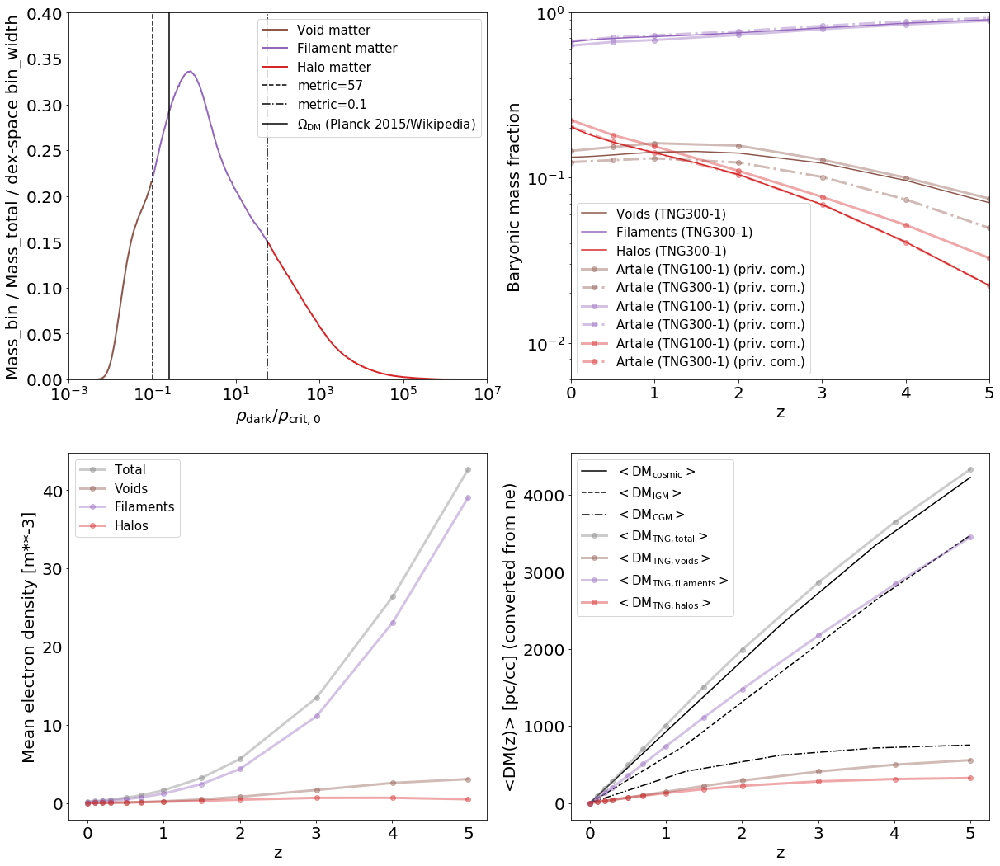

In [57]:
fig=plt.figure(figsize=(20,18))

#################
#plot breakdowns#
#################

ax1=fig.add_subplot(221)
ax1.set_ylabel('Mass_bin / Mass_total / dex-space bin_width',fontsize=20)
ax1.set_xlabel(r'$\rho_{\rm{dark}} / \rho_{\rm{crit,0}}$',fontsize=20)
ax1.set_xscale('log')
ax1.set_xscale('log')
ax1.set_xlim([1e-3,1e7])
ax1.set_ylim([0,0.4])
ax1.tick_params(axis='x', labelsize=20)
ax1.tick_params(axis='y', labelsize=20)

#get the indices of each LSS type so the curve can be coloured differently

z0_voi_inds = (np.where(10**z0_mybins<0.1))
z0_fil_inds = (np.where((10**z0_mybins>0.1) & (10**z0_mybins<57)))
z0_hal_inds = (np.where(10**z0_mybins>57))

#ax1.plot(10**mybins,my_mass_sum/np.sum(my_mass_sum)/(mybins[1]-mybins[0]),label='binned baryonic matter')
ax1.plot(10**z0_mybins[z0_voi_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_voi_inds],color='C5',linewidth=2,label='Void matter')
ax1.plot(10**z0_mybins[z0_fil_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_fil_inds],color='C4',linewidth=2,label='Filament matter')
ax1.plot(10**z0_mybins[z0_hal_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_hal_inds],color='C3',linewidth=2,label='Halo matter')



ax1.axvline(0.1,0,1,linestyle='--',color='k',label='metric=57')
ax1.axvline(57,0,1,linestyle='-.',color='k',label='metric=0.1')
ax1.axvline(0.2589,0,1,color='k',label=r'$\Omega_{\rm{DM}}$ (Planck 2015/Wikipedia)')

ax1.legend(fontsize=15)

#####################
#plot mass fractions#
#####################

ax2=fig.add_subplot(222)
ax2.set_xlabel('z',fontsize=20)
ax2.set_ylabel('Baryonic mass fraction',fontsize=20)
ax2.set_yscale('log')
ax2.set_ylim([6E-3,1])
ax2.set_xlim([0.,5.])
ax2.tick_params(axis='x', labelsize=20)
ax2.tick_params(axis='y', labelsize=20)

#my calculated mass fractions#

ax2.plot((allsnaps_redshifts.mean(axis=1))[0:13],voi_frac[0:13],color='C5',label='Voids ({0})'.format(data_id))
ax2.plot((allsnaps_redshifts.mean(axis=1))[0:13],fil_frac[0:13],color='C4',label='Filaments ({0})'.format(data_id))
ax2.plot((allsnaps_redshifts.mean(axis=1))[0:13],hal_frac[0:13],color='C3',label='Halos ({0})'.format(data_id))

#Celeste priv.comm. mass fractions#

ax2.plot(celeste_redshifts,V1001_mf,color='C5',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax2.plot(celeste_redshifts,V3001_mf,color='C5',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

ax2.plot(celeste_redshifts,F1001_mf,color='C4',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax2.plot(celeste_redshifts,F3001_mf,color='C4',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

ax2.plot(celeste_redshifts,H1001_mf,color='C3',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax2.plot(celeste_redshifts,H3001_mf,color='C3',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')



ax2.legend(fontsize=15)

#########################
#plot electron densities#
#########################

ax3 = fig.add_subplot(223)

ax3.set_xlabel('z',fontsize=20)
ax3.set_ylabel('Mean electron density [m**-3]',fontsize=20)
ax3.tick_params(axis='x', labelsize=20)
ax3.tick_params(axis='y', labelsize=20)

ax3.plot(per_snap_redshift_value,per_snap_edens.to('m**-3'),color='gray',lw=3,marker='o',alpha=0.4,label='Total')

ax3.plot(per_snap_redshift_value,per_snap_void_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C5',label='Voids')
ax3.plot(per_snap_redshift_value,per_snap_fila_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C4',label='Filaments')
ax3.plot(per_snap_redshift_value,per_snap_halo_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C3',label='Halos')

ax3.legend(fontsize=15)

#########################################
#plot DM converted from electron density#
#########################################

ax4 = fig.add_subplot(224)

ax4.set_xlabel('z',fontsize=20)
ax4.set_ylabel('<DM(z)> [pc/cc] (converted from ne)',fontsize=20)
ax4.tick_params(axis='x', labelsize=20)
ax4.tick_params(axis='y', labelsize=20)


#theoretical+empirical FRB github DM curves#

ax4.plot(z_theory,DM_cosm,color='k',ls='-',label=r'$<{\rm DM_{cosmic}}>$')
ax4.plot(z_theory,DM_cosmigm,color='k',ls='--',label=r'$<{\rm DM_{IGM}}>$')
ax4.plot(z_theory,DM_cosmhalo,color='k',ls='-.',label=r'$<{\rm DM_{CGM}}>$')

#DM averaged over whole simulation#

ax4.plot(x,np.array(DMHAL)+np.array(DMFIL)+np.array(DMVOI),color='gray',marker='o',lw=3,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$')

#DM averaged over whole simulation for structures#

ax4.plot(x,DMVOI,lw=3,marker='o',alpha=0.4,color='C5',label=r'$<{\rm DM_{TNG,voids}}>$')
ax4.plot(x,DMFIL,lw=3,marker='o',alpha=0.4,color='C4',label=r'$<{\rm DM_{TNG,filaments}}>$')
ax4.plot(x,DMHAL,lw=3,marker='o',alpha=0.4,color='C3',label=r'$<{\rm DM_{TNG,halos}}>$')



ax4.legend(fontsize=15)



plt.savefig('Paper_Plot_ne_evolution_{0}.png'.format(data_id))

# Plot which goes into paper

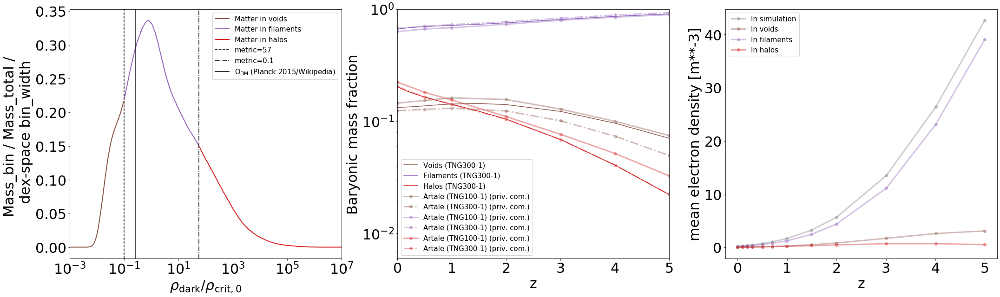

In [58]:
fig=plt.figure(figsize=(30,9))

#################
#plot breakdowns#
#################

ax1=fig.add_subplot(131)
ax1.set_ylabel('Mass_bin / Mass_total / \n dex-space bin_width',fontsize=30)
ax1.set_xlabel(r'$\rho_{\rm{dark}} / \rho_{\rm{crit,0}}$',fontsize=30)
ax1.set_xscale('log')
ax1.set_xscale('log')
ax1.set_xlim([1e-3,1e7])
#ax1.set_ylim([0,0.4])
ax1.tick_params(axis='x', labelsize=30)
ax1.tick_params(axis='y', labelsize=30)

#get the indices of each LSS type so the curve can be coloured differently

z0_voi_inds = (np.where(10**z0_mybins<0.1))
z0_fil_inds = (np.where((10**z0_mybins>0.1) & (10**z0_mybins<57)))
z0_hal_inds = (np.where(10**z0_mybins>57))

#ax1.plot(10**mybins,my_mass_sum/np.sum(my_mass_sum)/(mybins[1]-mybins[0]),label='binned baryonic matter')
ax1.plot(10**z0_mybins[z0_voi_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_voi_inds],color='C5',linewidth=2,label='Matter in voids')
ax1.plot(10**z0_mybins[z0_fil_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_fil_inds],color='C4',linewidth=2,label='Matter in filaments')
ax1.plot(10**z0_mybins[z0_hal_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_hal_inds],color='C3',linewidth=2,label='Matter in halos')



ax1.axvline(0.1,0,1,linestyle='--',color='k',label='metric=57')
ax1.axvline(57,0,1,linestyle='-.',color='k',label='metric=0.1')
ax1.axvline(0.2589,0,1,color='k',label=r'$\Omega_{\rm{DM}}$ (Planck 2015/Wikipedia)')

ax1.legend(fontsize=15)

#####################
#plot mass fractions#
#####################

ax2=fig.add_subplot(132)
ax2.set_xlabel('z',fontsize=30)
ax2.set_ylabel('Baryonic mass fraction',fontsize=30)
ax2.set_yscale('log')
ax2.set_ylim([6E-3,1])
ax2.set_xlim([0.,5.])
ax2.tick_params(axis='x', labelsize=30)
ax2.tick_params(axis='y', labelsize=30)

#my calculated mass fractions#

ax2.plot((allsnaps_redshifts.mean(axis=1))[0:13],voi_frac[0:13],color='C5',label='Voids ({0})'.format(data_id))
ax2.plot((allsnaps_redshifts.mean(axis=1))[0:13],fil_frac[0:13],color='C4',label='Filaments ({0})'.format(data_id))
ax2.plot((allsnaps_redshifts.mean(axis=1))[0:13],hal_frac[0:13],color='C3',label='Halos ({0})'.format(data_id))

#Celeste priv.comm. mass fractions#

ax2.plot(celeste_redshifts,V1001_mf,color='C5',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax2.plot(celeste_redshifts,V3001_mf,color='C5',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

ax2.plot(celeste_redshifts,F1001_mf,color='C4',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax2.plot(celeste_redshifts,F3001_mf,color='C4',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

ax2.plot(celeste_redshifts,H1001_mf,color='C3',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax2.plot(celeste_redshifts,H3001_mf,color='C3',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')



ax2.legend(fontsize=15)

#########################
#plot electron densities#
#########################

ax3 = fig.add_subplot(133)

ax3.set_xlabel('z',fontsize=30)
ax3.set_ylabel('mean electron density [m**-3]',fontsize=30)
ax3.tick_params(axis='x', labelsize=30)
ax3.tick_params(axis='y', labelsize=30)

ax3.plot(per_snap_redshift_value,per_snap_edens.to('m**-3'),color='gray',lw=3,marker='o',alpha=0.4,label='In simulation')

ax3.plot(per_snap_redshift_value,per_snap_void_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C5',label='In voids')
ax3.plot(per_snap_redshift_value,per_snap_fila_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C4',label='In filaments')
ax3.plot(per_snap_redshift_value,per_snap_halo_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C3',label='In halos')

ax3.legend(fontsize=15)

plt.tight_layout()
plt.savefig('Paper_Plot_ne_evolution_{0}.png'.format(data_id))

In [59]:
print(sfr0)
print(np.where(sfr0==0)[0].shape)
print(np.where(sfr0>0)[0].shape)
print(np.where(sfr0<0)[0].shape)

[0. 0. 0. ... 0. 0. 0.]
(25582524,)
(10009,)
(0,)


# Split up plot which goes into paper

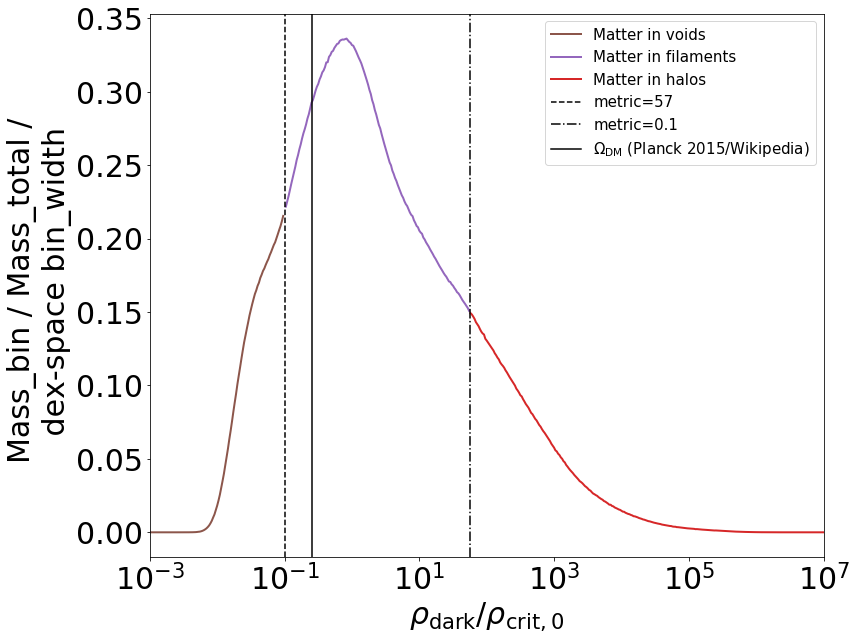

In [60]:
##################
#initialise plots#
##################

fig = plt.figure(figsize=(12,9))

#################
#plot breakdowns#
#################

ax1=fig.add_subplot(111)
ax1.set_ylabel('Mass_bin / Mass_total / \n dex-space bin_width',fontsize=30)
ax1.set_xlabel(r'$\rho_{\rm{dark}} / \rho_{\rm{crit,0}}$',fontsize=30)
ax1.set_xscale('log')
ax1.set_xscale('log')
ax1.set_xlim([1e-3,1e7])
#ax1.set_ylim([0,0.4])
ax1.tick_params(axis='x', labelsize=30)
ax1.tick_params(axis='y', labelsize=30)

#get the indices of each LSS type so the curve can be coloured differently

z0_voi_inds = (np.where(10**z0_mybins<0.1))
z0_fil_inds = (np.where((10**z0_mybins>0.1) & (10**z0_mybins<57)))
z0_hal_inds = (np.where(10**z0_mybins>57))

#ax1.plot(10**mybins,my_mass_sum/np.sum(my_mass_sum)/(mybins[1]-mybins[0]),label='binned baryonic matter')
ax1.plot(10**z0_mybins[z0_voi_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_voi_inds],color='C5',linewidth=2,label='Matter in voids')
ax1.plot(10**z0_mybins[z0_fil_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_fil_inds],color='C4',linewidth=2,label='Matter in filaments')
ax1.plot(10**z0_mybins[z0_hal_inds],np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_hal_inds],color='C3',linewidth=2,label='Matter in halos')



ax1.axvline(0.1,0,1,linestyle='--',color='k',label='metric=57')
ax1.axvline(57,0,1,linestyle='-.',color='k',label='metric=0.1')
ax1.axvline(0.2589,0,1,color='k',label=r'$\Omega_{\rm{DM}}$ (Planck 2015/Wikipedia)')

ax1.legend(fontsize=15)

plt.tight_layout()
plt.savefig('Paper_Plot_LSS_bounds_{0}.png'.format(data_id))

# New version of plot for paper

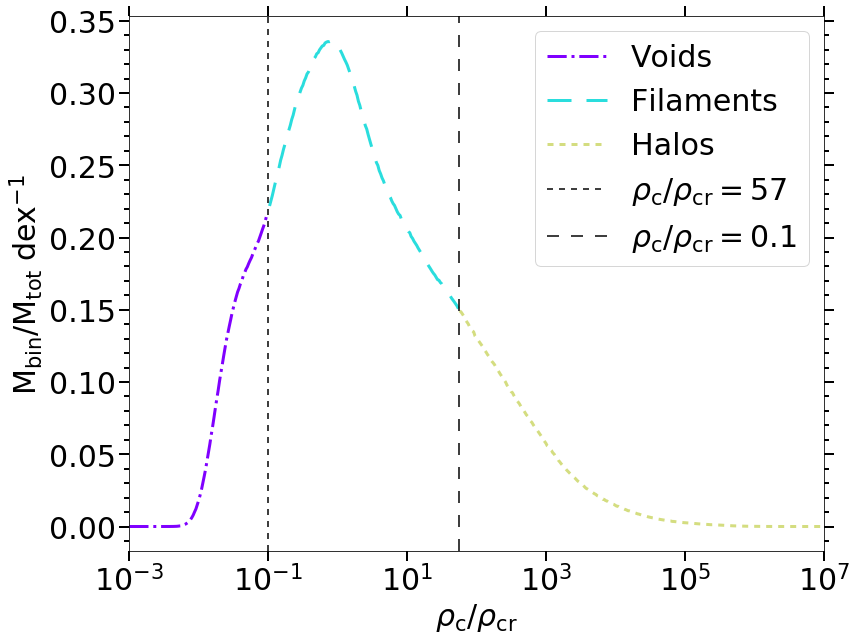

In [124]:
from matplotlib import ticker as mticker

##################
#initialise plots#
##################

fig = plt.figure(figsize=(12,9))
col = plt.cm.rainbow(np.linspace(0,1,4)) #create a list of colours from the colourmap which match those from plot in Paper_Plots_IF_vs_DM_3.ipynb


#################
#plot breakdowns#
#################

ax1=fig.add_subplot(111)
ax1.set_ylabel(r'${\rm M_{bin}/M_{tot}\;dex^{-1}}$',fontsize=30)
ax1.set_xlabel(r'$\rho_{\rm{c}} / \rho_{\rm{cr}}$',fontsize=30)
ax1.set_xscale('log')
ax1.set_xlim([1e-3,1e7])
#ax1.set_ylim([0,0.4])
ax1.yaxis.set_ticks_position('both')
ax1.xaxis.set_ticks_position('both')
ax1.tick_params(axis='x', width=2, length=10, which='major',labelsize=30)
ax1.tick_params(axis='y', width=2, length=10, which='major',labelsize=30)
ax1.tick_params(axis='x', width=2, length=5, which='minor',labelsize=30)
ax1.tick_params(axis='y', width=2, length=5, which='minor',labelsize=30)
ax1.xaxis.get_ticklocs(minor=True)
ax1.tick_params(axis='x', which='minor')
ax1.minorticks_on()

#get the indices of each LSS type so the curve can be coloured differently

z0_voi_inds = (np.where(10**z0_mybins<0.1))
z0_fil_inds = (np.where((10**z0_mybins>0.1) & (10**z0_mybins<57)))
z0_hal_inds = (np.where(10**z0_mybins>57))

#ax1.plot(10**mybins,my_mass_sum/np.sum(my_mass_sum)/(mybins[1]-mybins[0]),label='binned baryonic matter')
ax1.plot(10**z0_mybins[z0_voi_inds],
         np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_voi_inds],
         color=col[0],linewidth=3,ls='-.',label='Voids')
ax1.plot(10**z0_mybins[z0_fil_inds],
         np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_fil_inds],
         color=col[1],linewidth=3,ls='--',dashes=(8,5),label='Filaments')
ax1.plot(10**z0_mybins[z0_hal_inds],
         np.array(z0_my_mass_sum/np.sum(z0_my_mass_sum)/(z0_mybins[1]-z0_mybins[0]))[z0_hal_inds],
         color=col[2],linewidth=3,ls=':',dashes=(2,2),label='Halos')



ax1.axvline(0.1,0,1,linestyle='--',dashes=(4,4),color='k',label=r'$\rho_{\rm{c}} / \rho_{\rm{cr}}=57$')
ax1.axvline(57,0,1,linestyle='-.',dashes=(8,8),color='k',label=r'$\rho_{\rm{c}} / \rho_{\rm{cr}}=0.1$')
#ax1.axvline(0.2589,0,1,color='k',label=r'$\Omega_{\rm{DM}}$ (Planck 2015/Wikipedia)')

ax1.legend(fontsize=30)

plt.tight_layout()
plt.savefig('Paper_Plot_LSS_bounds_{0}_2.png'.format(data_id))

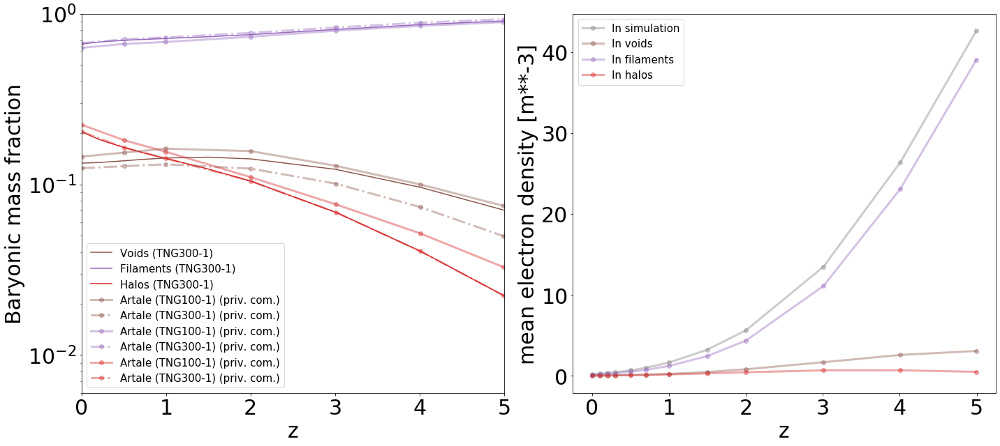

In [61]:
##################
#initialise plots#
##################

fig = plt.figure(figsize=(20,9))

#####################
#plot mass fractions#
#####################

ax1=fig.add_subplot(121)
ax1.set_xlabel('z',fontsize=30)
ax1.set_ylabel('Baryonic mass fraction',fontsize=30)
ax1.set_yscale('log')
ax1.set_ylim([6E-3,1])
ax1.set_xlim([0.,5.])
ax1.tick_params(axis='x', labelsize=30)
ax1.tick_params(axis='y', labelsize=30)

#my calculated mass fractions#

ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],voi_frac[0:13],color='C5',label='Voids ({0})'.format(data_id))
ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],fil_frac[0:13],color='C4',label='Filaments ({0})'.format(data_id))
ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],hal_frac[0:13],color='C3',label='Halos ({0})'.format(data_id))

#Celeste priv.comm. mass fractions#

ax1.plot(celeste_redshifts,V1001_mf,color='C5',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax1.plot(celeste_redshifts,V3001_mf,color='C5',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

ax1.plot(celeste_redshifts,F1001_mf,color='C4',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax1.plot(celeste_redshifts,F3001_mf,color='C4',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')

ax1.plot(celeste_redshifts,H1001_mf,color='C3',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax1.plot(celeste_redshifts,H3001_mf,color='C3',marker='o',ls='-.',alpha=0.4,lw='3',label='Artale (TNG300-1) (priv. com.)')



ax1.legend(fontsize=15)

#########################
#plot electron densities#
#########################

ax2 = fig.add_subplot(122)

ax2.set_xlabel('z',fontsize=30)
ax2.set_ylabel('mean electron density [m**-3]',fontsize=30)
ax2.tick_params(axis='x', labelsize=30)
ax2.tick_params(axis='y', labelsize=30)

ax2.plot(per_snap_redshift_value,per_snap_edens.to('m**-3'),color='gray',lw=3,marker='o',alpha=0.4,label='In simulation')

ax2.plot(per_snap_redshift_value,per_snap_void_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C5',label='In voids')
ax2.plot(per_snap_redshift_value,per_snap_fila_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C4',label='In filaments')
ax2.plot(per_snap_redshift_value,per_snap_halo_edens.to('m**-3'),marker='o',alpha=0.4,lw='3',color='C3',label='In halos')

ax2.legend(fontsize=15)

plt.tight_layout()
plt.savefig('Paper_Plot_mass_ne_evolution_{0}.png'.format(data_id))

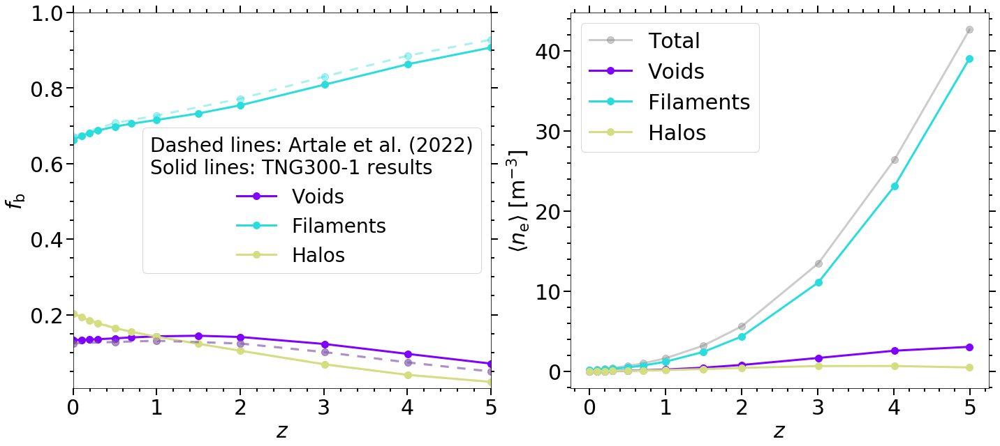

In [140]:
##################
#initialise plots#
##################

fig = plt.figure(figsize=(20,9))
col = plt.cm.rainbow(np.linspace(0,1,4)) #create a list of colours from the colourmap which match those from plot in Paper_Plots_IF_vs_DM_3.ipynb

#####################
#plot mass fractions#
#####################

ax1=fig.add_subplot(121)
ax1.set_xlabel(r'$z$',fontsize=30)
ax1.set_ylabel(r'$f_{\rm b}$',fontsize=30)
#ax1.set_yscale('log')
ax1.set_ylim([5E-3,1])
ax1.set_xlim([0.,5.])
ax1.yaxis.set_ticks_position('both')
ax1.xaxis.set_ticks_position('both')
ax1.tick_params(axis='x', width=2, length=10, which='major',labelsize=30)
ax1.tick_params(axis='y', width=2, length=10, which='major',labelsize=30)
ax1.tick_params(axis='x', width=2, length=5, which='minor',labelsize=30)
ax1.tick_params(axis='y', width=2, length=5, which='minor',labelsize=30)
ax1.xaxis.get_ticklocs(minor=True)
ax1.tick_params(axis='x', which='minor')
ax1.minorticks_on()

#my calculated mass fractions#

ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],
         voi_frac[0:13],
         color=col[0],lw=3,marker='o',markersize=10,label='Voids')
ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],
         fil_frac[0:13],
         color=col[1],lw=3,marker='o',markersize=10,label='Filaments')
ax1.plot((allsnaps_redshifts.mean(axis=1))[0:13],
         hal_frac[0:13],
         color=col[2],lw=3,marker='o',markersize=10,label='Halos')

#Celeste priv.comm. mass fractions#

#ax1.plot(celeste_redshifts,V1001_mf,color='C5',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax1.plot(celeste_redshifts,
         V3001_mf,
         color=col[0],marker='o',markersize=10,ls='-.',dashes=(4,4),alpha=0.4,lw='3')

ax1.plot(celeste_redshifts,
         V3001_mf,
         color='grey',marker='o',markersize=10,ls='-.',dashes=(4,4),alpha=0.4,lw='3')


#ax1.plot(celeste_redshifts,F1001_mf,color='C4',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax1.plot(celeste_redshifts,
         F3001_mf,
         color=col[1],marker='o',markersize=10,ls='-.',dashes=(4,4),alpha=0.4,lw='3')

#ax1.plot(celeste_redshifts,H1001_mf,color='C3',marker='o',lw='3',alpha=0.4,label='Artale (TNG100-1) (priv. com.)')
ax1.plot(celeste_redshifts,
         H3001_mf,
         color=col[2],marker='o',markersize=10,ls='-.',dashes=(4,4),alpha=0.4,lw='3')

#ax1.plot([], [], ' ', label="Dashed lines: Artale et al. (2022)\nSolid lines: TNG300-1 results")



ax1.legend(fontsize=28,title="Dashed lines: Artale et al. (2022)\nSolid lines: TNG300-1 results",title_fontsize=28)

#########################
#plot electron densities#
#########################

ax2 = fig.add_subplot(122)

ax2.set_xlabel(r'$z$',fontsize=30)
ax2.set_ylabel(r'$\left<n_{\rm e}\right>\;{\rm [m^{-3}]}$',fontsize=30)
ax2.yaxis.set_ticks_position('both')
ax2.xaxis.set_ticks_position('both')
ax2.tick_params(axis='x', width=2, length=10, which='major',labelsize=30)
ax2.tick_params(axis='y', width=2, length=10, which='major',labelsize=30)
ax2.tick_params(axis='x', width=2, length=5, which='minor',labelsize=30)
ax2.tick_params(axis='y', width=2, length=5, which='minor',labelsize=30)
ax2.xaxis.get_ticklocs(minor=True)
ax2.tick_params(axis='x', which='minor')
ax2.minorticks_on()

ax2.plot(per_snap_redshift_value,
         per_snap_edens.to('m**-3'),
         color='gray',lw=3,marker='o',markersize=10,alpha=0.4,label='Total')

ax2.plot(per_snap_redshift_value,
         per_snap_void_edens.to('m**-3'),
         marker='o',markersize=10,lw='3',color=col[0],label='Voids')
ax2.plot(per_snap_redshift_value,
         per_snap_fila_edens.to('m**-3'),
         marker='o',markersize=10,lw='3',color=col[1],label='Filaments')
ax2.plot(per_snap_redshift_value,
         per_snap_halo_edens.to('m**-3'),
         marker='o',markersize=10,lw='3',color=col[2],label='Halos')

ax2.legend(fontsize=30)

plt.tight_layout()
plt.savefig('Paper_Plot_mass_ne_evolution_{0}_2.png'.format(data_id))

# Comparing evolution of DMIGM for different modifications of ea

In [ ]:
fig=plt.figure(figsize=(12,9))

ax3=fig.add_subplot(111)
ax3.set_yscale('log')


ax3.plot(x,np.array(DMHAL)+np.array(DMFIL)+np.array(DMVOI),color='C1',marker='o',lw=1,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$ unmod')
ax3.plot(x,np.array(DMHAL_1)+np.array(DMFIL_1)+np.array(DMVOI_1),color='C2',marker='o',lw=1,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$ pakmor')
ax3.plot(x,np.array(DMHAL_2)+np.array(DMFIL_2)+np.array(DMVOI_2),color='C3',marker='o',lw=1,alpha=0.4,label=r'$<{\rm DM_{TNG,total}}>$ zhang')

plt.show()

In [ ]:
print(np.array(DMHAL)+np.array(DMFIL)+np.array(DMVOI))

In [ ]:
print(np.array(DMHAL_1)+np.array(DMFIL_1)+np.array(DMVOI_1))

In [ ]:
print(np.array(DMHAL_2)+np.array(DMFIL_2)+np.array(DMVOI_2))